In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow import keras
from PIL import Image 
import matplotlib.pyplot as plt
import cv2


In [2]:
with_mask_dir = r"C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\data\with_mask"
without_mask_dir = r"C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\data\without_mask"

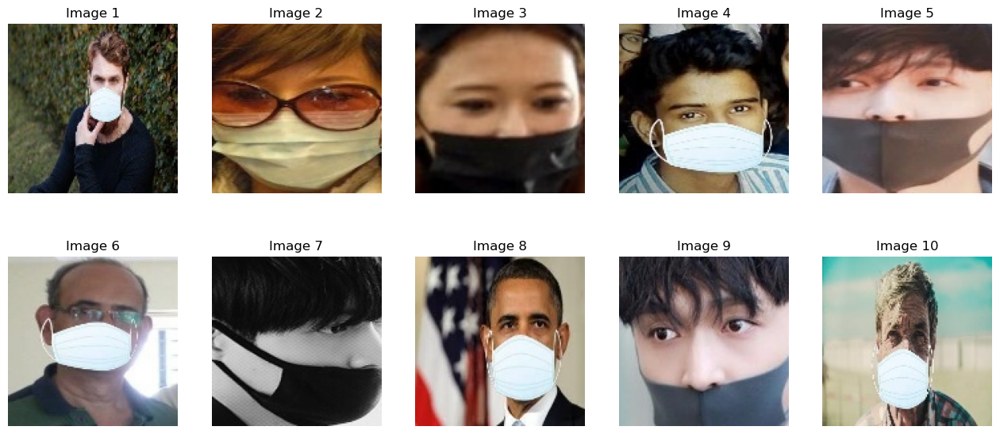

In [3]:
image_files = [f for f in os.listdir(with_mask_dir) if os.path.isfile(os.path.join(with_mask_dir, f))]

image_files.sort()

#displaying the first 10 images
fig, axes = plt.subplots(2, 5, figsize=(16, 7))
for i, ax in enumerate(axes.flatten()):
    if i < len(image_files):
        img_path = os.path.join(with_mask_dir, image_files[i])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        ax.imshow(img)
        ax.set_title(f"Image {i+1}")
        ax.axis('off')
plt.show()

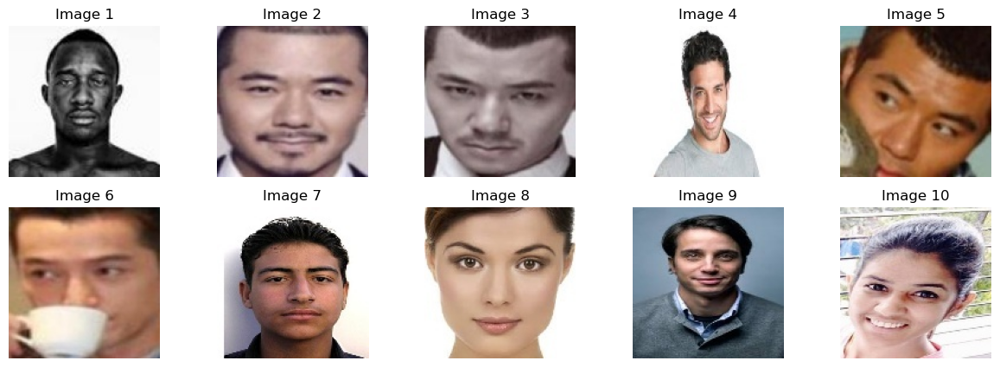

In [4]:
image_files = [f for f in os.listdir(without_mask_dir) if os.path.isfile(os.path.join(without_mask_dir, f))]

image_files.sort()

fig, axes = plt.subplots(2, 5, figsize=(15, 5))
for i, ax in enumerate(axes.flatten()):
    if i < len(image_files):
        img_path = os.path.join(without_mask_dir, image_files[i])
        img = cv2.imread(img_path) 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(f"Image {i+1}")
        ax.axis('off')
plt.show()

In [5]:
num_with_mask= len([filename for filename in os.listdir(with_mask_dir) if filename.endswith(('.jpg', '.jpeg'))])
num_without_mask= len([filename for filename in os.listdir(without_mask_dir) if filename.endswith(('.jpg', '.jpeg'))])

# Print the number of images in each dataset
print("Number of images in the'with_mask' dataset is:", num_with_mask)
print("Number of images in the 'without_mask' dataset is:", num_without_mask)

Number of images in the'with_mask' dataset is: 3725
Number of images in the 'without_mask' dataset is: 3828


In [6]:
total_images = num_with_mask + num_without_mask
print("Total number for all images is:", total_images)

Total number for all images is: 7553


# IMAGE PREPROCESSING

1. RESIZING

In [7]:
def resize_images(images, target_size=(256, 256)):
    for img_path in images:
        img = cv2.imread(img_path)
        
        if img is not None:
            resized_img = cv2.resize(img, target_size)
            cv2.imwrite(img_path, resized_img)
            
#Get paths of the directories
with_masks = [os.path.join(with_mask_dir, filename) for filename in os.listdir(with_mask_dir)]
without_masks = [os.path.join(without_mask_dir, filename) for filename in os.listdir(without_mask_dir)]

#Resizing images for the masks directory
resize_images(with_masks, target_size=(128, 128))

# Resizing for the without masks directpry
resize_images(without_masks, target_size=(128, 128))
print("Total images 'with mask' and 'without mask' have been resized, adding upto: ", total_images)

Total images 'with mask' and 'without mask' have been resized, adding upto:  7553


2. CONVERTING TO NUMPY ARRAYS

In [8]:
data = np.array([num_with_mask, num_without_mask])
print ("The number of images in Numpy Array for with and without masks is: ", data)

The number of images in Numpy Array for with and without masks is:  [3725 3828]


In [9]:
#number of classes
print(data.shape)

(2,)


3. SPLITTING DATASET

In [10]:
# this is to combine the dataset to allow processing of all the data 
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

X_combined = []
y_combined = []

In [11]:
def load_dataset(dataset_dir):
    X = []
    y = []
    # get the datasets directories
    for filename in os.listdir(dataset_dir):
        if filename.endswith('.jpg'):
            img = load_img(os.path.join(dataset_dir, filename), target_size=(128, 128))
            X.append(img_to_array(img))
            y.append(filename.split("_")[0])  
    return X, y

In [12]:
for dataset_dir in [with_mask_dir, without_mask_dir]:
    X, y = load_dataset(dataset_dir)
    X_combined.extend(X)
    y_combined.extend(y)

In [13]:
X_combined = np.array(X_combined)
y_combined = np.array(y_combined)

In [14]:
# Splitting the combined dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_combined, y_combined, test_size=0.2, random_state=42)

In [15]:
print("X_train:", X_train.shape)
print("X_train data type:", X_train.dtype)
print("X_test:", X_test.shape)
print("X_test data type:", X_test.dtype)
print("y_train:", y_train.shape)
print("y_train data type:", y_train.dtype)
print("y_test:", y_test.shape)
print("y_test data type:", y_test.dtype)

X_train: (6042, 128, 128, 3)
X_train data type: float32
X_test: (1511, 128, 128, 3)
X_test data type: float32
y_train: (6042,)
y_train data type: <U7
y_test: (1511,)
y_test data type: <U7


In [16]:
print("Unique values in y_train:", np.unique(y_train))
print("Unique values in y_test:", np.unique(y_test))

Unique values in y_train: ['with' 'without']
Unique values in y_test: ['with' 'without']


4. ENCODING

In [123]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit LabelEncoder on combined target data (y_combined)
label_encoder.fit(y_combined)

# Transform labels in y_train and y_test
y_train_encoded = label_encoder.transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Ensure labels are encoded as 0 and 1
assert set(y_train_encoded) == {0, 1}
assert set(y_test_encoded) == {0, 1}

# Convert labels to float32 if necessary
y_train_float32 = y_train_encoded.astype('float32')
y_test_float32 = y_test_encoded.astype('float32')

# Print label encoding mapping
label_mapping = {label: encoded_label for label, encoded_label in zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))}
print("Label Encoding Mapping:")
for label, encoded_label in label_mapping.items():
    print(f"{label} --- {encoded_label}")


Label Encoding Mapping:
with --- 0
without --- 1


5. SCALING

In [18]:
# Scale pixel values by dividing by 255
X_train_scaled = X_train / 255.0
X_test_scaled = X_test / 255.0

In [19]:
# Print the shapes of the scaled datasets
print("Scaled Training Data Shape:", X_train_scaled.shape)
print("Scaled Testing Data Shape:", X_test_scaled.shape)

Scaled Training Data Shape: (6042, 128, 128, 3)
Scaled Testing Data Shape: (1511, 128, 128, 3)


# MODEL CREATION

1. RESNET50

In [20]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow.compat.v1 as tf
from keras.models import Sequential

In [2]:
#input size of the images and the colour
input_shape = (128, 128, 3)

In [22]:
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

In [23]:
#Freezing the first 143 layers for fine tuning 
for layer in resnet_base.layers[:143]:
    layer.trainable = False

In [24]:
#Print the layers trainable(TRUE) and those not trainable(FALSE)
for layer in resnet_base.layers:
    print(layer.name, layer.trainable)

input_1 False
conv1_pad False
conv1_conv False
conv1_bn False
conv1_relu False
pool1_pad False
pool1_pool False
conv2_block1_1_conv False
conv2_block1_1_bn False
conv2_block1_1_relu False
conv2_block1_2_conv False
conv2_block1_2_bn False
conv2_block1_2_relu False
conv2_block1_0_conv False
conv2_block1_3_conv False
conv2_block1_0_bn False
conv2_block1_3_bn False
conv2_block1_add False
conv2_block1_out False
conv2_block2_1_conv False
conv2_block2_1_bn False
conv2_block2_1_relu False
conv2_block2_2_conv False
conv2_block2_2_bn False
conv2_block2_2_relu False
conv2_block2_3_conv False
conv2_block2_3_bn False
conv2_block2_add False
conv2_block2_out False
conv2_block3_1_conv False
conv2_block3_1_bn False
conv2_block3_1_relu False
conv2_block3_2_conv False
conv2_block3_2_bn False
conv2_block3_2_relu False
conv2_block3_3_conv False
conv2_block3_3_bn False
conv2_block3_add False
conv2_block3_out False
conv3_block1_1_conv False
conv3_block1_1_bn False
conv3_block1_1_relu False
conv3_block1_2_con

In [25]:
x = Flatten()(resnet_base.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)

output = Dense(1, activation='sigmoid')(x)

In [26]:
model = Model(inputs=resnet_base.input, outputs=output)

In [27]:
from tensorflow.keras.losses import binary_crossentropy
model.compile(optimizer=Adam(), loss=binary_crossentropy, metrics=['accuracy'])

In [28]:
from keras.callbacks import ModelCheckpoint
#this is to make sure that the weigths are saved in a folder
filepath = r"C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel"
check_point = keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    monitor="val_loss",
    mode="min",
    save_best_only=True,
    verbose=1
)

MODEL TRAINING , EARLY STOPPING AN LEARNING RATE 

In [29]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',          # Monitor validation loss
    patience=5,                  # Number of epochs to wait before stopping
    restore_best_weights=True,   # Restore weights to the best achieved during training
    verbose=1                    # Print messages about early stopping
)

In [30]:
from keras.callbacks import LearningRateScheduler

# Define a learning rate schedule function
def learningRate_schedule(epoch):
    lr = 0.001  # Initial learning rate
    if epoch > 10:
        lr *= 0.1  
    return lr

# Create a LearningRateScheduler callback
lr_scheduler = LearningRateScheduler(learningRate_schedule)



In [31]:
history = model.fit(
    X_train, y_train_encoded,
    batch_size=32,
    epochs=25,
    verbose=1,
    validation_data=(X_test, y_test_encoded),  
    callbacks=[check_point, early_stopping, lr_scheduler]
)

Epoch 1/25


189/189 [==============================] - ETA: 0s - loss: 0.2393 - accuracy: 0.9603
Epoch 1: val_loss improved from inf to 0.69434, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel\assets


189/189 [==============================] - 194s 979ms/step - loss: 0.2393 - accuracy: 0.9603 - val_loss: 0.6943 - val_accuracy: 0.9848 - lr: 0.0010
Epoch 2/25
189/189 [==============================] - ETA: 0s - loss: 0.0252 - accuracy: 0.9935
Epoch 2: val_loss improved from 0.69434 to 0.07842, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel\assets


189/189 [==============================] - 179s 948ms/step - loss: 0.0252 - accuracy: 0.9935 - val_loss: 0.0784 - val_accuracy: 0.9874 - lr: 0.0010
Epoch 3/25
189/189 [==============================] - ETA: 0s - loss: 0.0150 - accuracy: 0.9975
Epoch 3: val_loss did not improve from 0.07842
189/189 [==============================] - 173s 915ms/step - loss: 0.0150 - accuracy: 0.9975 - val_loss: 0.1462 - val_accuracy: 0.9881 - lr: 0.0010
Epoch 4/25
189/189 [==============================] - ETA: 0s - loss: 0.0050 - accuracy: 0.9988
Epoch 4: val_loss did not improve from 0.07842
189/189 [==============================] - 169s 893ms/step - loss: 0.0050 - accuracy: 0.9988 - val_loss: 0.1132 - val_accuracy: 0.9854 - lr: 0.0010
Epoch 5/25
189/189 [==============================] - ETA: 0s - loss: 0.0825 - accuracy: 0.9934
Epoch 5: val_loss did not improve from 0.07842
189/189 [==============================] - 164s 870ms/step - loss: 0.0825 - accuracy: 0.9934 - val_loss: 1.8946 - val_accuracy:

INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel\assets


189/189 [==============================] - 192s 1s/step - loss: 0.0141 - accuracy: 0.9964 - val_loss: 0.0616 - val_accuracy: 0.9914 - lr: 0.0010
Epoch 8/25
189/189 [==============================] - ETA: 0s - loss: 0.0261 - accuracy: 0.9978
Epoch 8: val_loss did not improve from 0.06155
189/189 [==============================] - 165s 873ms/step - loss: 0.0261 - accuracy: 0.9978 - val_loss: 0.0646 - val_accuracy: 0.9901 - lr: 0.0010
Epoch 9/25
189/189 [==============================] - ETA: 0s - loss: 0.0040 - accuracy: 0.9987
Epoch 9: val_loss did not improve from 0.06155
189/189 [==============================] - 166s 881ms/step - loss: 0.0040 - accuracy: 0.9987 - val_loss: 0.0832 - val_accuracy: 0.9887 - lr: 0.0010
Epoch 10/25
189/189 [==============================] - ETA: 0s - loss: 0.0073 - accuracy: 0.9982
Epoch 10: val_loss improved from 0.06155 to 0.04338, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel
INFO:tensorflow:Assets written to: C:\

INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\BestModel\assets


189/189 [==============================] - 195s 1s/step - loss: 0.0073 - accuracy: 0.9982 - val_loss: 0.0434 - val_accuracy: 0.9940 - lr: 0.0010
Epoch 11/25
189/189 [==============================] - ETA: 0s - loss: 0.0090 - accuracy: 0.9987
Epoch 11: val_loss did not improve from 0.04338
189/189 [==============================] - 185s 981ms/step - loss: 0.0090 - accuracy: 0.9987 - val_loss: 0.0531 - val_accuracy: 0.9901 - lr: 0.0010
Epoch 12/25
189/189 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 0.9987
Epoch 12: val_loss did not improve from 0.04338
189/189 [==============================] - 185s 981ms/step - loss: 0.0039 - accuracy: 0.9987 - val_loss: 0.0544 - val_accuracy: 0.9914 - lr: 1.0000e-04
Epoch 13/25
189/189 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 0.9995
Epoch 13: val_loss did not improve from 0.04338
189/189 [==============================] - 180s 952ms/step - loss: 0.0018 - accuracy: 0.9995 - val_loss: 0.0537 - val_ac

In [32]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 134, 134, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 64, 64, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                          

# MODEL EVALUATION

In [33]:
model.evaluate(X_test, y_test_encoded)

48/48 [==============================] - 27s 557ms/step - loss: 0.0434 - accuracy: 0.9940


[0.04337843507528305, 0.9940437078475952]

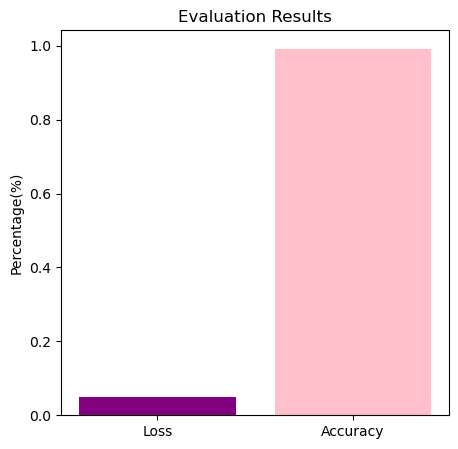

In [34]:
# Results from model.evaluate()
loss = 0.05032438039779663
accuracy = 0.9920582175254822

# Plotting
plt.figure(figsize=(5, 5))

# Grouped bar plot for loss and accuracy
categories = ['Loss', 'Accuracy']
values = [loss, accuracy]

plt.bar(categories, values, color=['purple', 'pink'])
plt.ylabel('Percentage(%)')
plt.title('Evaluation Results')
plt.show()


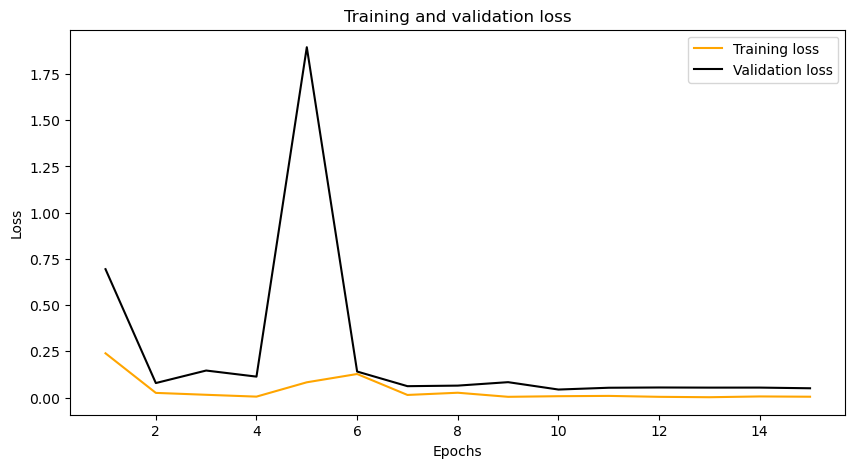

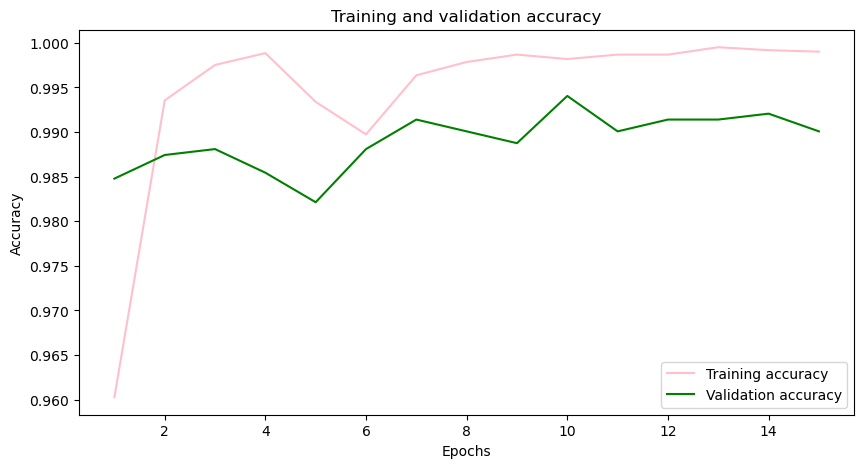

In [35]:
import matplotlib.pyplot as plt

# Extracting training and validation loss and accuracy from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Creating epochs range
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'orange', label='Training loss')
plt.plot(epochs, val_loss, 'black', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_accuracy, 'pink', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [36]:
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, auc, confusion_matrix

In [37]:
y_pred_encoded= model.predict(X_test)

48/48 [==============================] - 27s 533ms/step


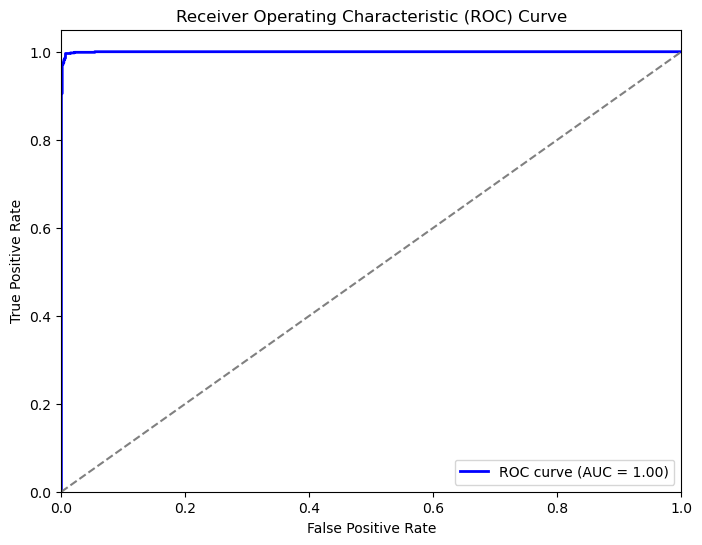

In [38]:
label_encoder = LabelEncoder()
y_test_binary = label_encoder.fit_transform(y_test)

# Compute ROC curve and ROC AUC score
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred_encoded)
roc_auc = roc_auc_score(y_test_binary, y_pred_encoded)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

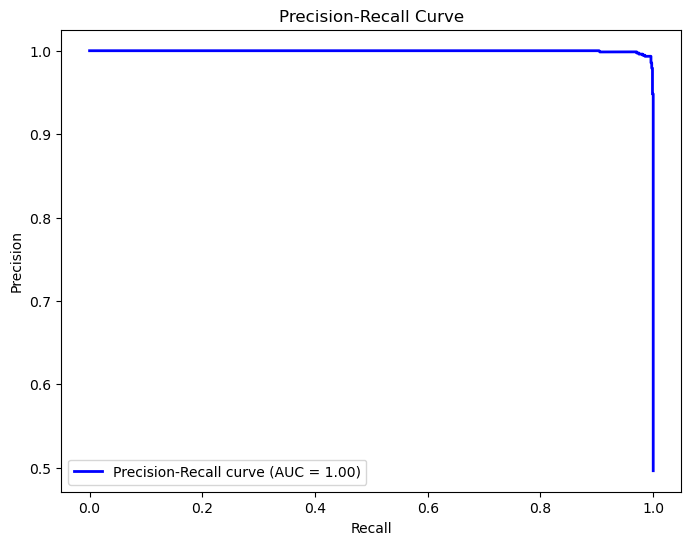

In [39]:
precision, recall, _ = precision_recall_curve(y_test_binary, y_pred_encoded)
pr_auc = auc(recall, precision)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

In [48]:
from sklearn.metrics import confusion_matrix

# Threshold the predictions to get binary labels (0 or 1)
threshold = 0.5  # Adjust the threshold as needed
y_pred_binary = (y_pred_encoded > threshold).astype(int)

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_pred_binary)

# Print the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)


Confusion Matrix:
[[756   5]
 [  4 746]]


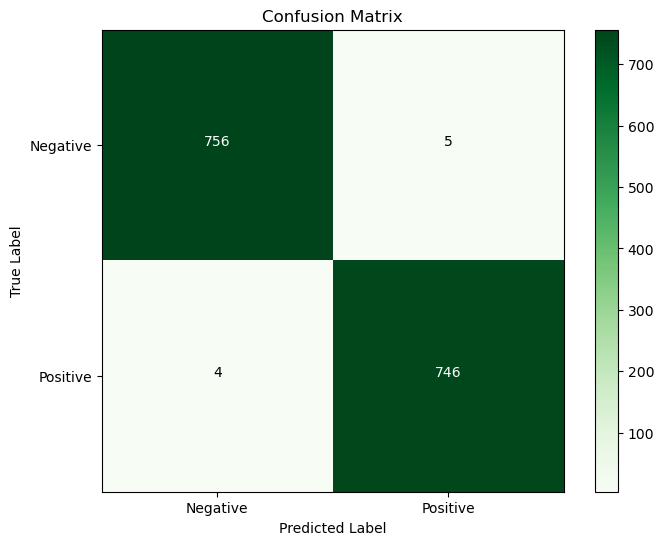

In [40]:
cm = confusion_matrix(y_test_binary, y_pred_encoded.round())

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])
for i in range(2):
    for j in range(2):
        plt.text(j, i, str(cm[i, j]), horizontalalignment='center', color='white' if cm[i, j] > cm.max() / 2 else 'black')
plt.show()

In [45]:
from sklearn.metrics import average_precision_score

# Assuming y_pred_encoded and y_test_encoded are arrays containing predictions and ground truth labels
# Compute average precision for the positive class (class 1)
y_pred_positive_class = y_pred_encoded
y_test_positive_class = y_test_encoded
ap_positive_class = average_precision_score(y_test_positive_class, y_pred_positive_class)

# Compute average precision for the negative class (class 0)
y_pred_negative_class = 1 - y_pred_encoded  # Assuming class 0 is the negative class
y_test_negative_class = 1 - y_test_encoded  # Inverting binary labels
ap_negative_class = average_precision_score(y_test_negative_class, y_pred_negative_class)

# Print AP for both classes
print("Average Precision (Positive Class):", ap_positive_class)
print("Average Precision (Negative Class):", ap_negative_class)


Average Precision (Positive Class): 0.9996581915162799
Average Precision (Negative Class): 0.9996811623988419


In [46]:
from sklearn.metrics import precision_score, recall_score, f1_score, average_precision_score
import numpy as np

# Assuming you have computed y_pred_encoded (predicted labels) and y_test_encoded (true labels)

# Threshold the predictions to get binary labels (0 or 1)
threshold = 0.5  # Adjust the threshold as needed
y_pred_binary = (y_pred_encoded > threshold).astype(int)

# Compute precision, recall, and F1-score
precision = precision_score(y_test_encoded, y_pred_binary)
recall = recall_score(y_test_encoded, y_pred_binary)
f1 = f1_score(y_test_encoded, y_pred_binary)

# Compute average precision (AP)
average_precision = average_precision_score(y_test_encoded, y_pred_encoded)

# Print the computed metrics
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Average Precision (AP):", average_precision)


Precision: 0.9933422103861518
Recall: 0.9946666666666667
F1-score: 0.9940039973351099
Average Precision (AP): 0.9996581915162799


In [51]:
from sklearn.metrics import precision_recall_curve, auc

# Assuming y_pred_encoded and y_test_encoded are arrays containing predictions and ground truth labels
# Compute precision and recall for different thresholds
precision, recall, thresholds = precision_recall_curve(y_test_encoded, y_pred_encoded)

# Compute the Area Under the Precision-Recall Curve (AUPRC)
auprc = auc(recall, precision)

# Print the AUPRC
print("Area Under Precision-Recall Curve (AUPRC):", auprc)

# Compute the Mean Average Precision (mAP)
mAP = auprc

# Print the mAP
print("Mean Average Precision (mAP):", mAP)


Area Under Precision-Recall Curve (AUPRC): 0.9996588770159865
Mean Average Precision (mAP): 0.9996588770159865


Processing image 1/1511


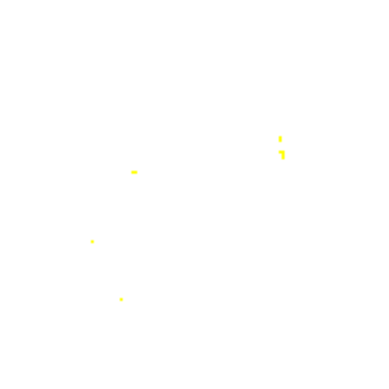

Processing image 2/1511


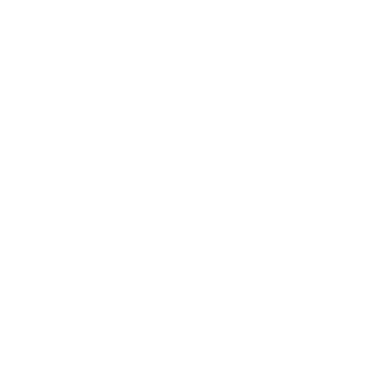

Processing image 3/1511


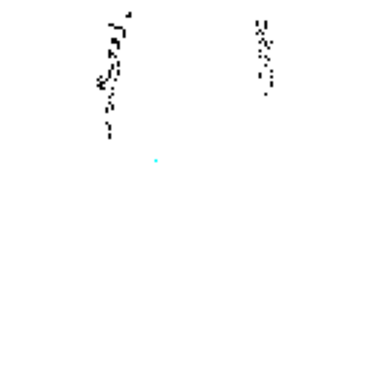

Processing image 4/1511


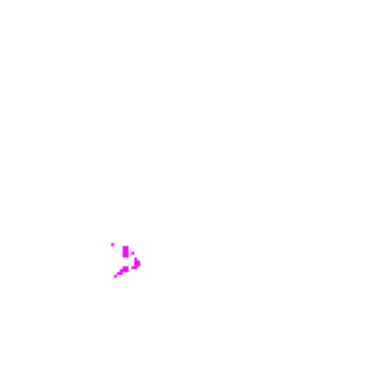

Processing image 5/1511


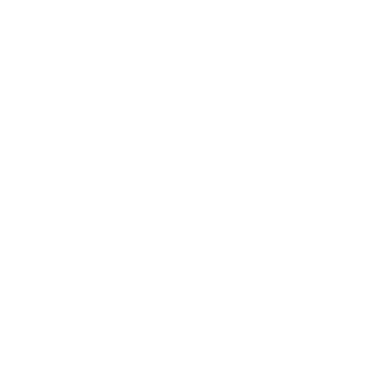

Processing image 6/1511


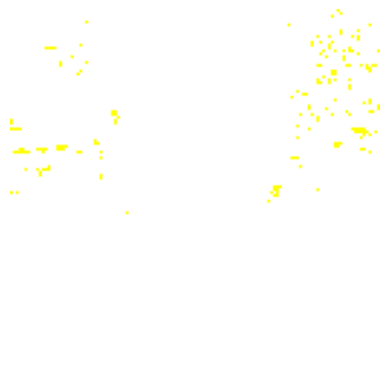

Processing image 7/1511


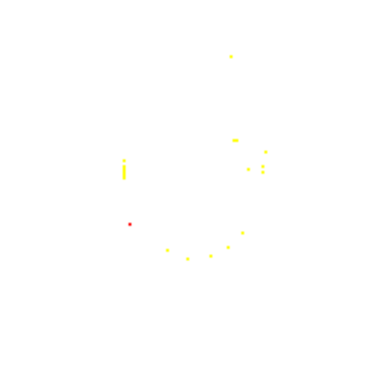

Processing image 8/1511


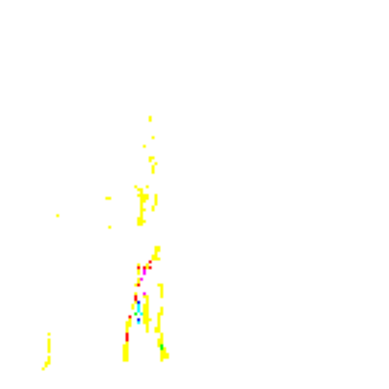

Processing image 9/1511


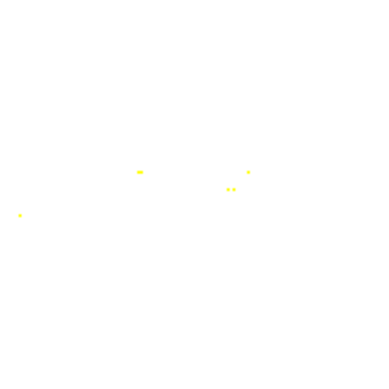

Processing image 10/1511


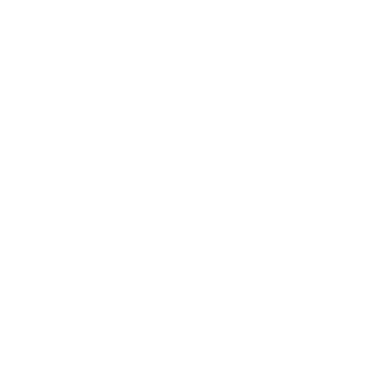

Processing image 11/1511


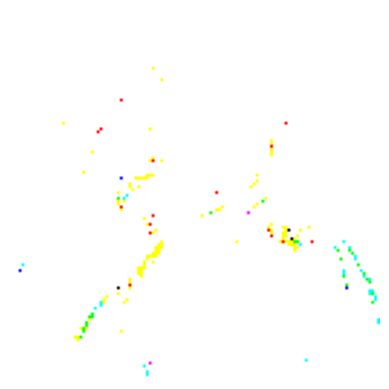

Processing image 12/1511


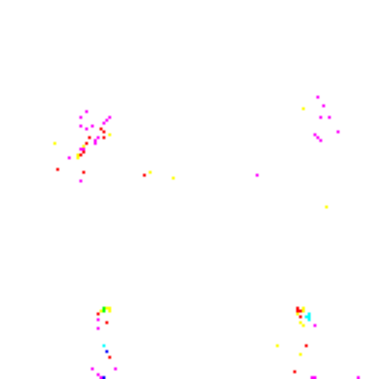

Processing image 13/1511


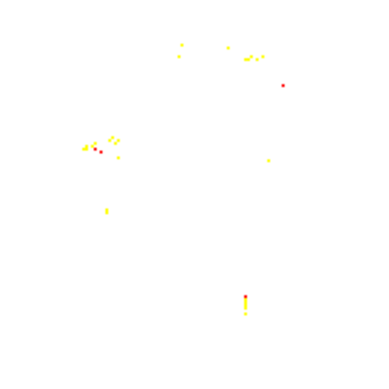

Processing image 14/1511


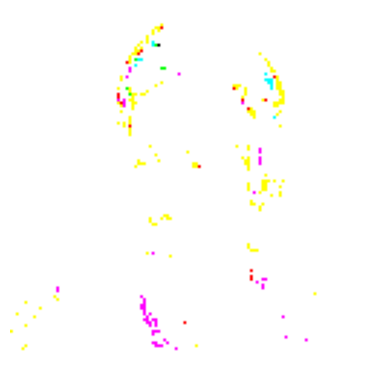

Processing image 15/1511


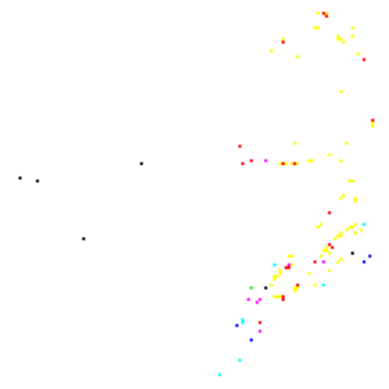

Processing image 16/1511


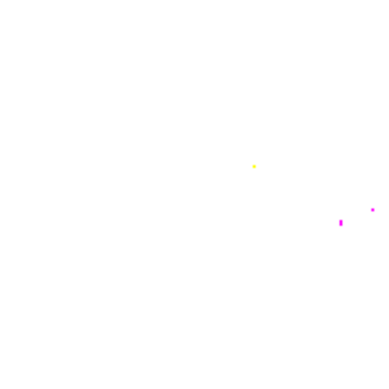

Processing image 17/1511


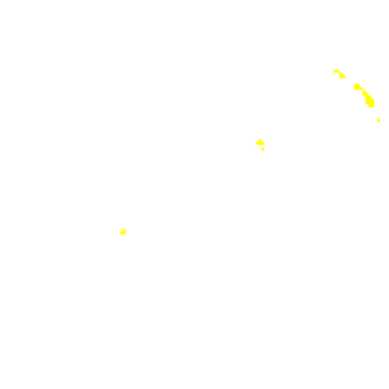

Processing image 18/1511


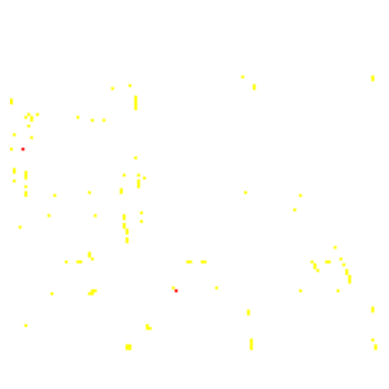

Processing image 19/1511


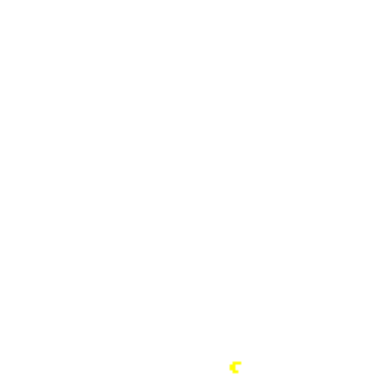

Processing image 20/1511


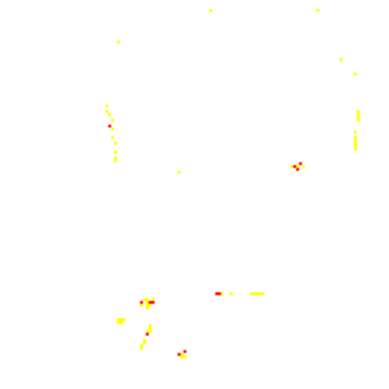

Processing image 21/1511


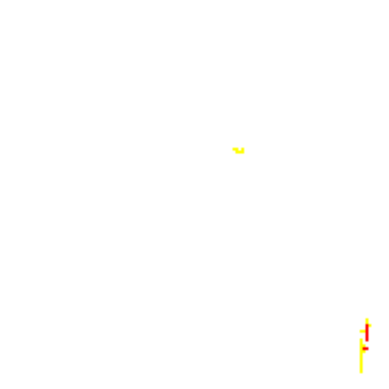

Processing image 22/1511


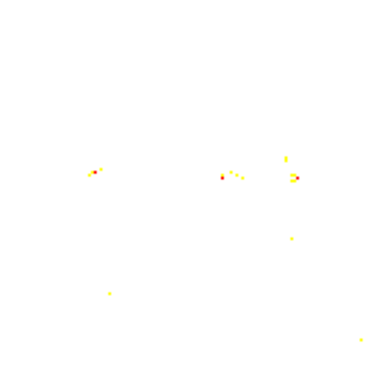

Processing image 23/1511


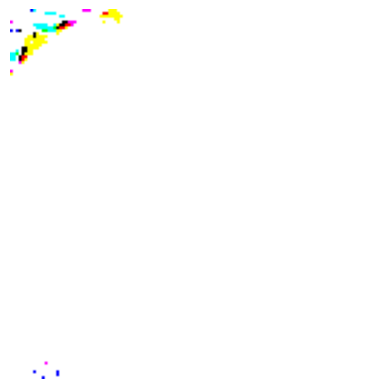

Processing image 24/1511


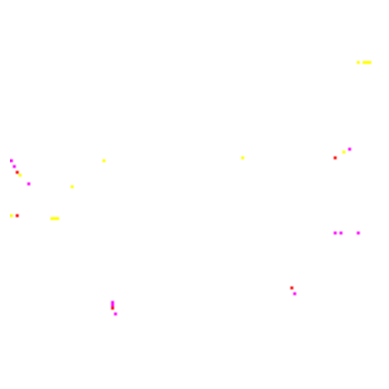

Processing image 25/1511


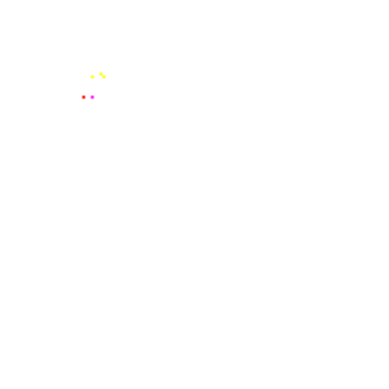

Processing image 26/1511


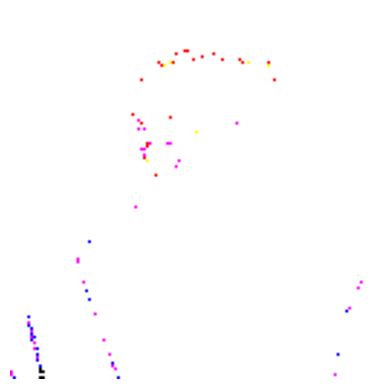

Processing image 27/1511


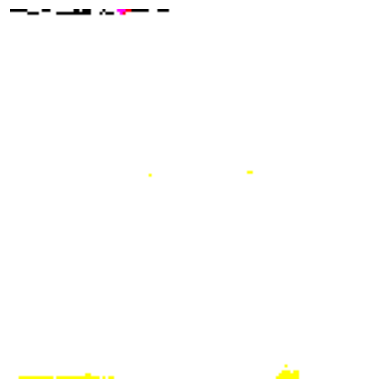

Processing image 28/1511


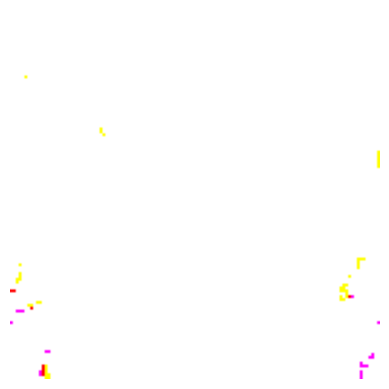

Processing image 29/1511


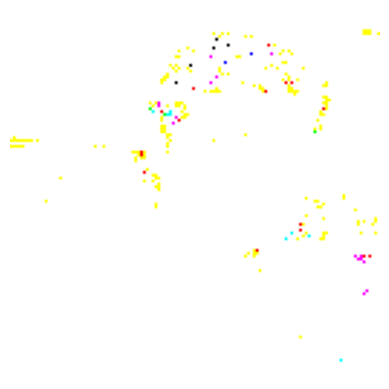

Processing image 30/1511


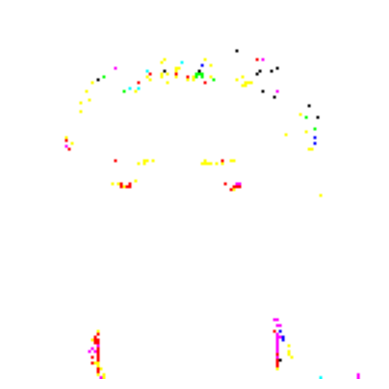

Processing image 31/1511


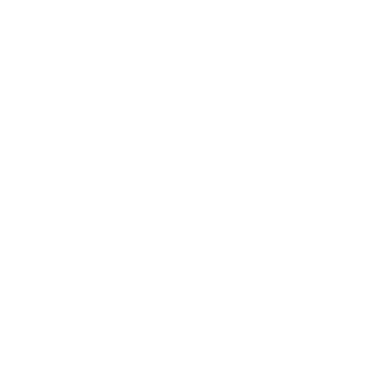

Processing image 32/1511


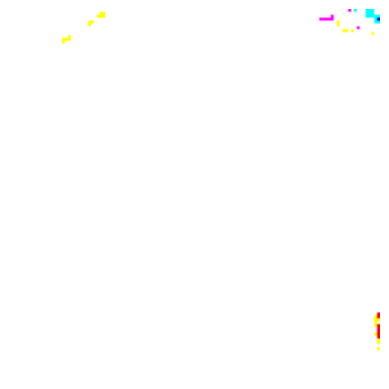

Processing image 33/1511


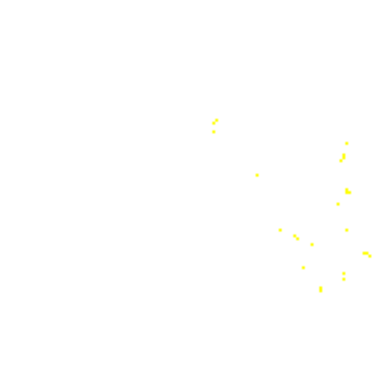

Processing image 34/1511


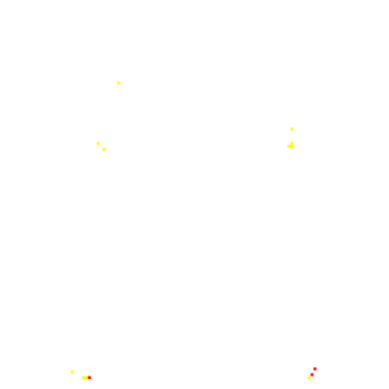

Processing image 35/1511


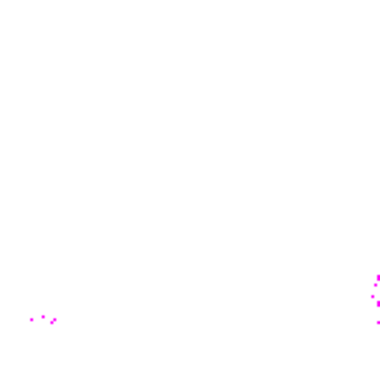

Processing image 36/1511


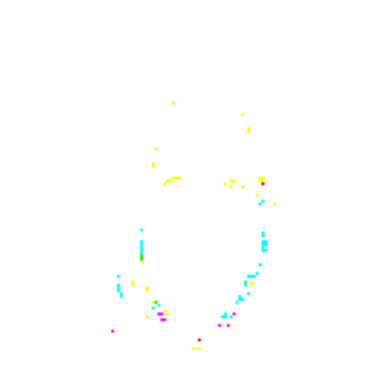

Processing image 37/1511


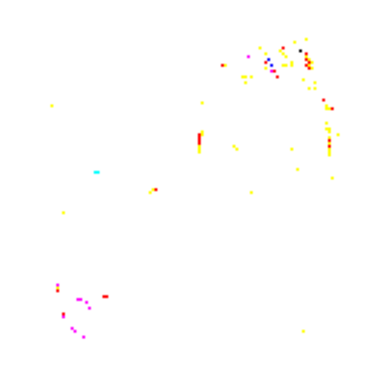

Processing image 38/1511


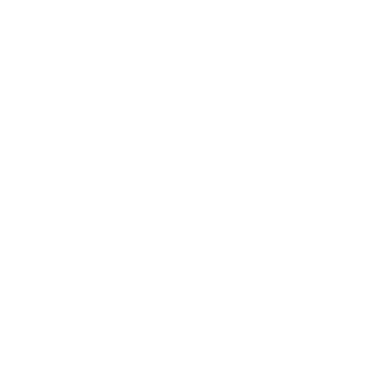

Processing image 39/1511


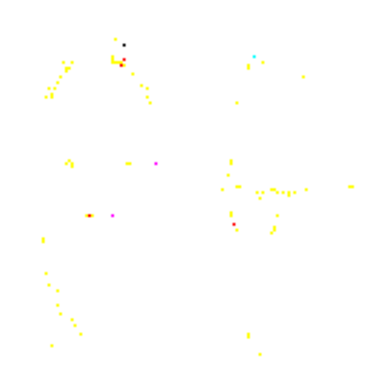

Processing image 40/1511


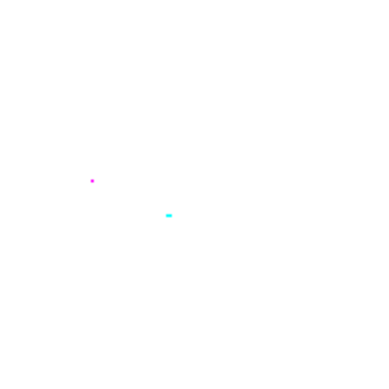

Processing image 41/1511


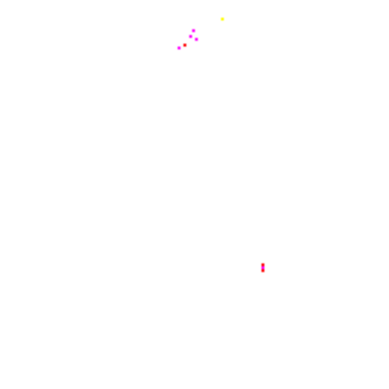

Processing image 42/1511


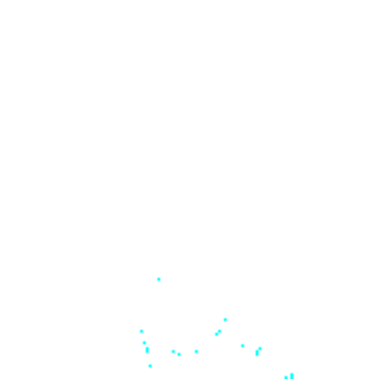

Processing image 43/1511


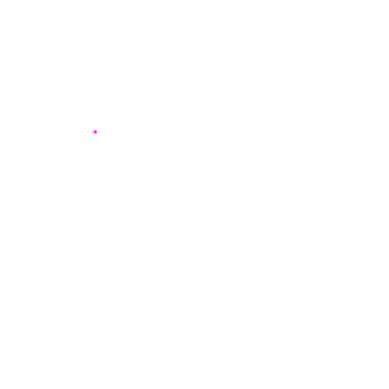

Processing image 44/1511


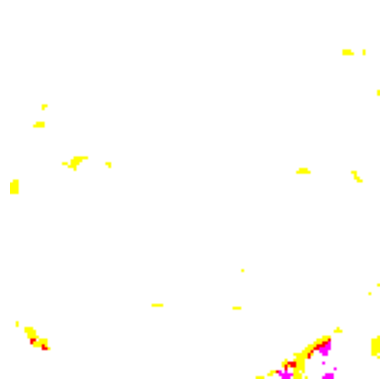

Processing image 45/1511


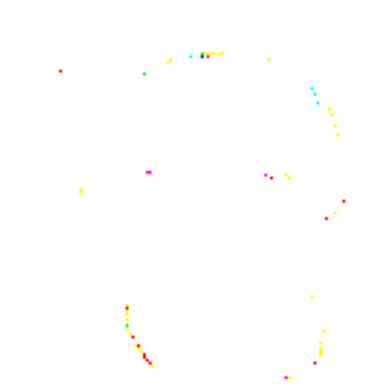

Processing image 46/1511


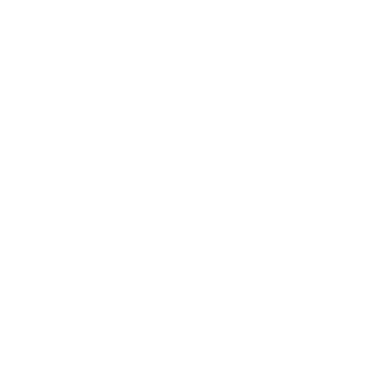

Processing image 47/1511


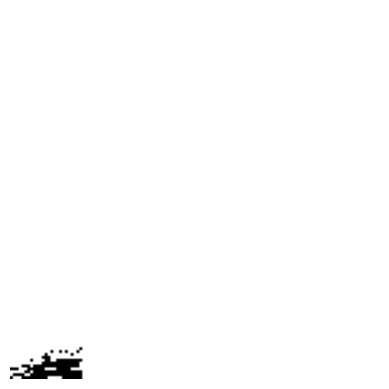

Processing image 48/1511


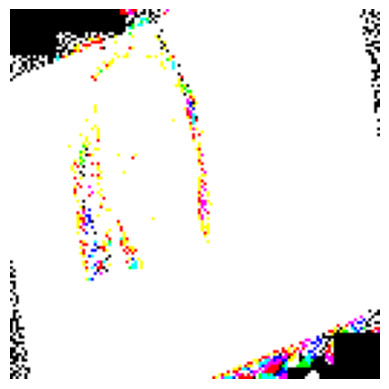

Processing image 49/1511


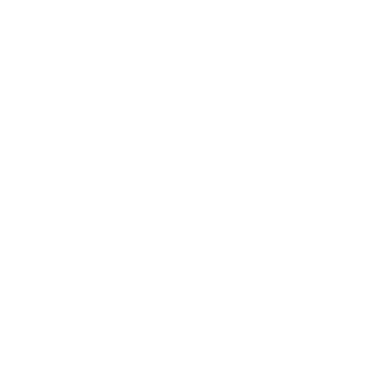

Processing image 50/1511


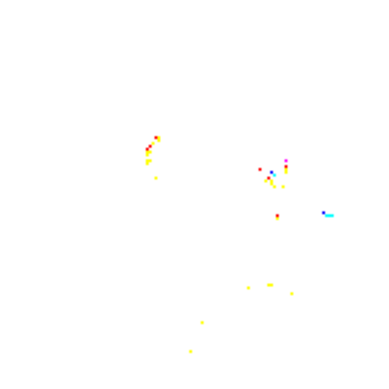

Processing image 51/1511


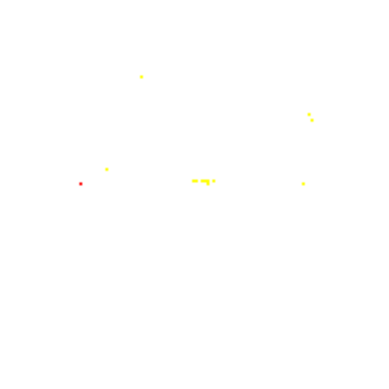

Processing image 52/1511


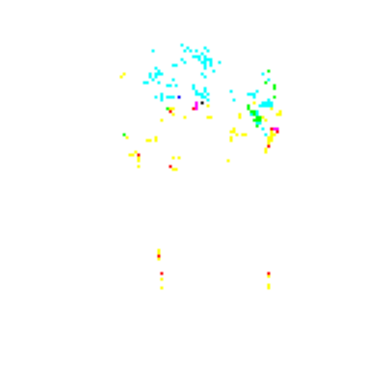

Processing image 53/1511


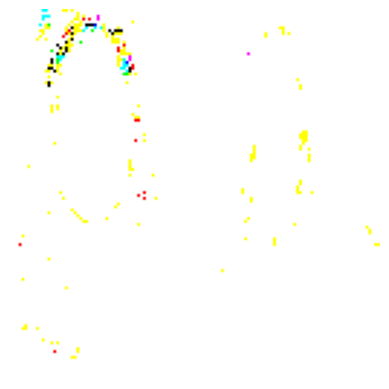

Processing image 54/1511


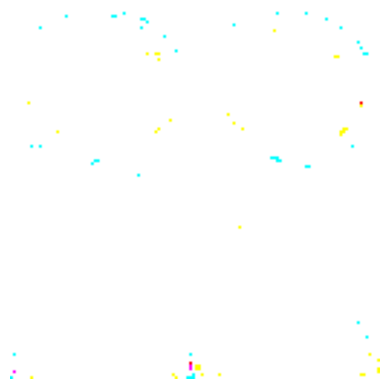

Processing image 55/1511


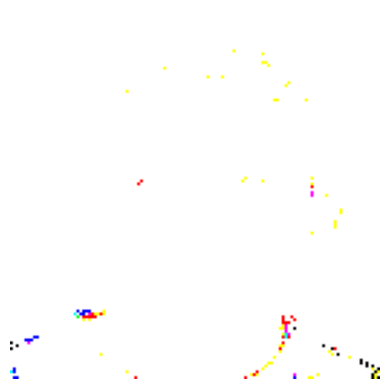

Processing image 56/1511


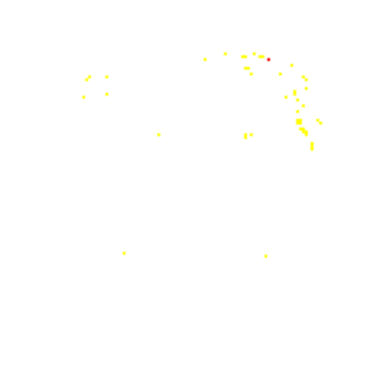

Processing image 57/1511


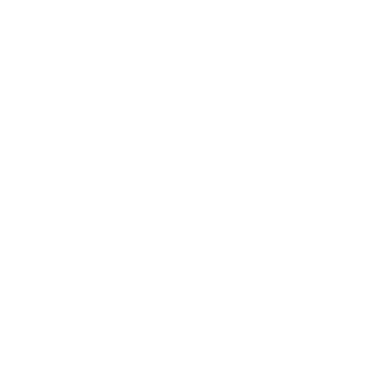

Processing image 58/1511


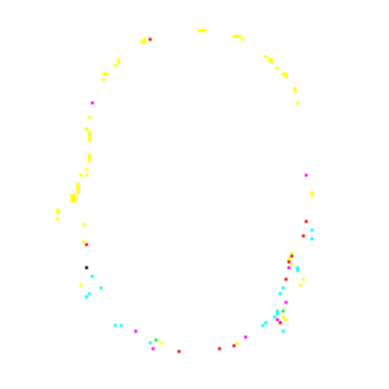

Processing image 59/1511


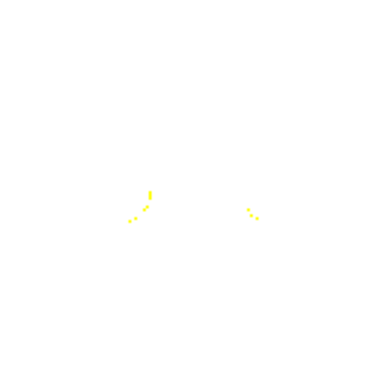

Processing image 60/1511


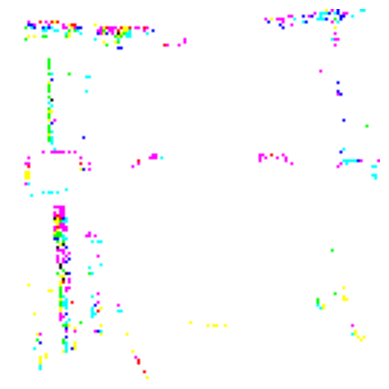

Processing image 61/1511


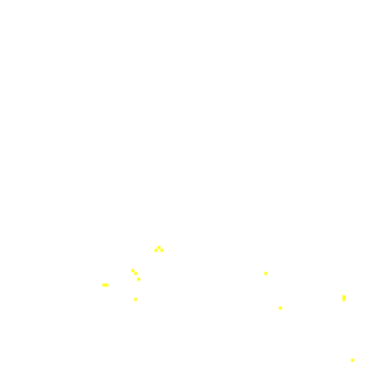

Processing image 62/1511


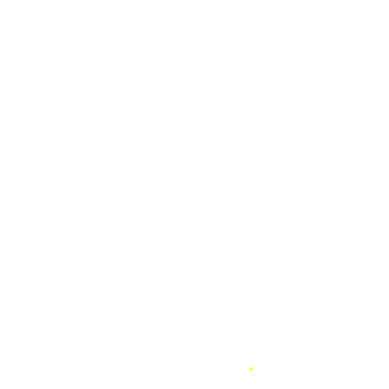

Processing image 63/1511


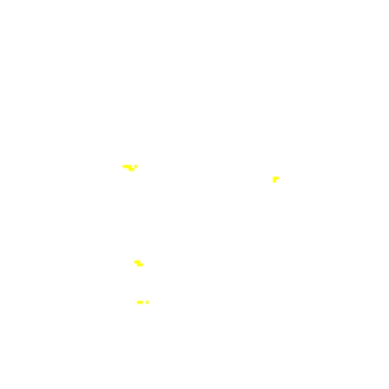

Processing image 64/1511


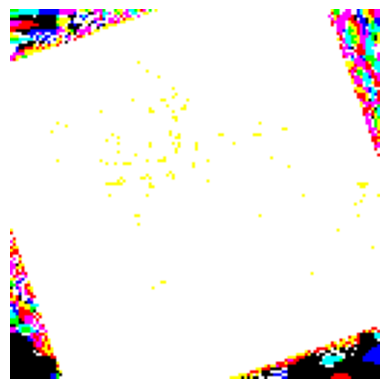

Processing image 65/1511


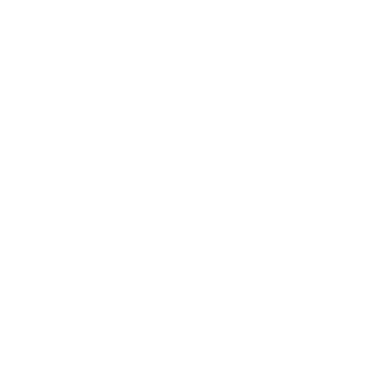

Processing image 66/1511


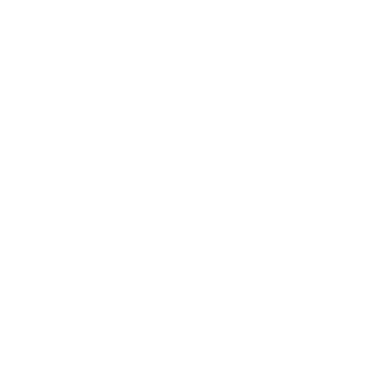

Processing image 67/1511


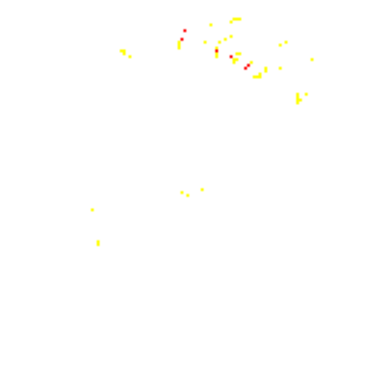

Processing image 68/1511


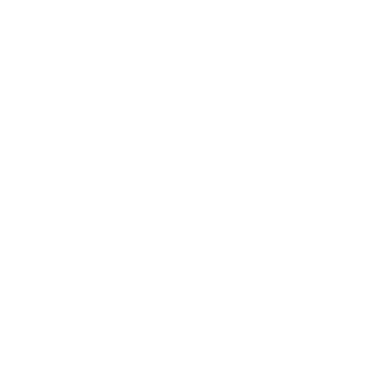

Processing image 69/1511


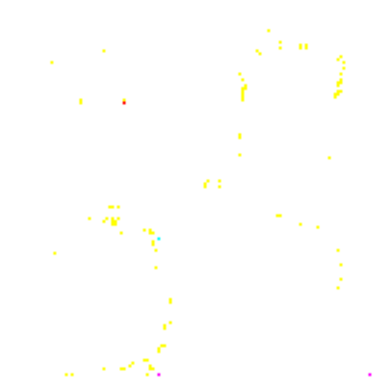

Processing image 70/1511


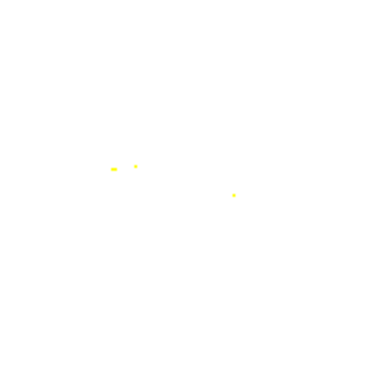

Processing image 71/1511


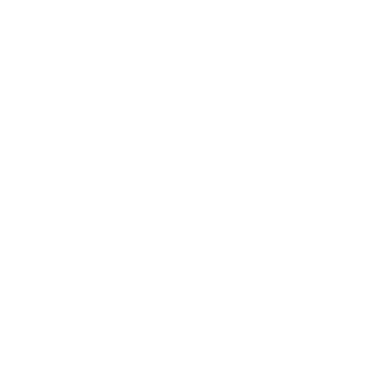

Processing image 72/1511


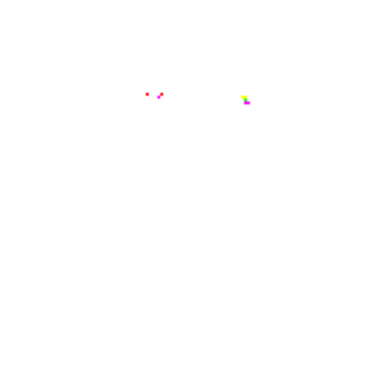

Processing image 73/1511


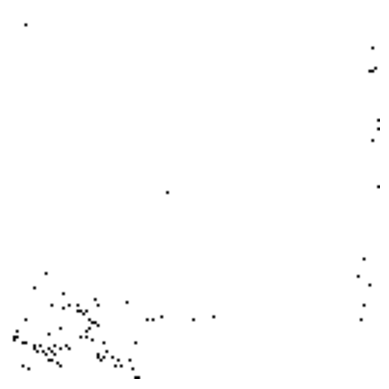

Processing image 74/1511


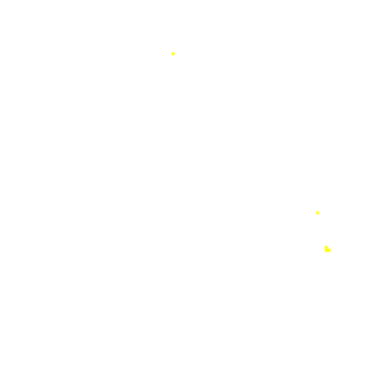

Processing image 75/1511


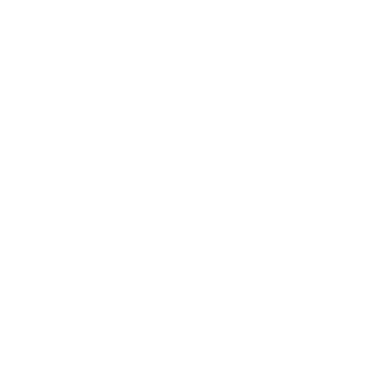

Processing image 76/1511


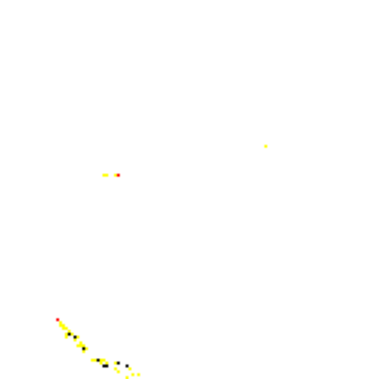

Processing image 77/1511


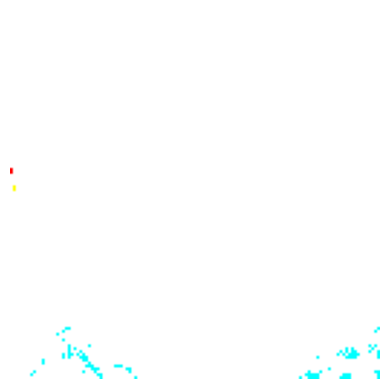

Processing image 78/1511


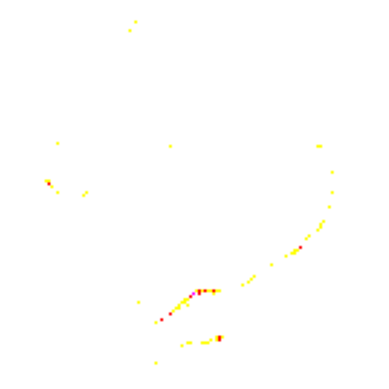

Processing image 79/1511


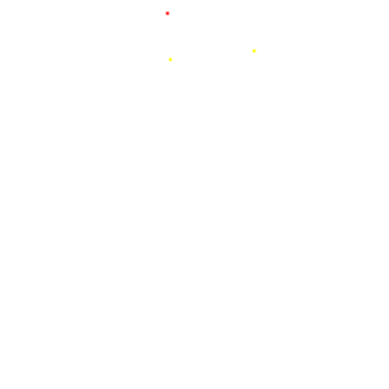

Processing image 80/1511


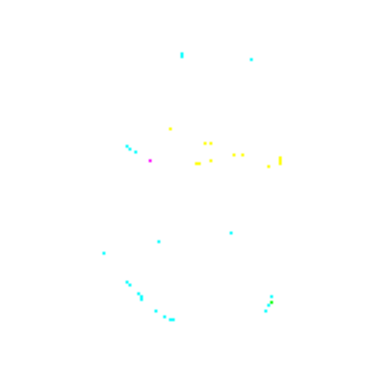

Processing image 81/1511


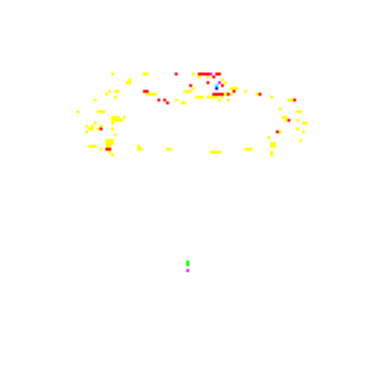

Processing image 82/1511


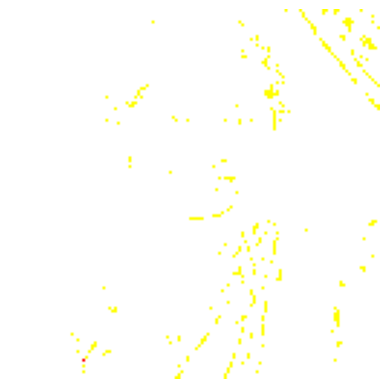

Processing image 83/1511


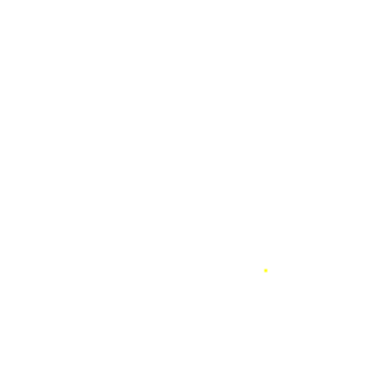

Processing image 84/1511


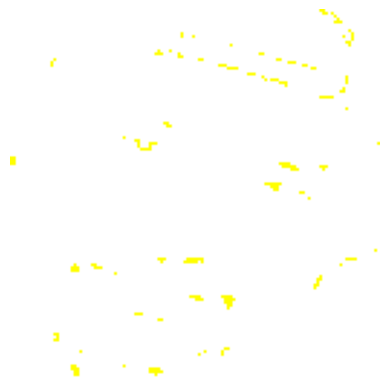

Processing image 85/1511


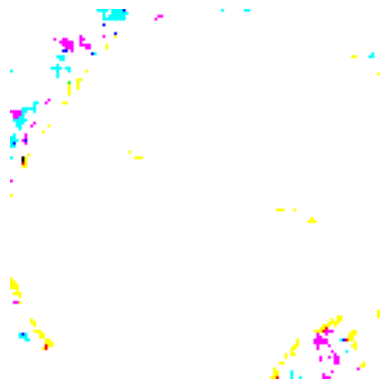

Processing image 86/1511


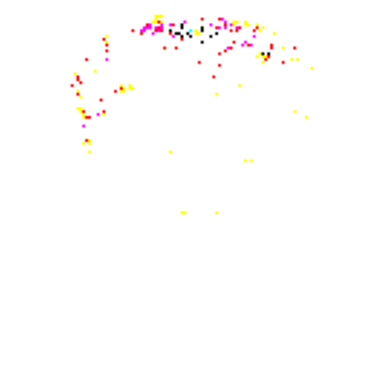

Processing image 87/1511


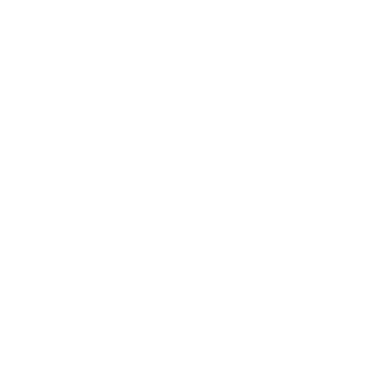

Processing image 88/1511


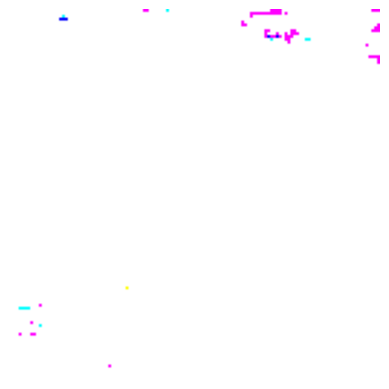

Processing image 89/1511


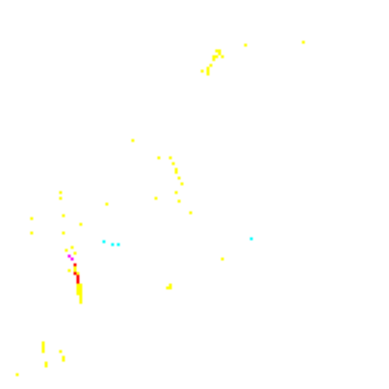

Processing image 90/1511


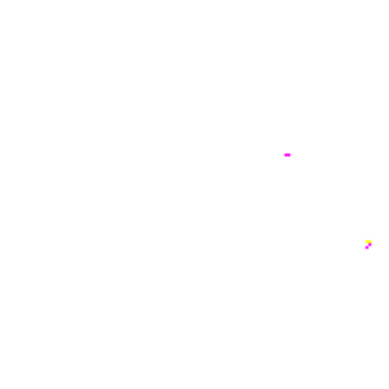

Processing image 91/1511


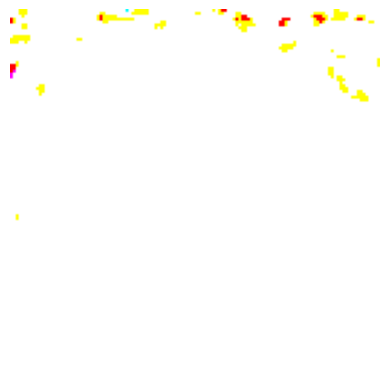

Processing image 92/1511


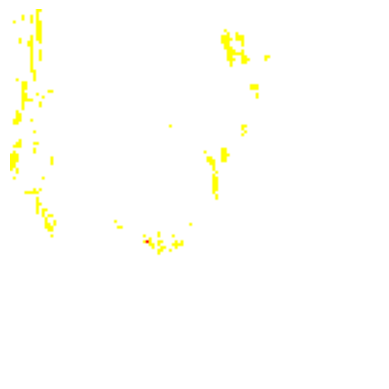

Processing image 93/1511


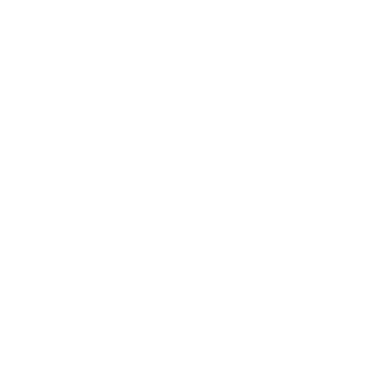

Processing image 94/1511


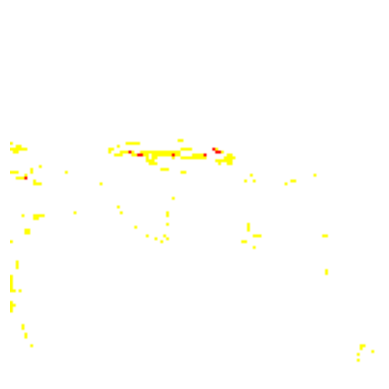

Processing image 95/1511


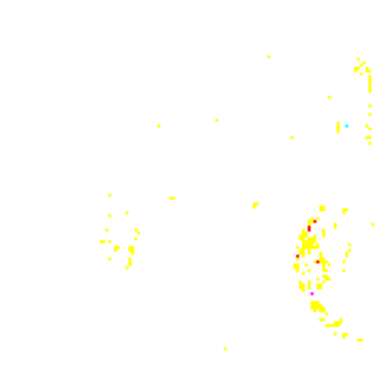

Processing image 96/1511


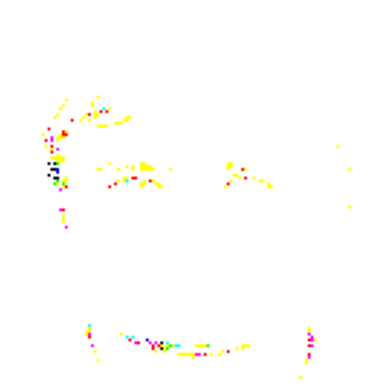

Processing image 97/1511


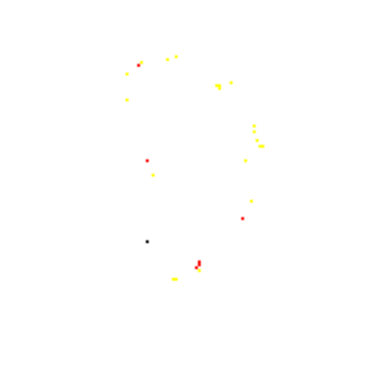

Processing image 98/1511


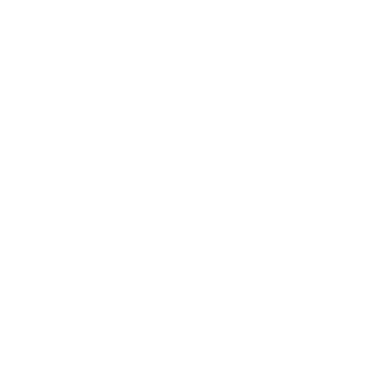

Processing image 99/1511


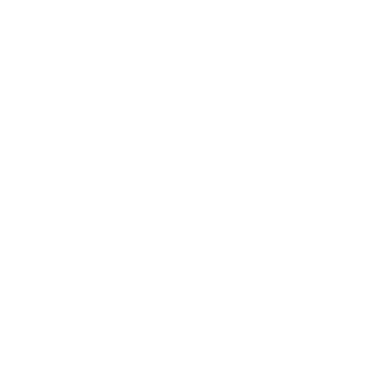

Processing image 100/1511


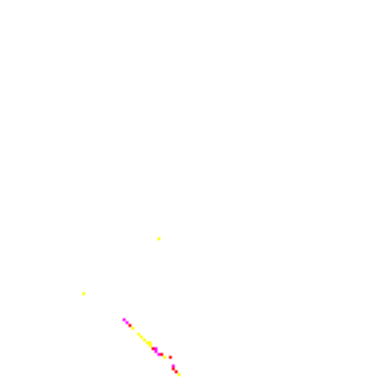

Processing image 101/1511


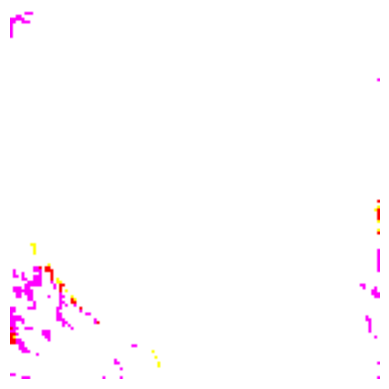

Processing image 102/1511


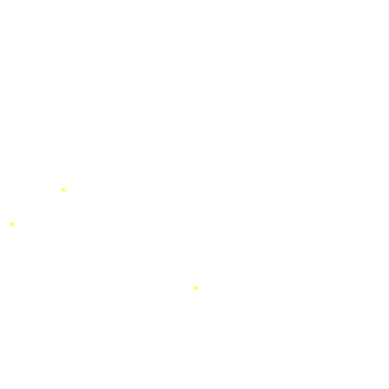

Processing image 103/1511


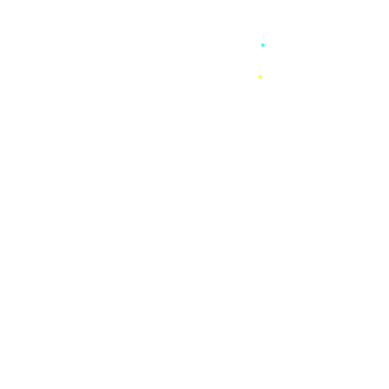

Processing image 104/1511


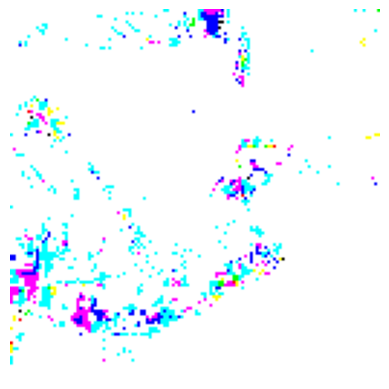

Processing image 105/1511


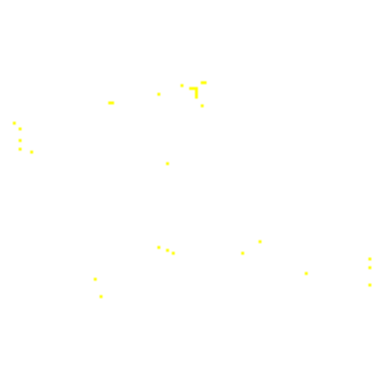

Processing image 106/1511


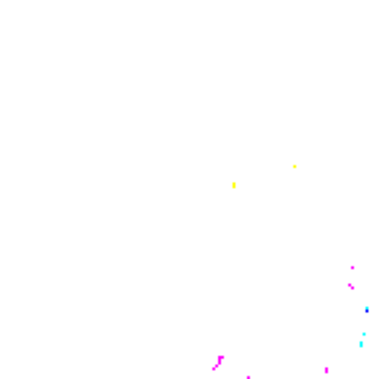

Processing image 107/1511


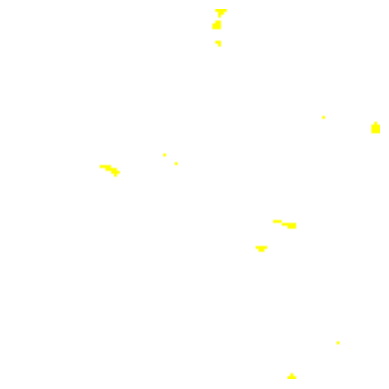

Processing image 108/1511


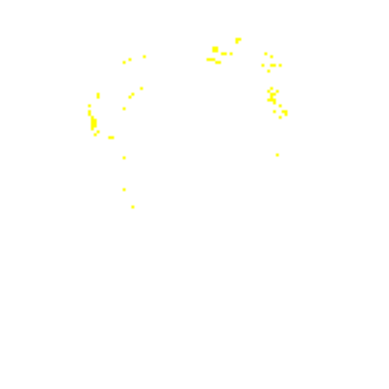

Processing image 109/1511


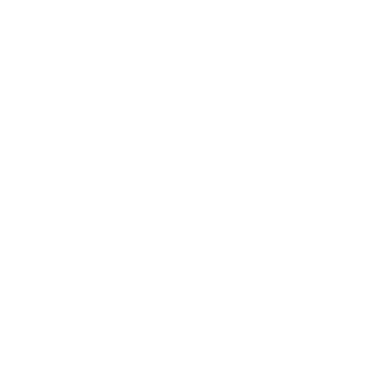

Processing image 110/1511


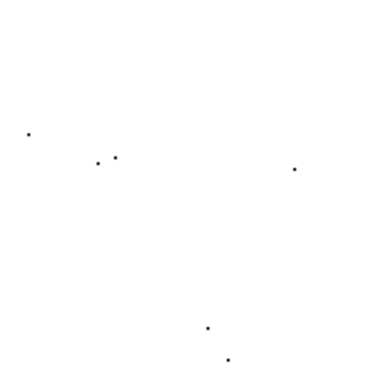

Processing image 111/1511


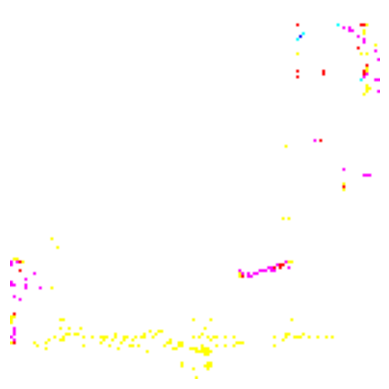

Processing image 112/1511


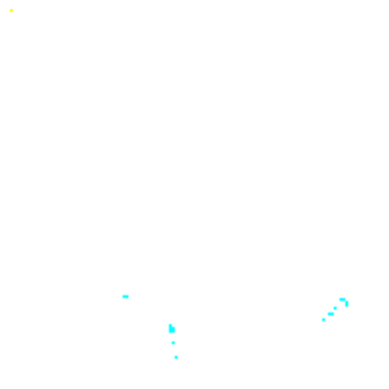

Processing image 113/1511


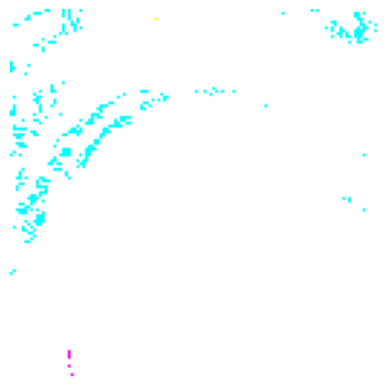

Processing image 114/1511


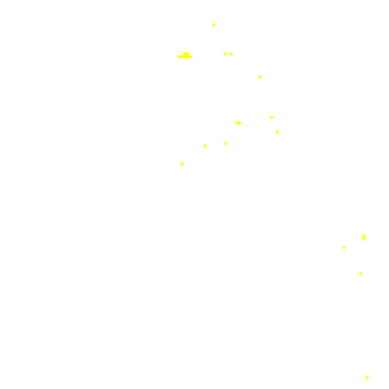

Processing image 115/1511


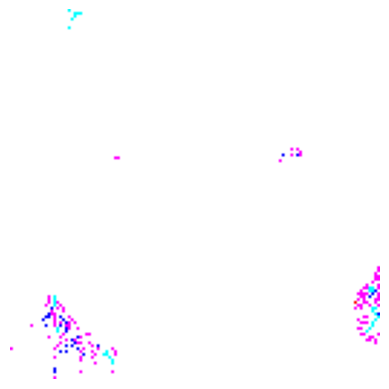

Processing image 116/1511


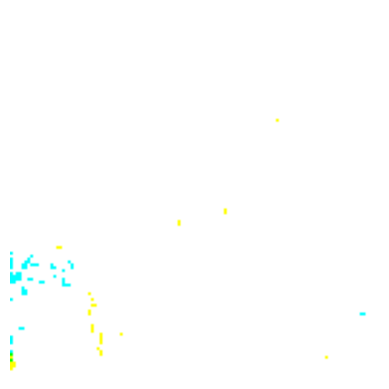

Processing image 117/1511


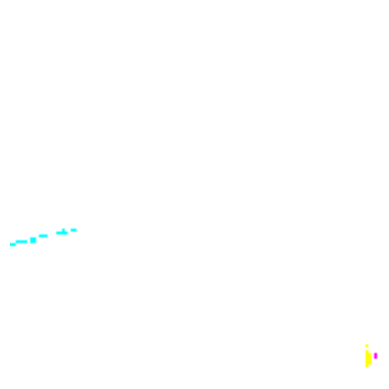

Processing image 118/1511


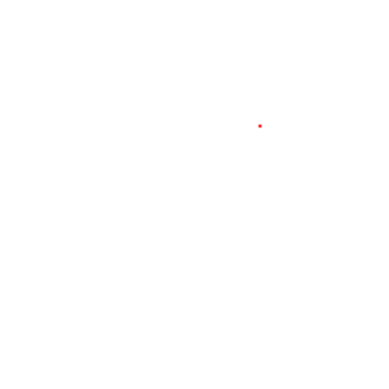

Processing image 119/1511


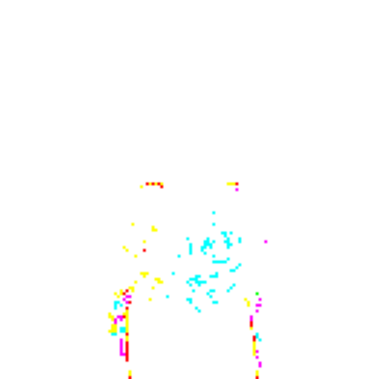

Processing image 120/1511


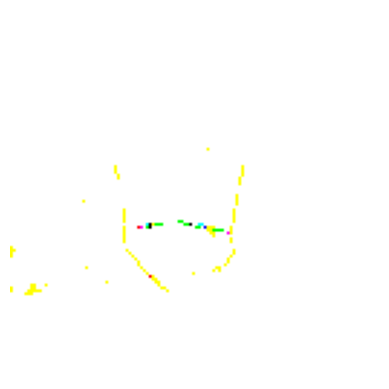

Processing image 121/1511


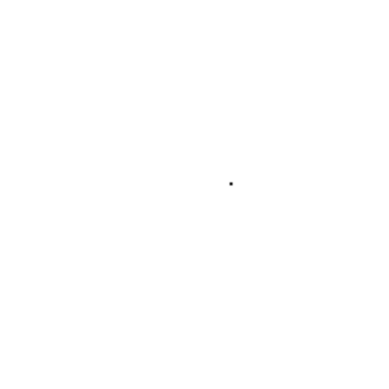

Processing image 122/1511


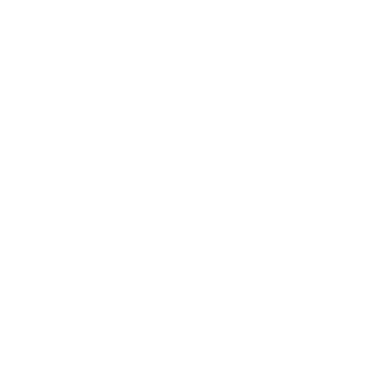

Processing image 123/1511


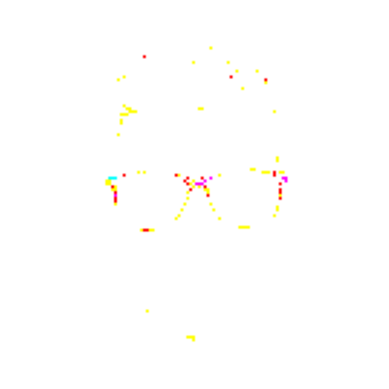

Processing image 124/1511


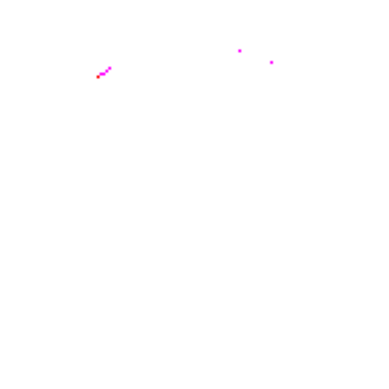

Processing image 125/1511


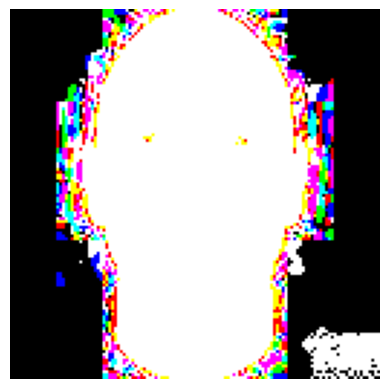

Processing image 126/1511


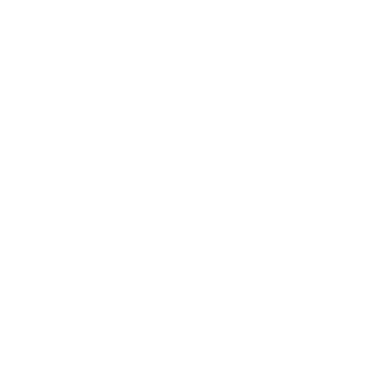

Processing image 127/1511


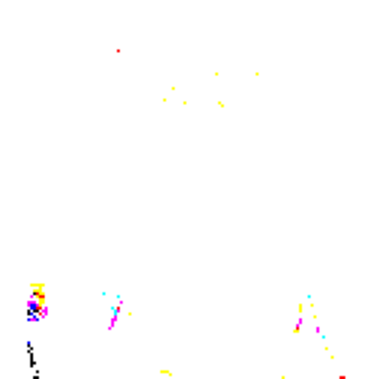

Processing image 128/1511


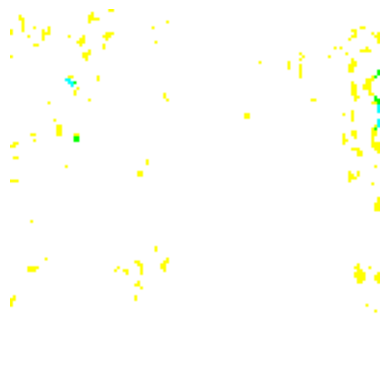

Processing image 129/1511


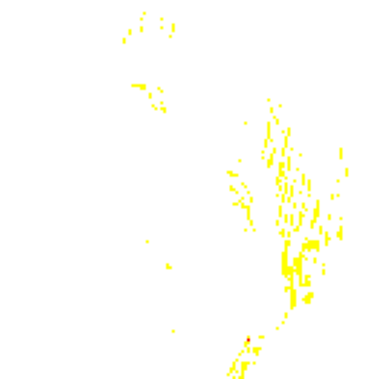

Processing image 130/1511


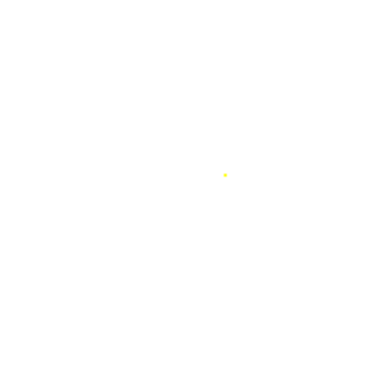

Processing image 131/1511


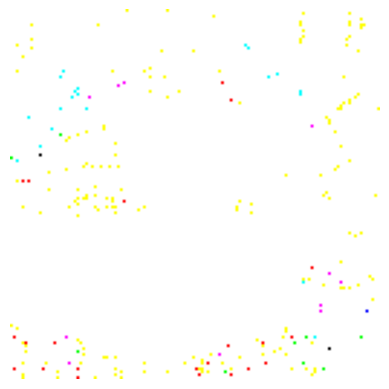

Processing image 132/1511


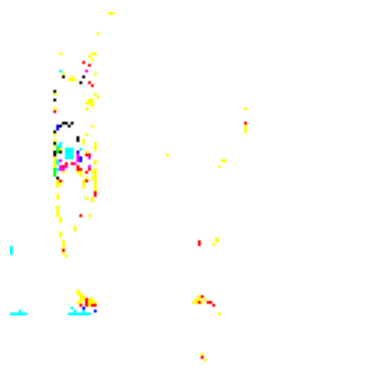

Processing image 133/1511


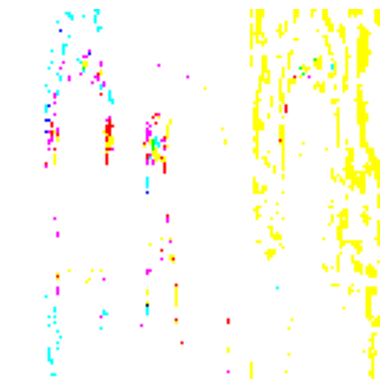

Processing image 134/1511


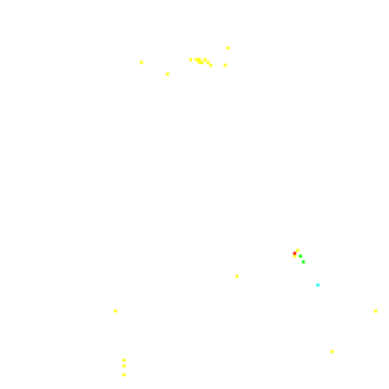

Processing image 135/1511


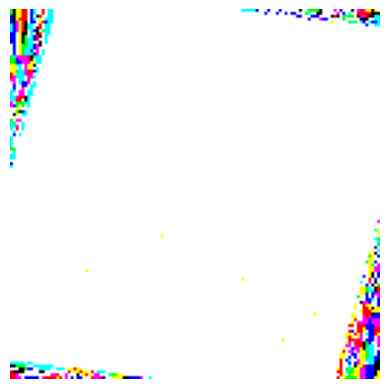

Processing image 136/1511


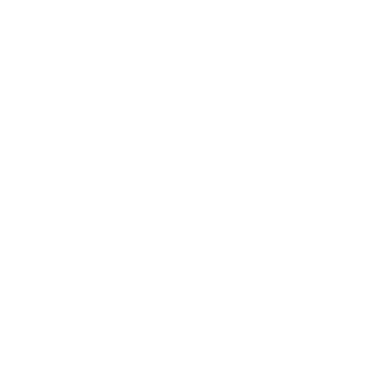

Processing image 137/1511


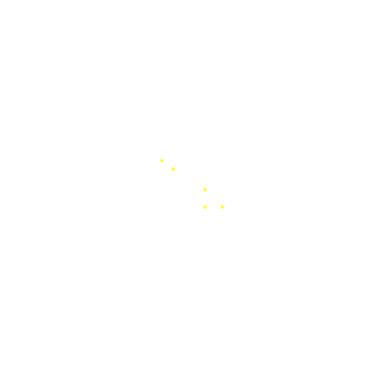

Processing image 138/1511


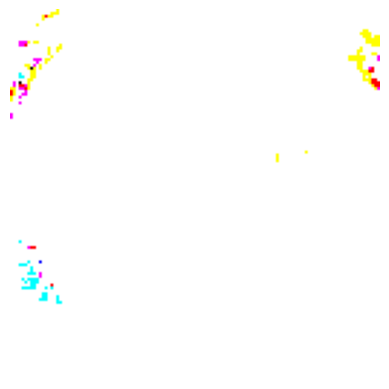

Processing image 139/1511


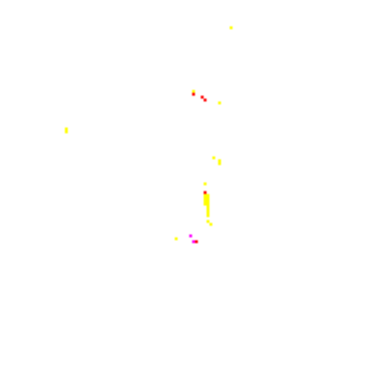

Processing image 140/1511


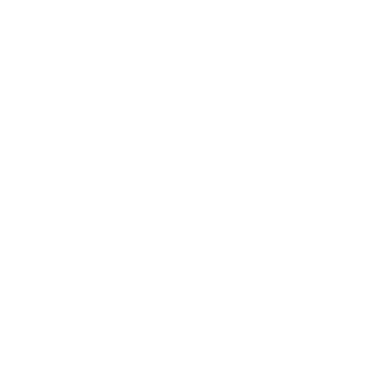

Processing image 141/1511


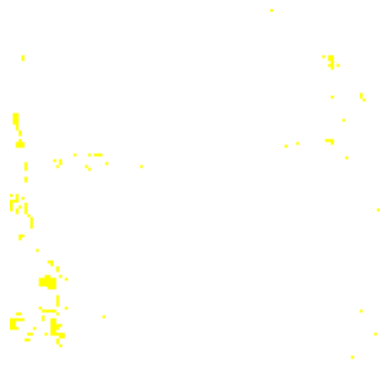

Processing image 142/1511


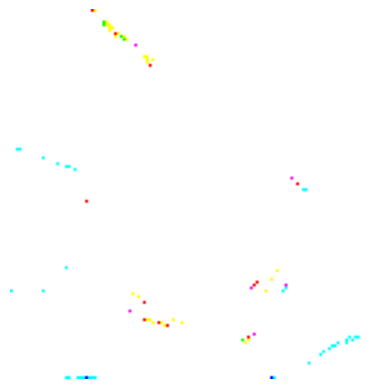

Processing image 143/1511


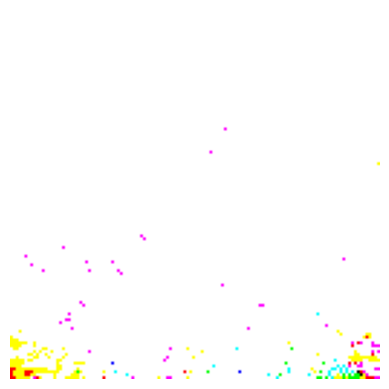

Processing image 144/1511


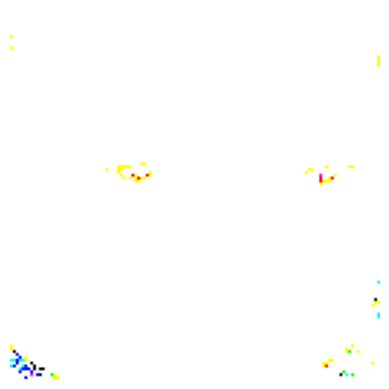

Processing image 145/1511


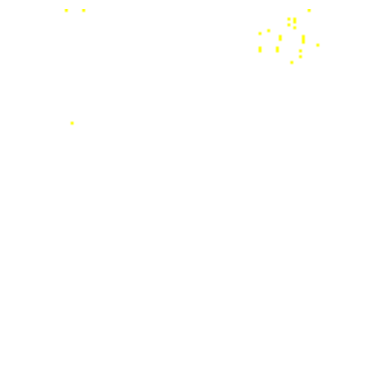

Processing image 146/1511


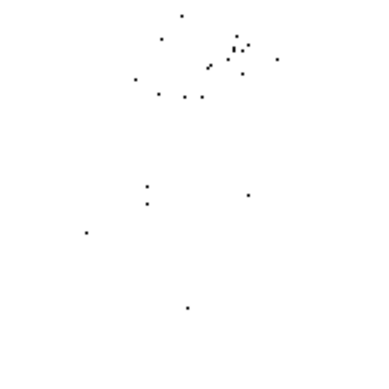

Processing image 147/1511


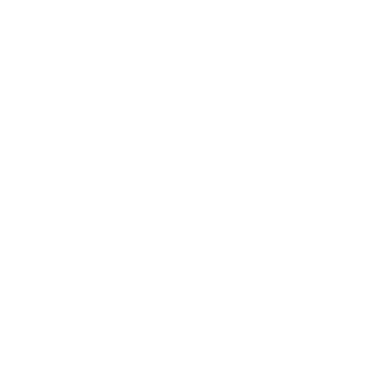

Processing image 148/1511


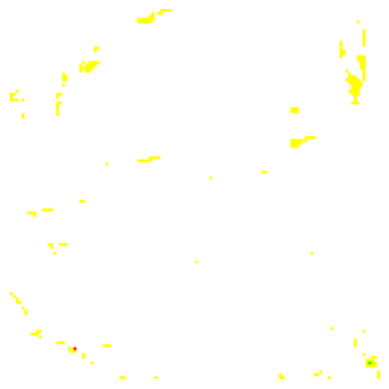

Processing image 149/1511


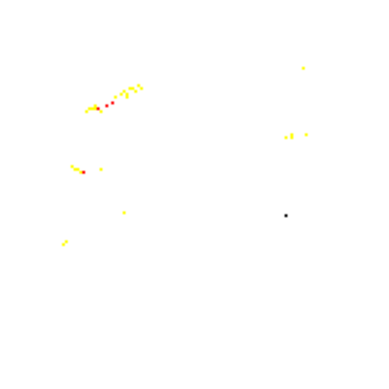

Processing image 150/1511


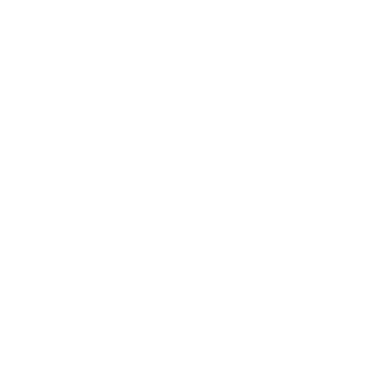

Processing image 151/1511


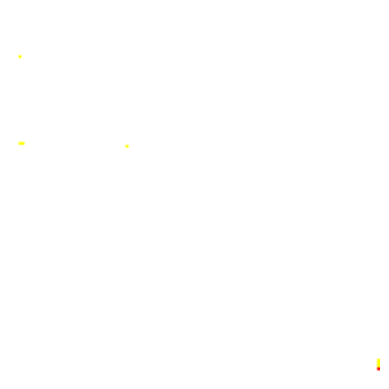

Processing image 152/1511


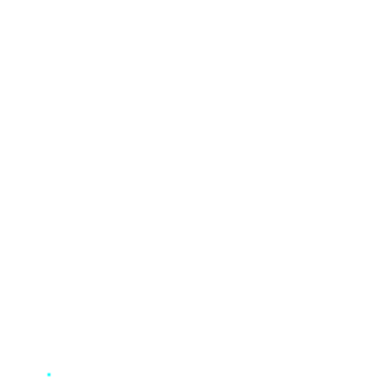

Processing image 153/1511


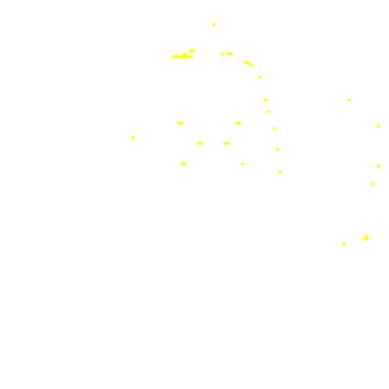

Processing image 154/1511


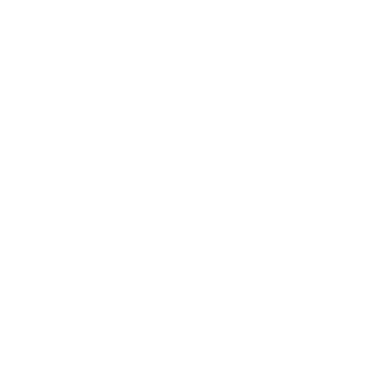

Processing image 155/1511


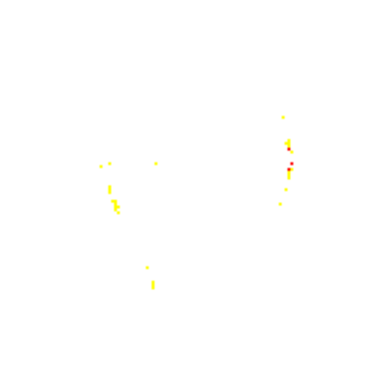

Processing image 156/1511


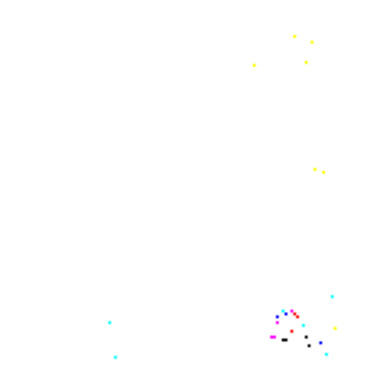

Processing image 157/1511


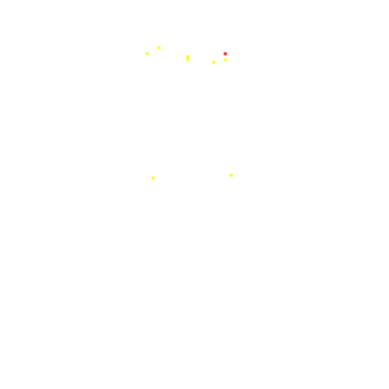

Processing image 158/1511


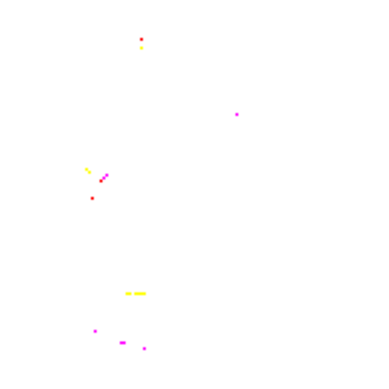

Processing image 159/1511


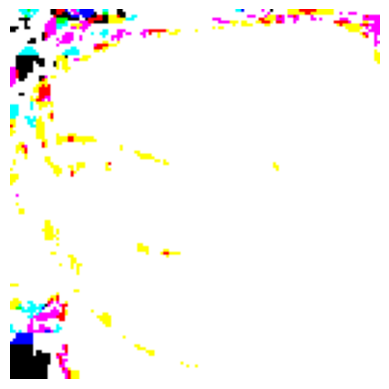

Processing image 160/1511


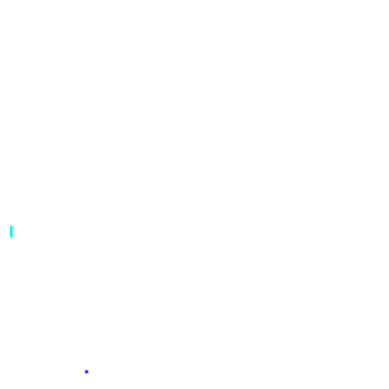

Processing image 161/1511


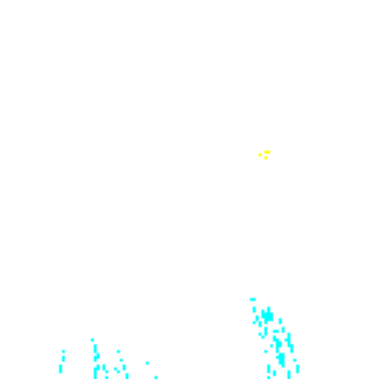

Processing image 162/1511


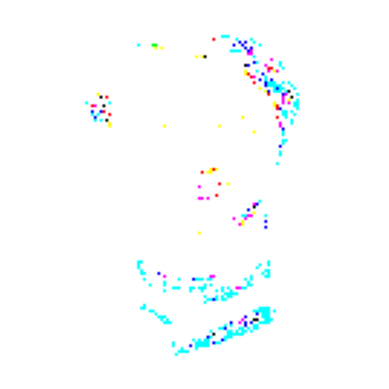

Processing image 163/1511


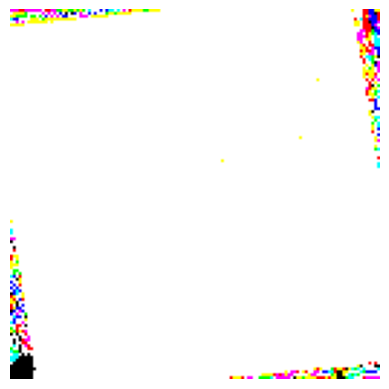

Processing image 164/1511


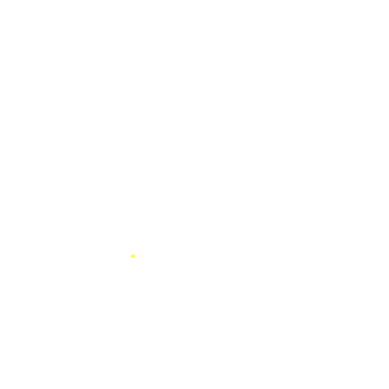

Processing image 165/1511


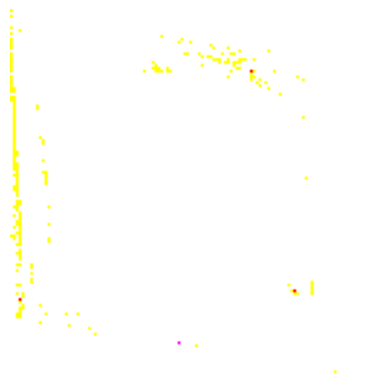

Processing image 166/1511


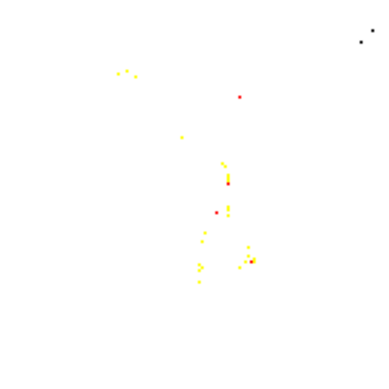

Processing image 167/1511


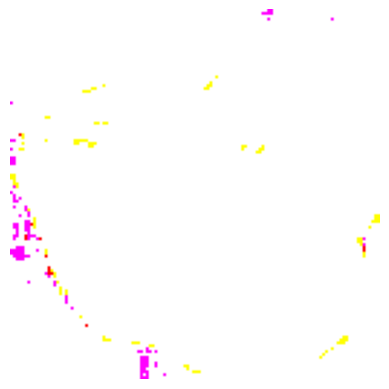

Processing image 168/1511


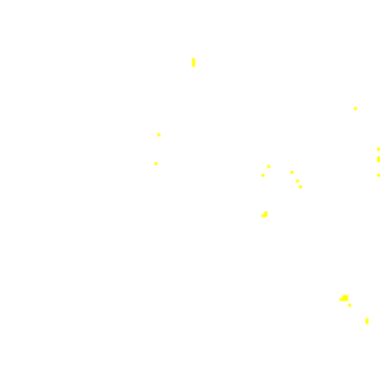

Processing image 169/1511


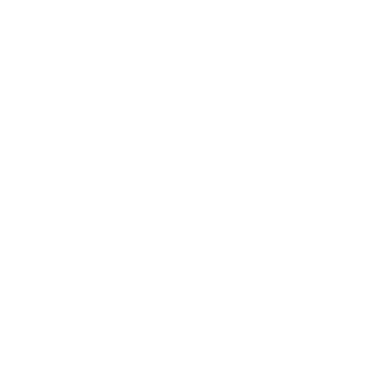

Processing image 170/1511


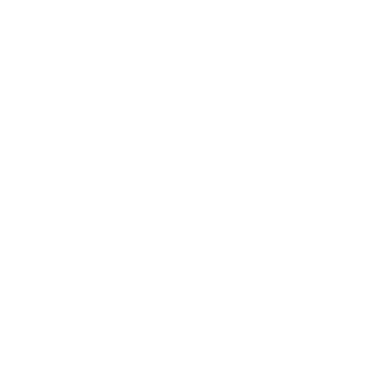

Processing image 171/1511


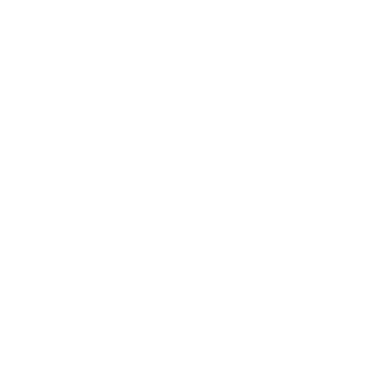

Processing image 172/1511


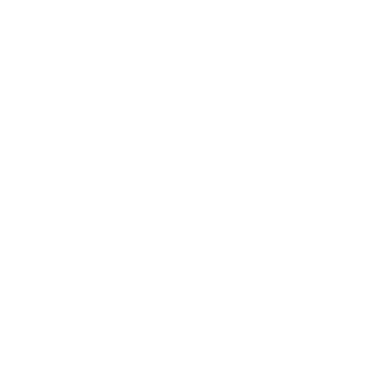

Processing image 173/1511


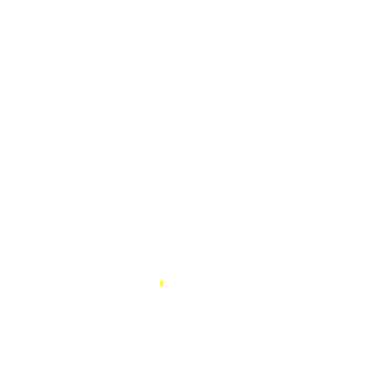

Processing image 174/1511


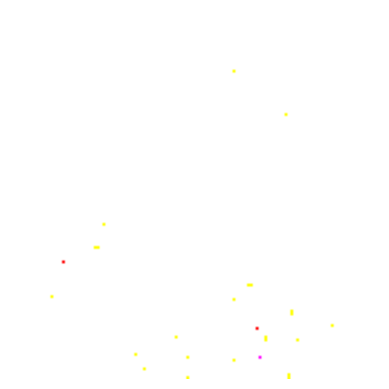

Processing image 175/1511


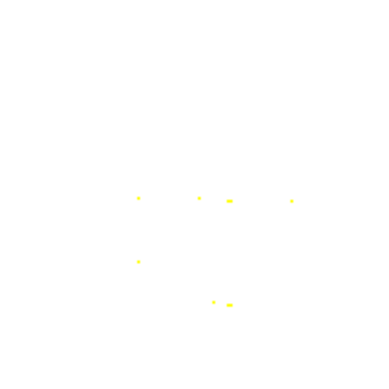

Processing image 176/1511


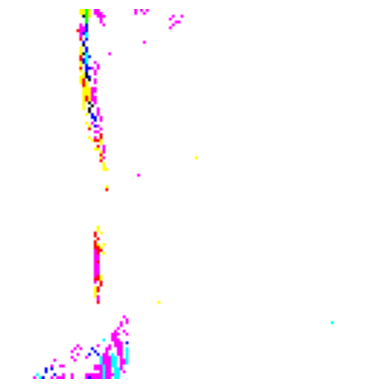

Processing image 177/1511


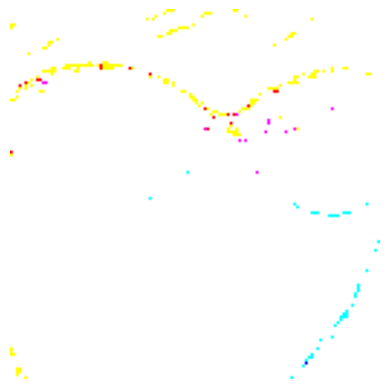

Processing image 178/1511


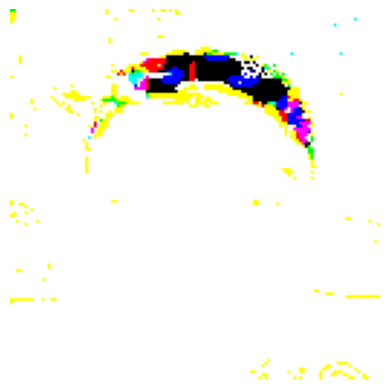

Processing image 179/1511


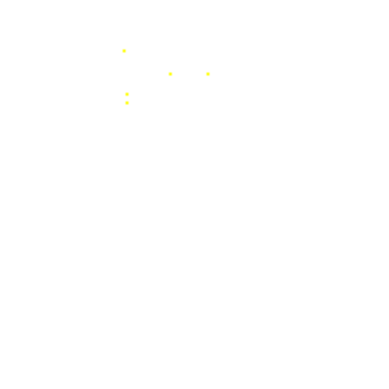

Processing image 180/1511


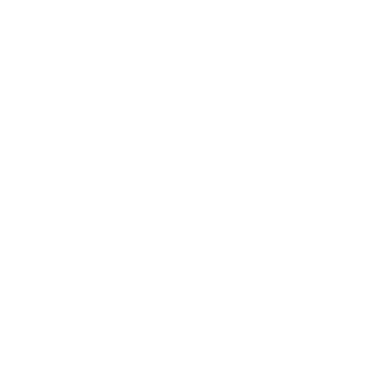

Processing image 181/1511


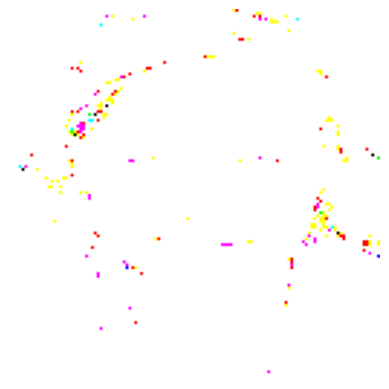

Processing image 182/1511


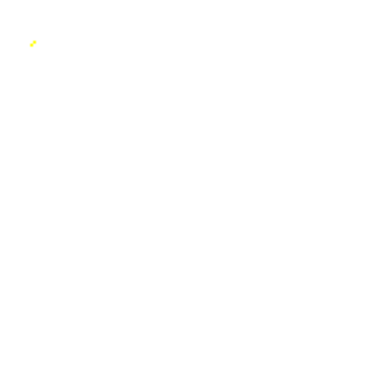

Processing image 183/1511


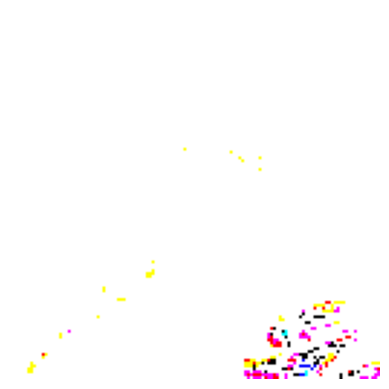

Processing image 184/1511


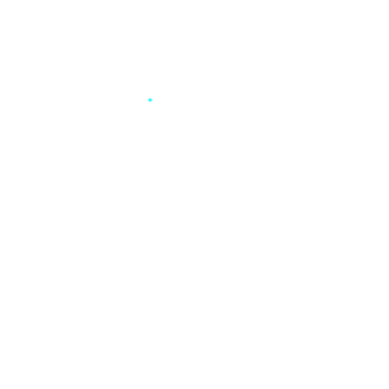

Processing image 185/1511


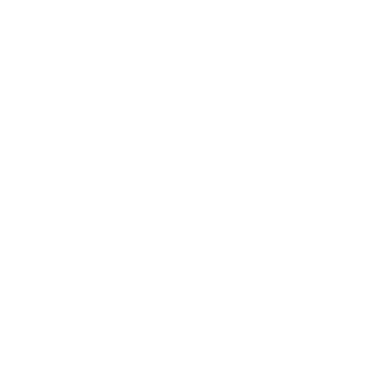

Processing image 186/1511


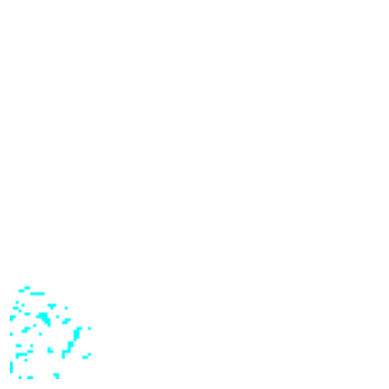

Processing image 187/1511


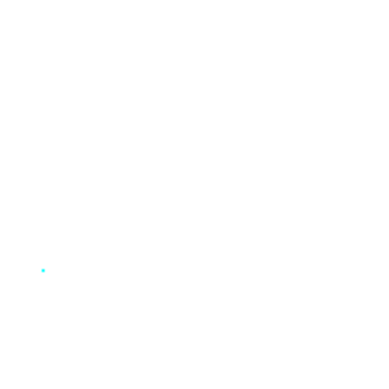

Processing image 188/1511


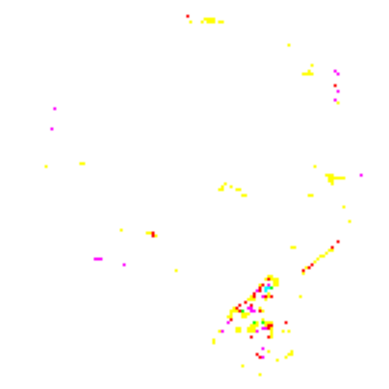

Processing image 189/1511


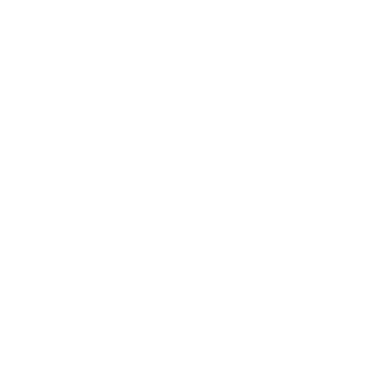

Processing image 190/1511


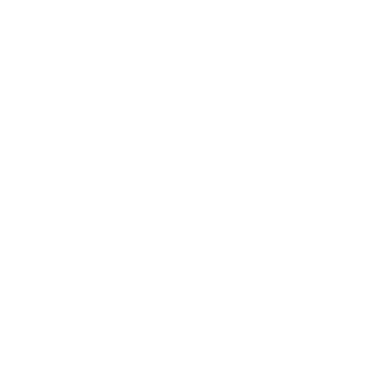

Processing image 191/1511


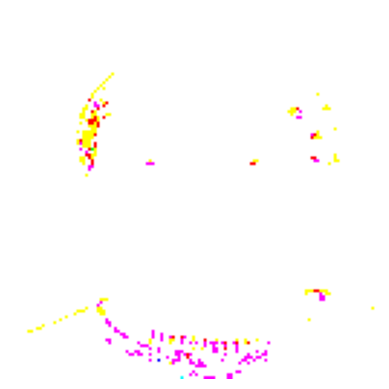

Processing image 192/1511


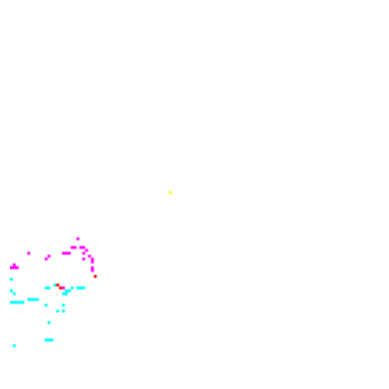

Processing image 193/1511


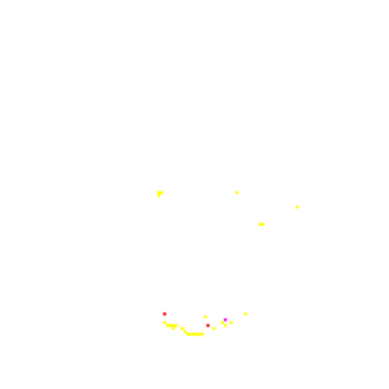

Processing image 194/1511


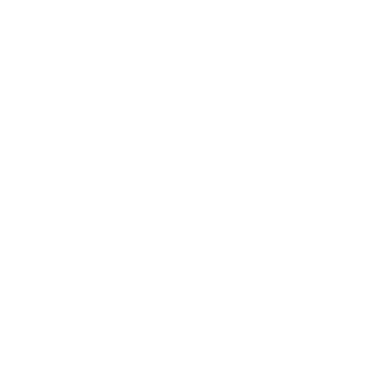

Processing image 195/1511


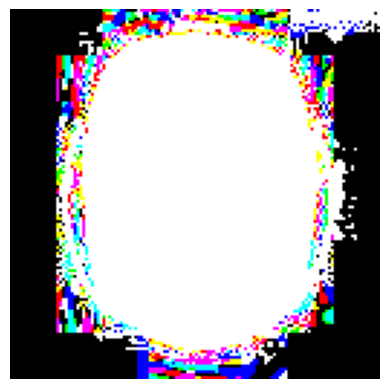

Processing image 196/1511


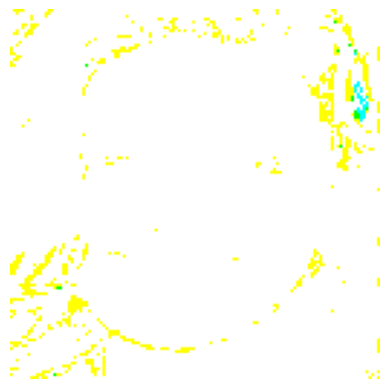

Processing image 197/1511


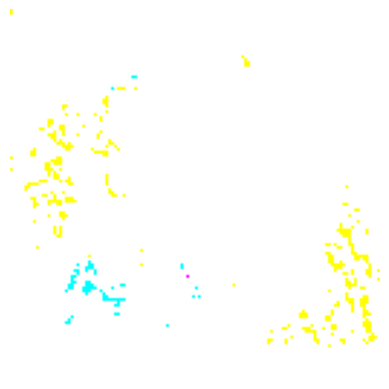

Processing image 198/1511


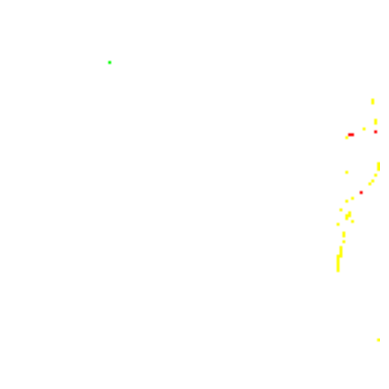

Processing image 199/1511


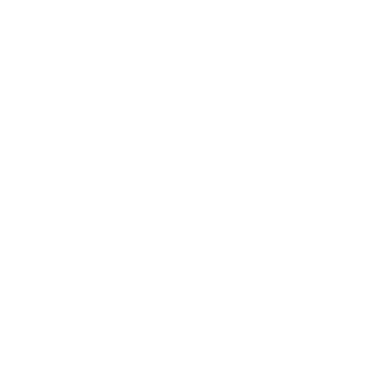

Processing image 200/1511


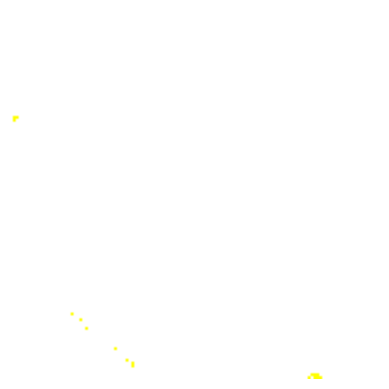

Processing image 201/1511


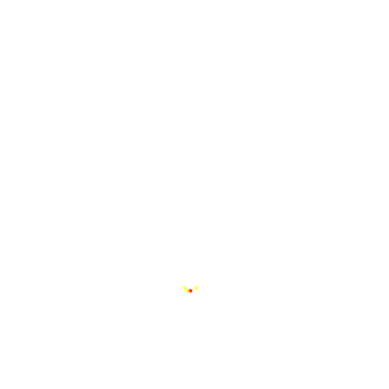

Processing image 202/1511


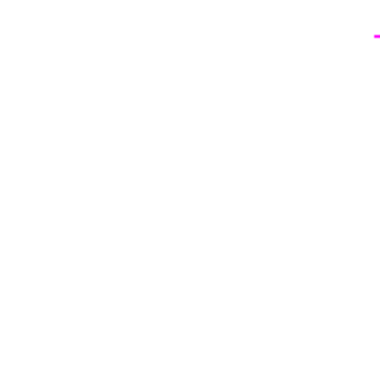

Processing image 203/1511


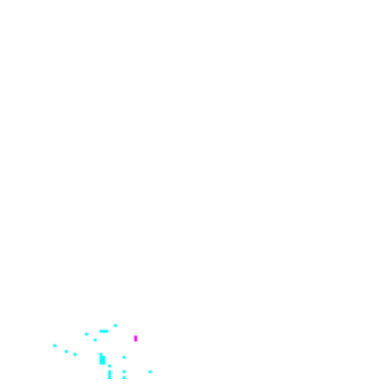

Processing image 204/1511


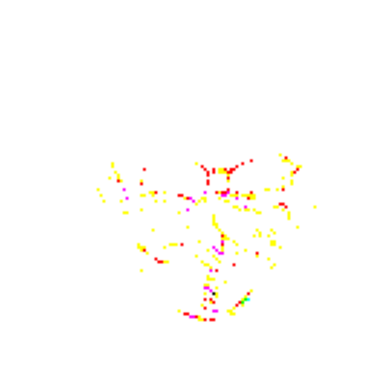

Processing image 205/1511


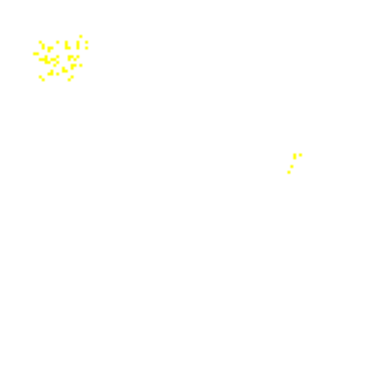

Processing image 206/1511


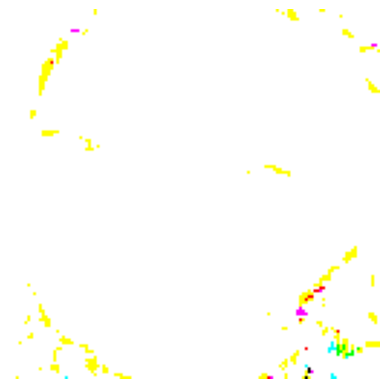

Processing image 207/1511


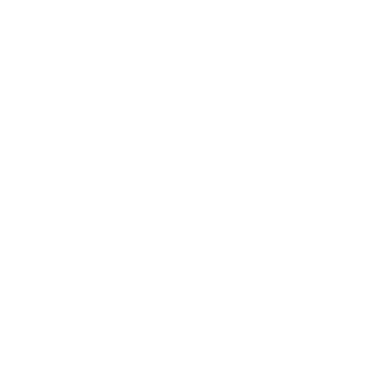

Processing image 208/1511


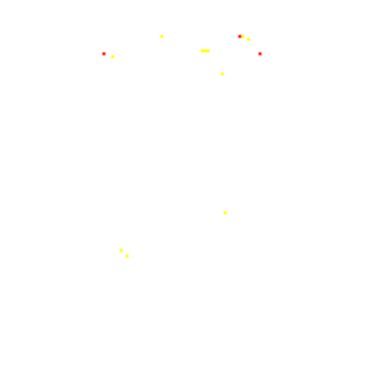

Processing image 209/1511


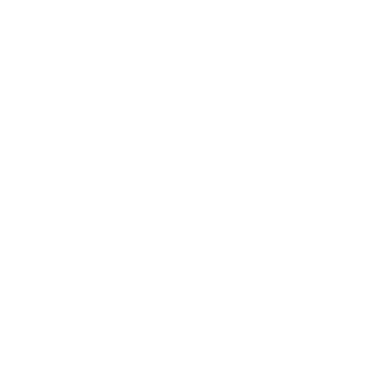

Processing image 210/1511


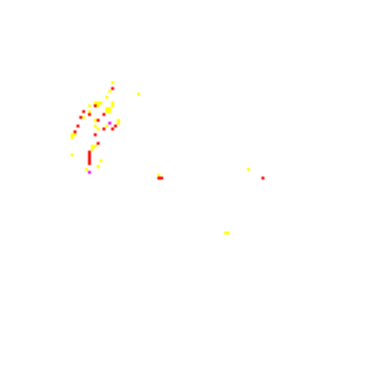

Processing image 211/1511


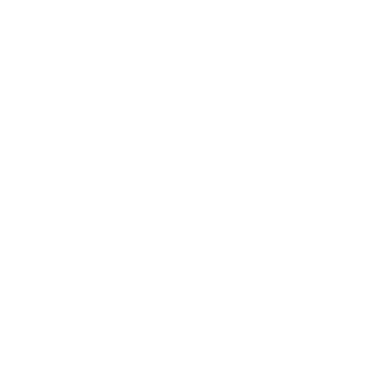

Processing image 212/1511


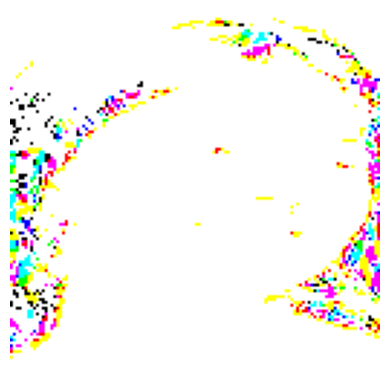

Processing image 213/1511


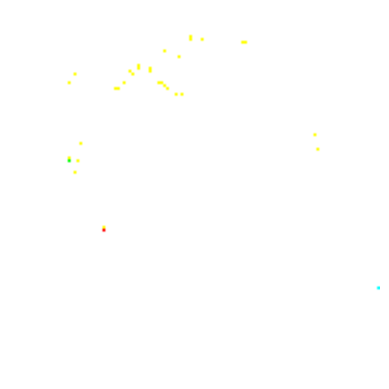

Processing image 214/1511


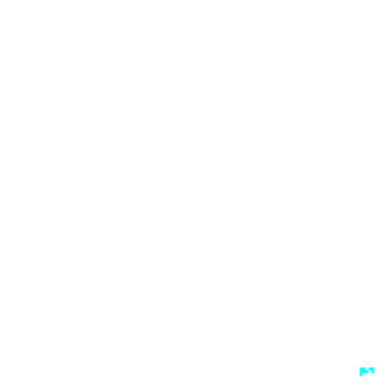

Processing image 215/1511


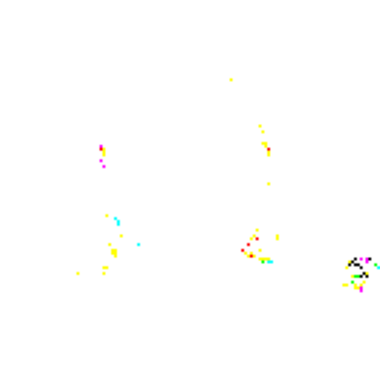

Processing image 216/1511


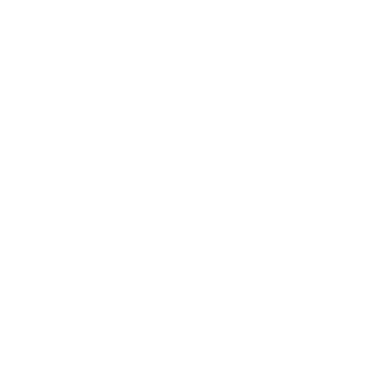

Processing image 217/1511


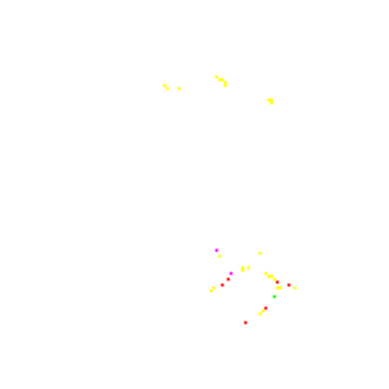

Processing image 218/1511


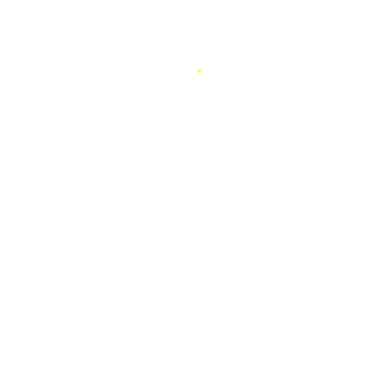

Processing image 219/1511


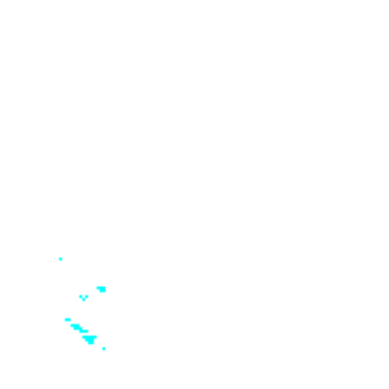

Processing image 220/1511


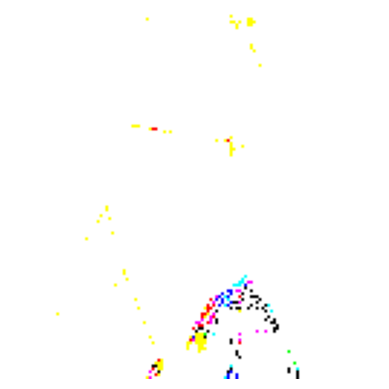

Processing image 221/1511


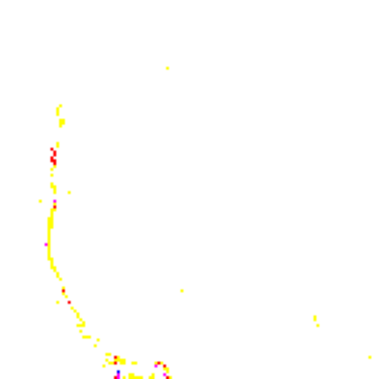

Processing image 222/1511


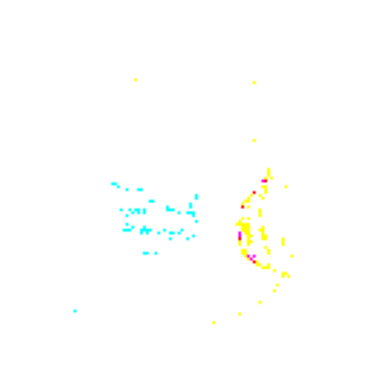

Processing image 223/1511


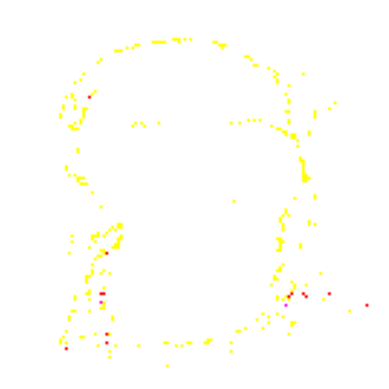

Processing image 224/1511


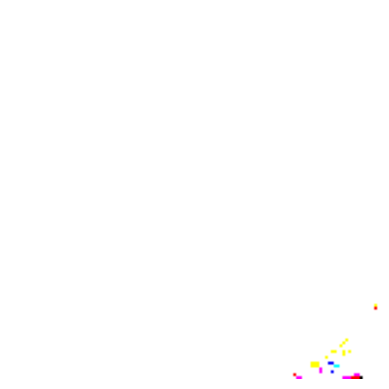

Processing image 225/1511


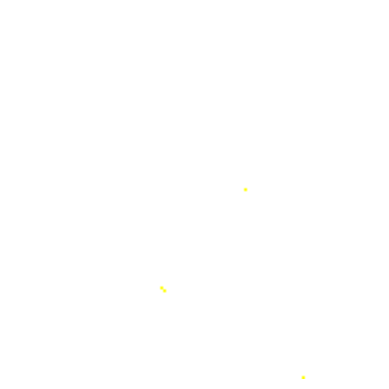

Processing image 226/1511


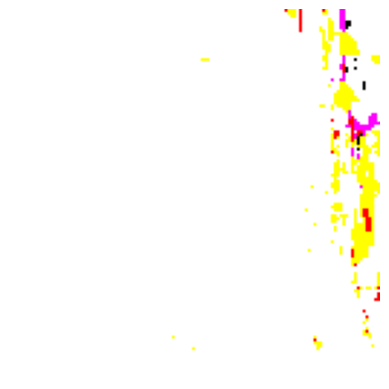

Processing image 227/1511


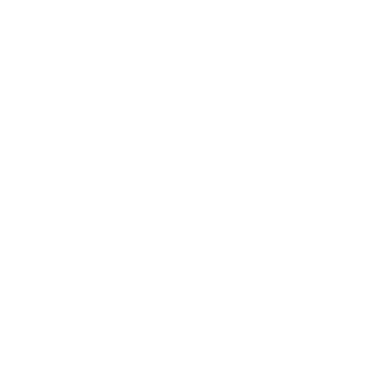

Processing image 228/1511


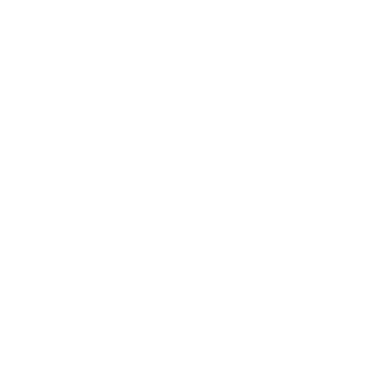

Processing image 229/1511


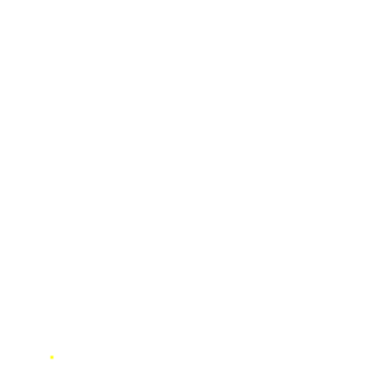

Processing image 230/1511


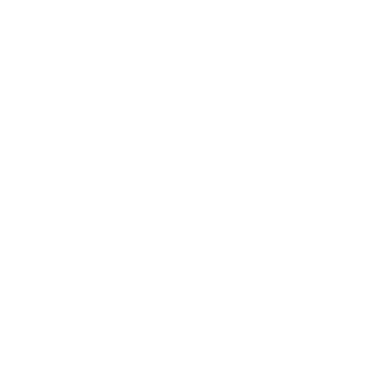

Processing image 231/1511


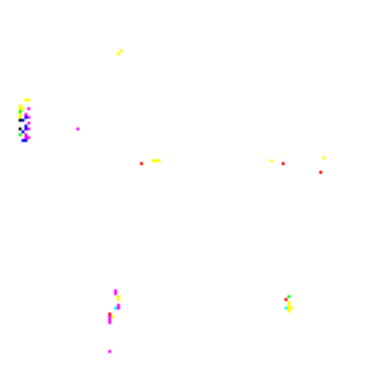

Processing image 232/1511


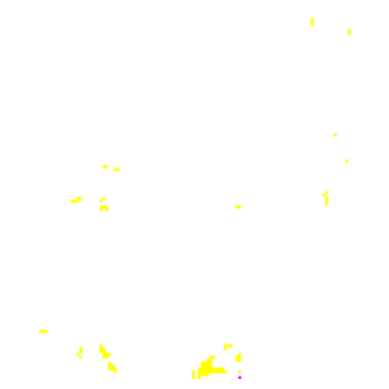

Processing image 233/1511


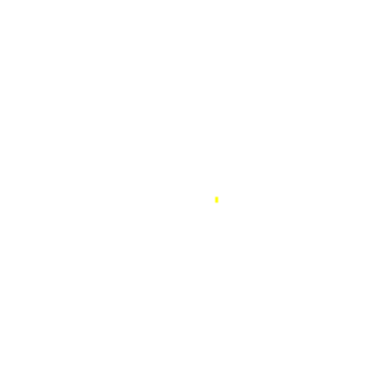

Processing image 234/1511


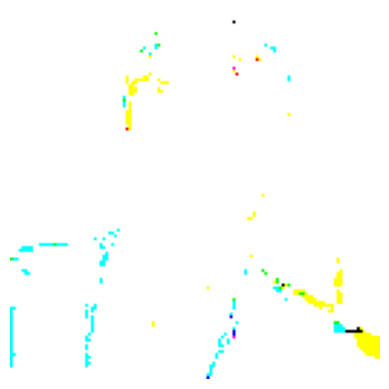

Processing image 235/1511


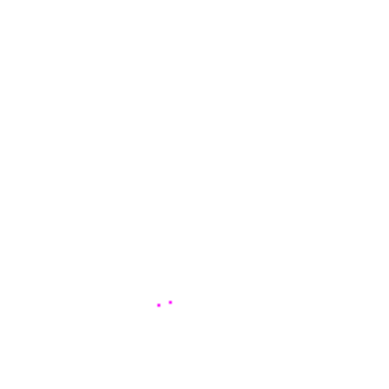

Processing image 236/1511


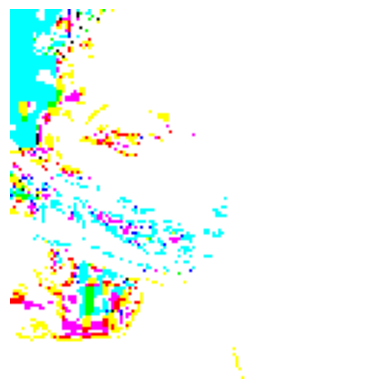

Processing image 237/1511


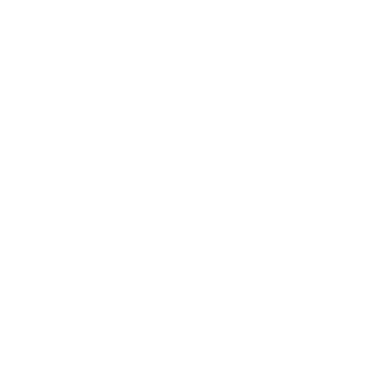

Processing image 238/1511


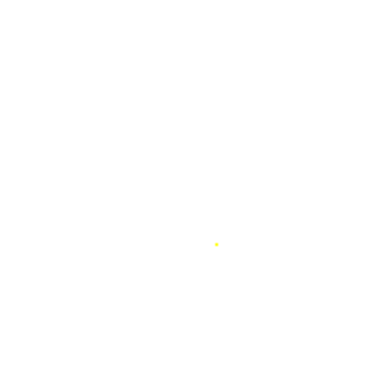

Processing image 239/1511


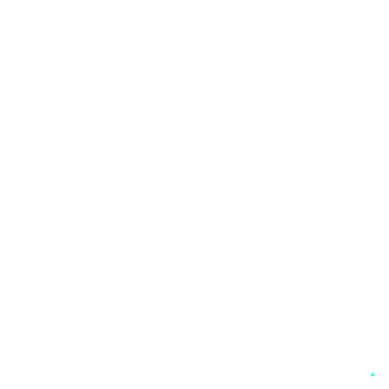

Processing image 240/1511


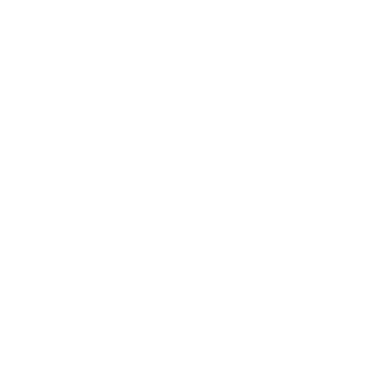

Processing image 241/1511


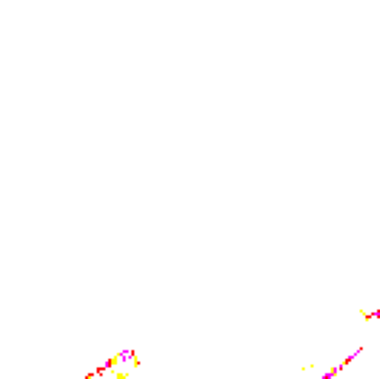

Processing image 242/1511


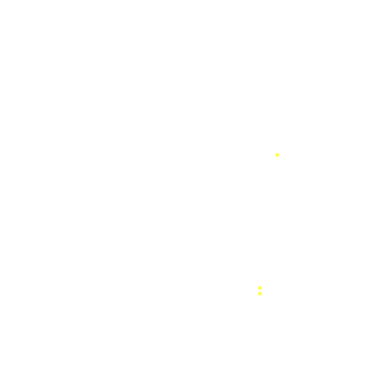

Processing image 243/1511


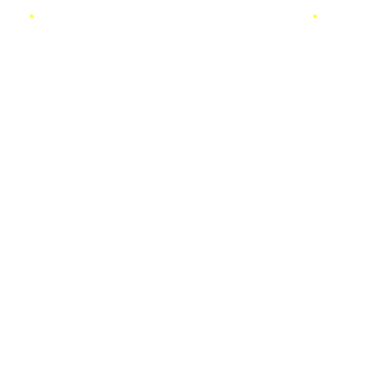

Processing image 244/1511


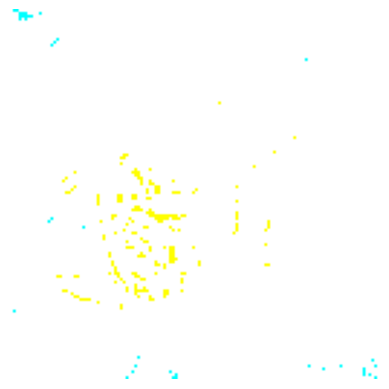

Processing image 245/1511


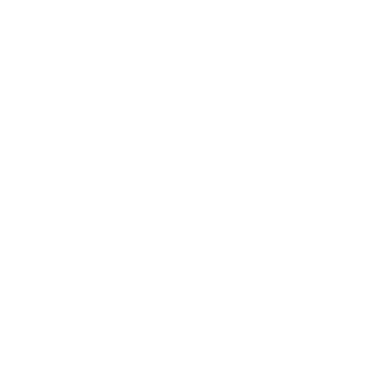

Processing image 246/1511


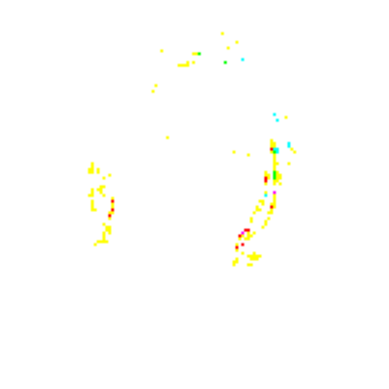

Processing image 247/1511


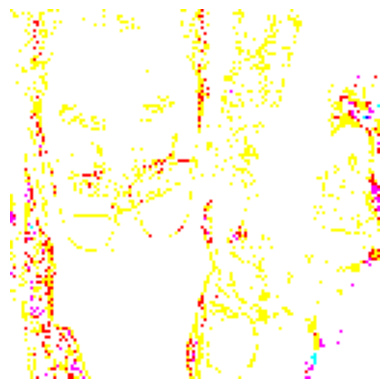

Processing image 248/1511


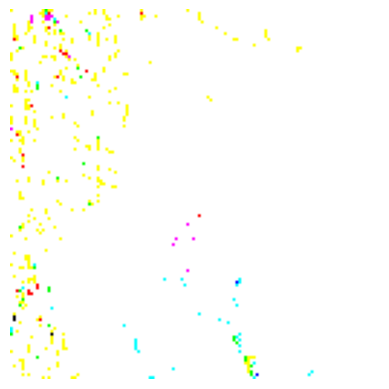

Processing image 249/1511


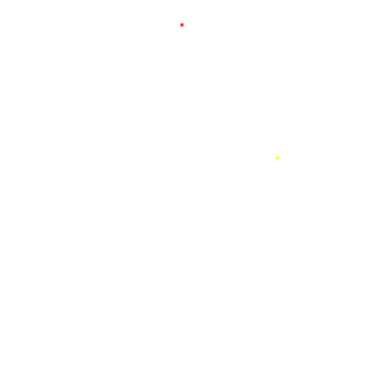

Processing image 250/1511


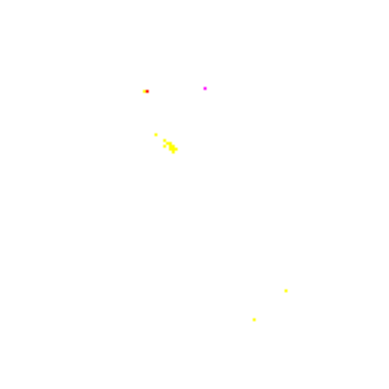

Processing image 251/1511


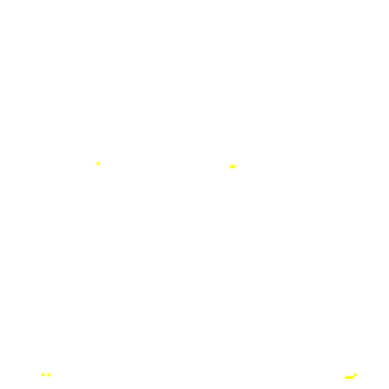

Processing image 252/1511


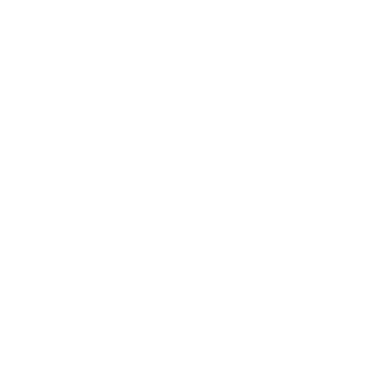

Processing image 253/1511


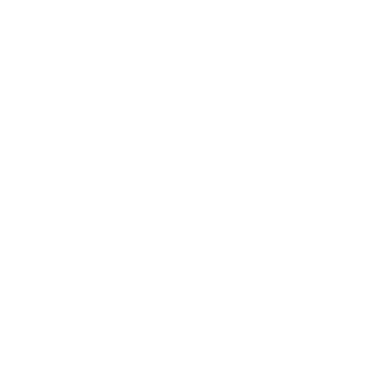

Processing image 254/1511


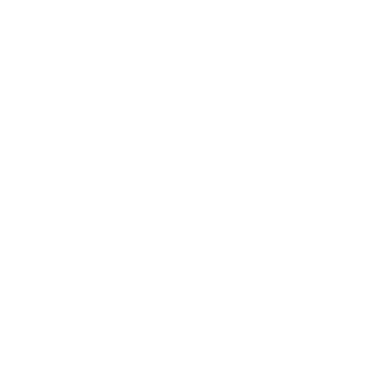

Processing image 255/1511


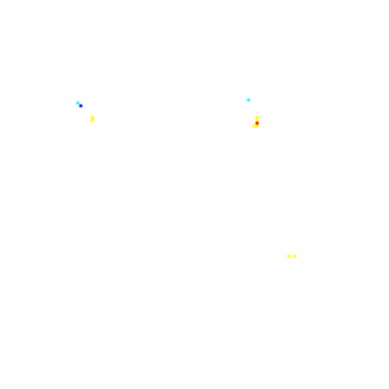

Processing image 256/1511


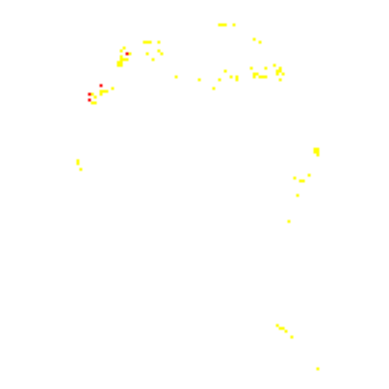

Processing image 257/1511


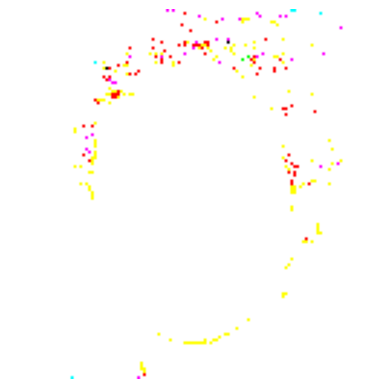

Processing image 258/1511


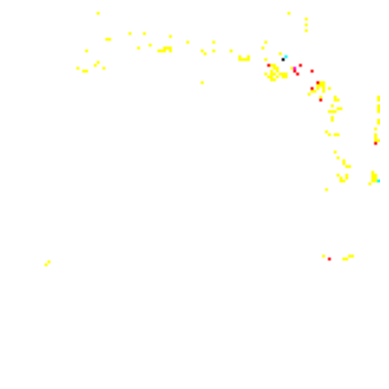

Processing image 259/1511


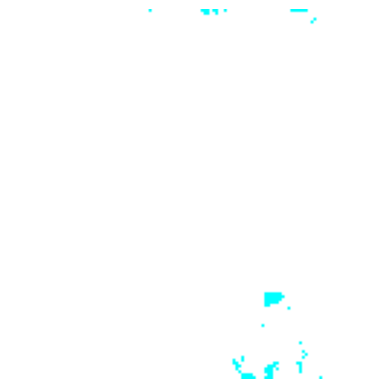

Processing image 260/1511


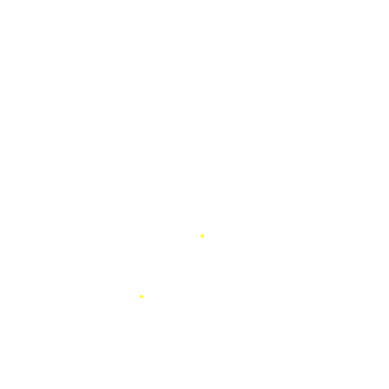

Processing image 261/1511


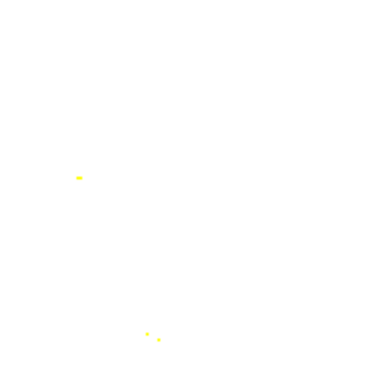

Processing image 262/1511


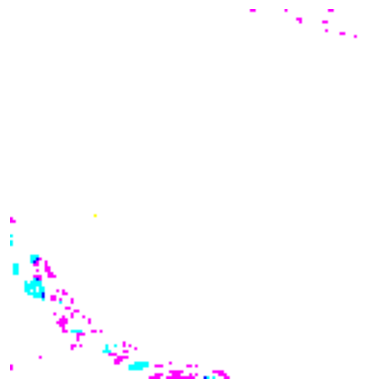

Processing image 263/1511


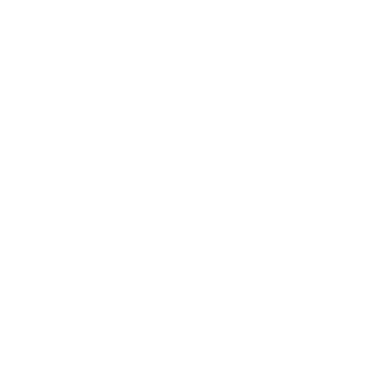

Processing image 264/1511


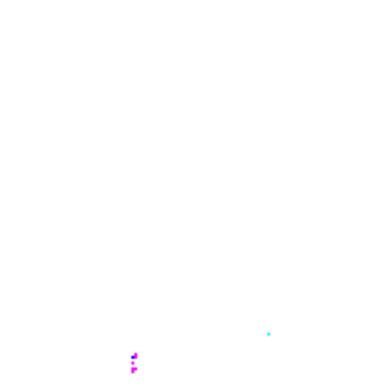

Processing image 265/1511


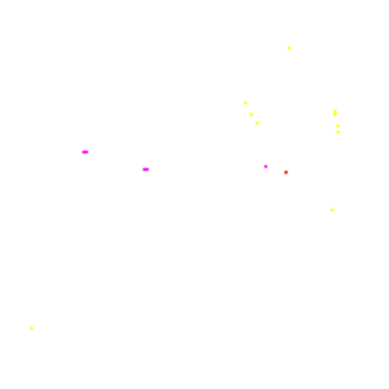

Processing image 266/1511


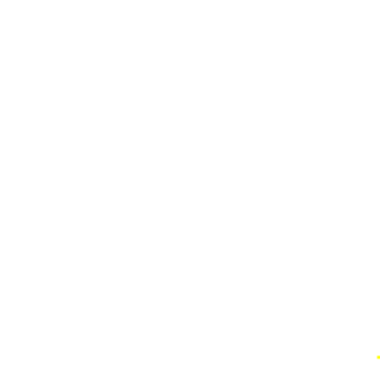

Processing image 267/1511


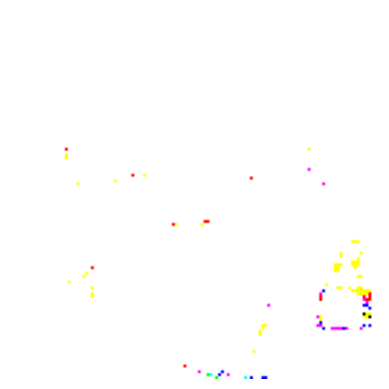

Processing image 268/1511


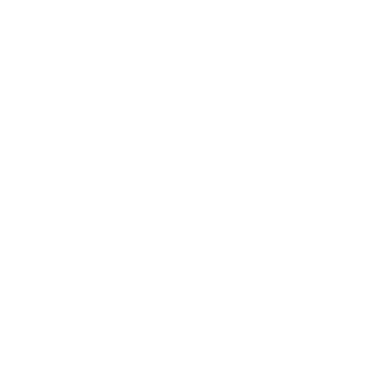

Processing image 269/1511


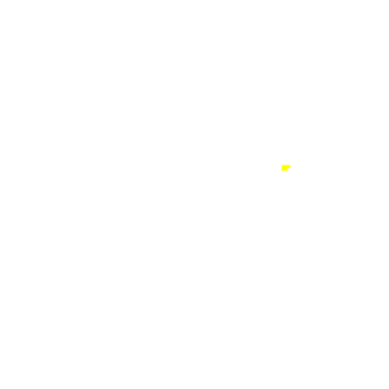

Processing image 270/1511


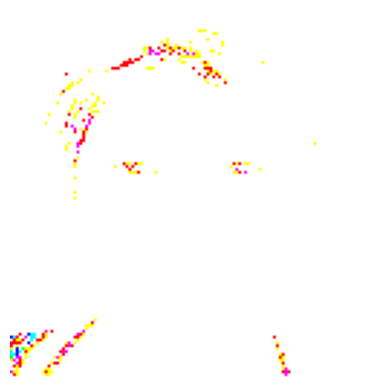

Processing image 271/1511


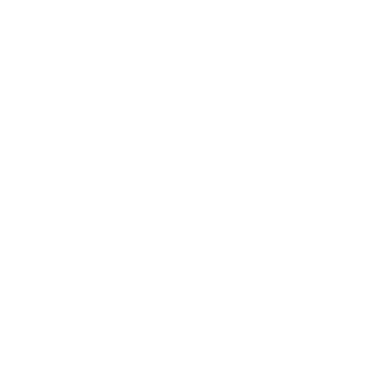

Processing image 272/1511


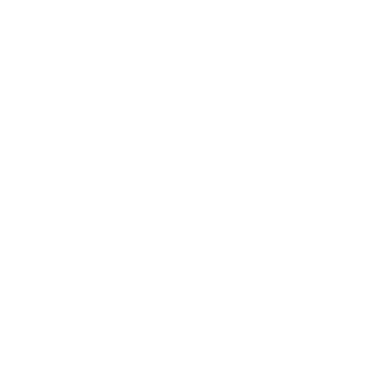

Processing image 273/1511


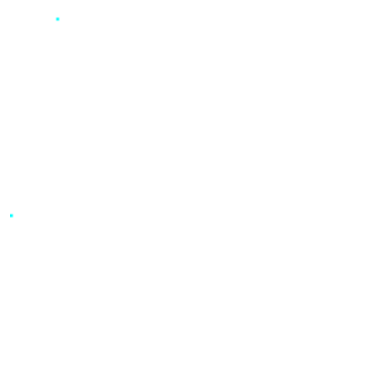

Processing image 274/1511


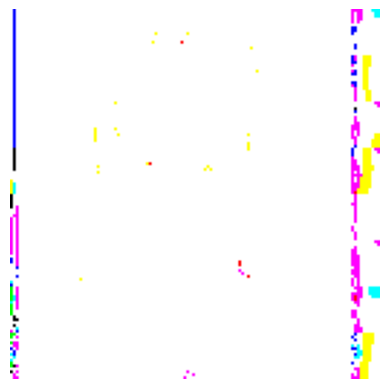

Processing image 275/1511


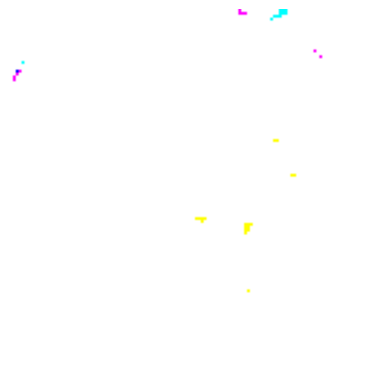

Processing image 276/1511


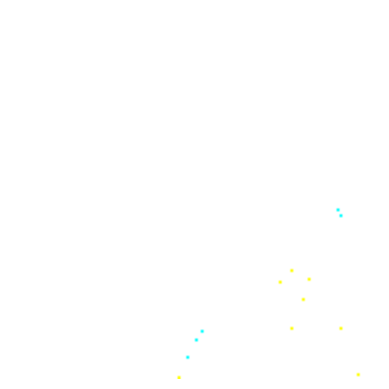

Processing image 277/1511


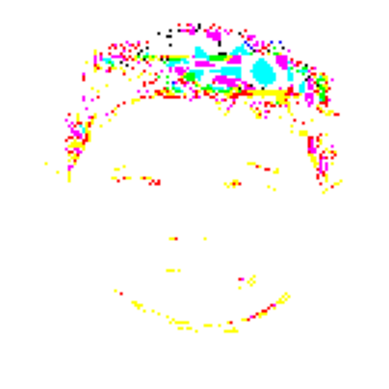

Processing image 278/1511


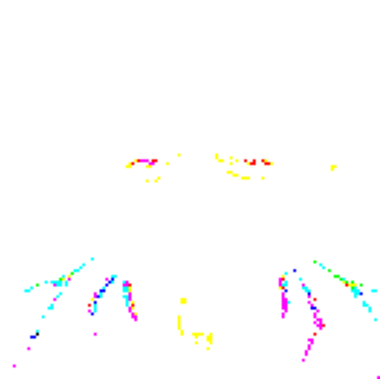

Processing image 279/1511


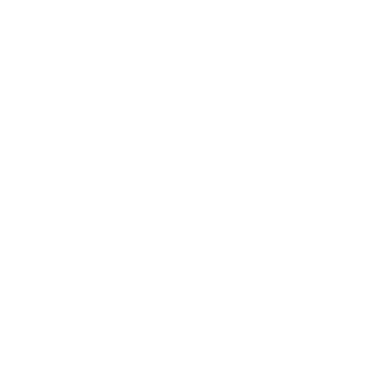

Processing image 280/1511


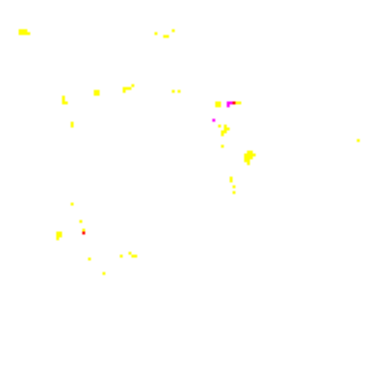

Processing image 281/1511


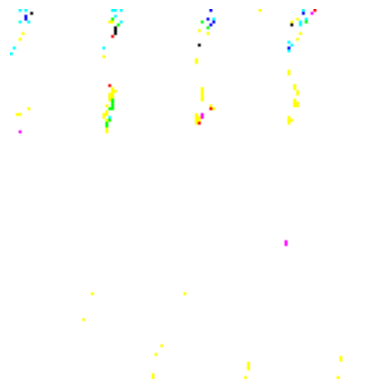

Processing image 282/1511


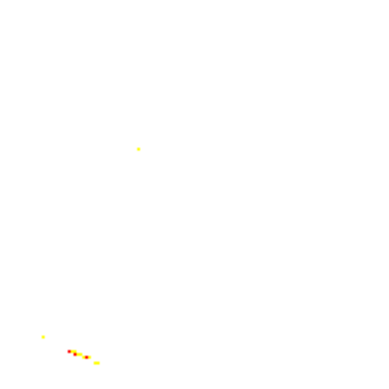

Processing image 283/1511


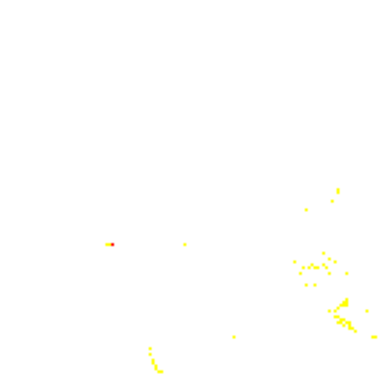

Processing image 284/1511


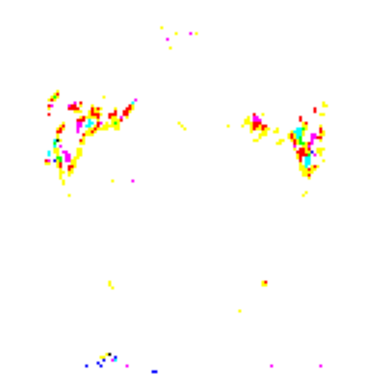

Processing image 285/1511


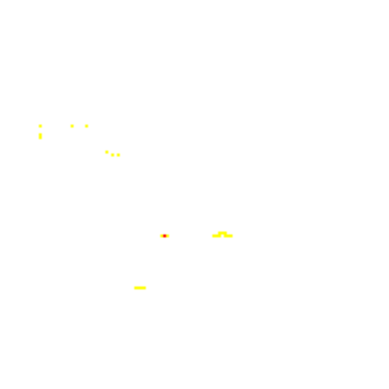

Processing image 286/1511


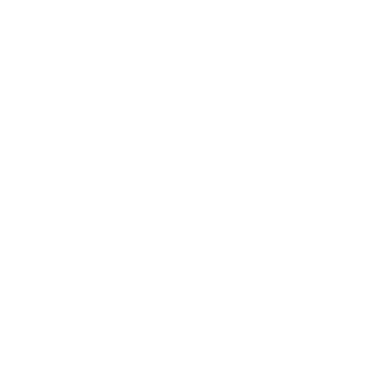

Processing image 287/1511


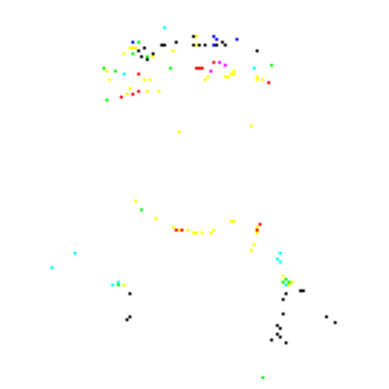

Processing image 288/1511


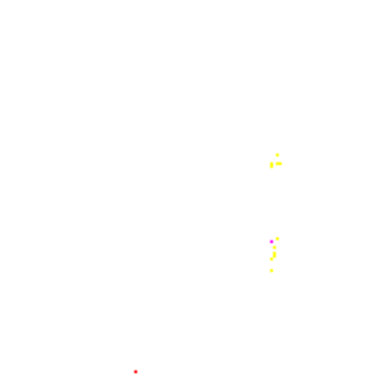

Processing image 289/1511


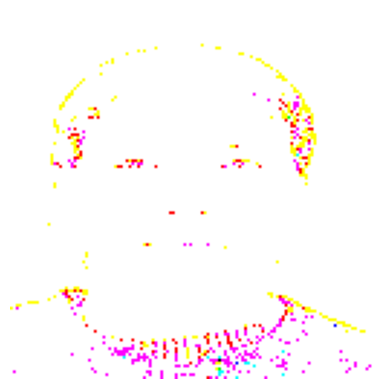

Processing image 290/1511


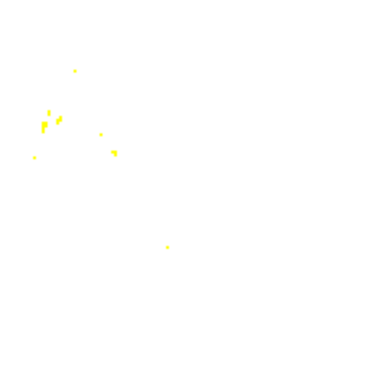

Processing image 291/1511


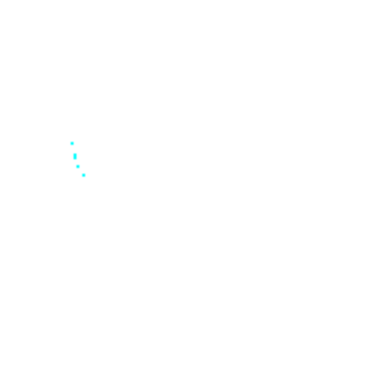

Processing image 292/1511


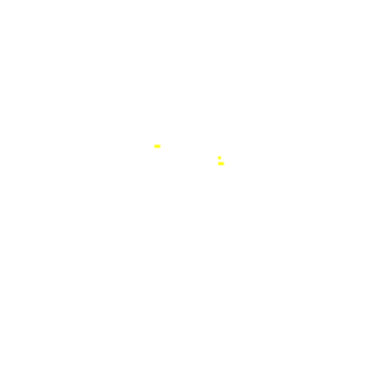

Processing image 293/1511


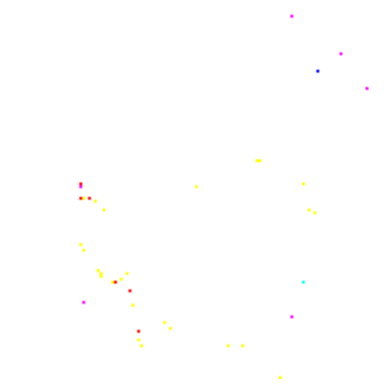

Processing image 294/1511


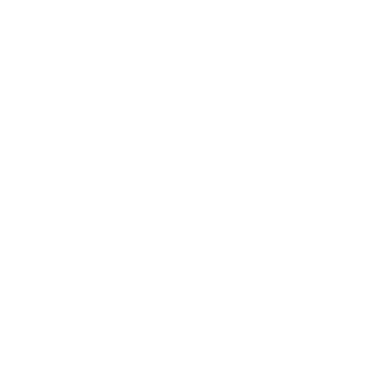

Processing image 295/1511


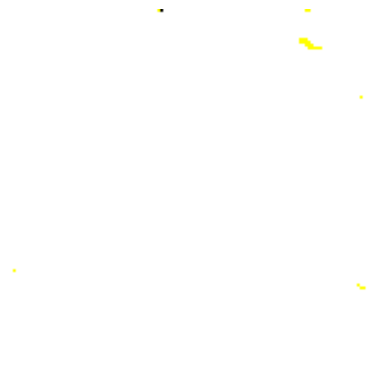

Processing image 296/1511


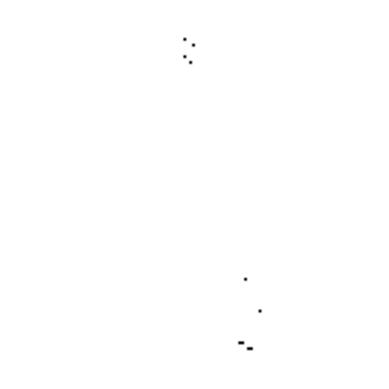

Processing image 297/1511


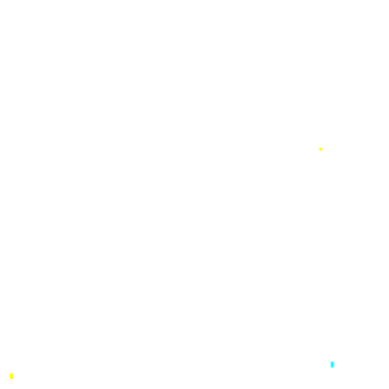

Processing image 298/1511


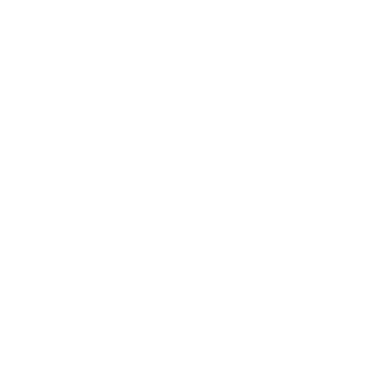

Processing image 299/1511


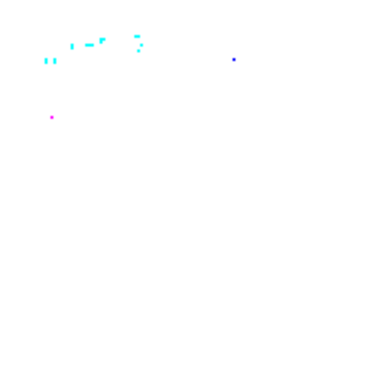

Processing image 300/1511


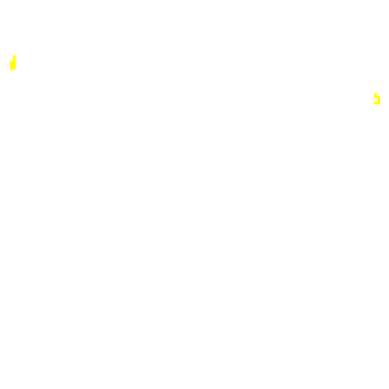

Processing image 301/1511


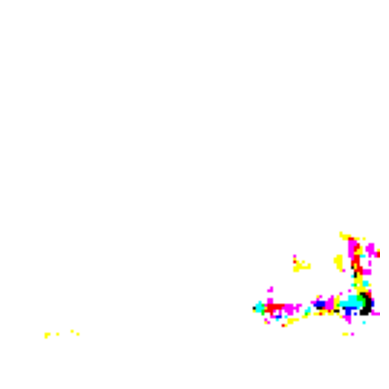

Processing image 302/1511


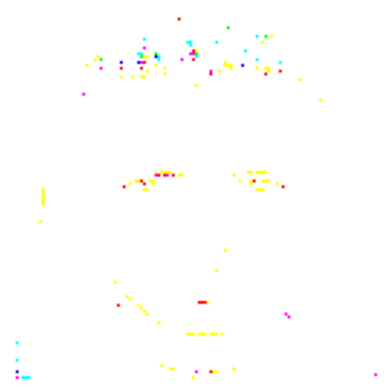

Processing image 303/1511


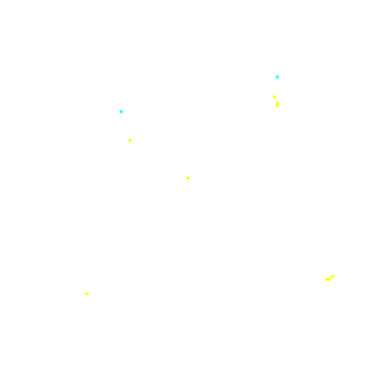

Processing image 304/1511


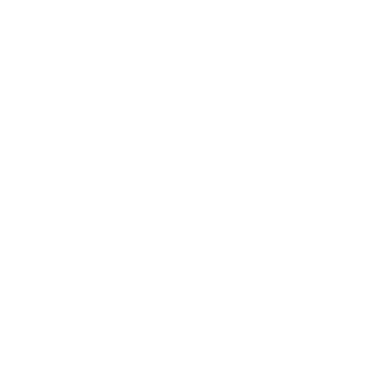

Processing image 305/1511


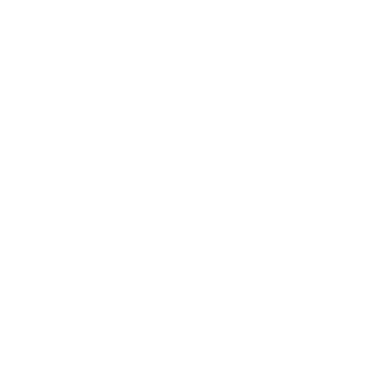

Processing image 306/1511


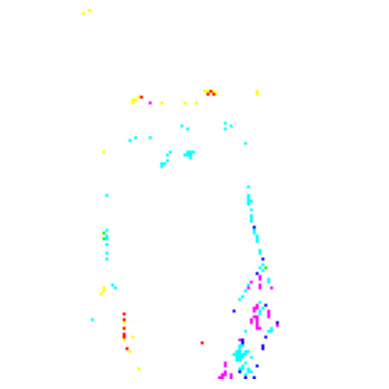

Processing image 307/1511


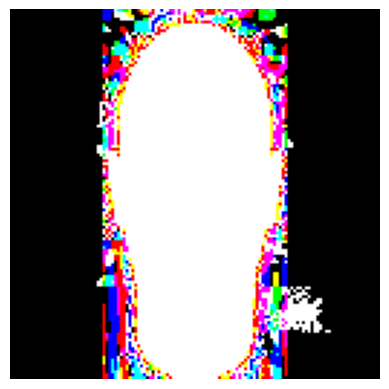

Processing image 308/1511


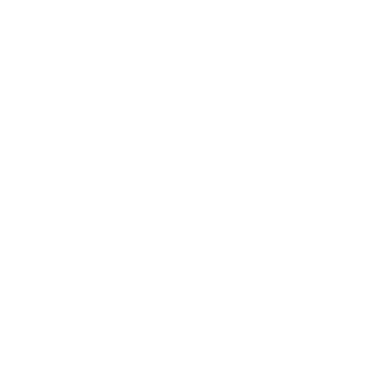

Processing image 309/1511


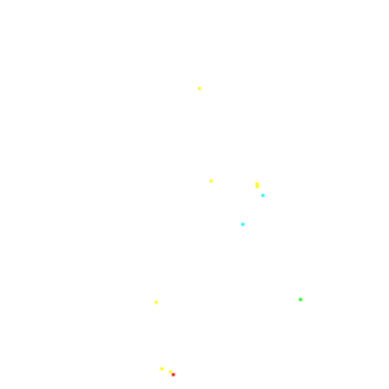

Processing image 310/1511


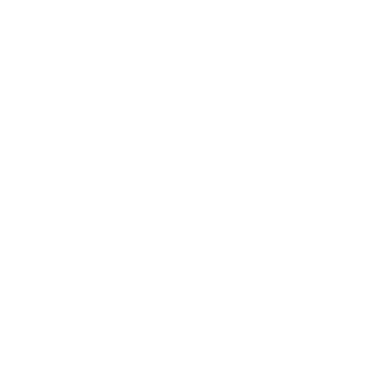

Processing image 311/1511


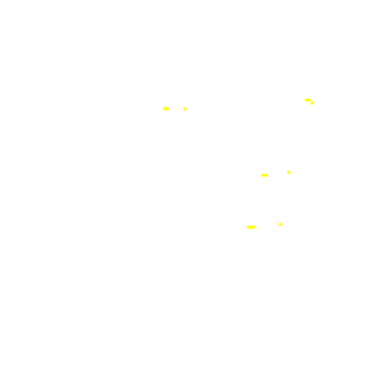

Processing image 312/1511


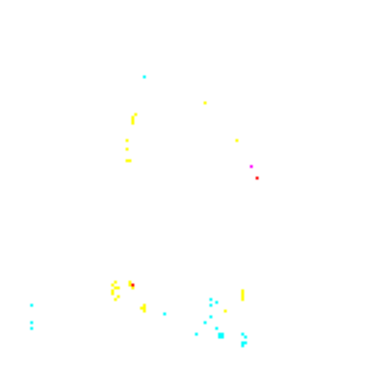

Processing image 313/1511


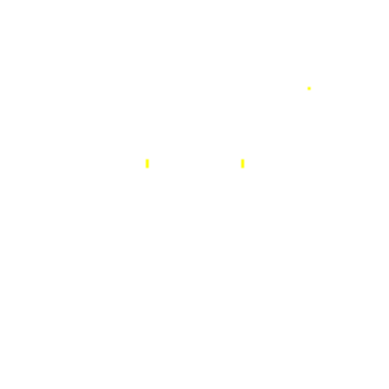

Processing image 314/1511


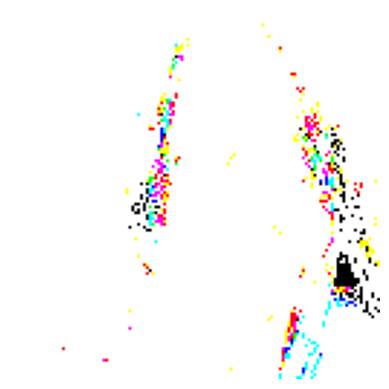

Processing image 315/1511


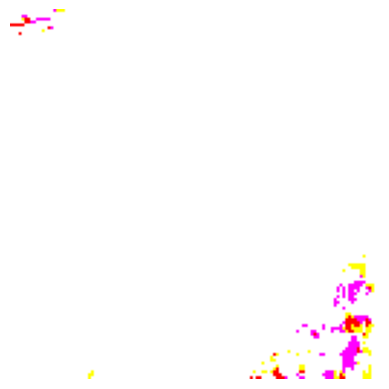

Processing image 316/1511


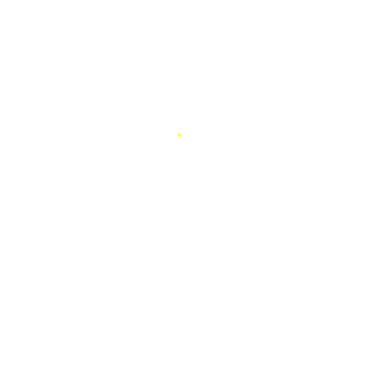

Processing image 317/1511


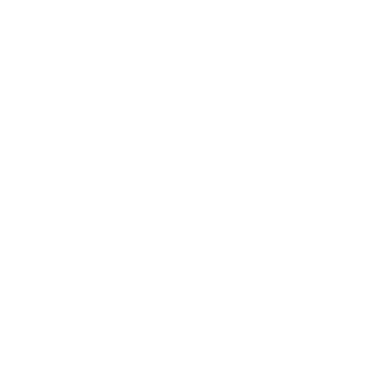

Processing image 318/1511


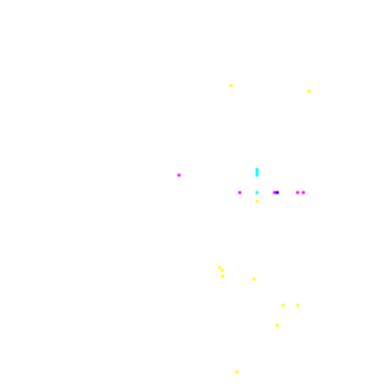

Processing image 319/1511


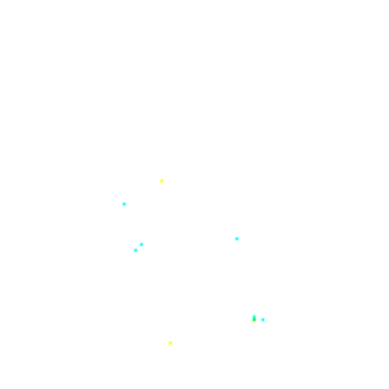

Processing image 320/1511


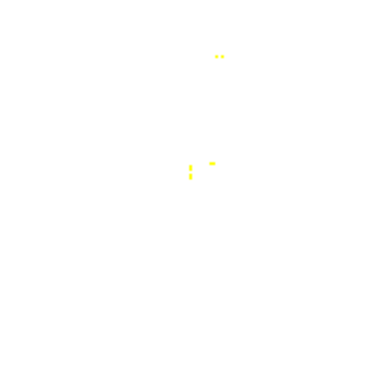

Processing image 321/1511


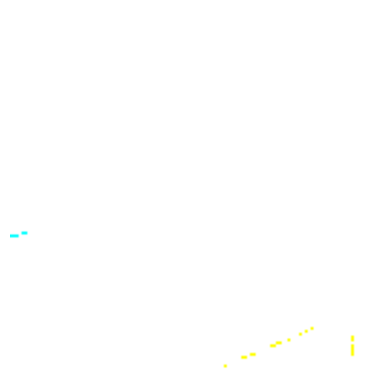

Processing image 322/1511


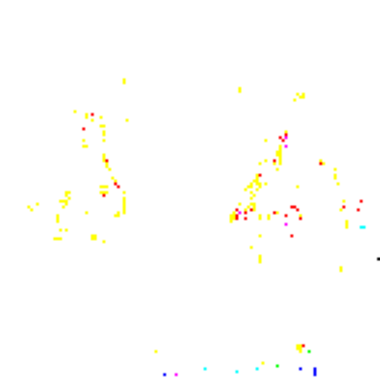

Processing image 323/1511


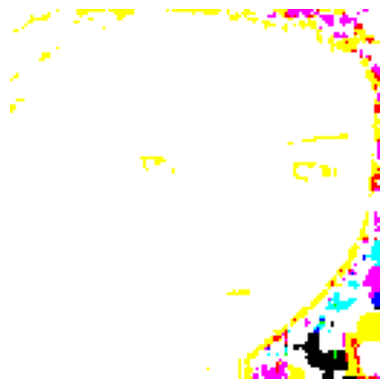

Processing image 324/1511


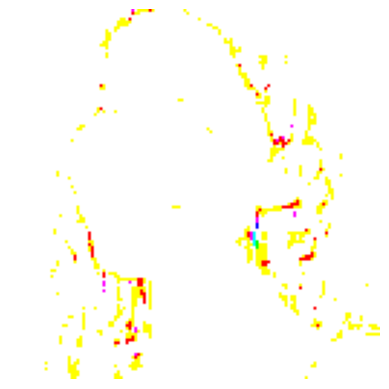

Processing image 325/1511


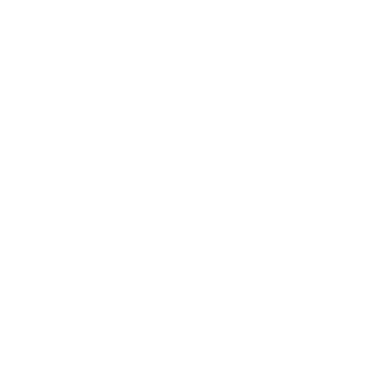

Processing image 326/1511


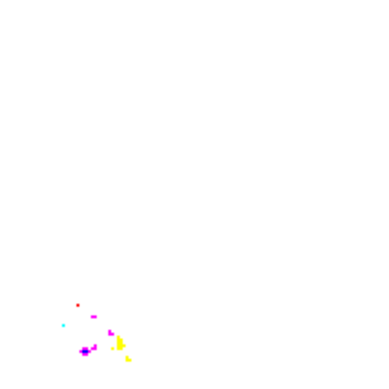

Processing image 327/1511


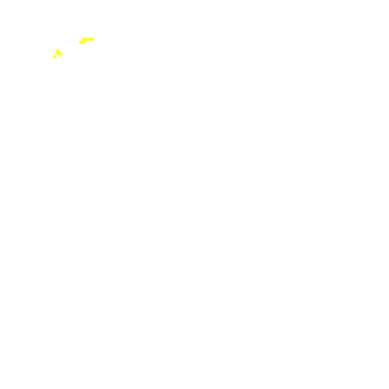

Processing image 328/1511


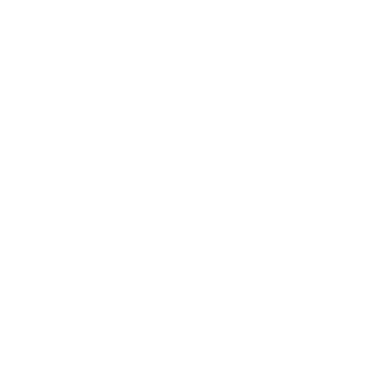

Processing image 329/1511


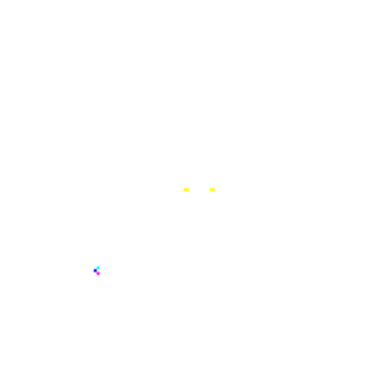

Processing image 330/1511


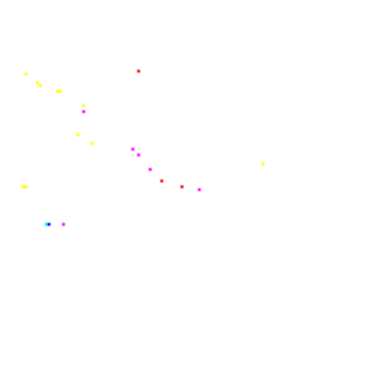

Processing image 331/1511


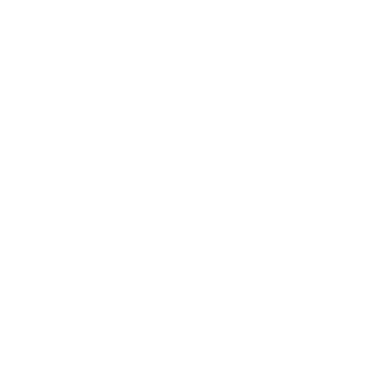

Processing image 332/1511


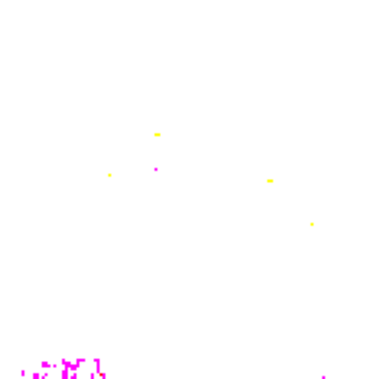

Processing image 333/1511


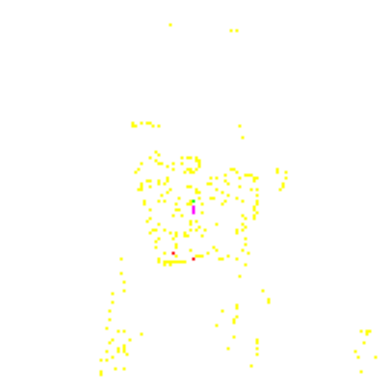

Processing image 334/1511


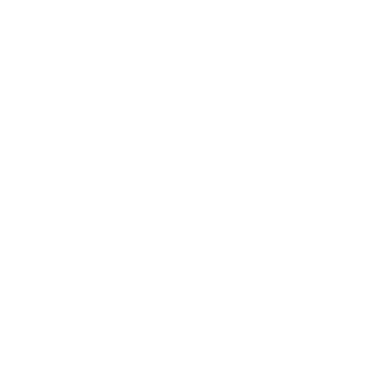

Processing image 335/1511


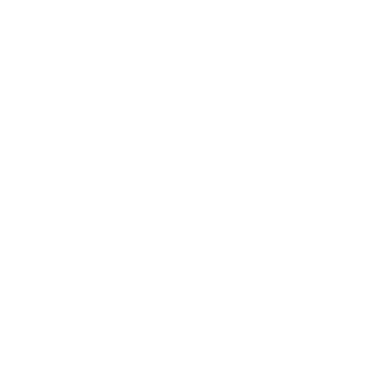

Processing image 336/1511


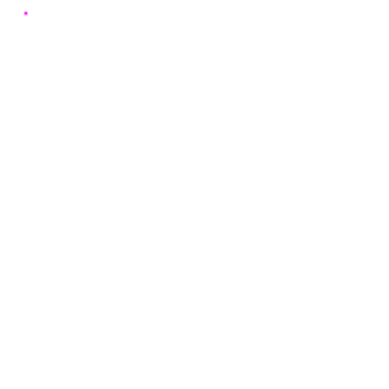

Processing image 337/1511


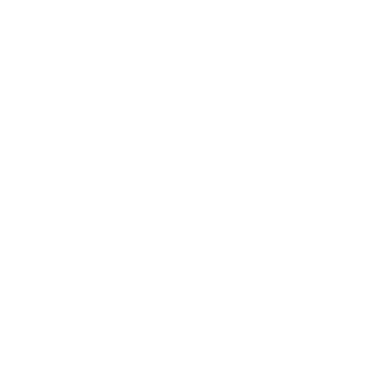

Processing image 338/1511


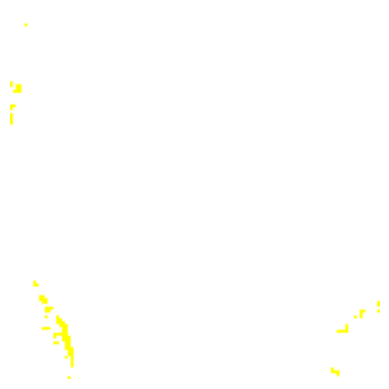

Processing image 339/1511


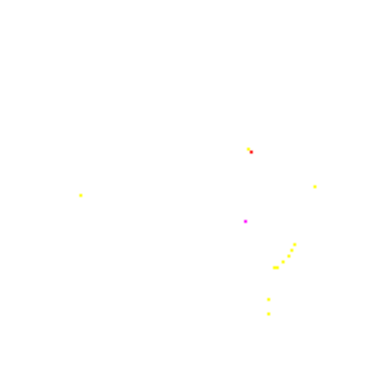

Processing image 340/1511


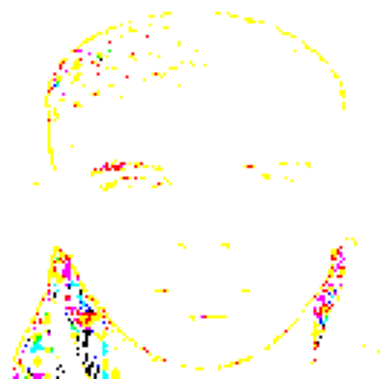

Processing image 341/1511


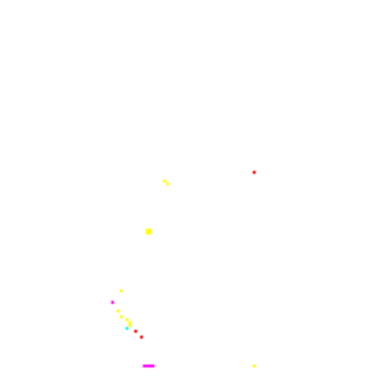

Processing image 342/1511


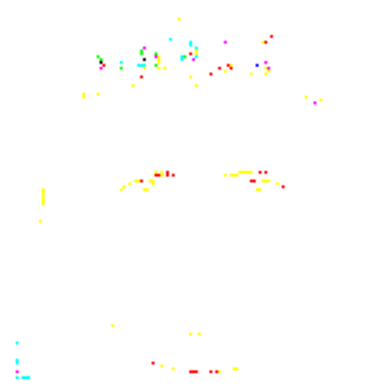

Processing image 343/1511


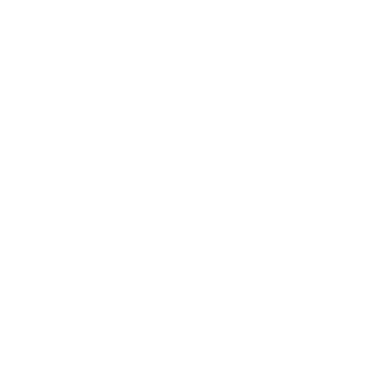

Processing image 344/1511


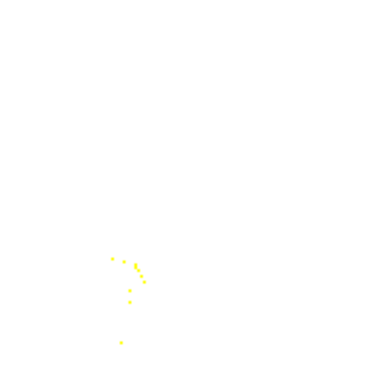

Processing image 345/1511


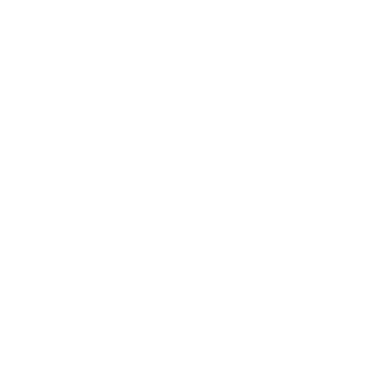

Processing image 346/1511


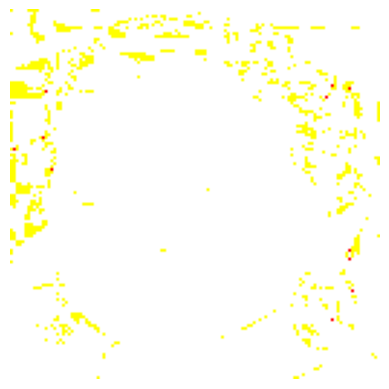

Processing image 347/1511


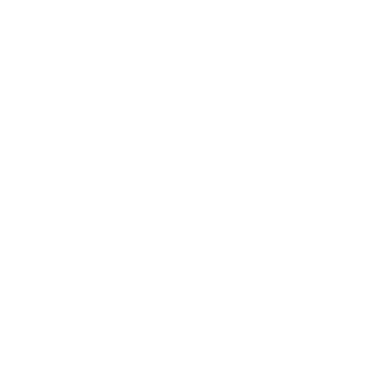

Processing image 348/1511


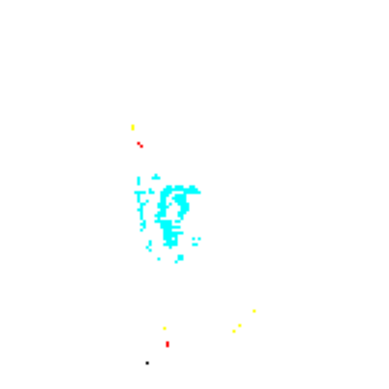

Processing image 349/1511


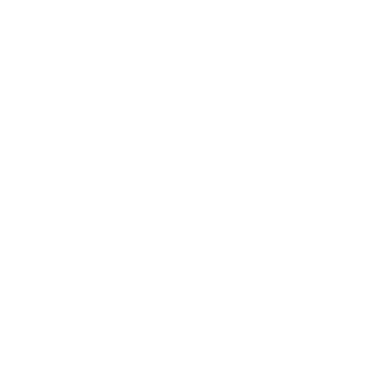

Processing image 350/1511


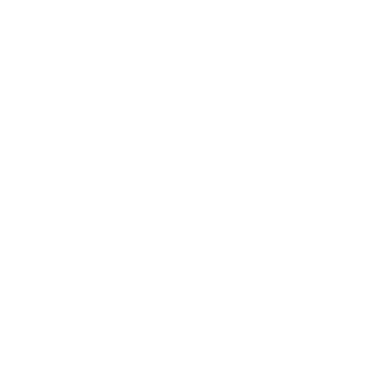

Processing image 351/1511


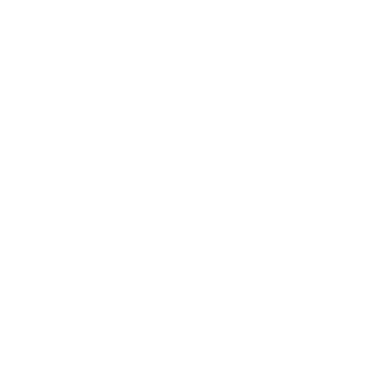

Processing image 352/1511


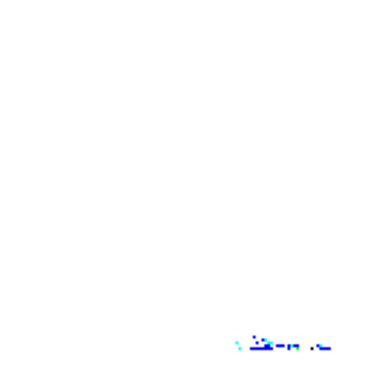

Processing image 353/1511


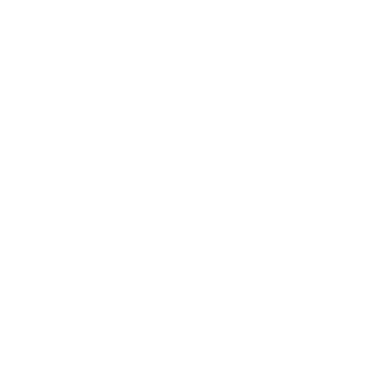

Processing image 354/1511


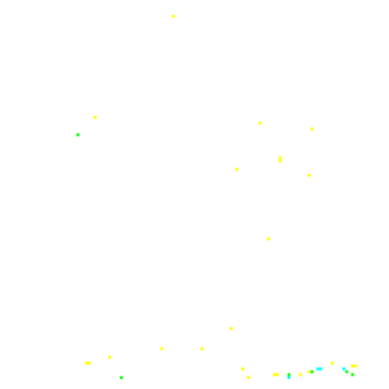

Processing image 355/1511


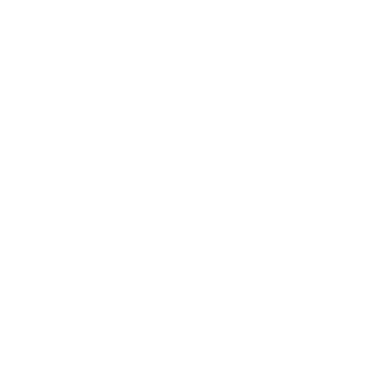

Processing image 356/1511


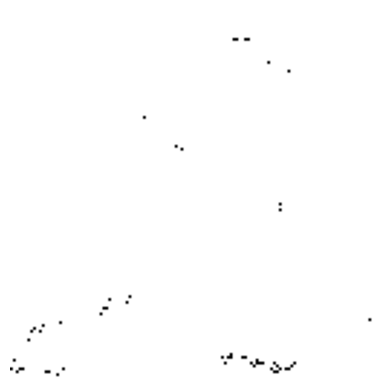

Processing image 357/1511


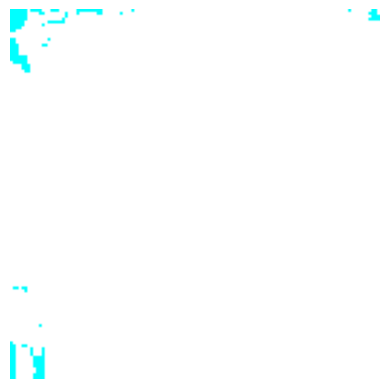

Processing image 358/1511


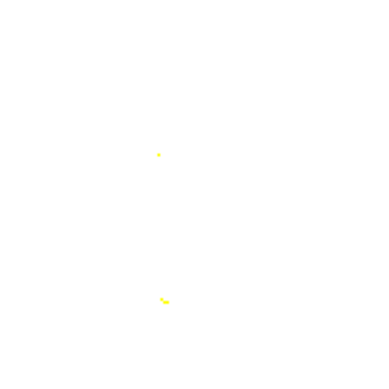

Processing image 359/1511


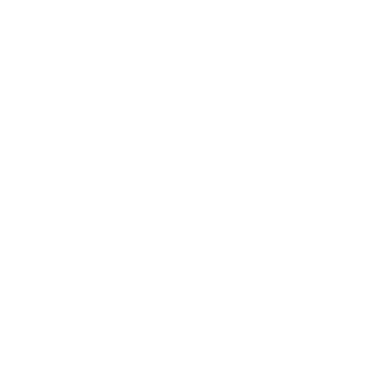

Processing image 360/1511


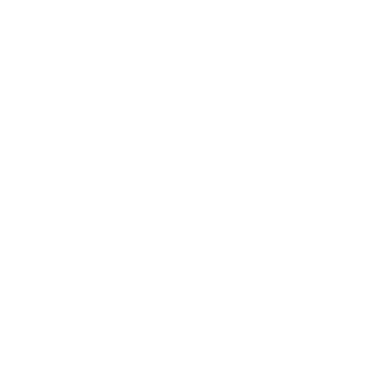

Processing image 361/1511


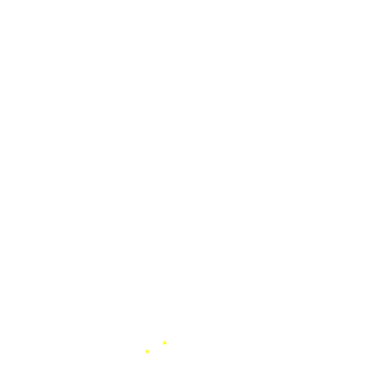

Processing image 362/1511


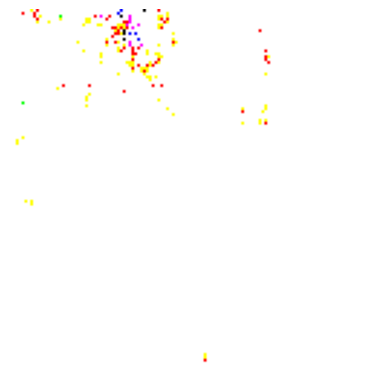

Processing image 363/1511


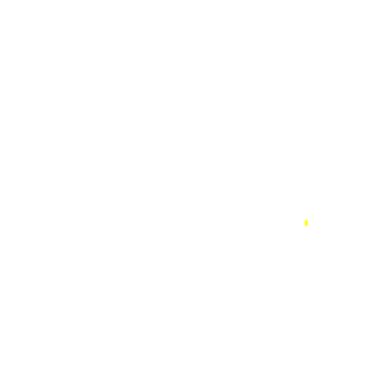

Processing image 364/1511


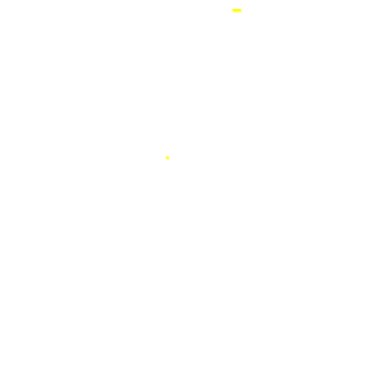

Processing image 365/1511


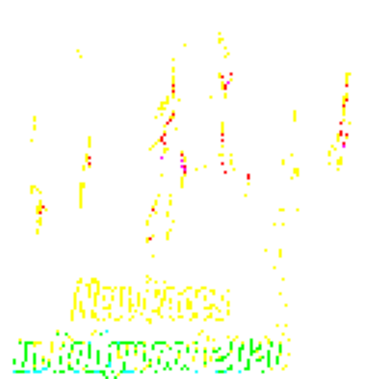

Processing image 366/1511


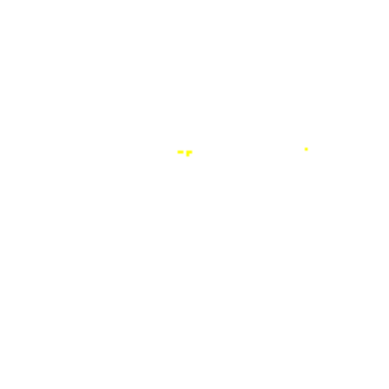

Processing image 367/1511


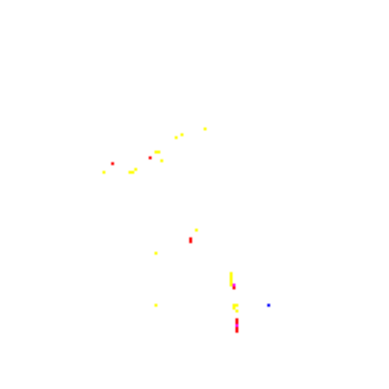

Processing image 368/1511


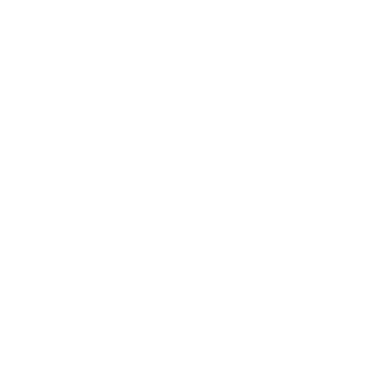

Processing image 369/1511


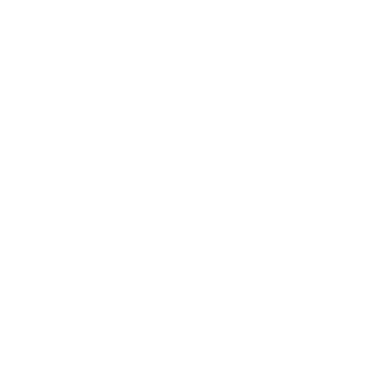

Processing image 370/1511


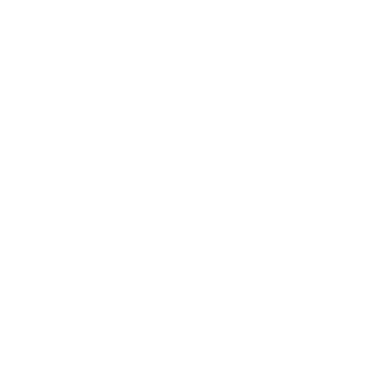

Processing image 371/1511


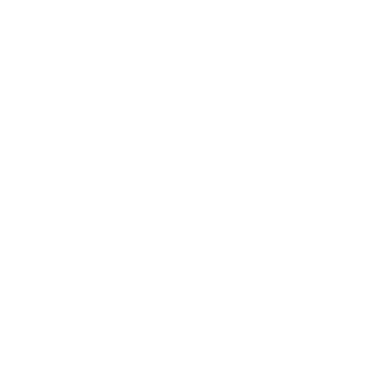

Processing image 372/1511


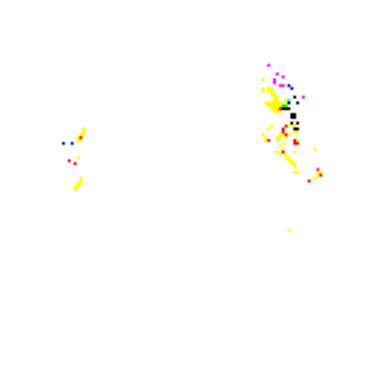

Processing image 373/1511


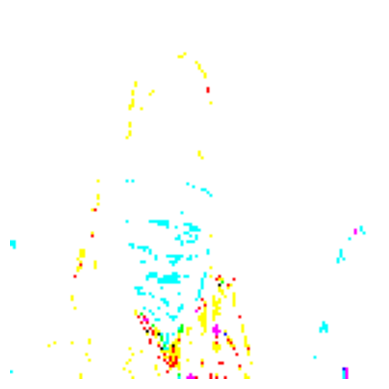

Processing image 374/1511


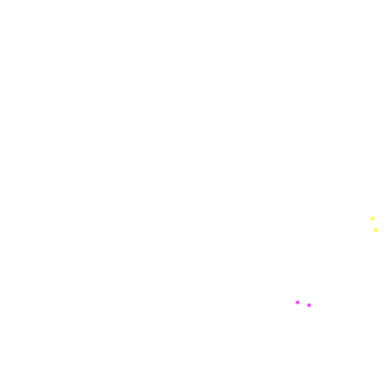

Processing image 375/1511


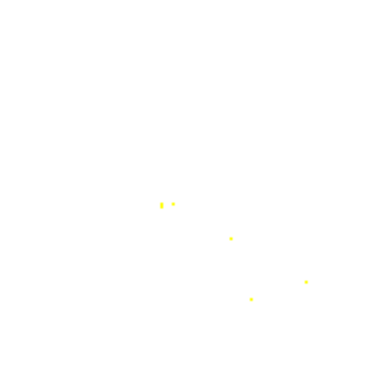

Processing image 376/1511


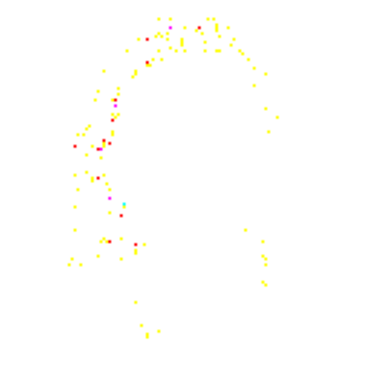

Processing image 377/1511


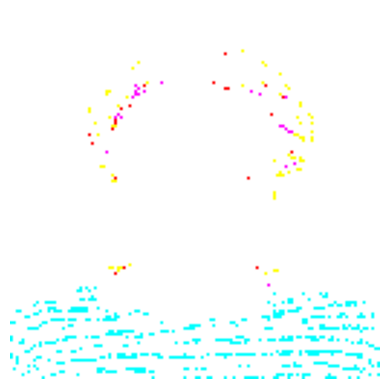

Processing image 378/1511


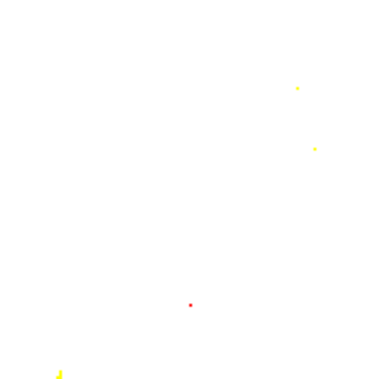

Processing image 379/1511


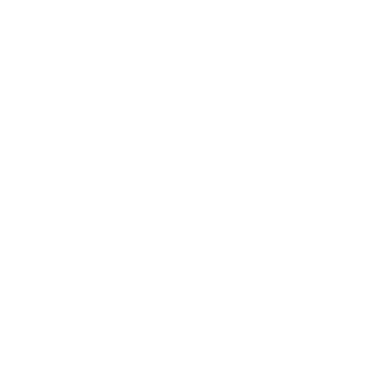

Processing image 380/1511


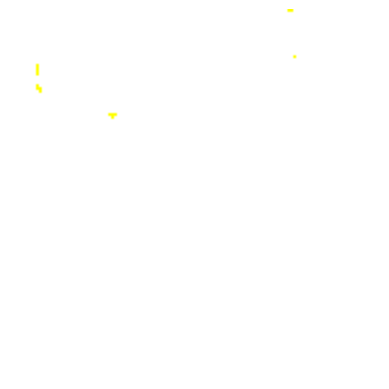

Processing image 381/1511


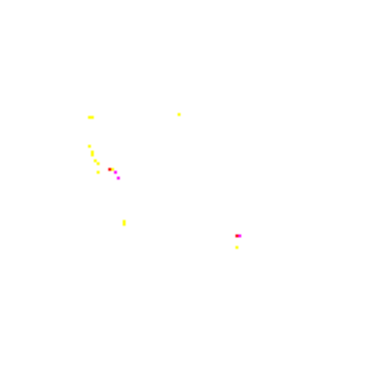

Processing image 382/1511


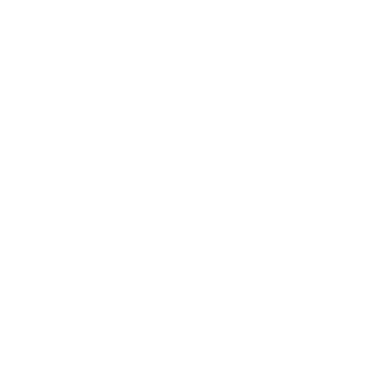

Processing image 383/1511


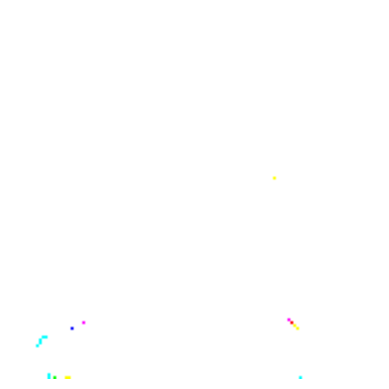

Processing image 384/1511


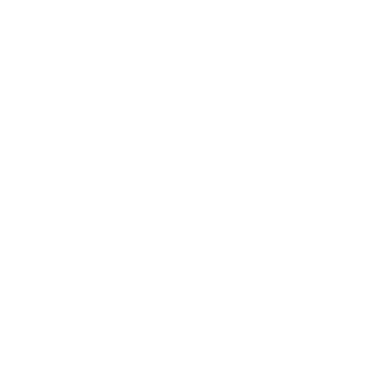

Processing image 385/1511


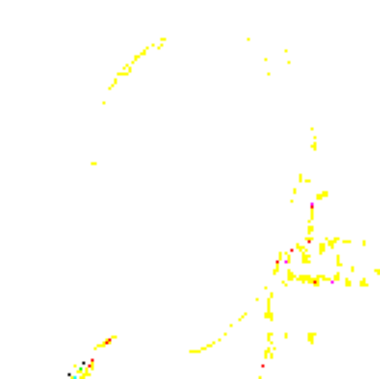

Processing image 386/1511


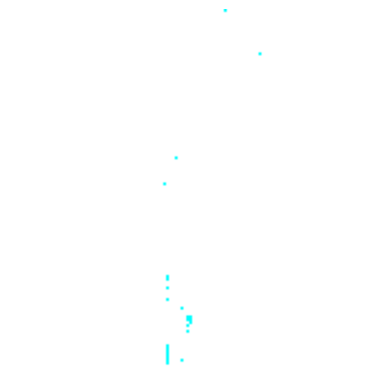

Processing image 387/1511


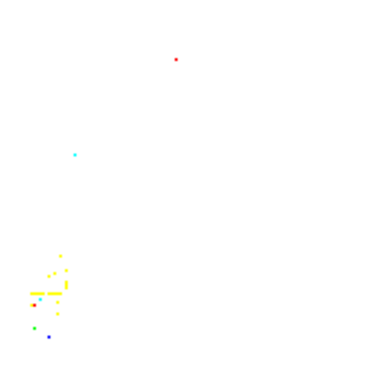

Processing image 388/1511


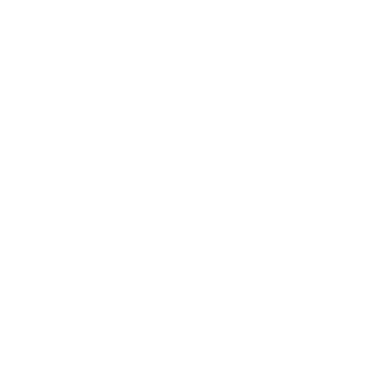

Processing image 389/1511


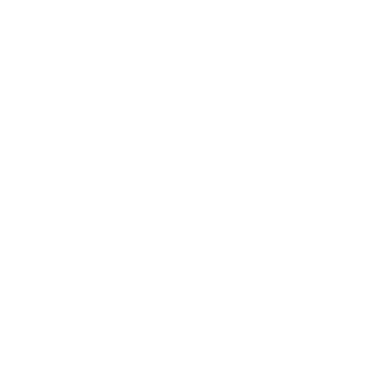

Processing image 390/1511


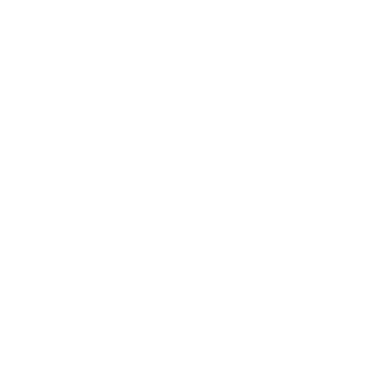

Processing image 391/1511


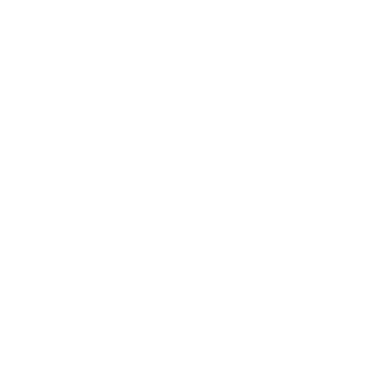

Processing image 392/1511


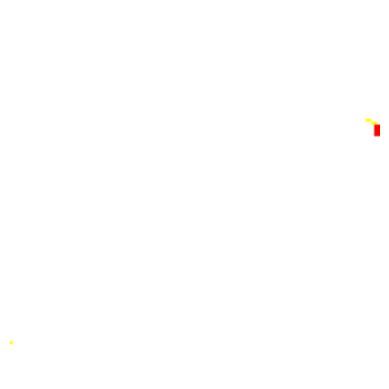

Processing image 393/1511


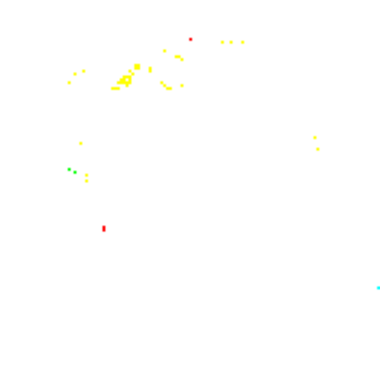

Processing image 394/1511


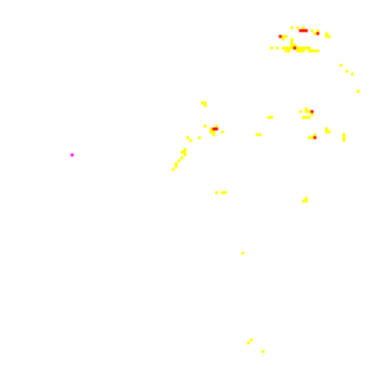

Processing image 395/1511


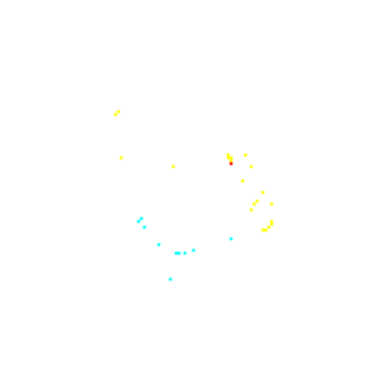

Processing image 396/1511


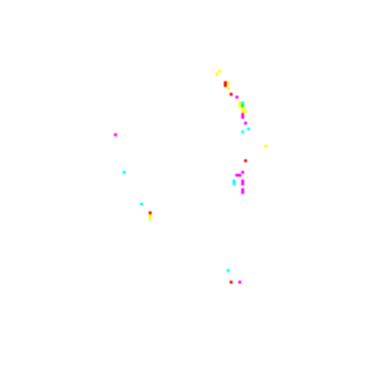

Processing image 397/1511


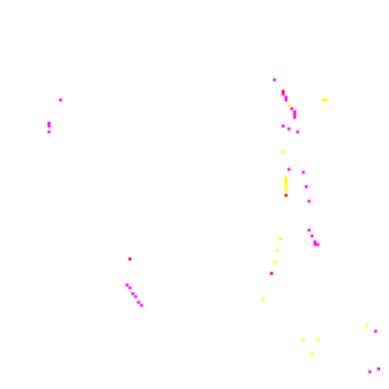

Processing image 398/1511


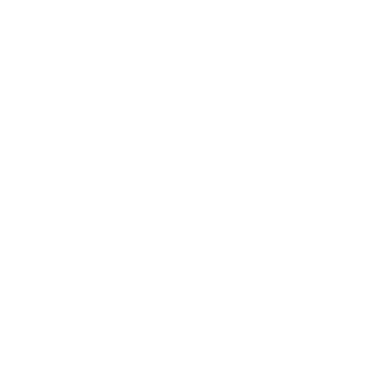

Processing image 399/1511


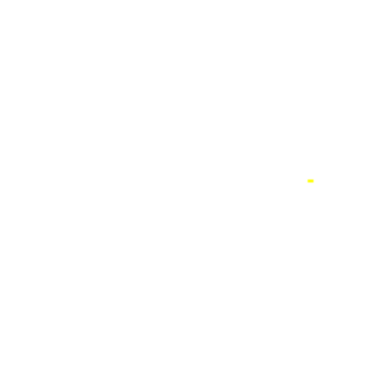

Processing image 400/1511


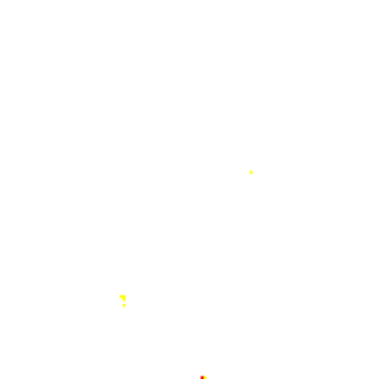

Processing image 401/1511


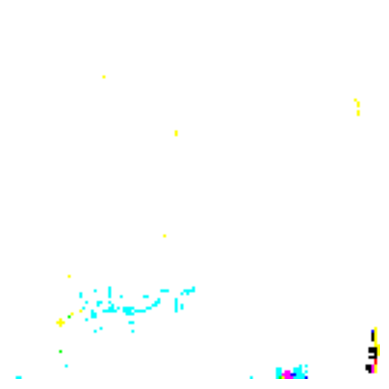

Processing image 402/1511


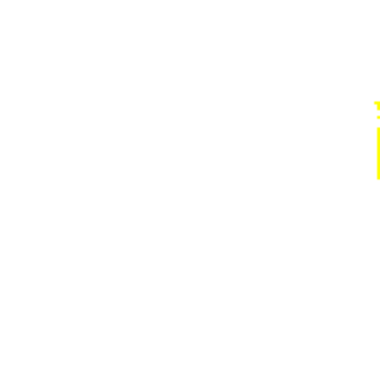

Processing image 403/1511


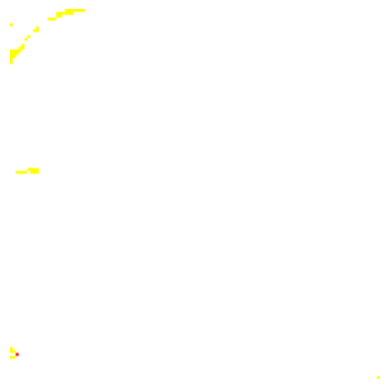

Processing image 404/1511


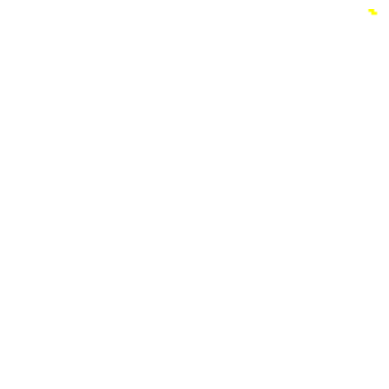

Processing image 405/1511


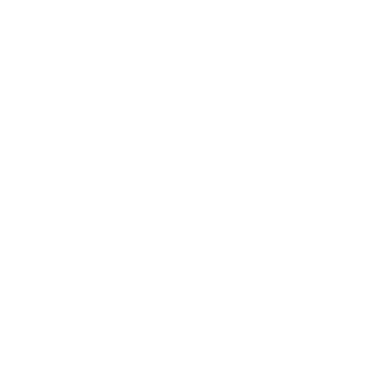

Processing image 406/1511


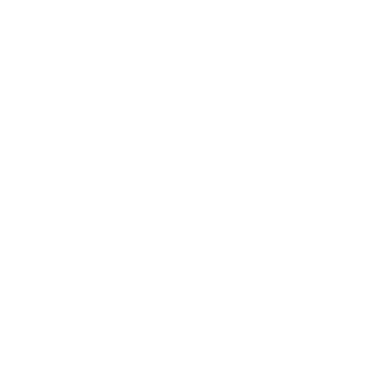

Processing image 407/1511


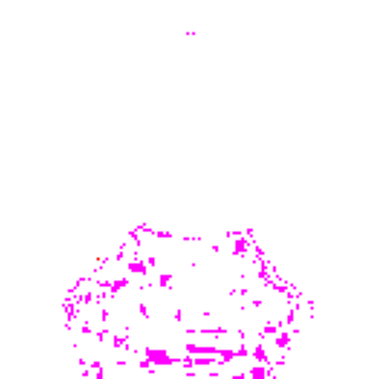

Processing image 408/1511


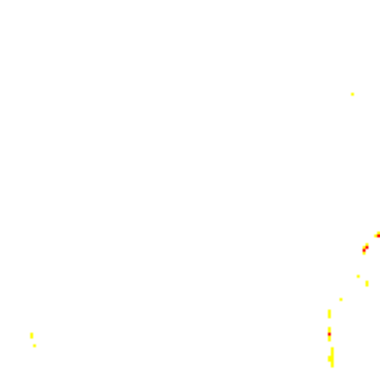

Processing image 409/1511


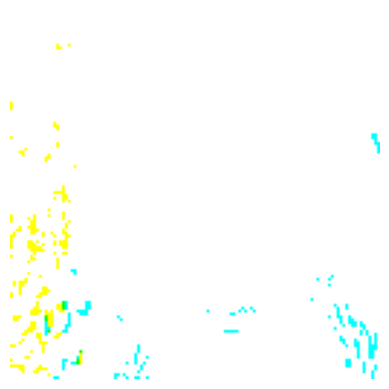

Processing image 410/1511


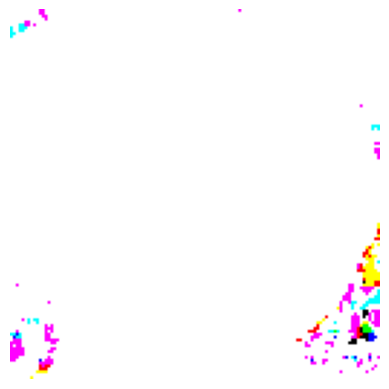

Processing image 411/1511


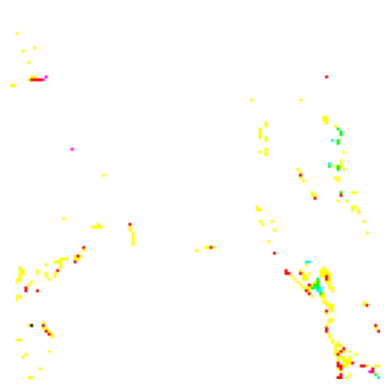

Processing image 412/1511


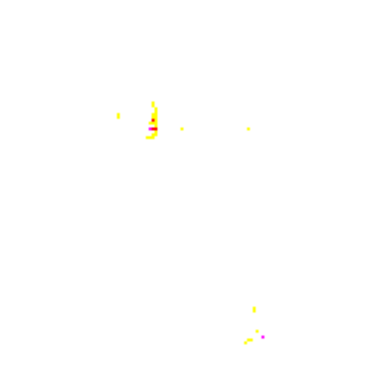

Processing image 413/1511


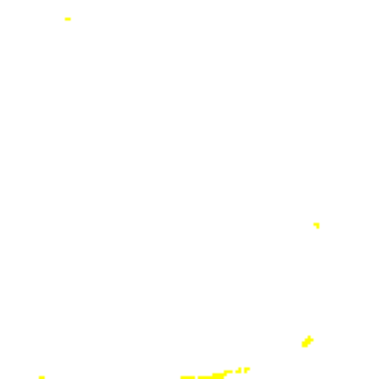

Processing image 414/1511


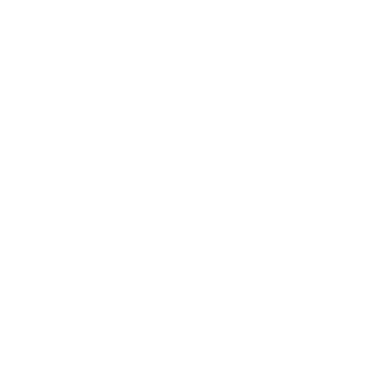

Processing image 415/1511


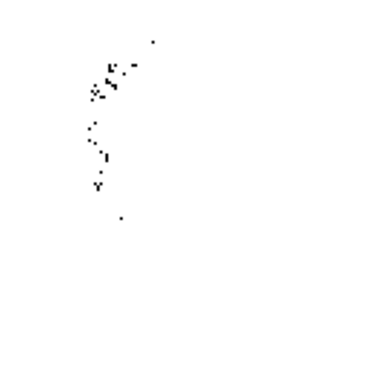

Processing image 416/1511


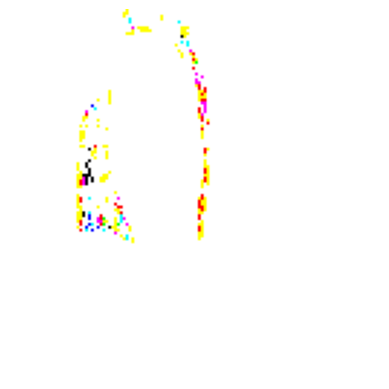

Processing image 417/1511


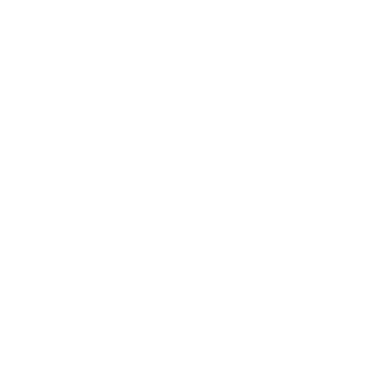

Processing image 418/1511


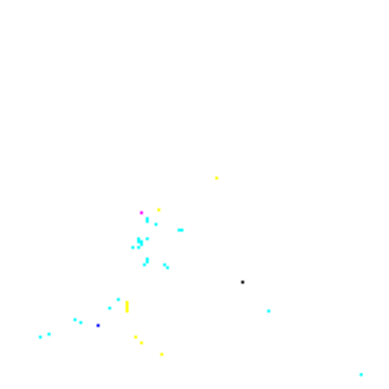

Processing image 419/1511


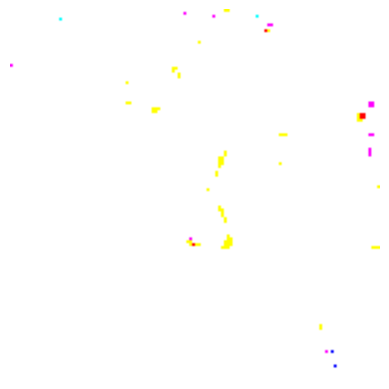

Processing image 420/1511


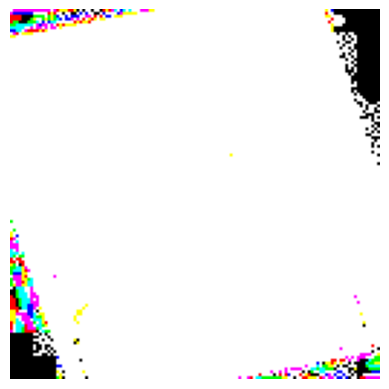

Processing image 421/1511


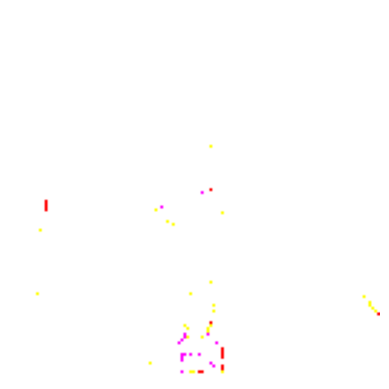

Processing image 422/1511


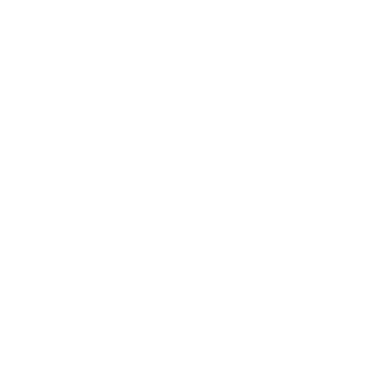

Processing image 423/1511


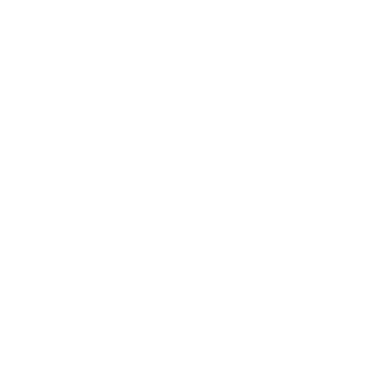

Processing image 424/1511


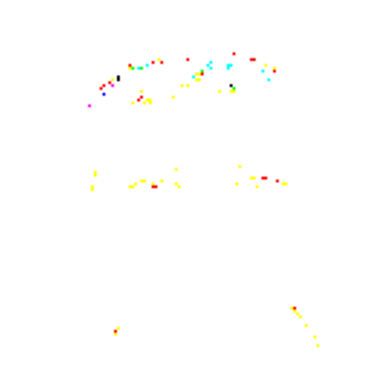

Processing image 425/1511


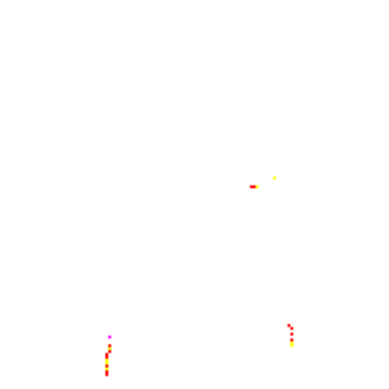

Processing image 426/1511


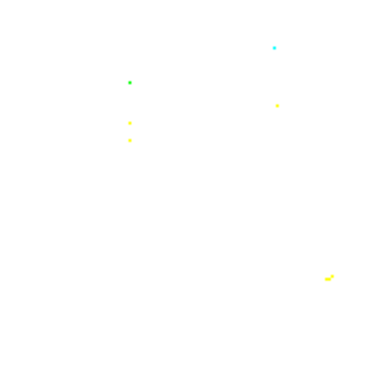

Processing image 427/1511


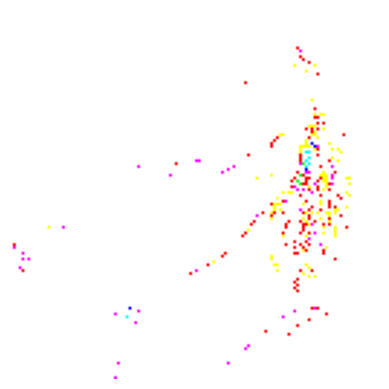

Processing image 428/1511


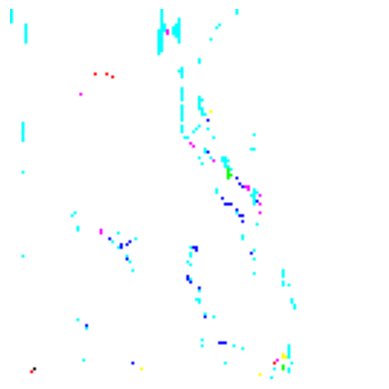

Processing image 429/1511


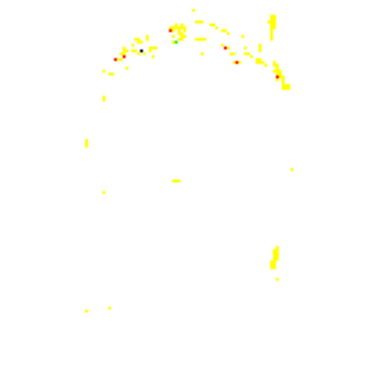

Processing image 430/1511


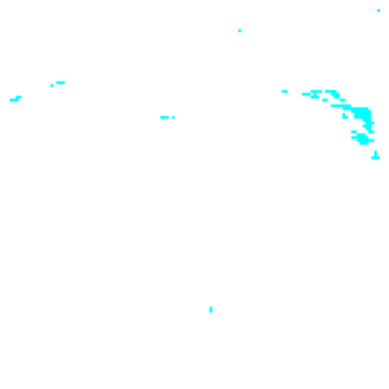

Processing image 431/1511


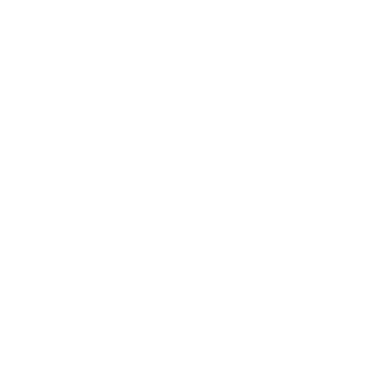

Processing image 432/1511


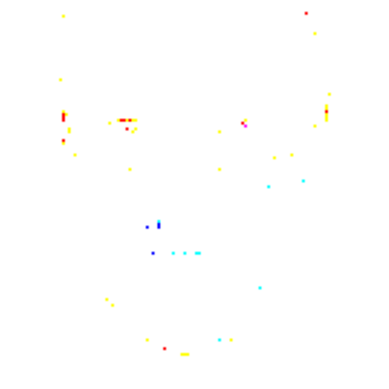

Processing image 433/1511


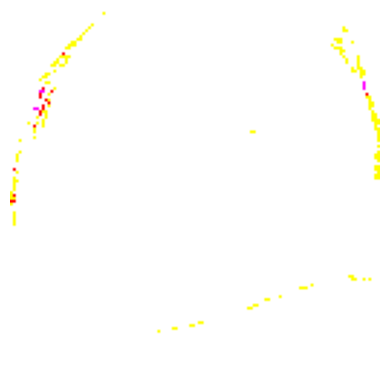

Processing image 434/1511


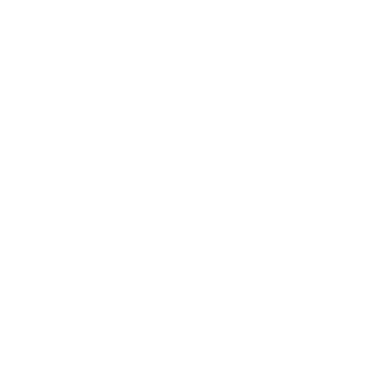

Processing image 435/1511


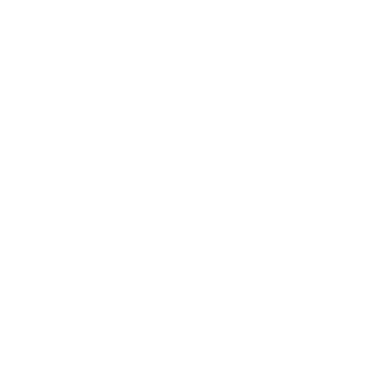

Processing image 436/1511


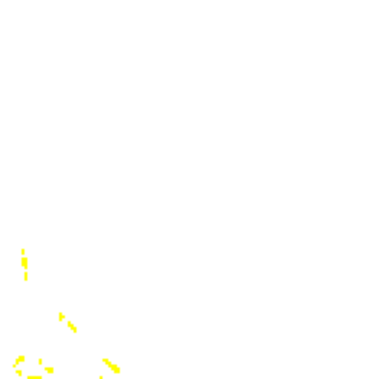

Processing image 437/1511


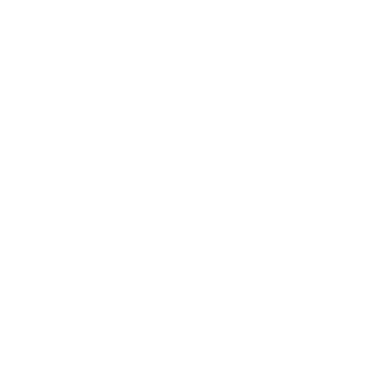

Processing image 438/1511


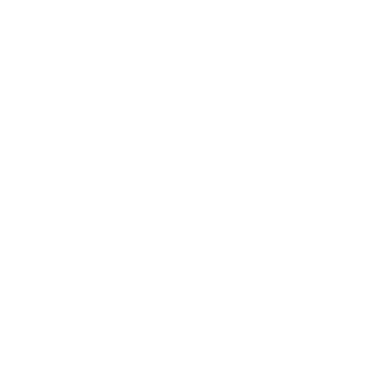

Processing image 439/1511


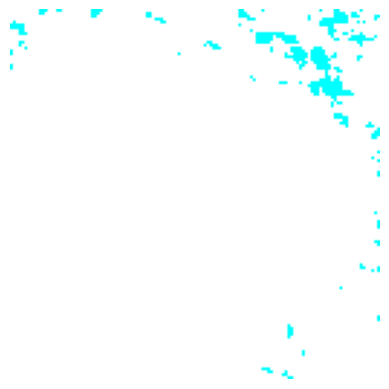

Processing image 440/1511


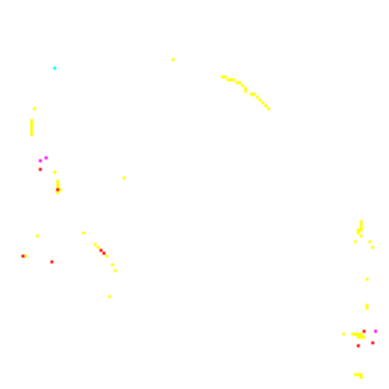

Processing image 441/1511


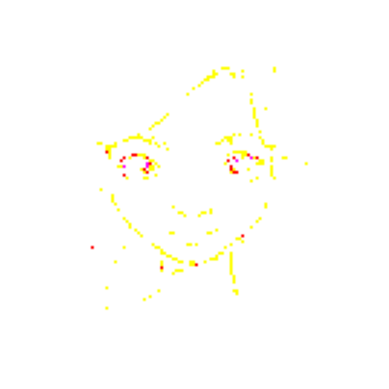

Processing image 442/1511


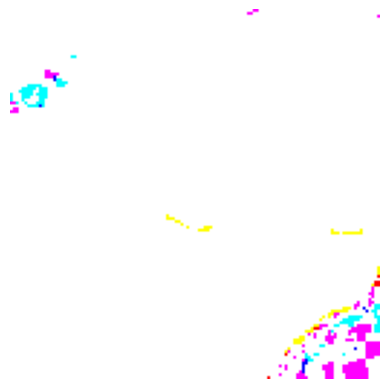

Processing image 443/1511


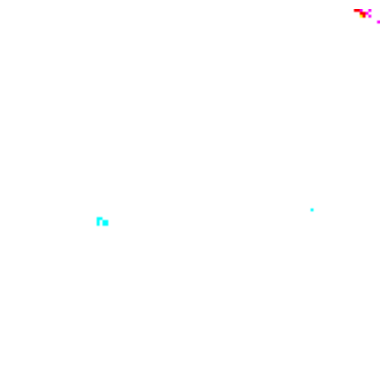

Processing image 444/1511


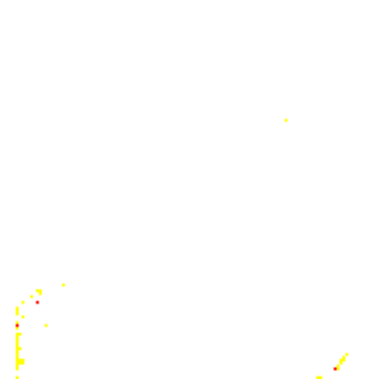

Processing image 445/1511


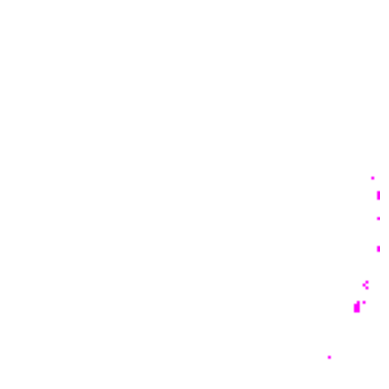

Processing image 446/1511


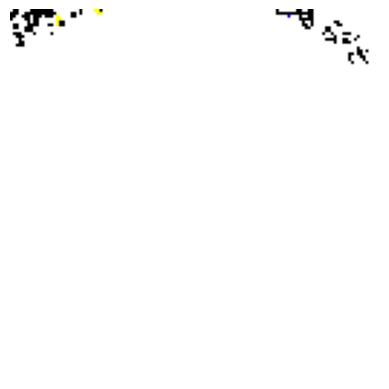

Processing image 447/1511


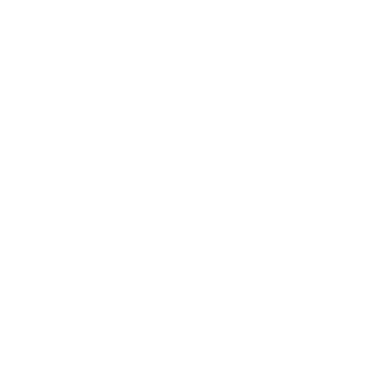

Processing image 448/1511


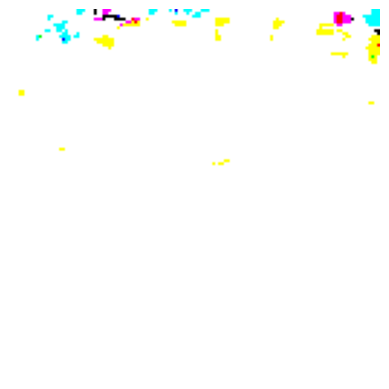

Processing image 449/1511


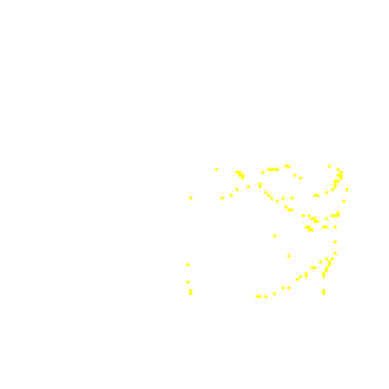

Processing image 450/1511


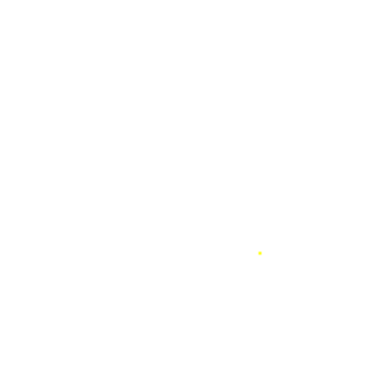

Processing image 451/1511


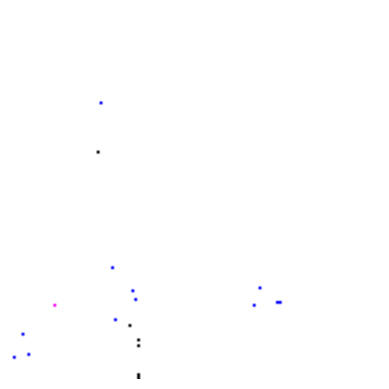

Processing image 452/1511


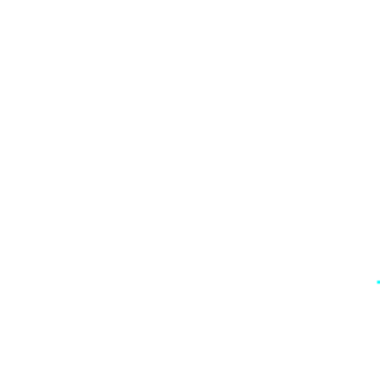

Processing image 453/1511


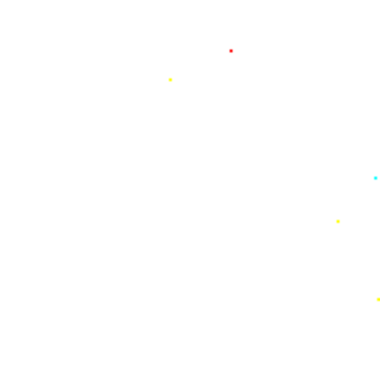

Processing image 454/1511


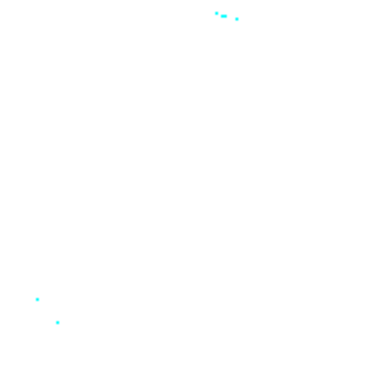

Processing image 455/1511


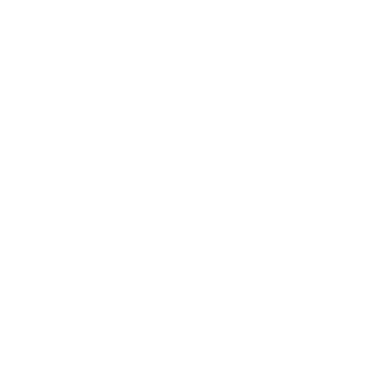

Processing image 456/1511


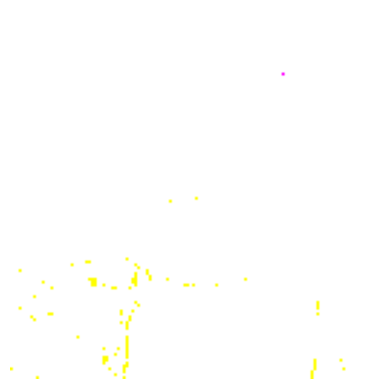

Processing image 457/1511


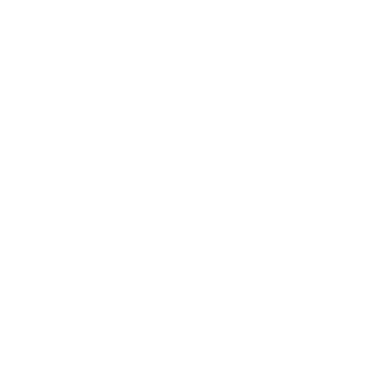

Processing image 458/1511


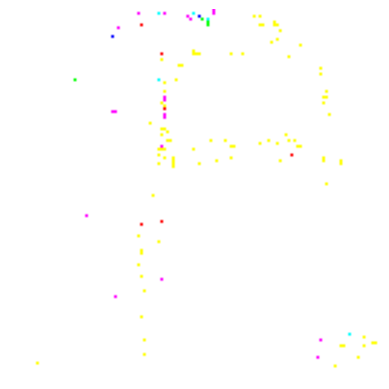

Processing image 459/1511


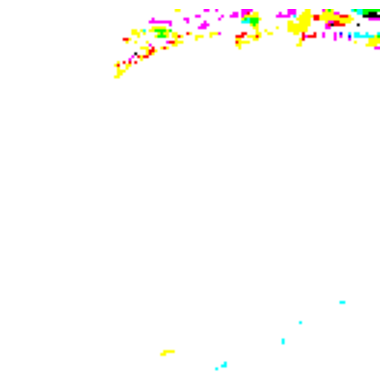

Processing image 460/1511


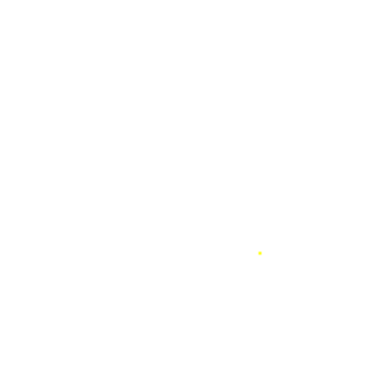

Processing image 461/1511


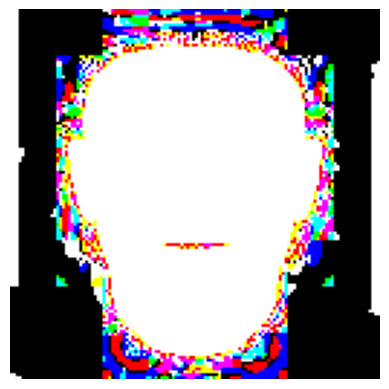

Processing image 462/1511


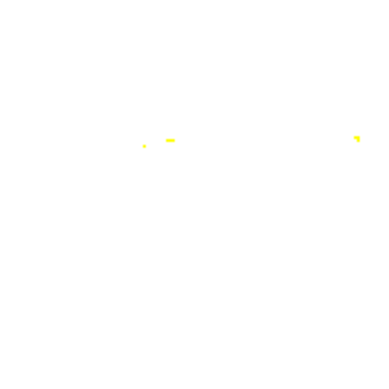

Processing image 463/1511


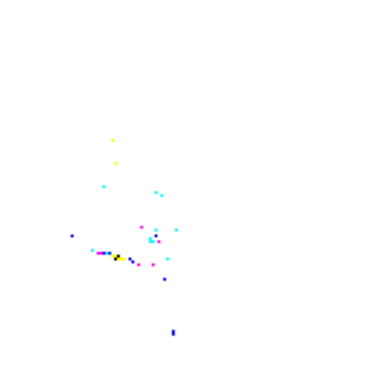

Processing image 464/1511


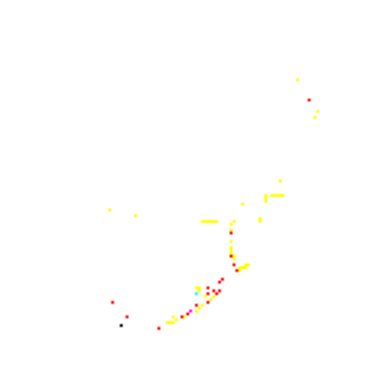

Processing image 465/1511


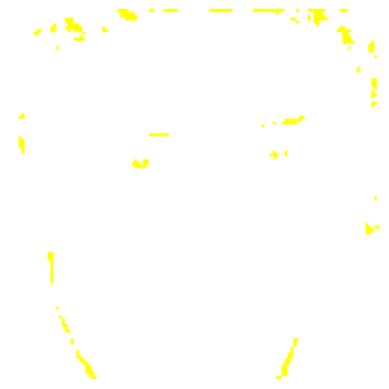

Processing image 466/1511


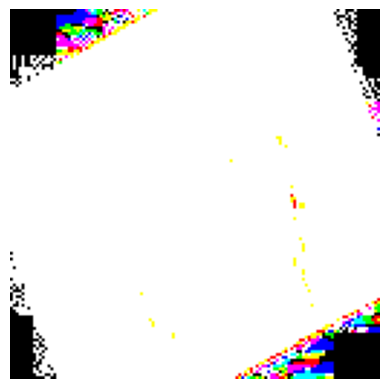

Processing image 467/1511


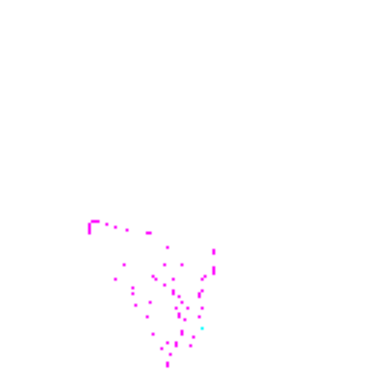

Processing image 468/1511


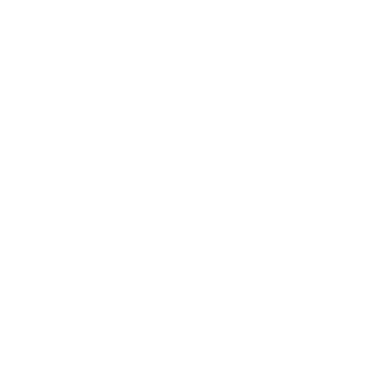

Processing image 469/1511


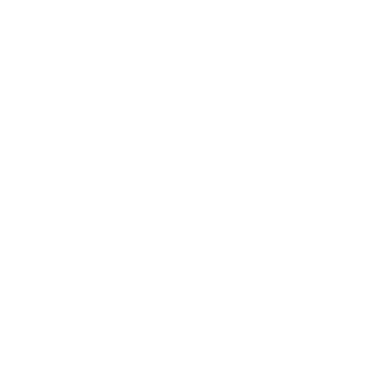

Processing image 470/1511


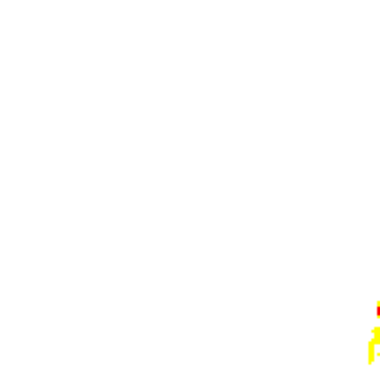

Processing image 471/1511


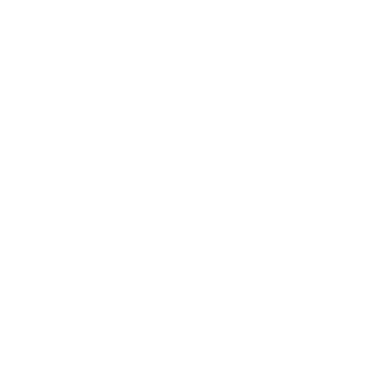

Processing image 472/1511


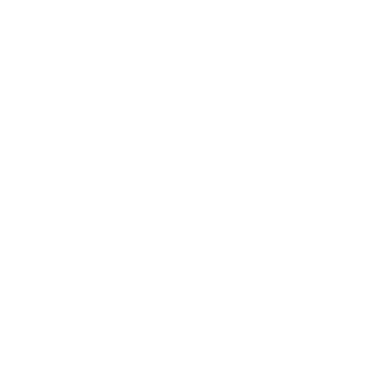

Processing image 473/1511


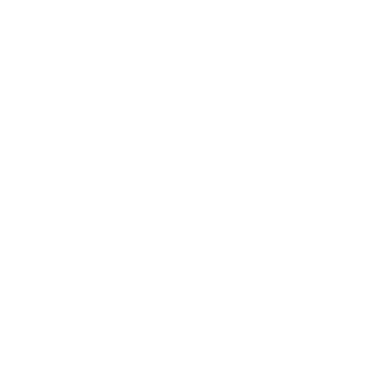

Processing image 474/1511


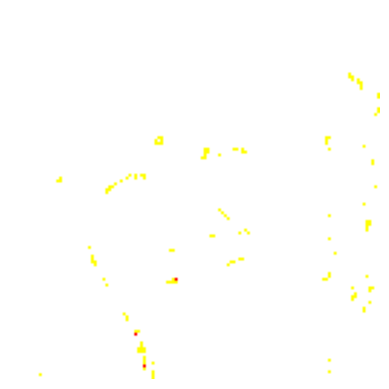

Processing image 475/1511


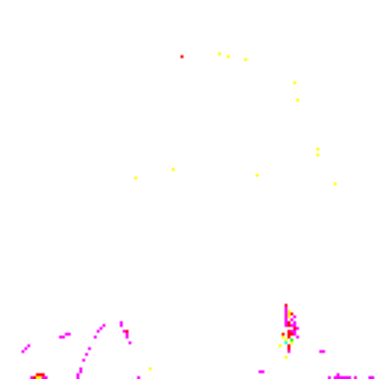

Processing image 476/1511


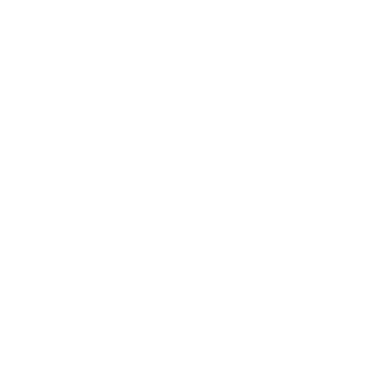

Processing image 477/1511


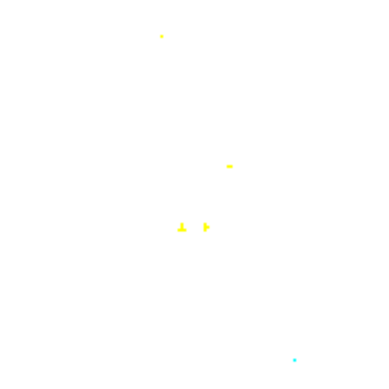

Processing image 478/1511


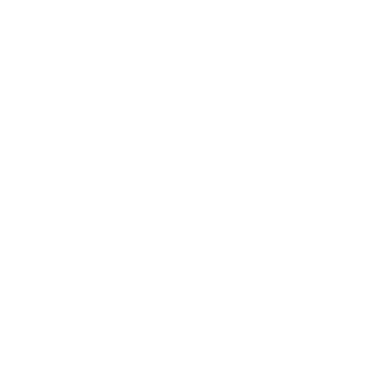

Processing image 479/1511


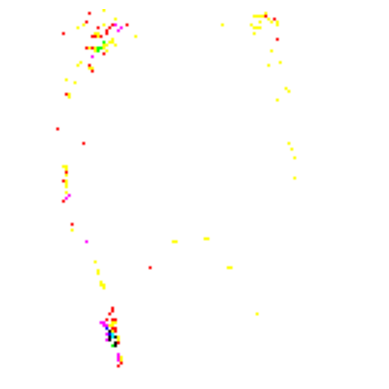

Processing image 480/1511


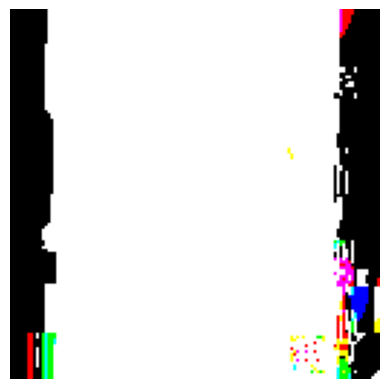

Processing image 481/1511


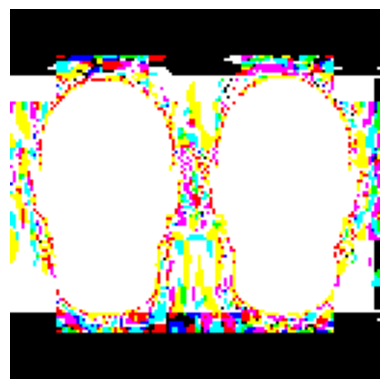

Processing image 482/1511


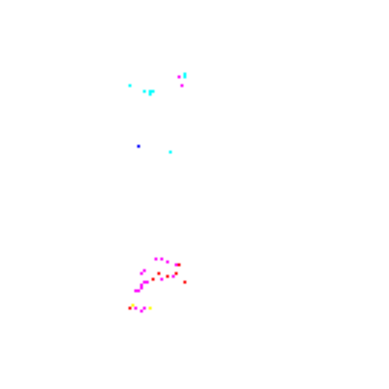

Processing image 483/1511


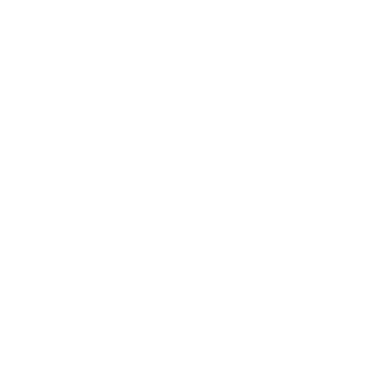

Processing image 484/1511


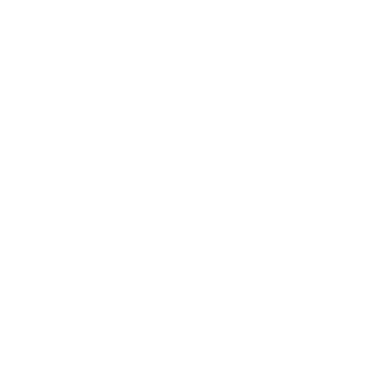

Processing image 485/1511


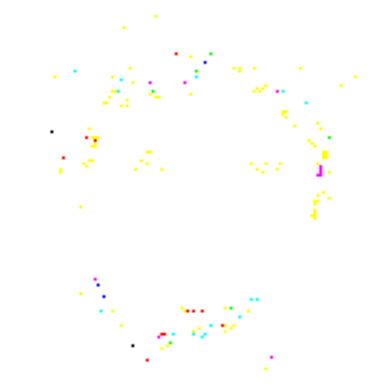

Processing image 486/1511


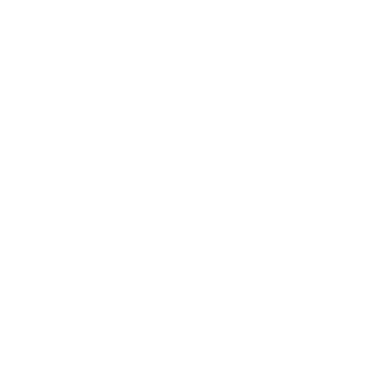

Processing image 487/1511


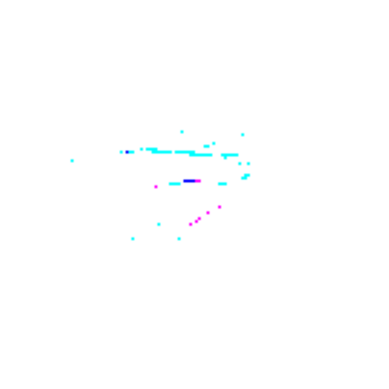

Processing image 488/1511


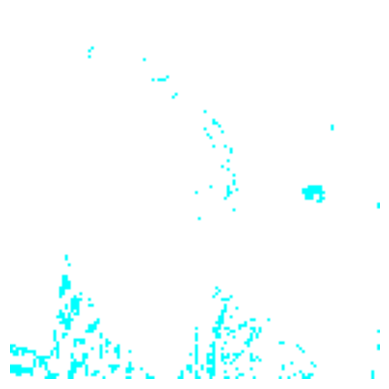

Processing image 489/1511


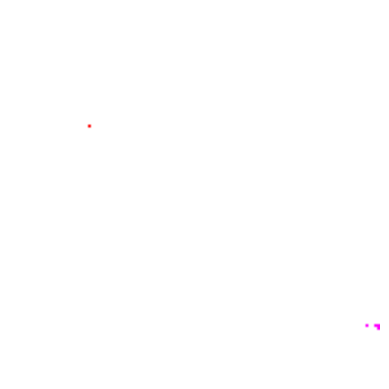

Processing image 490/1511


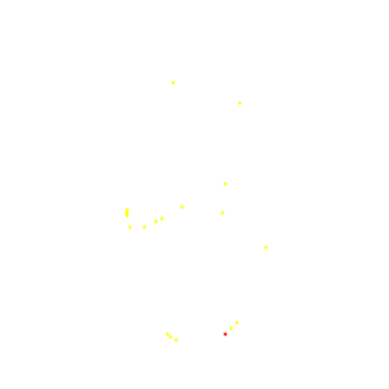

Processing image 491/1511


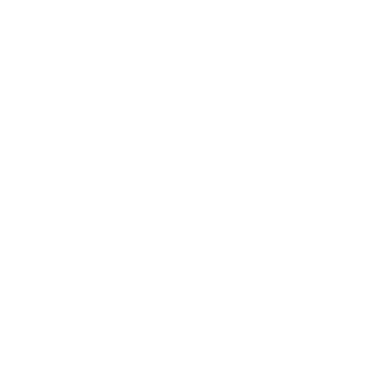

Processing image 492/1511


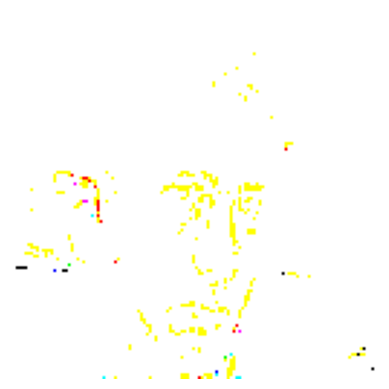

Processing image 493/1511


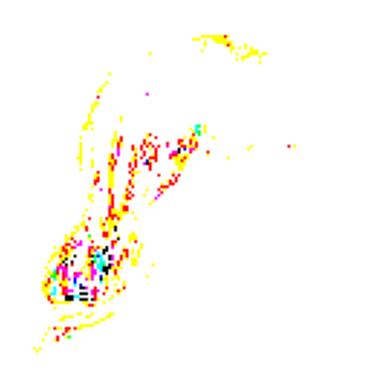

Processing image 494/1511


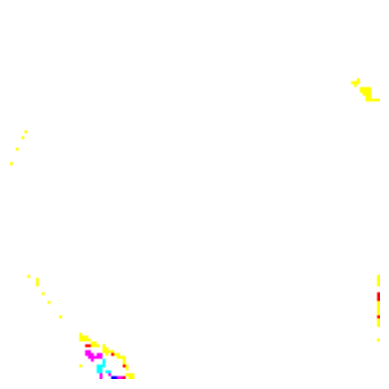

Processing image 495/1511


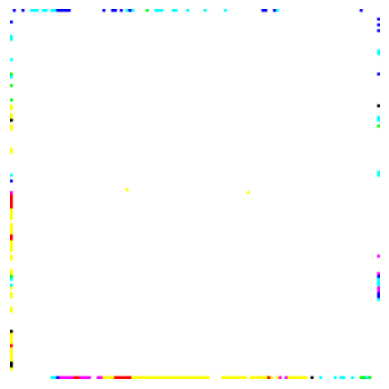

Processing image 496/1511


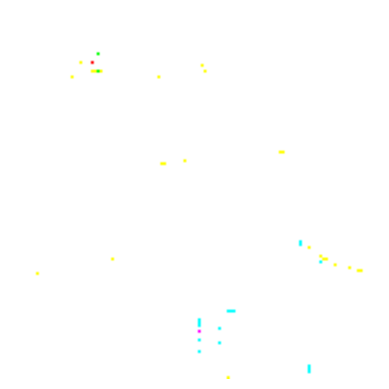

Processing image 497/1511


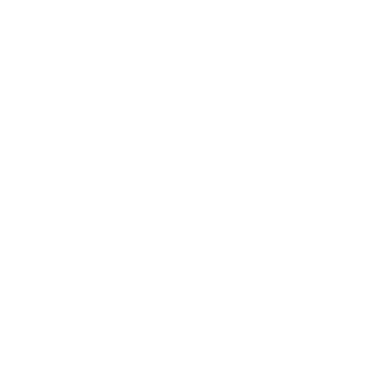

Processing image 498/1511


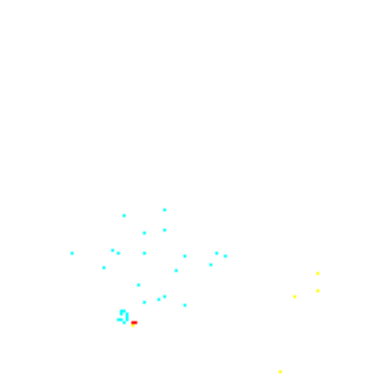

Processing image 499/1511


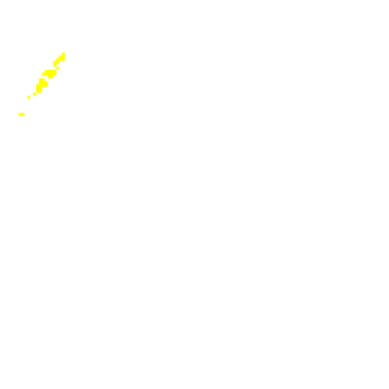

Processing image 500/1511


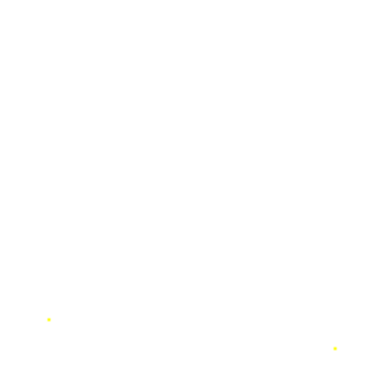

Processing image 501/1511


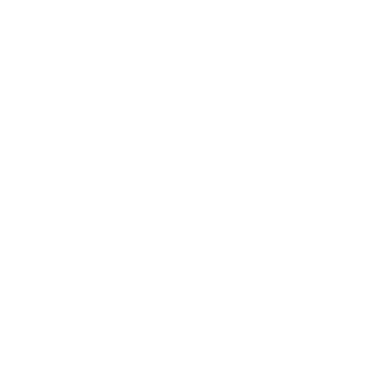

Processing image 502/1511


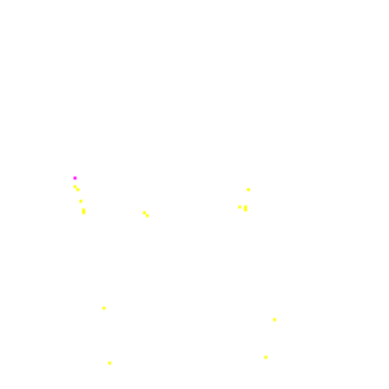

Processing image 503/1511


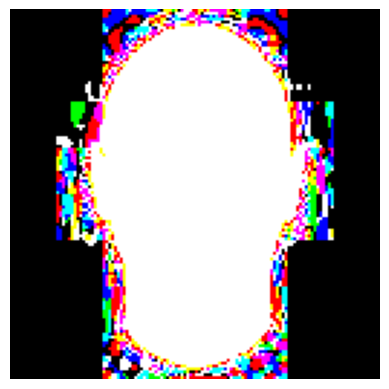

Processing image 504/1511


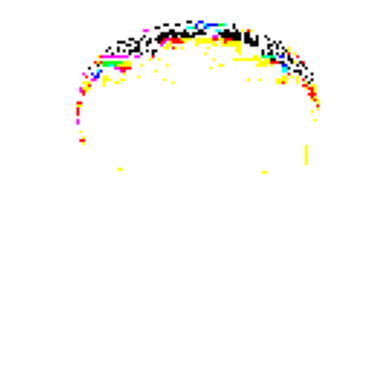

Processing image 505/1511


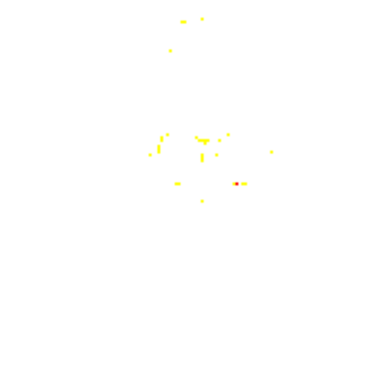

Processing image 506/1511


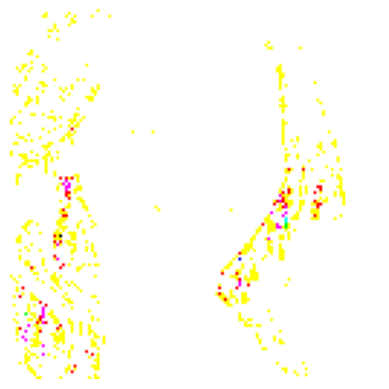

Processing image 507/1511


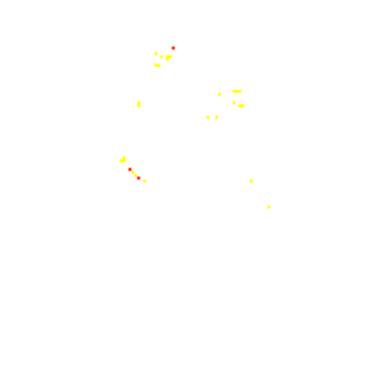

Processing image 508/1511


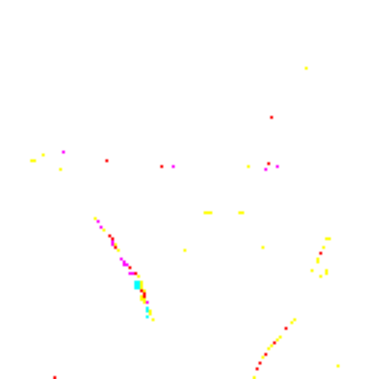

Processing image 509/1511


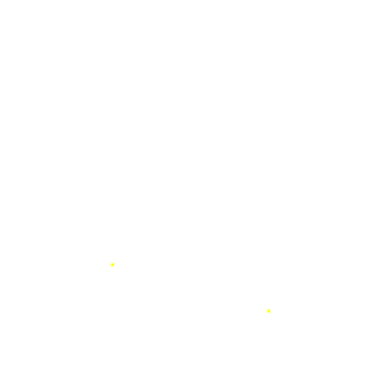

Processing image 510/1511


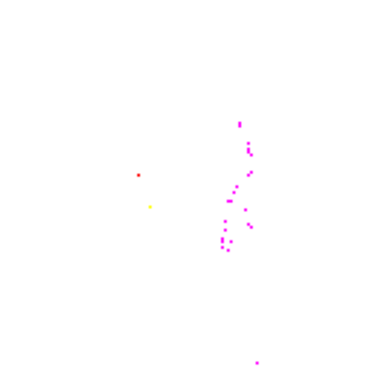

Processing image 511/1511


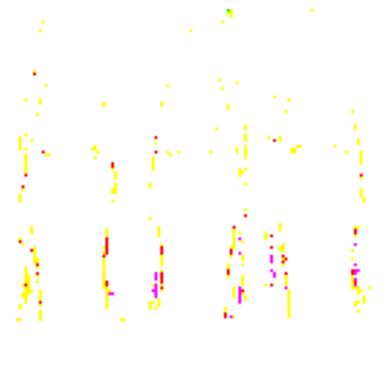

Processing image 512/1511


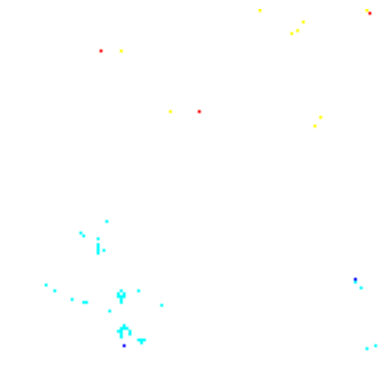

Processing image 513/1511


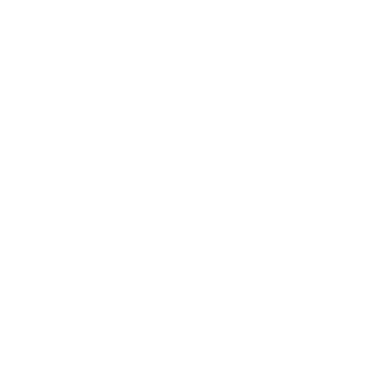

Processing image 514/1511


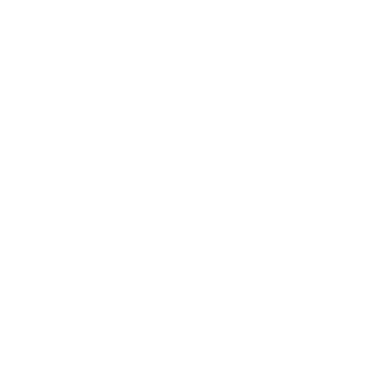

Processing image 515/1511


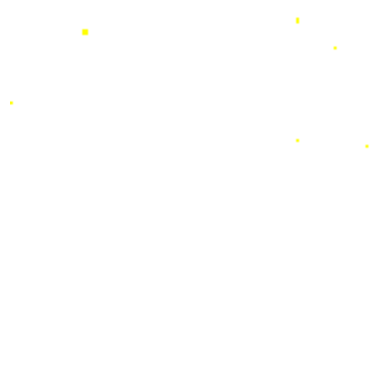

Processing image 516/1511


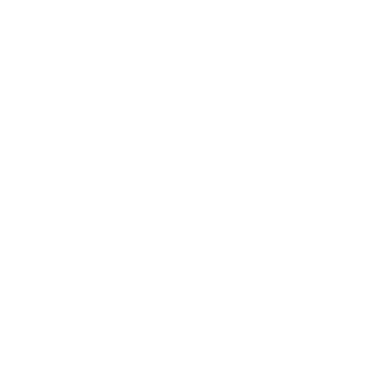

Processing image 517/1511


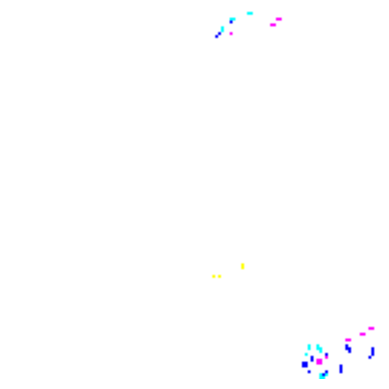

Processing image 518/1511


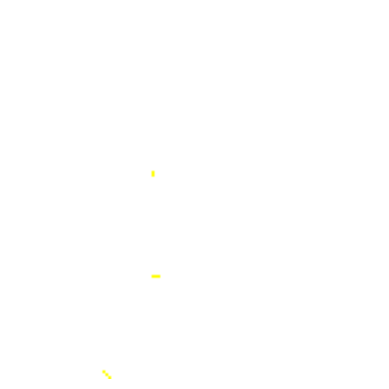

Processing image 519/1511


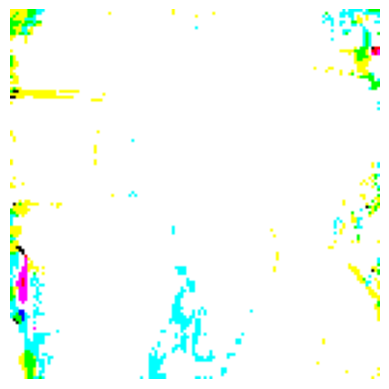

Processing image 520/1511


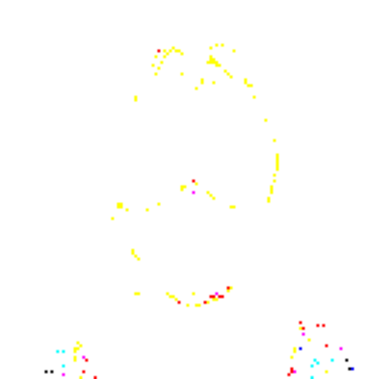

Processing image 521/1511


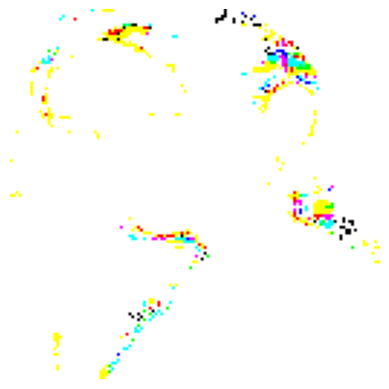

Processing image 522/1511


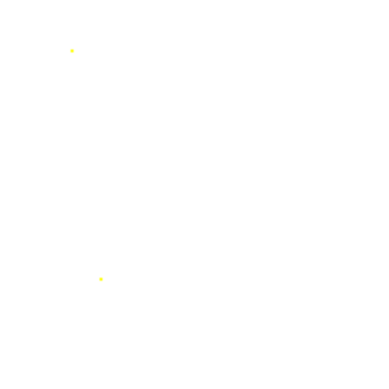

Processing image 523/1511


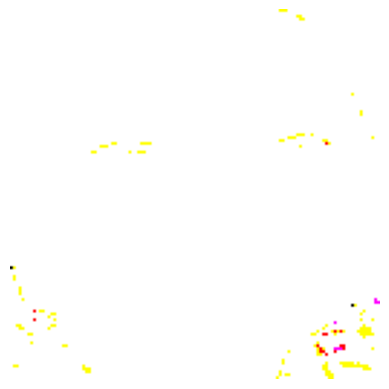

Processing image 524/1511


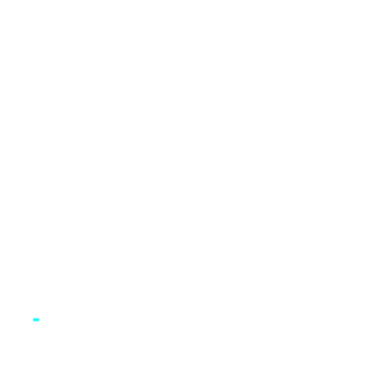

Processing image 525/1511


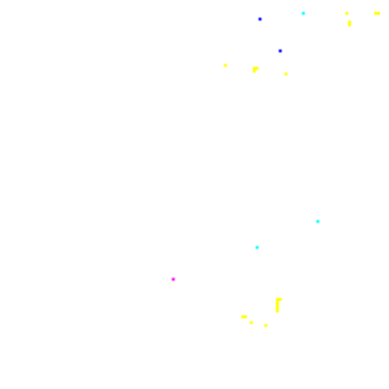

Processing image 526/1511


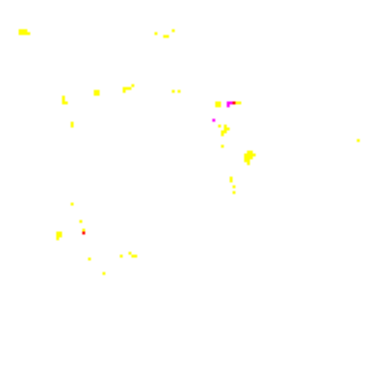

Processing image 527/1511


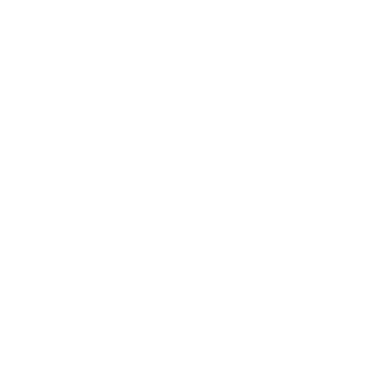

Processing image 528/1511


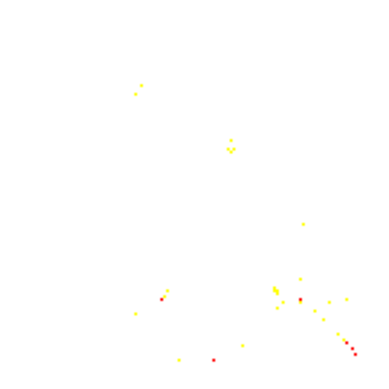

Processing image 529/1511


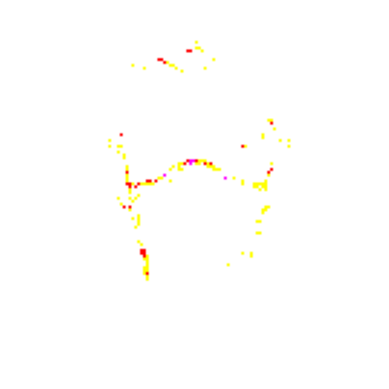

Processing image 530/1511


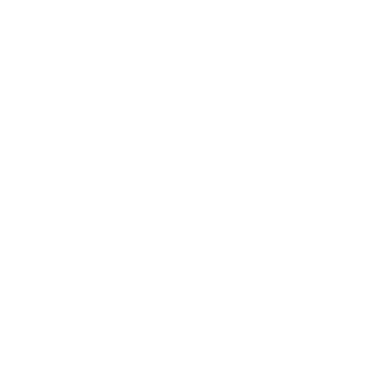

Processing image 531/1511


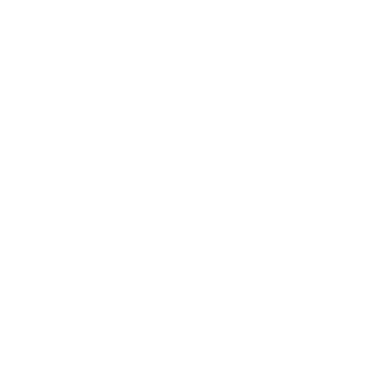

Processing image 532/1511


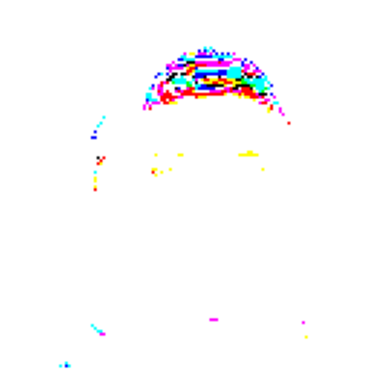

Processing image 533/1511


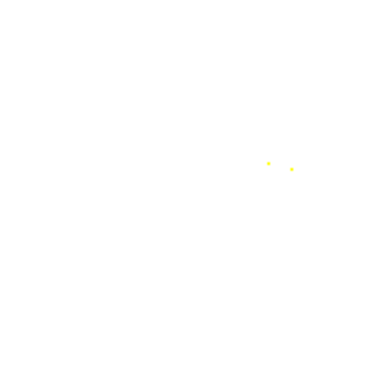

Processing image 534/1511


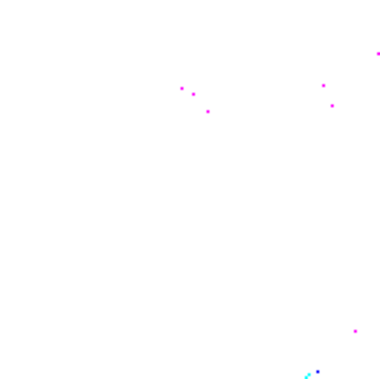

Processing image 535/1511


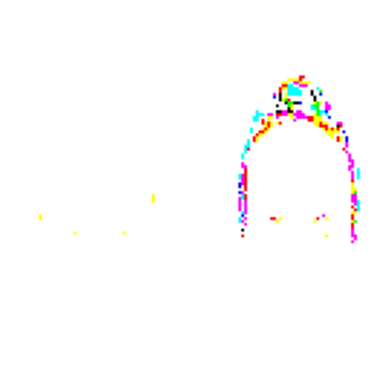

Processing image 536/1511


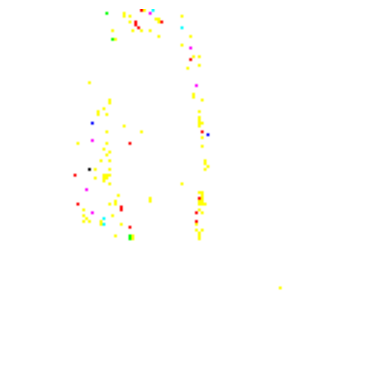

Processing image 537/1511


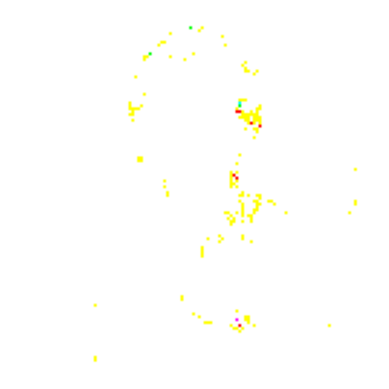

Processing image 538/1511


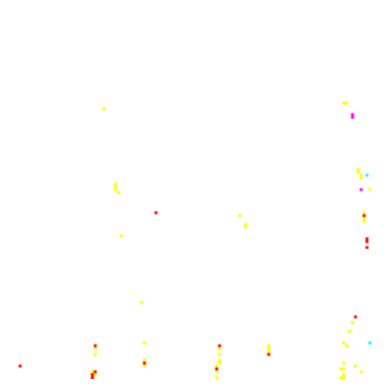

Processing image 539/1511


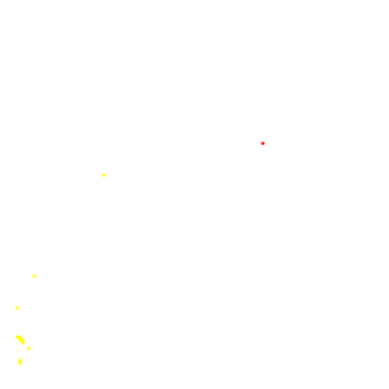

Processing image 540/1511


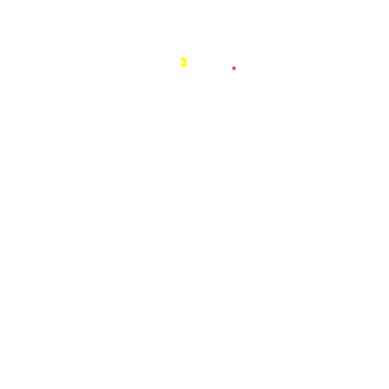

Processing image 541/1511


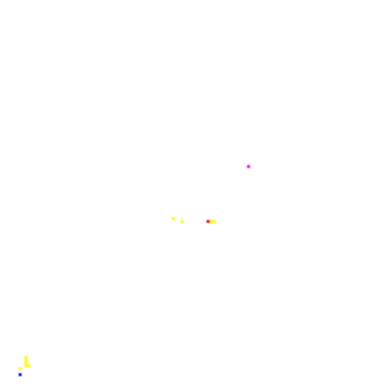

Processing image 542/1511


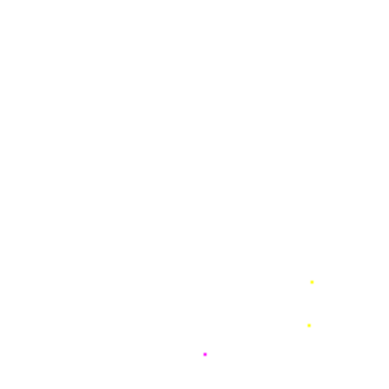

Processing image 543/1511


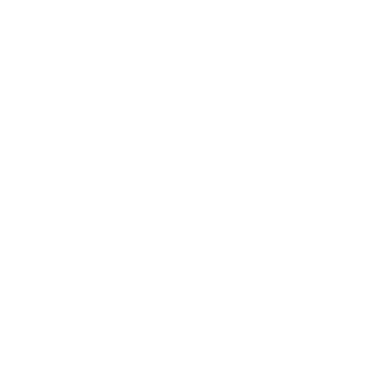

Processing image 544/1511


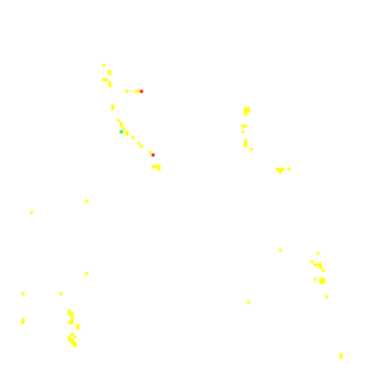

Processing image 545/1511


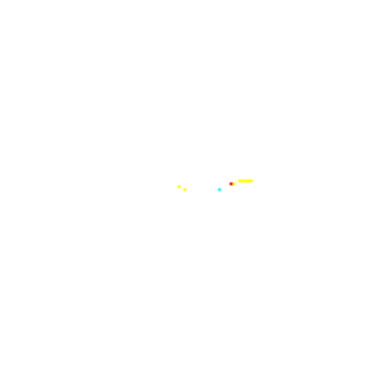

Processing image 546/1511


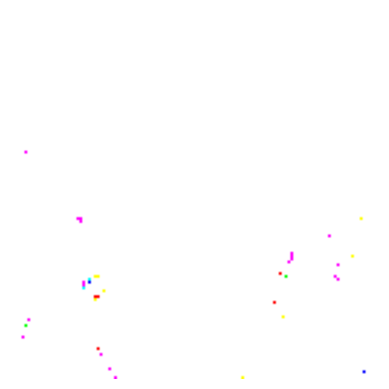

Processing image 547/1511


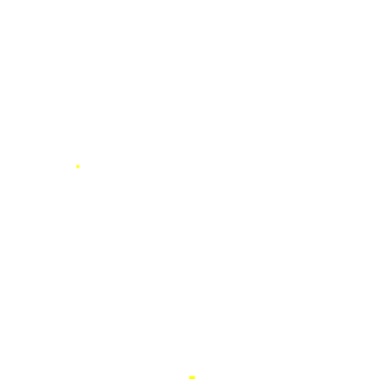

Processing image 548/1511


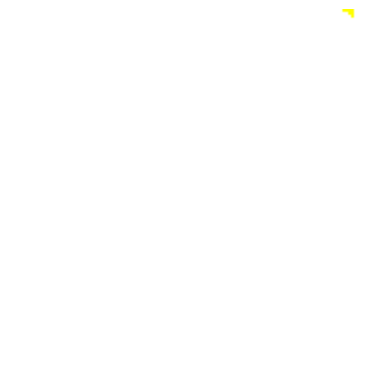

Processing image 549/1511


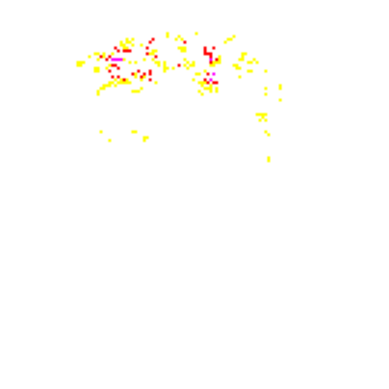

Processing image 550/1511


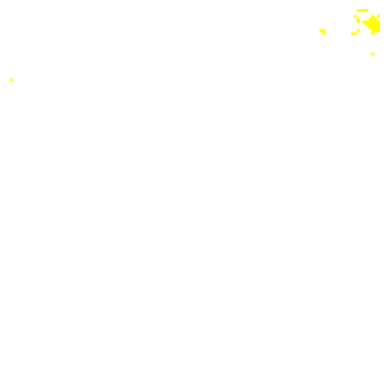

Processing image 551/1511


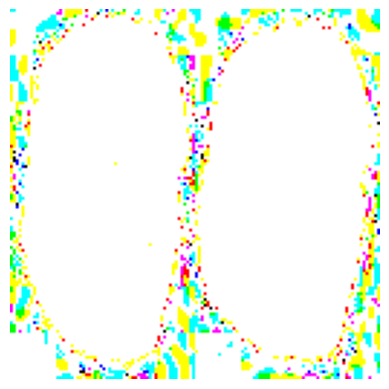

Processing image 552/1511


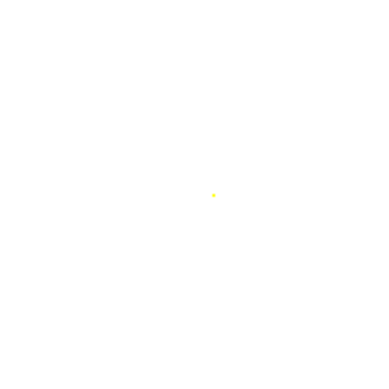

Processing image 553/1511


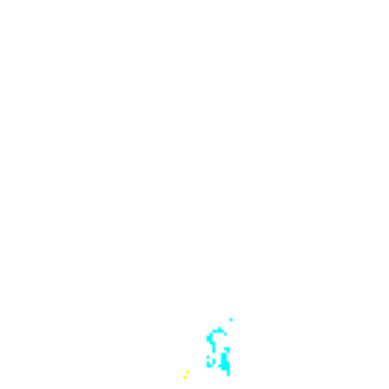

Processing image 554/1511


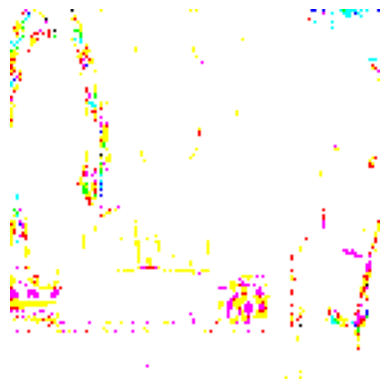

Processing image 555/1511


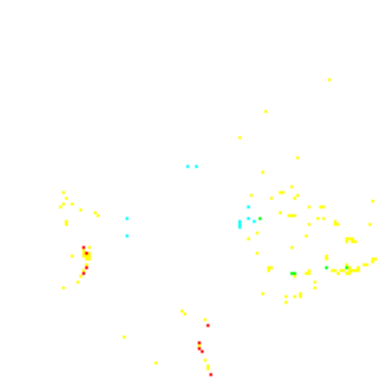

Processing image 556/1511


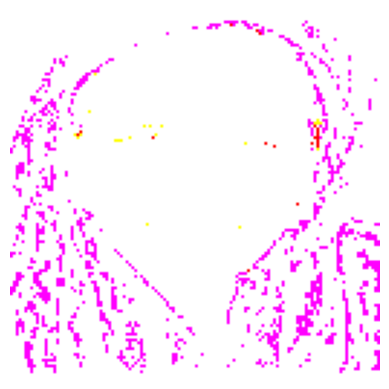

Processing image 557/1511


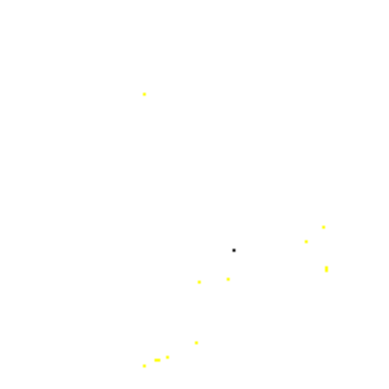

Processing image 558/1511


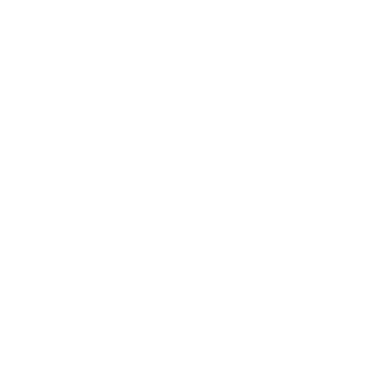

Processing image 559/1511


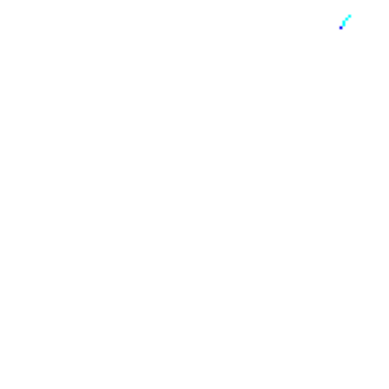

Processing image 560/1511


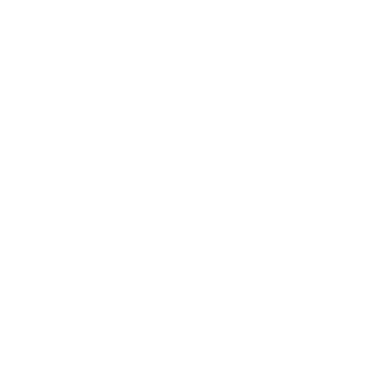

Processing image 561/1511


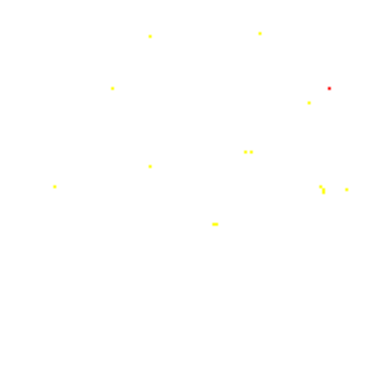

Processing image 562/1511


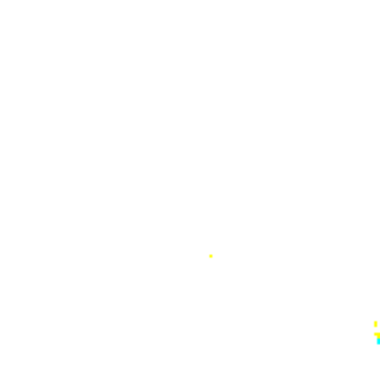

Processing image 563/1511


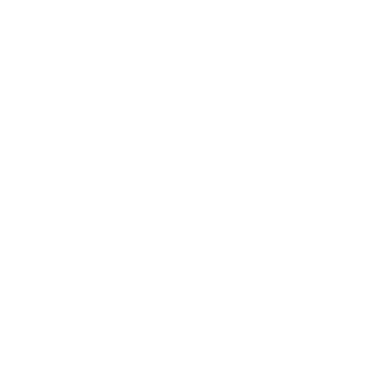

Processing image 564/1511


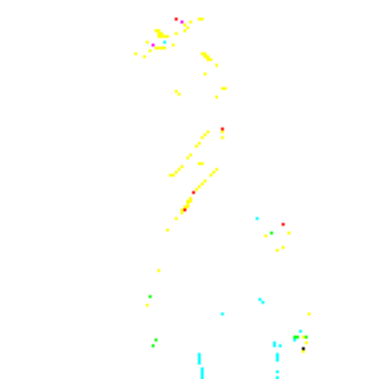

Processing image 565/1511


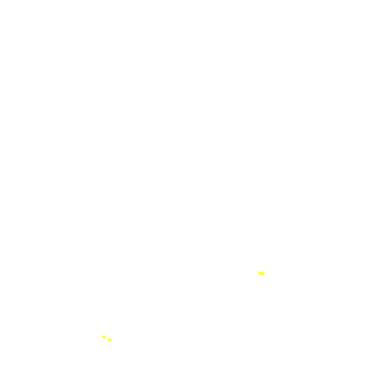

Processing image 566/1511


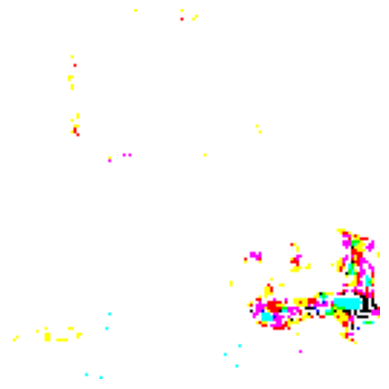

Processing image 567/1511


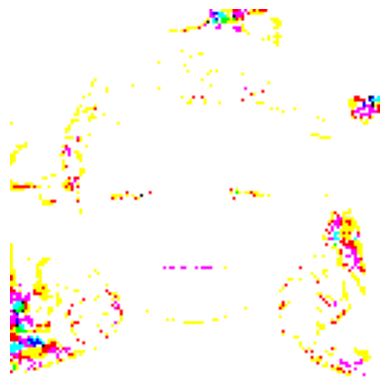

Processing image 568/1511


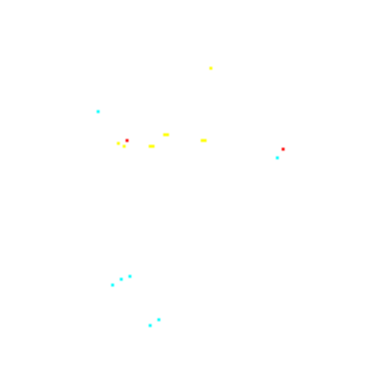

Processing image 569/1511


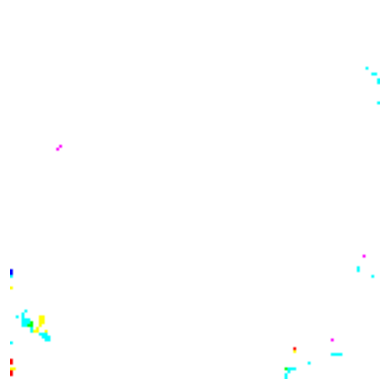

Processing image 570/1511


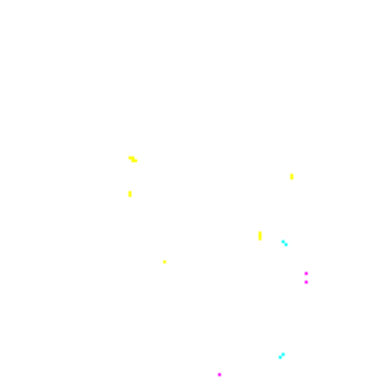

Processing image 571/1511


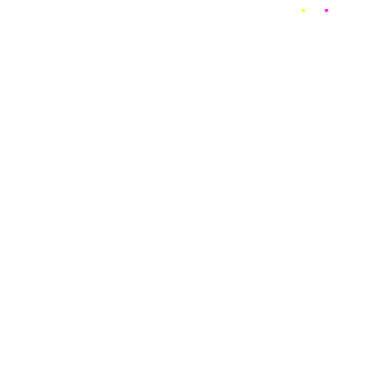

Processing image 572/1511


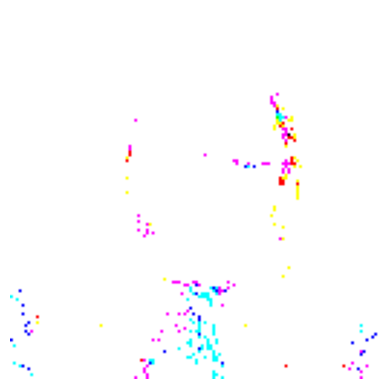

Processing image 573/1511


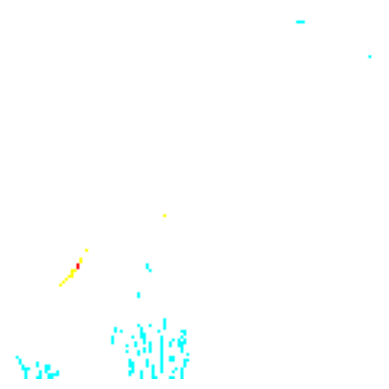

Processing image 574/1511


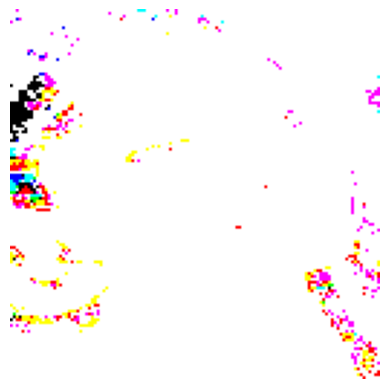

Processing image 575/1511


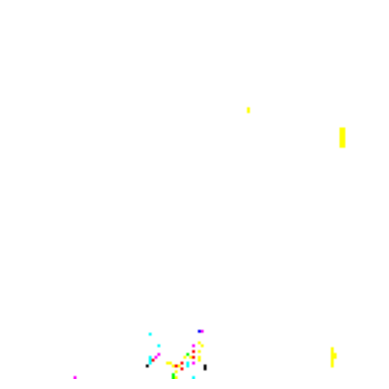

Processing image 576/1511


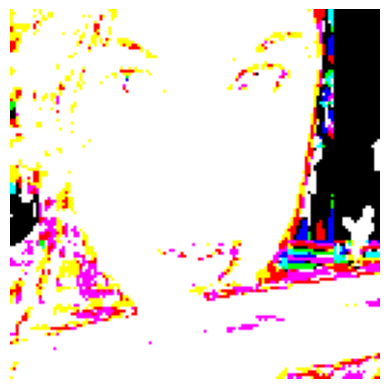

Processing image 577/1511


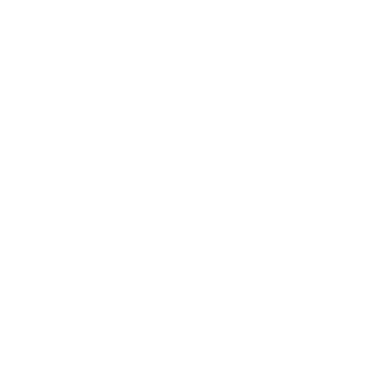

Processing image 578/1511


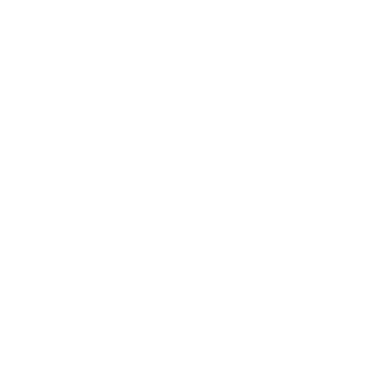

Processing image 579/1511


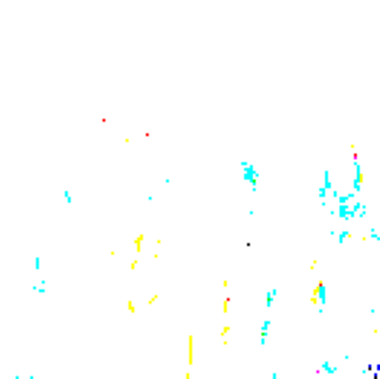

Processing image 580/1511


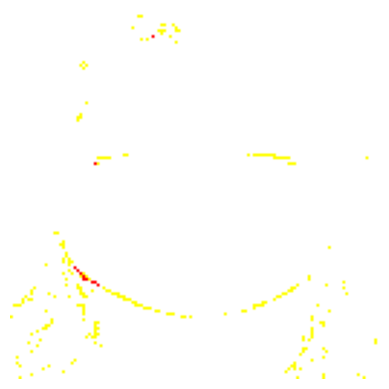

Processing image 581/1511


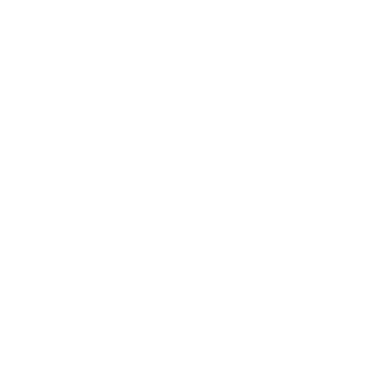

Processing image 582/1511


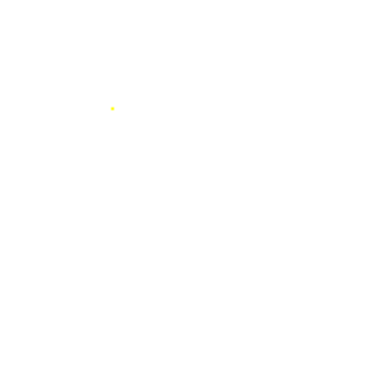

Processing image 583/1511


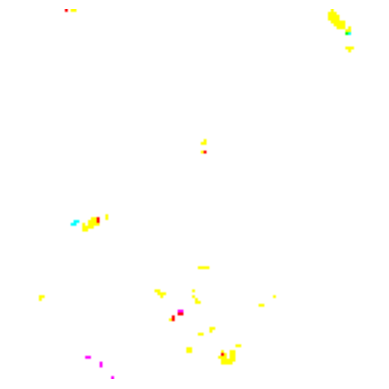

Processing image 584/1511


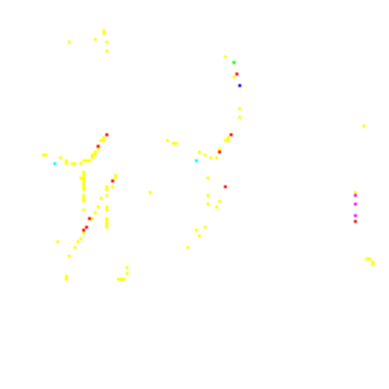

Processing image 585/1511


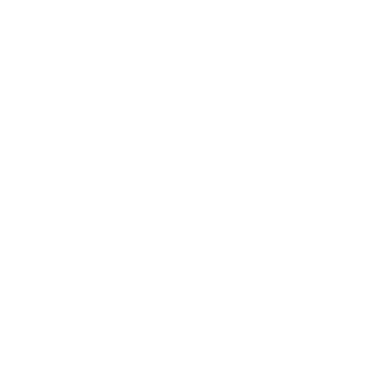

Processing image 586/1511


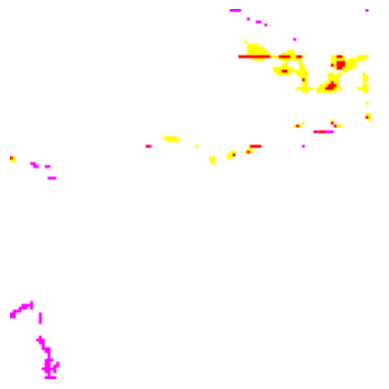

Processing image 587/1511


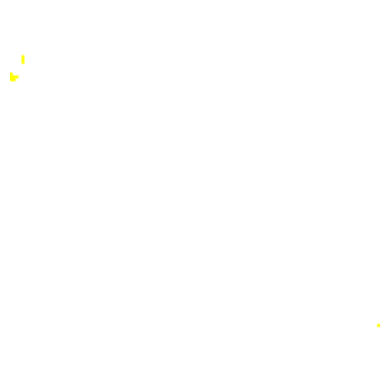

Processing image 588/1511


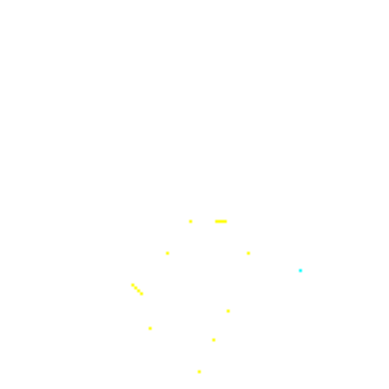

Processing image 589/1511


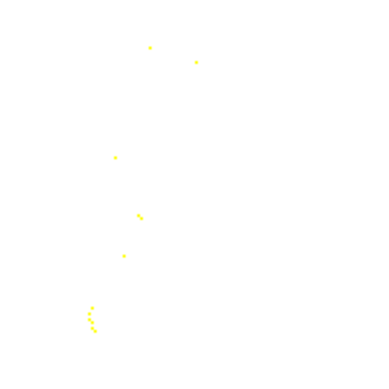

Processing image 590/1511


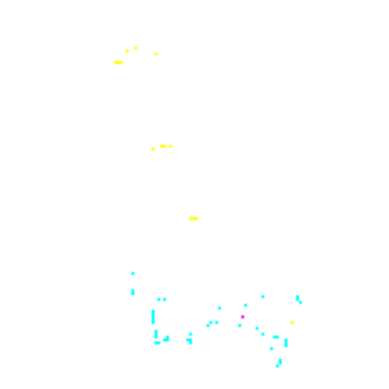

Processing image 591/1511


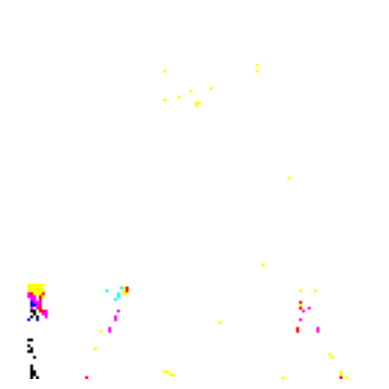

Processing image 592/1511


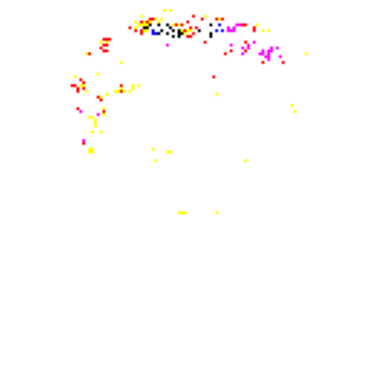

Processing image 593/1511


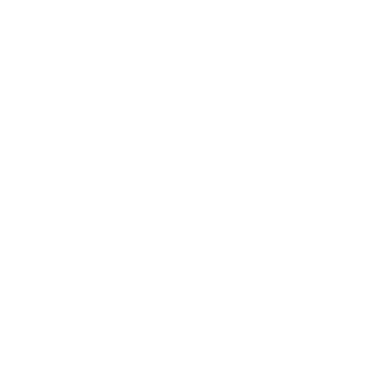

Processing image 594/1511


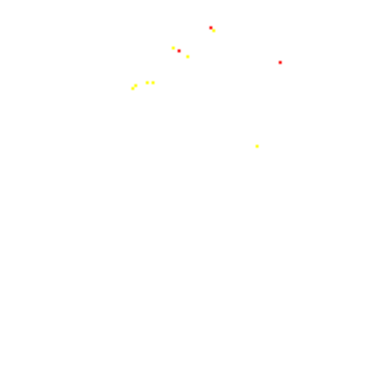

Processing image 595/1511


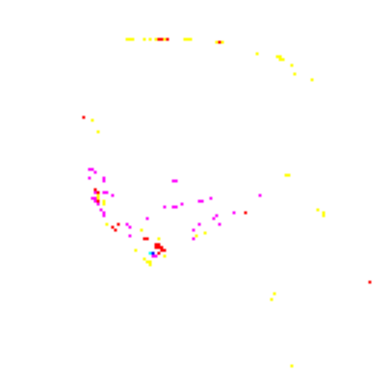

Processing image 596/1511


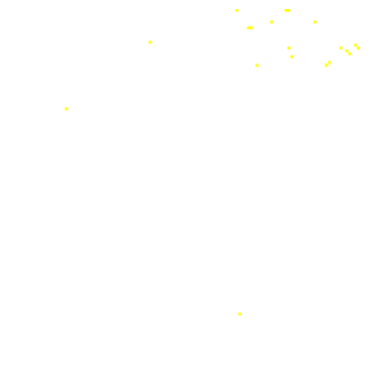

Processing image 597/1511


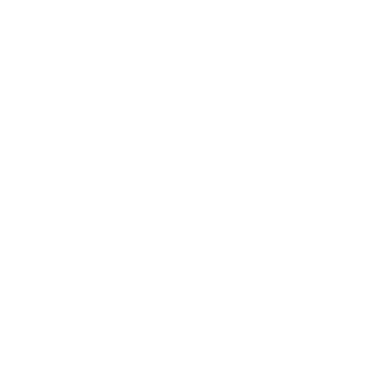

Processing image 598/1511


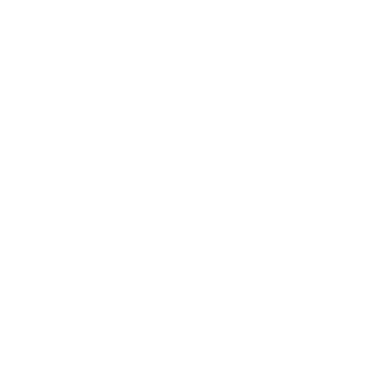

Processing image 599/1511


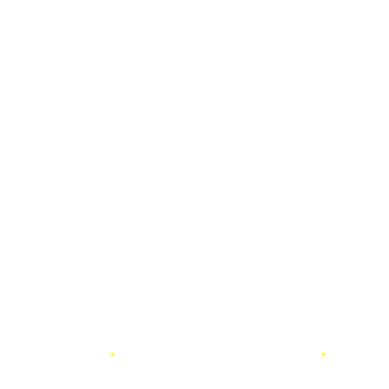

Processing image 600/1511


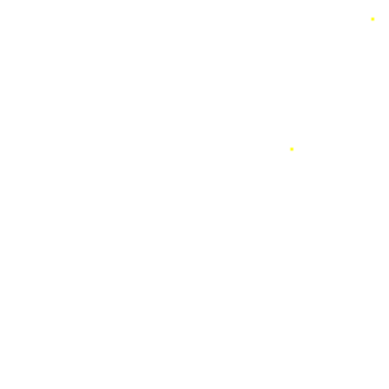

Processing image 601/1511


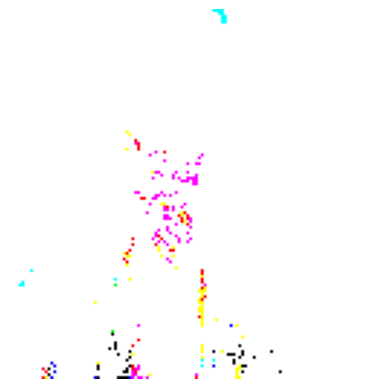

Processing image 602/1511


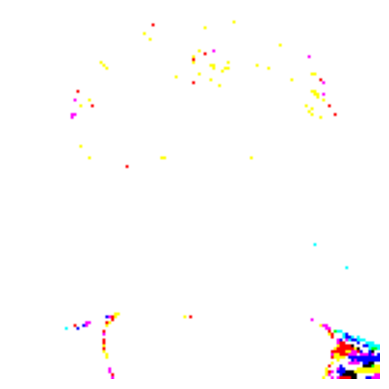

Processing image 603/1511


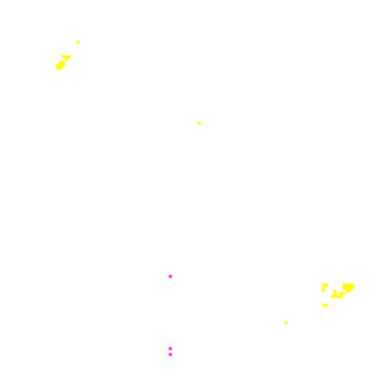

Processing image 604/1511


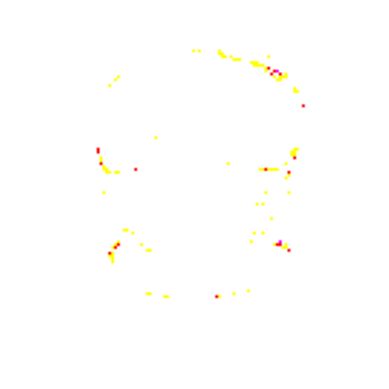

Processing image 605/1511


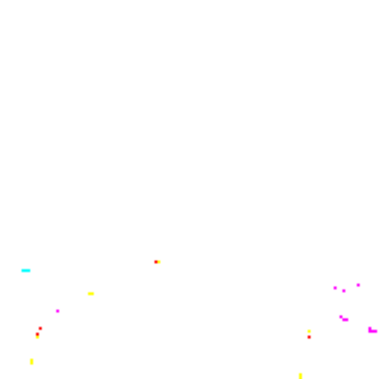

Processing image 606/1511


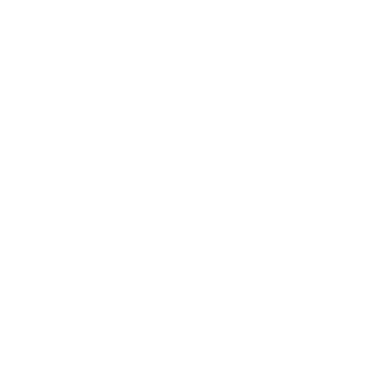

Processing image 607/1511


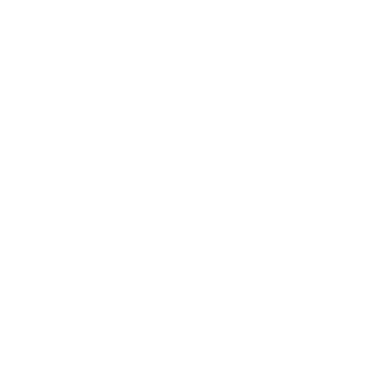

Processing image 608/1511


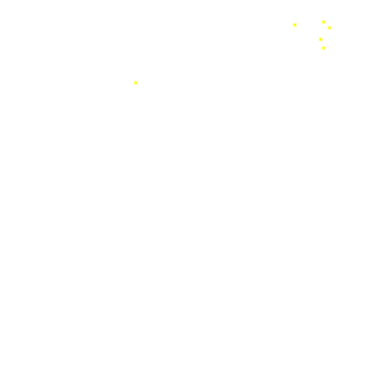

Processing image 609/1511


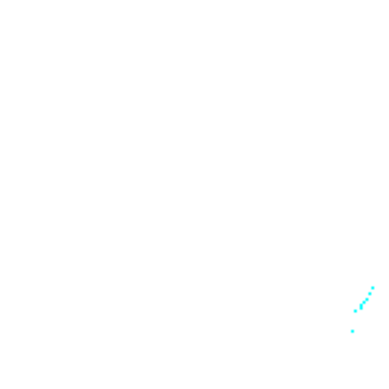

Processing image 610/1511


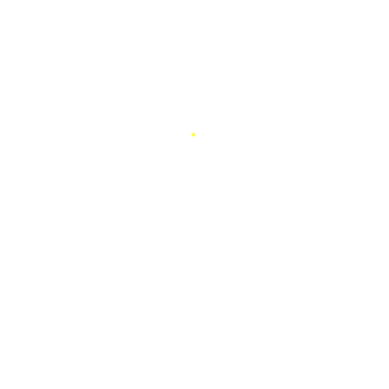

Processing image 611/1511


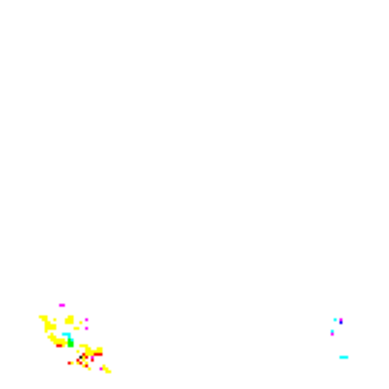

Processing image 612/1511


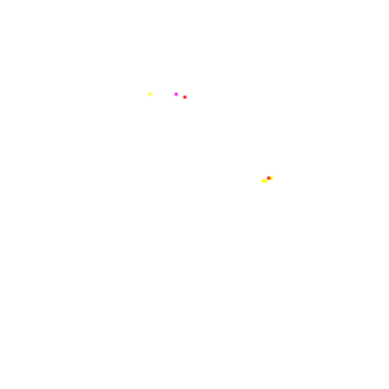

Processing image 613/1511


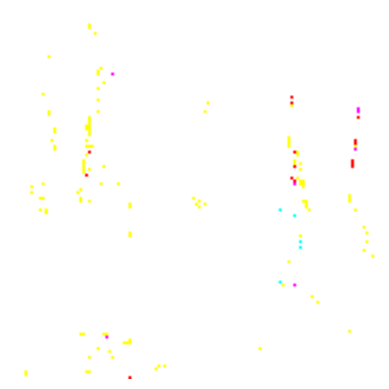

Processing image 614/1511


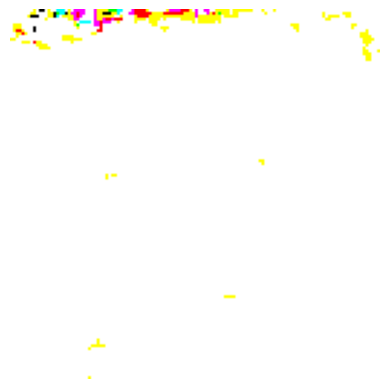

Processing image 615/1511


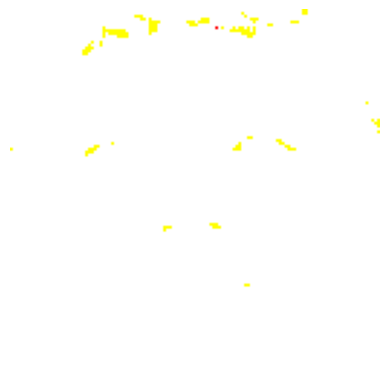

Processing image 616/1511


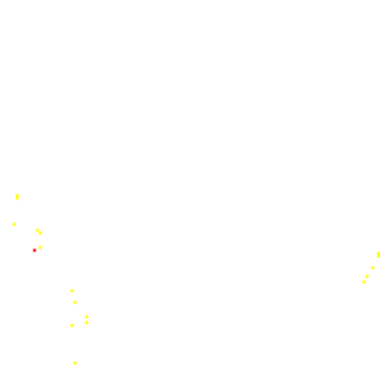

Processing image 617/1511


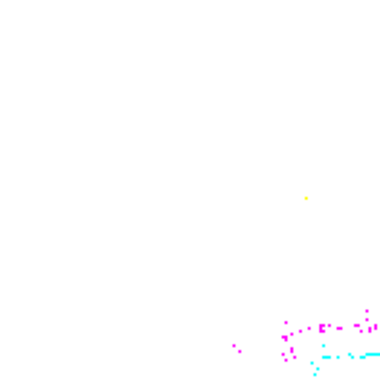

Processing image 618/1511


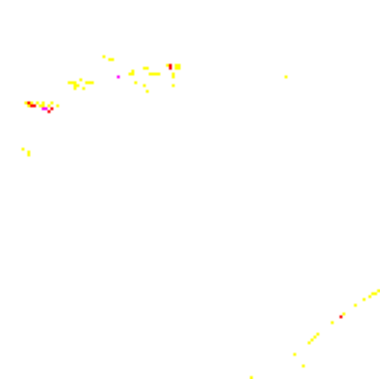

Processing image 619/1511


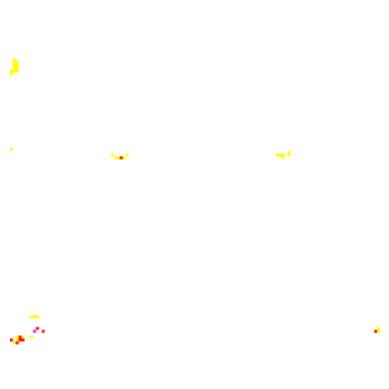

Processing image 620/1511


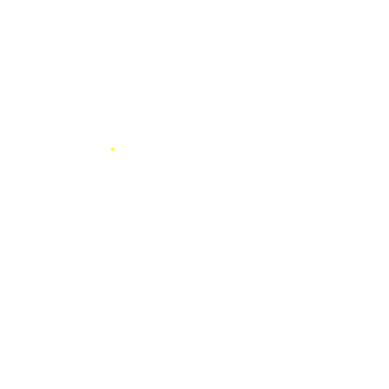

Processing image 621/1511


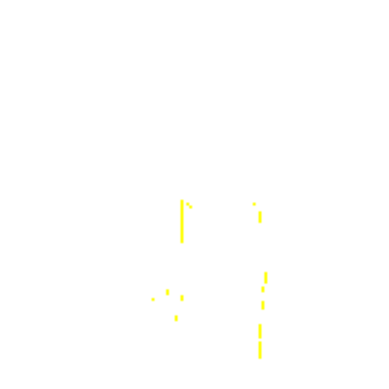

Processing image 622/1511


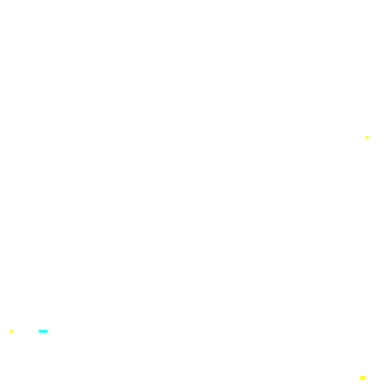

Processing image 623/1511


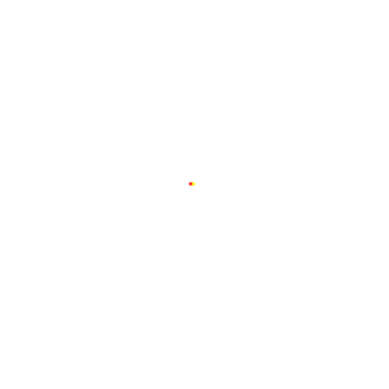

Processing image 624/1511


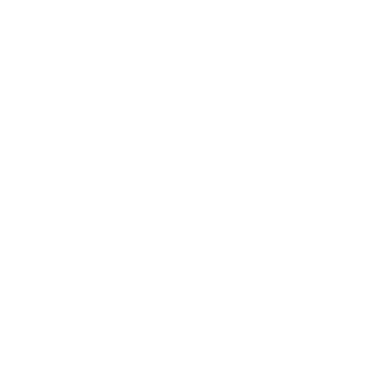

Processing image 625/1511


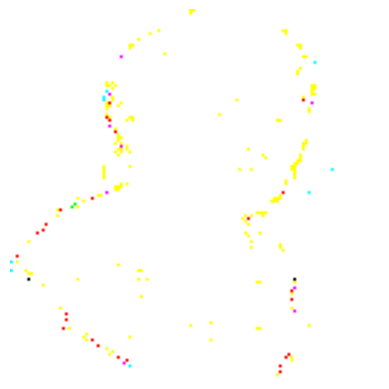

Processing image 626/1511


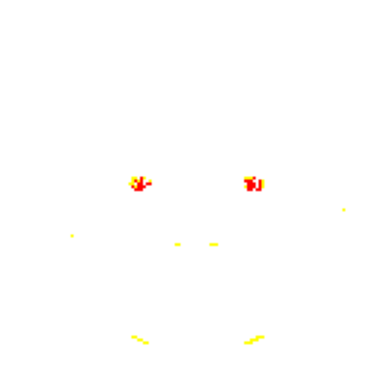

Processing image 627/1511


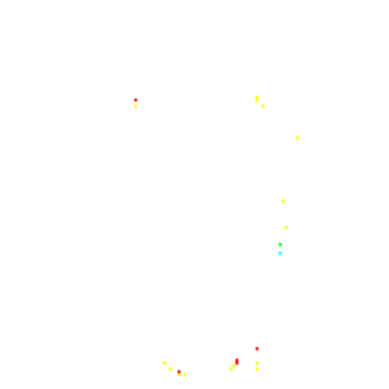

Processing image 628/1511


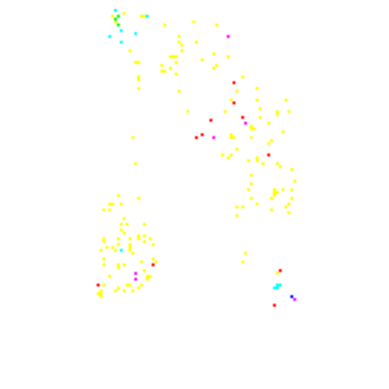

Processing image 629/1511


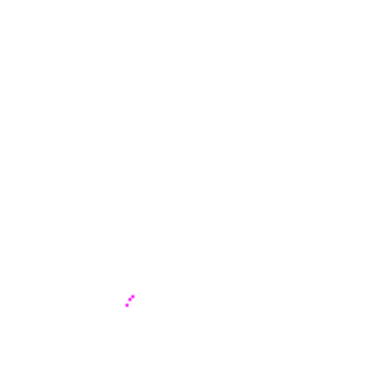

Processing image 630/1511


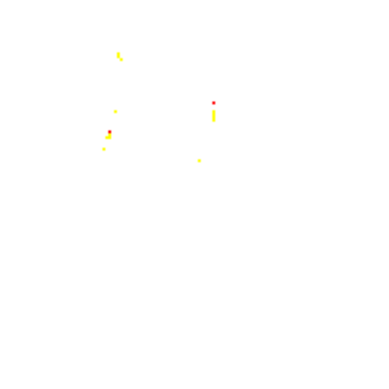

Processing image 631/1511


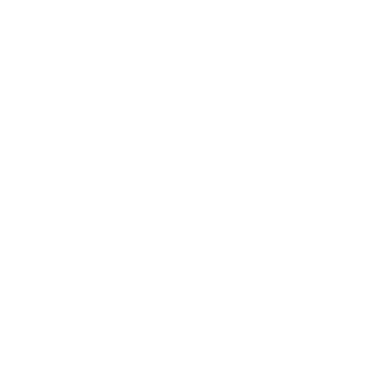

Processing image 632/1511


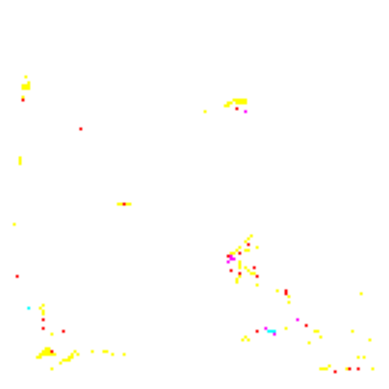

Processing image 633/1511


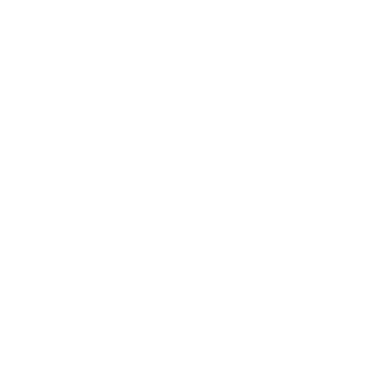

Processing image 634/1511


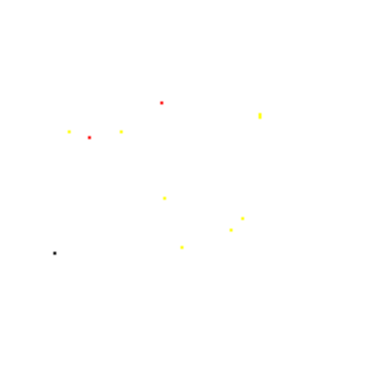

Processing image 635/1511


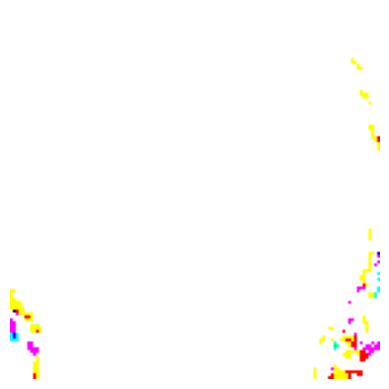

Processing image 636/1511


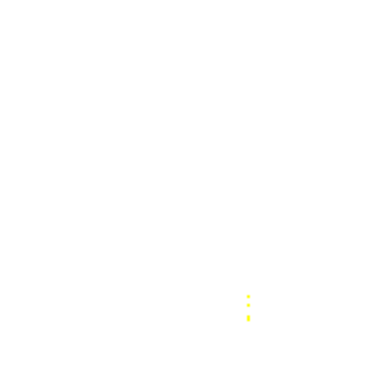

Processing image 637/1511


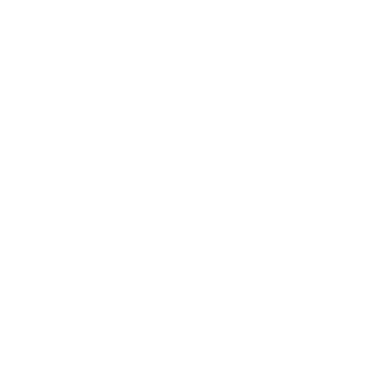

Processing image 638/1511


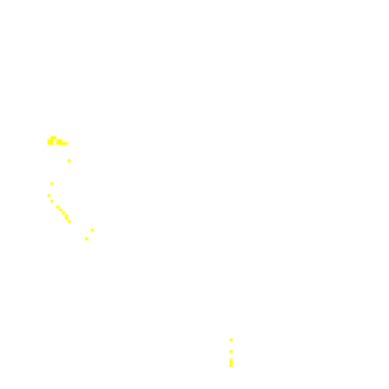

Processing image 639/1511


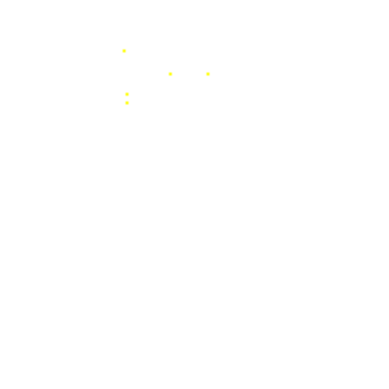

Processing image 640/1511


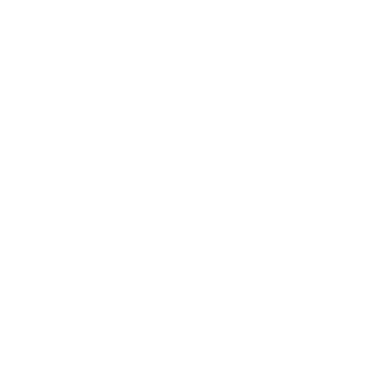

Processing image 641/1511


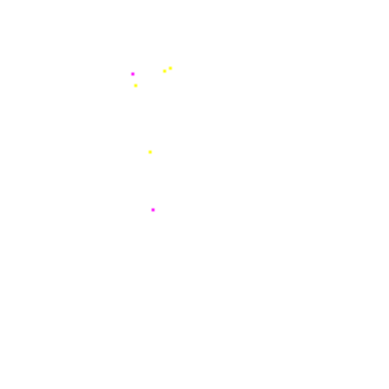

Processing image 642/1511


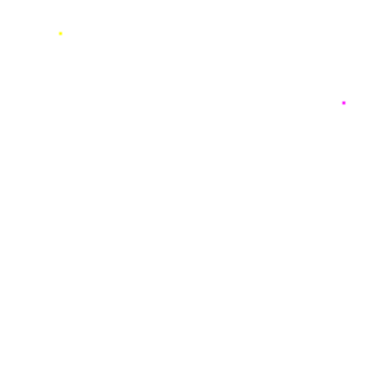

Processing image 643/1511


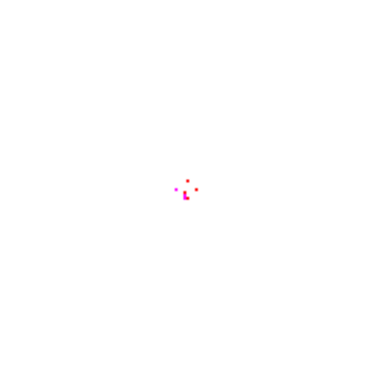

Processing image 644/1511


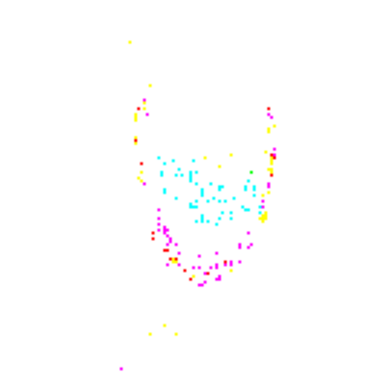

Processing image 645/1511


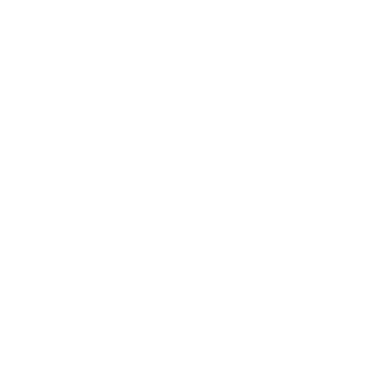

Processing image 646/1511


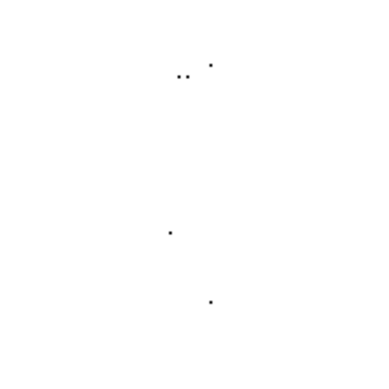

Processing image 647/1511


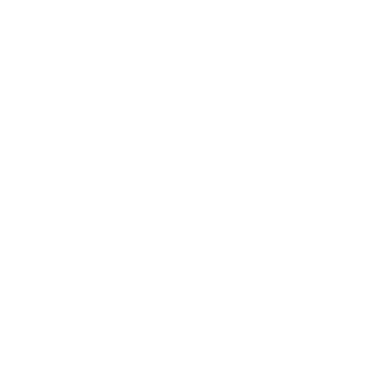

Processing image 648/1511


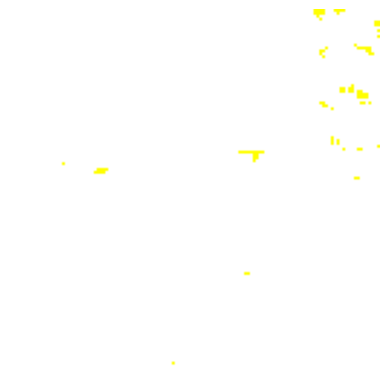

Processing image 649/1511


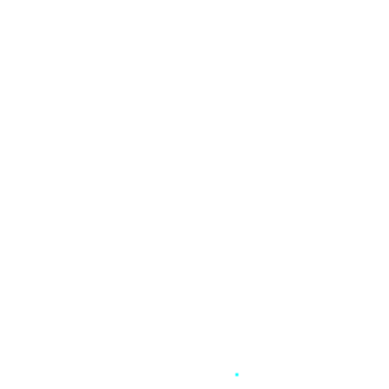

Processing image 650/1511


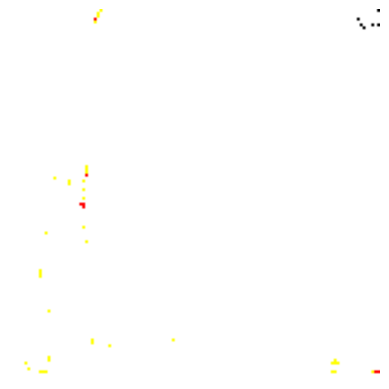

Processing image 651/1511


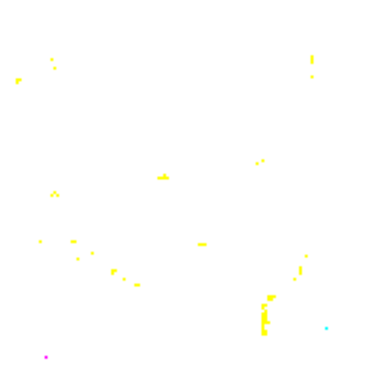

Processing image 652/1511


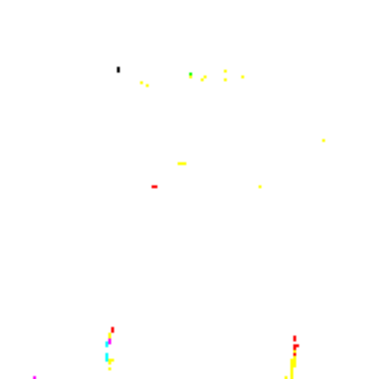

Processing image 653/1511


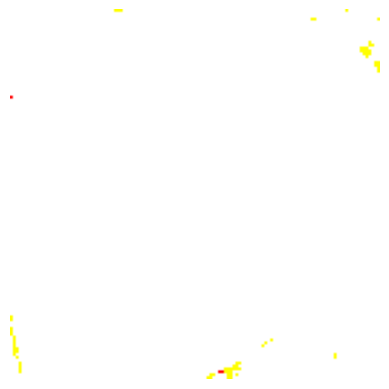

Processing image 654/1511


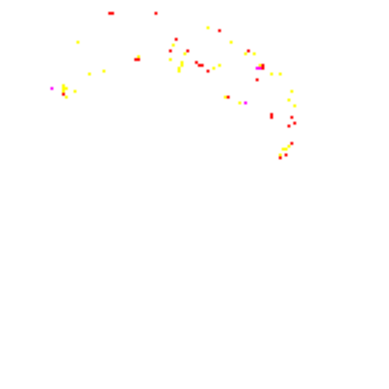

Processing image 655/1511


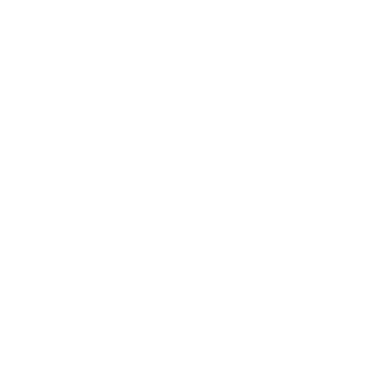

Processing image 656/1511


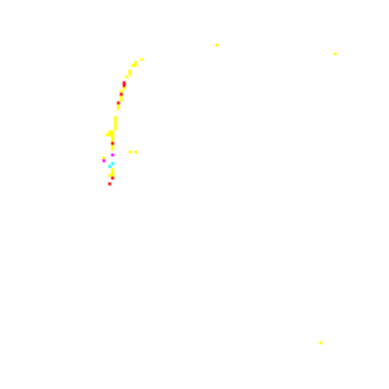

Processing image 657/1511


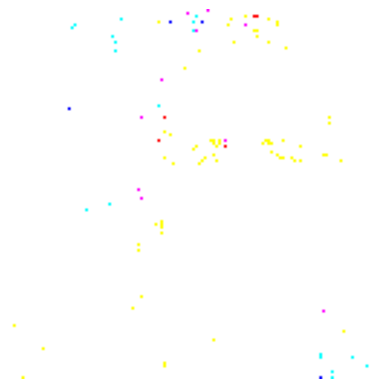

Processing image 658/1511


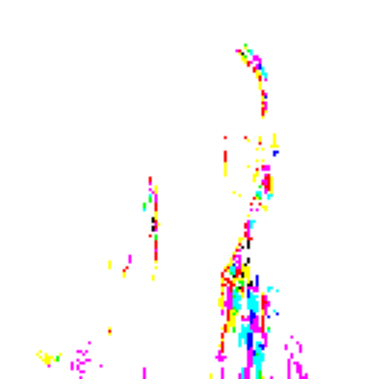

Processing image 659/1511


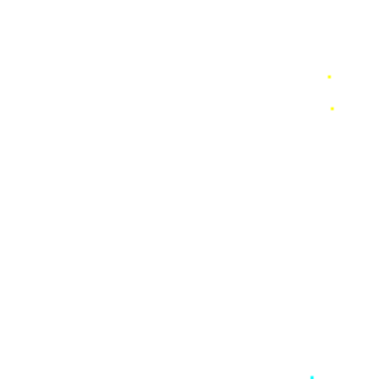

Processing image 660/1511


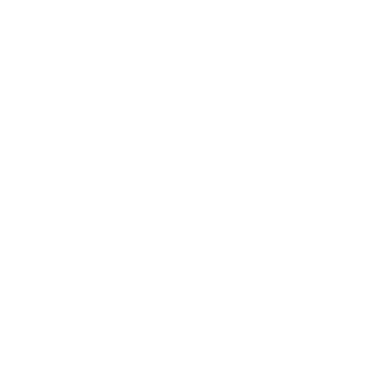

Processing image 661/1511


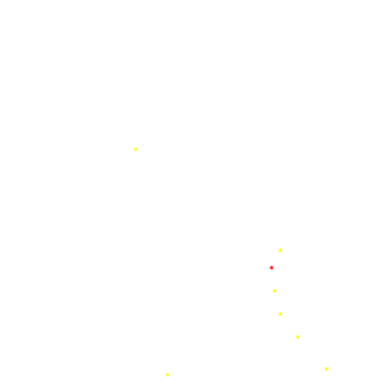

Processing image 662/1511


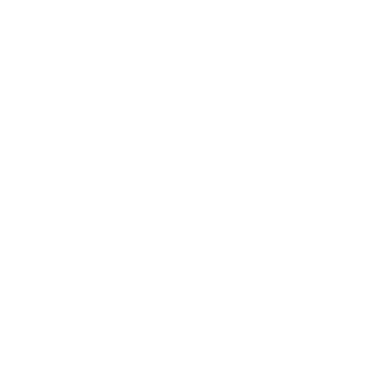

Processing image 663/1511


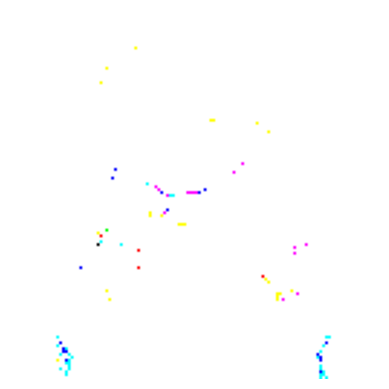

Processing image 664/1511


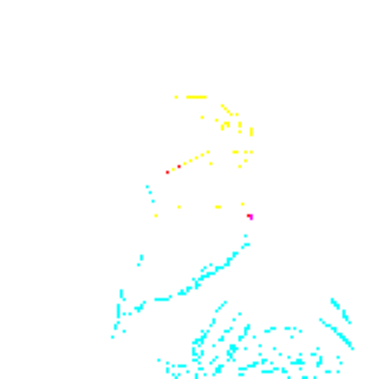

Processing image 665/1511


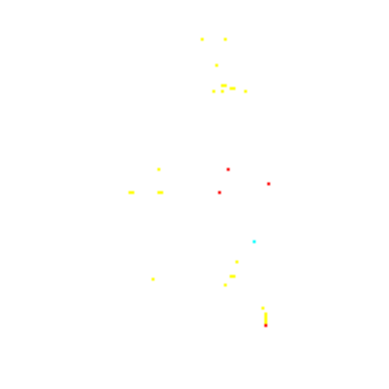

Processing image 666/1511


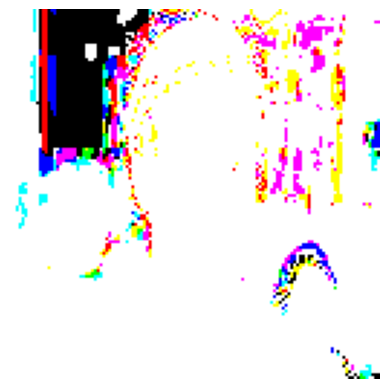

Processing image 667/1511


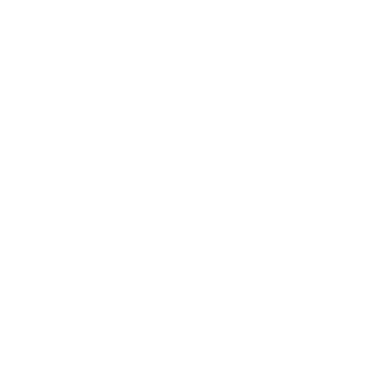

Processing image 668/1511


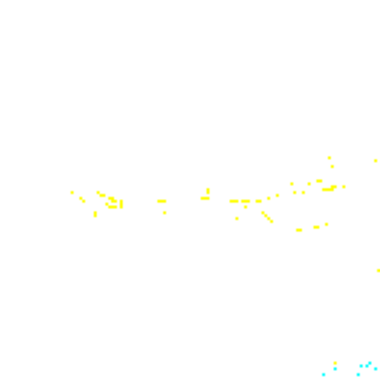

Processing image 669/1511


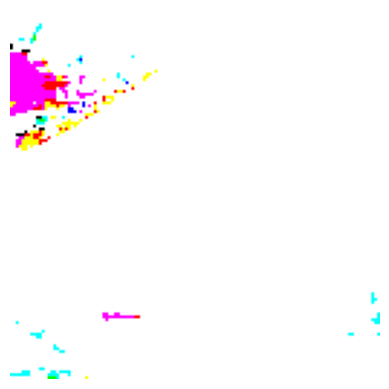

Processing image 670/1511


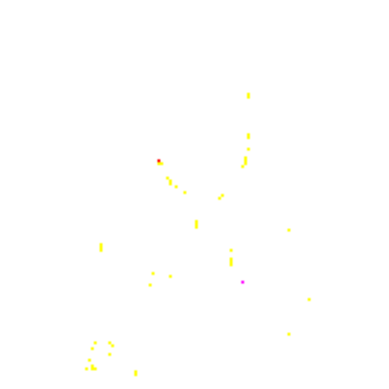

Processing image 671/1511


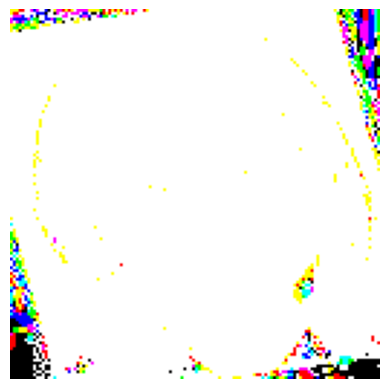

Processing image 672/1511


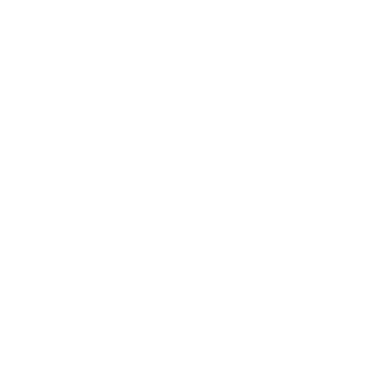

Processing image 673/1511


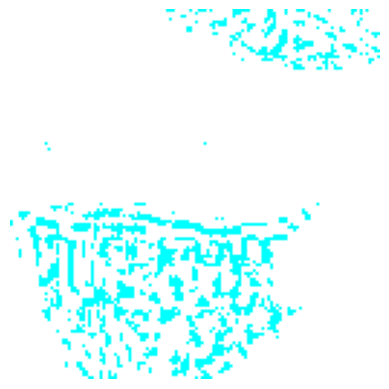

Processing image 674/1511


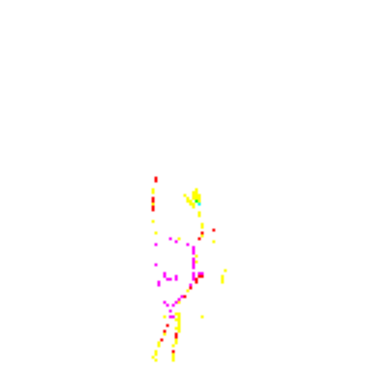

Processing image 675/1511


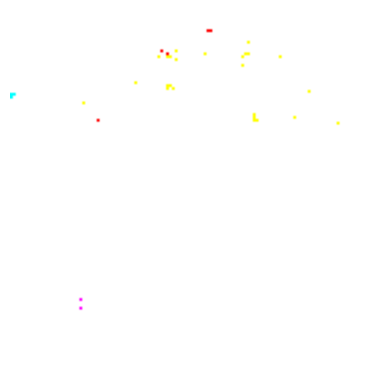

Processing image 676/1511


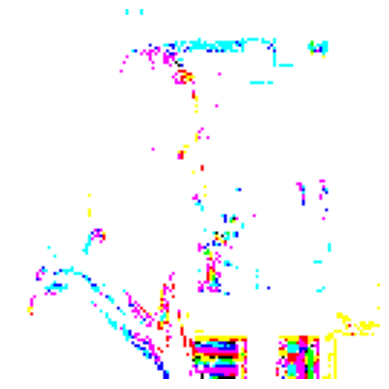

Processing image 677/1511


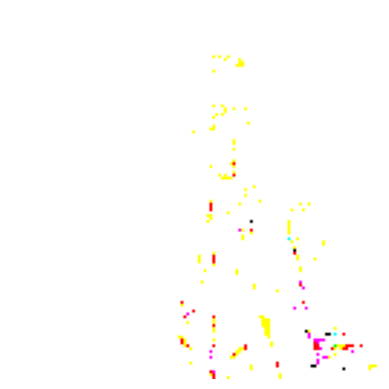

Processing image 678/1511


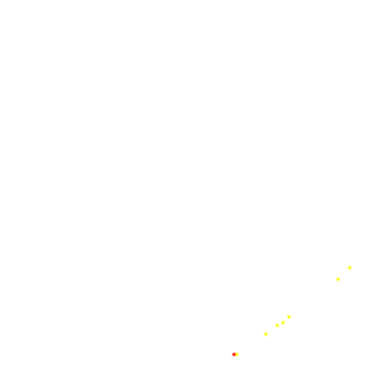

Processing image 679/1511


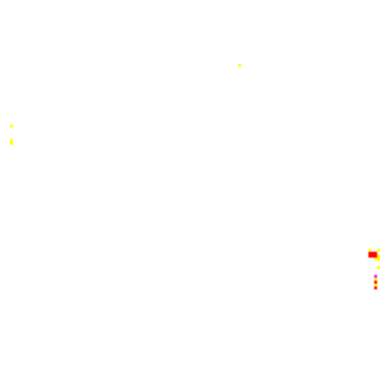

Processing image 680/1511


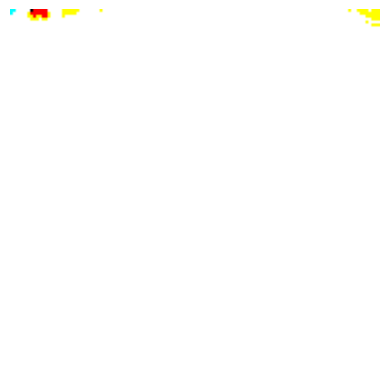

Processing image 681/1511


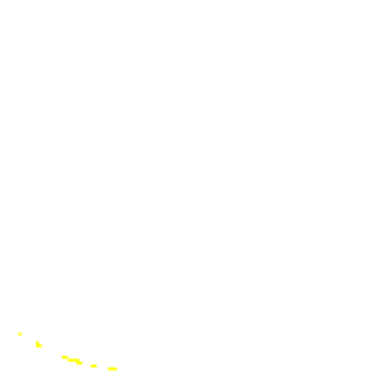

Processing image 682/1511


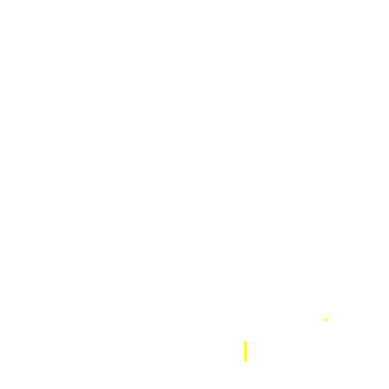

Processing image 683/1511


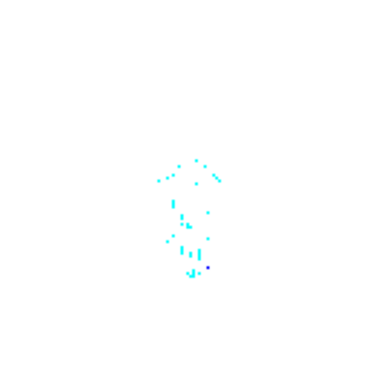

Processing image 684/1511


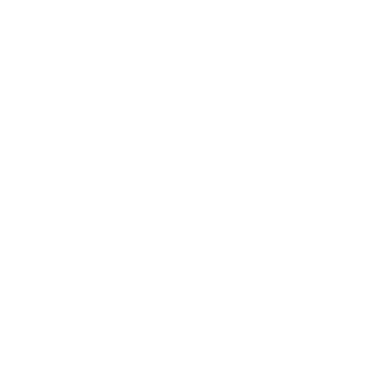

Processing image 685/1511


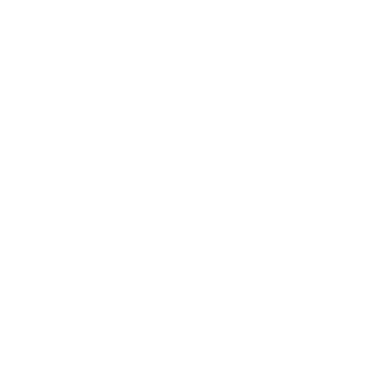

Processing image 686/1511


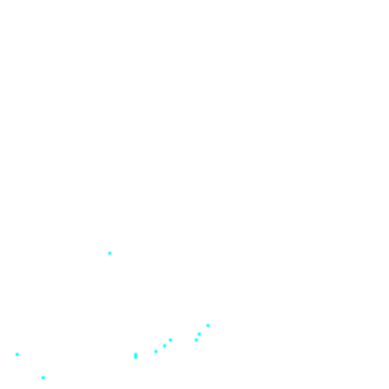

Processing image 687/1511


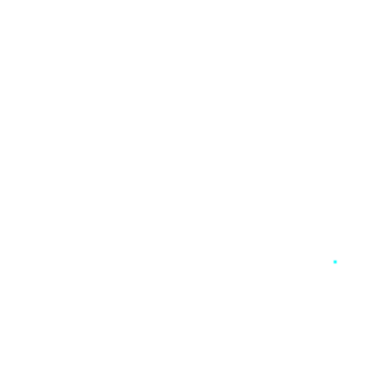

Processing image 688/1511


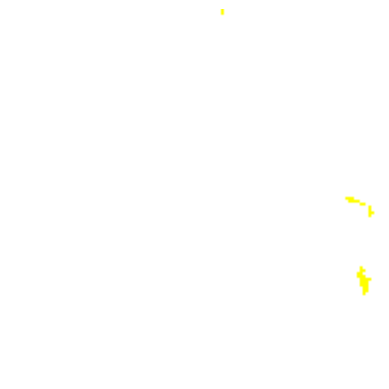

Processing image 689/1511


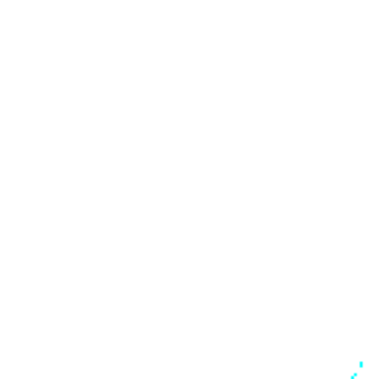

Processing image 690/1511


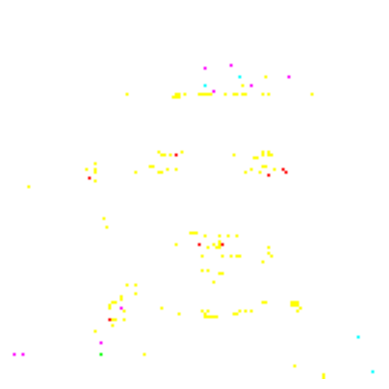

Processing image 691/1511


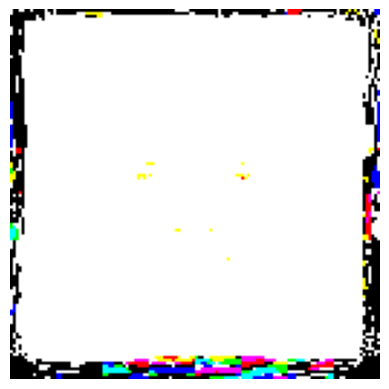

Processing image 692/1511


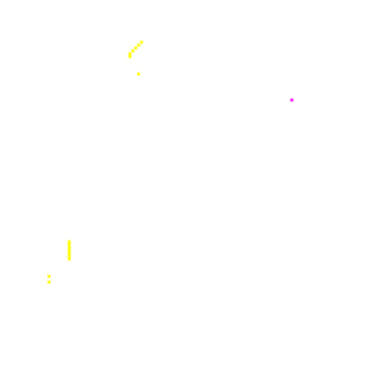

Processing image 693/1511


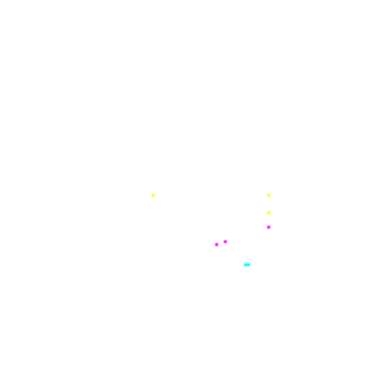

Processing image 694/1511


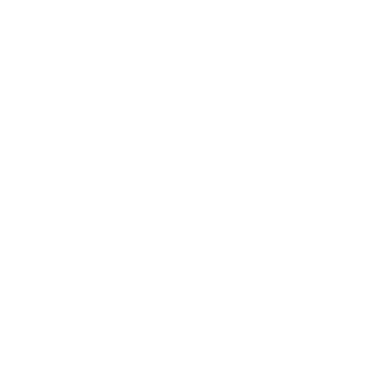

Processing image 695/1511


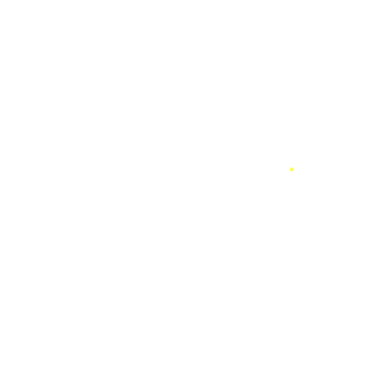

Processing image 696/1511


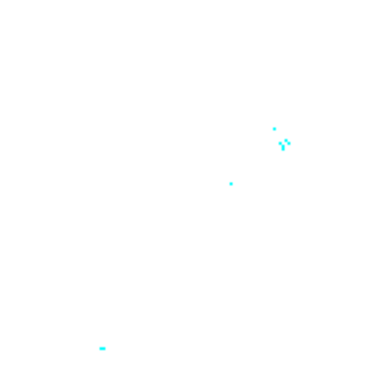

Processing image 697/1511


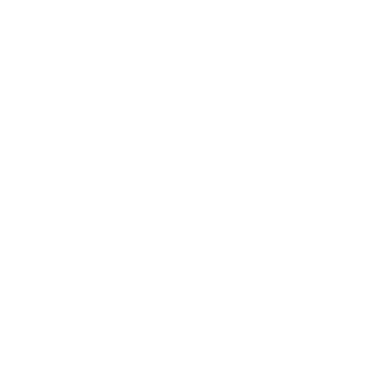

Processing image 698/1511


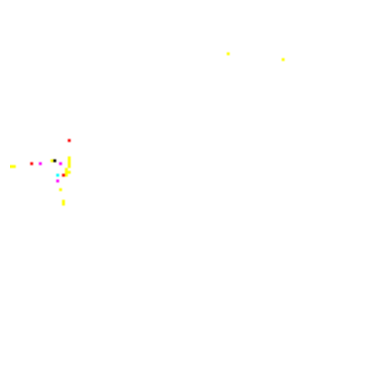

Processing image 699/1511


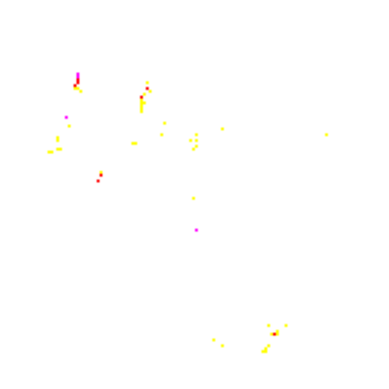

Processing image 700/1511


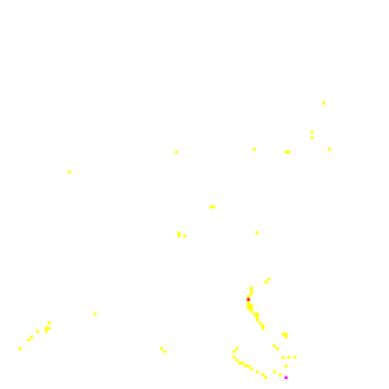

Processing image 701/1511


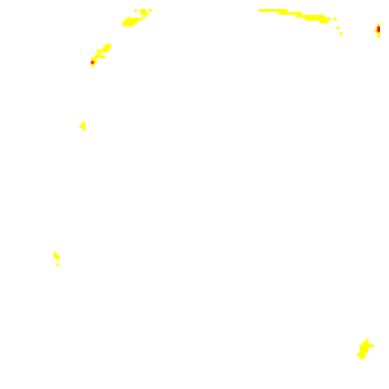

Processing image 702/1511


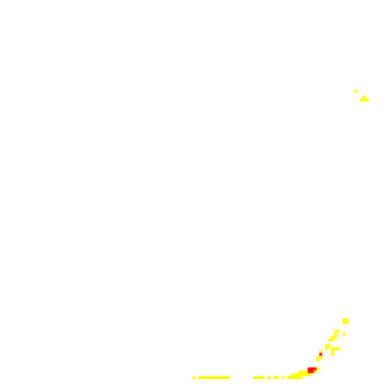

Processing image 703/1511


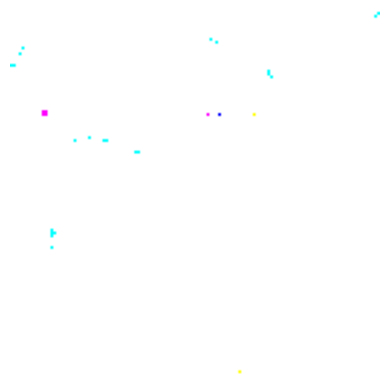

Processing image 704/1511


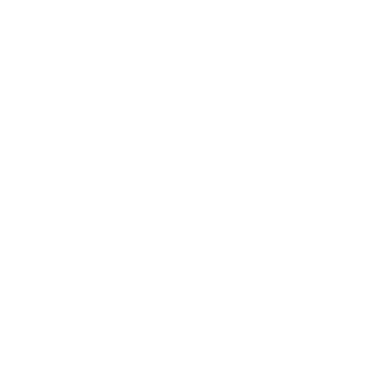

Processing image 705/1511


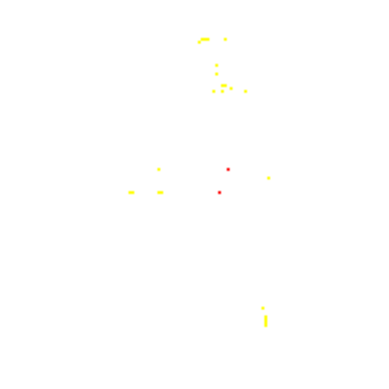

Processing image 706/1511


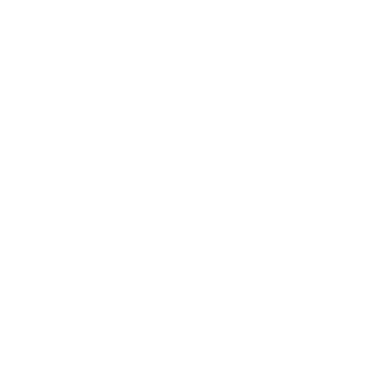

Processing image 707/1511


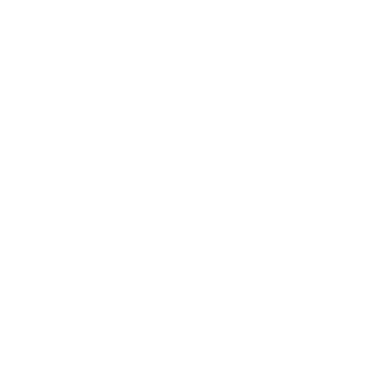

Processing image 708/1511


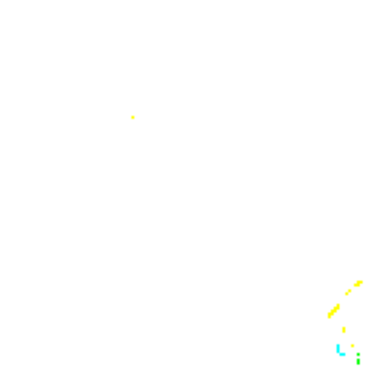

Processing image 709/1511


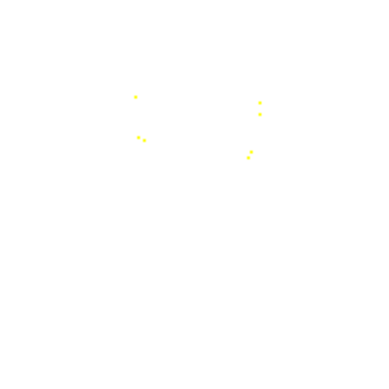

Processing image 710/1511


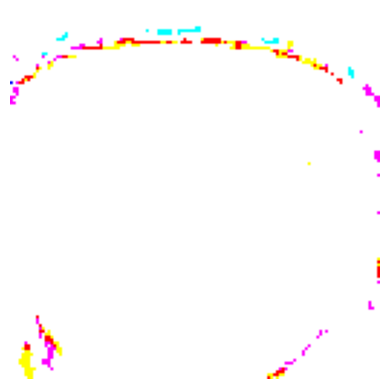

Processing image 711/1511


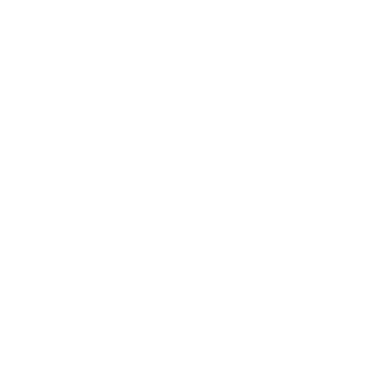

Processing image 712/1511


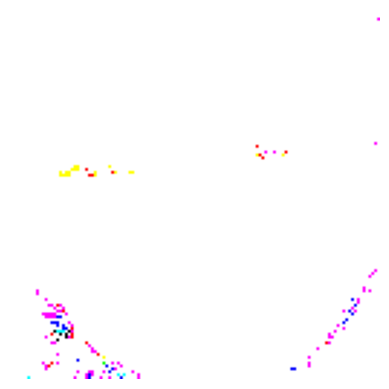

Processing image 713/1511


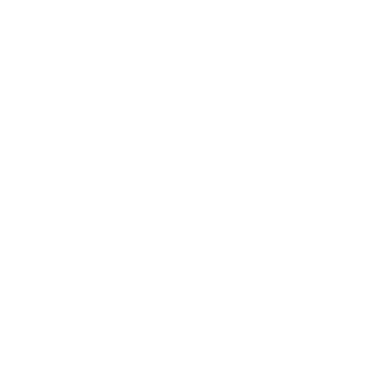

Processing image 714/1511


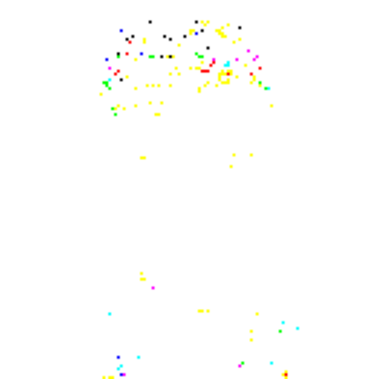

Processing image 715/1511


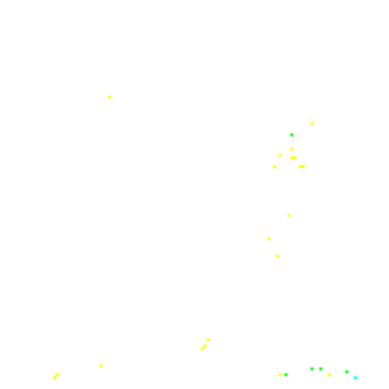

Processing image 716/1511


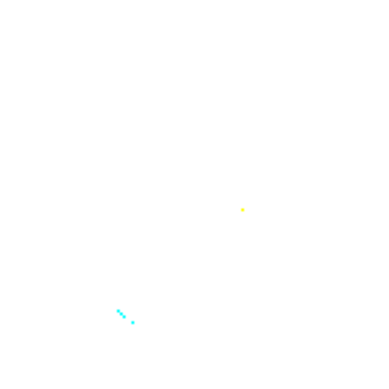

Processing image 717/1511


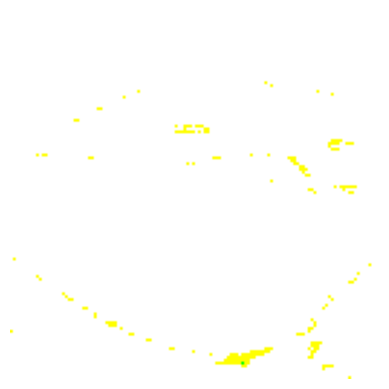

Processing image 718/1511


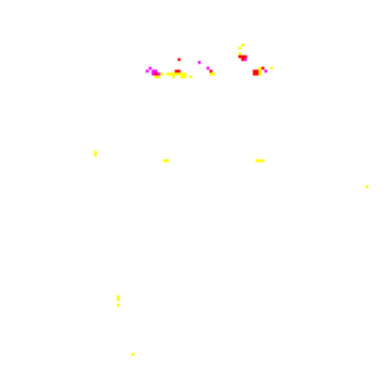

Processing image 719/1511


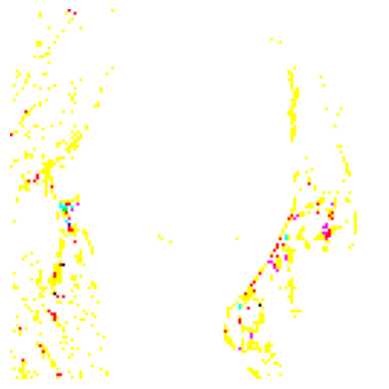

Processing image 720/1511


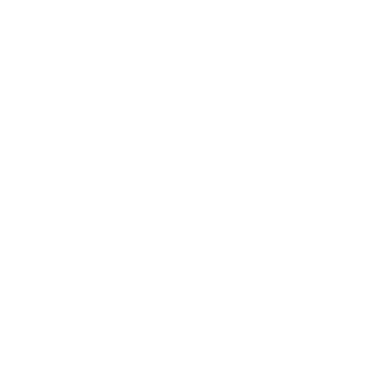

Processing image 721/1511


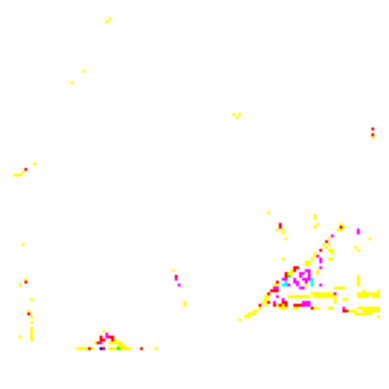

Processing image 722/1511


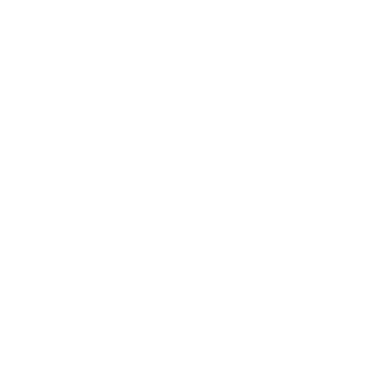

Processing image 723/1511


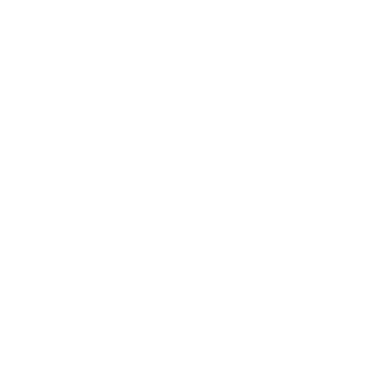

Processing image 724/1511


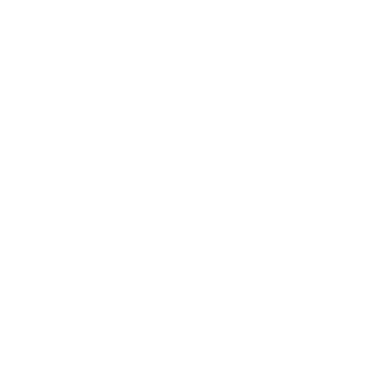

Processing image 725/1511


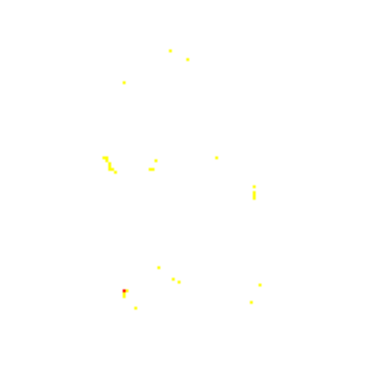

Processing image 726/1511


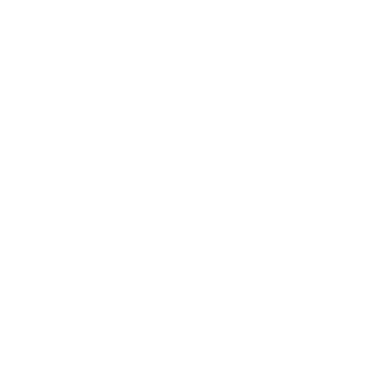

Processing image 727/1511


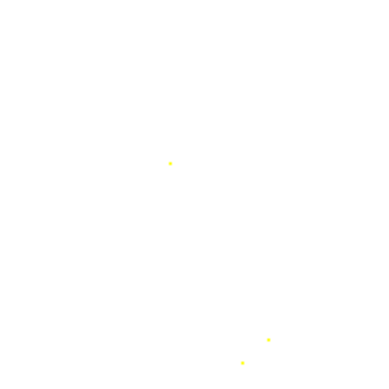

Processing image 728/1511


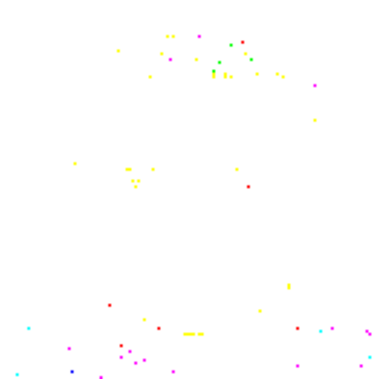

Processing image 729/1511


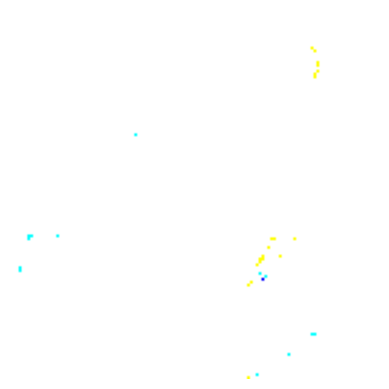

Processing image 730/1511


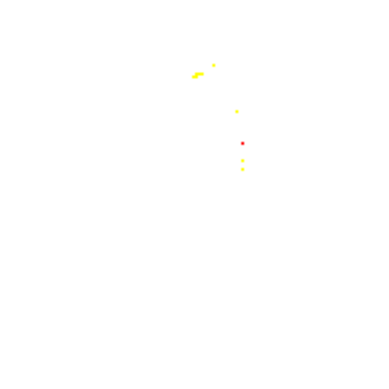

Processing image 731/1511


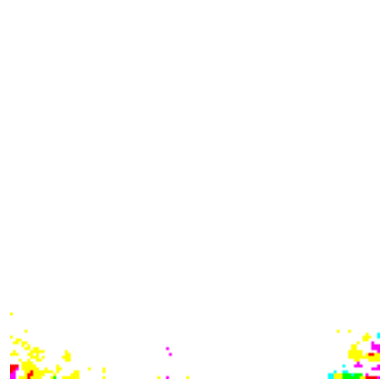

Processing image 732/1511


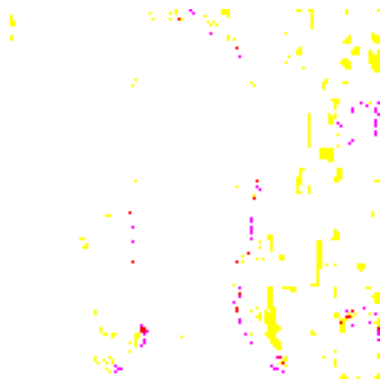

Processing image 733/1511


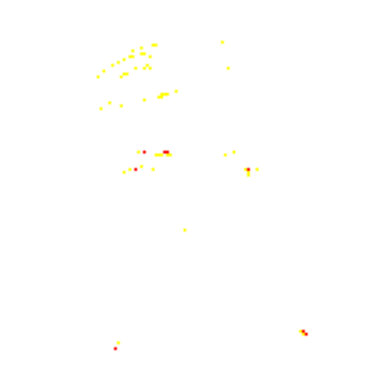

Processing image 734/1511


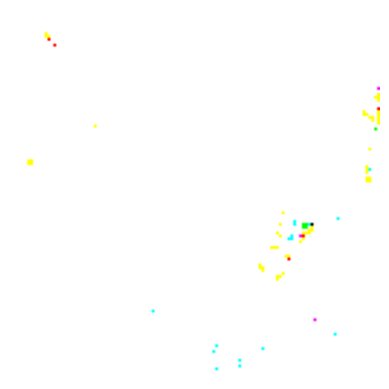

Processing image 735/1511


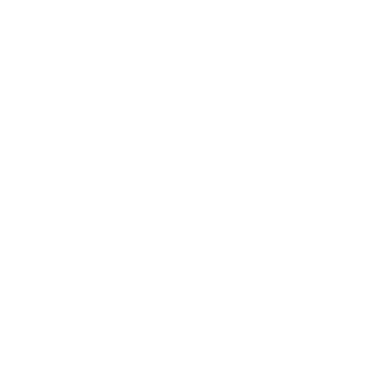

Processing image 736/1511


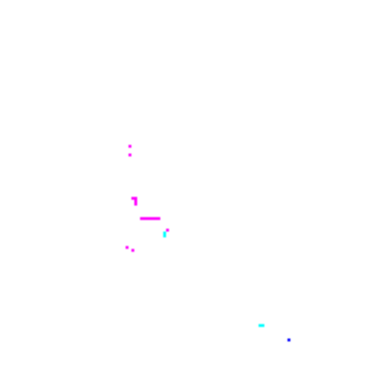

Processing image 737/1511


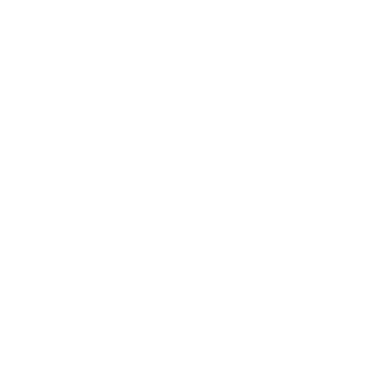

Processing image 738/1511


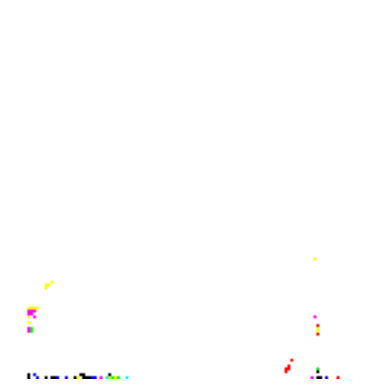

Processing image 739/1511


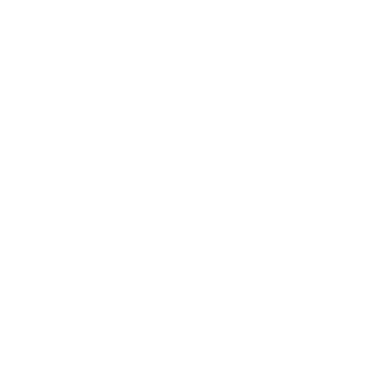

Processing image 740/1511


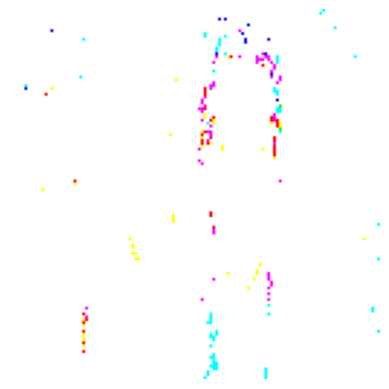

Processing image 741/1511


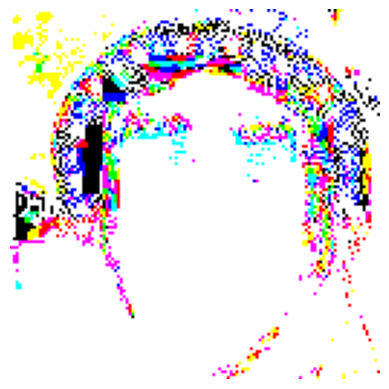

Processing image 742/1511


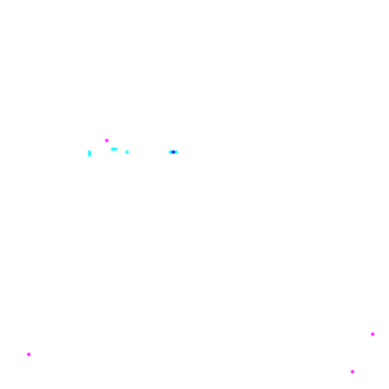

Processing image 743/1511


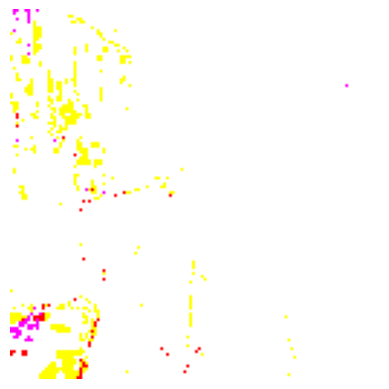

Processing image 744/1511


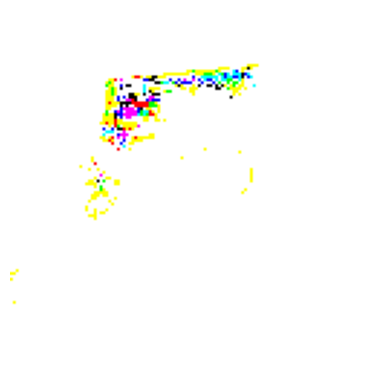

Processing image 745/1511


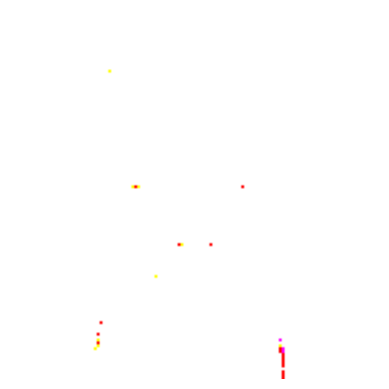

Processing image 746/1511


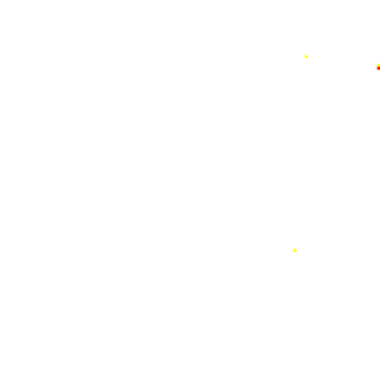

Processing image 747/1511


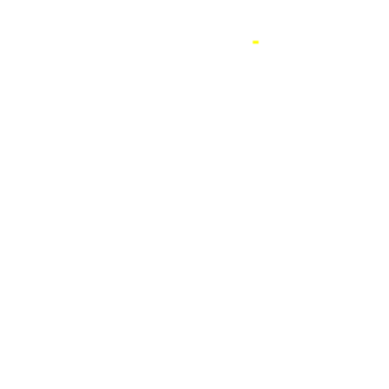

Processing image 748/1511


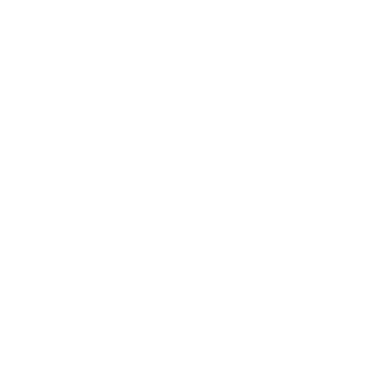

Processing image 749/1511


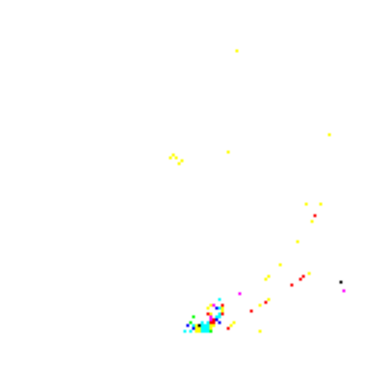

Processing image 750/1511


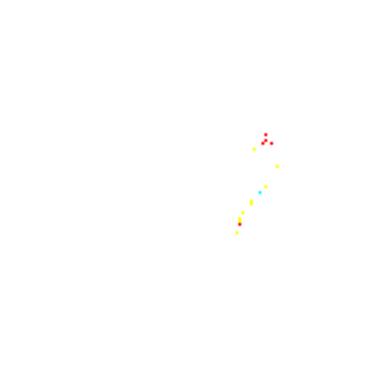

Processing image 751/1511


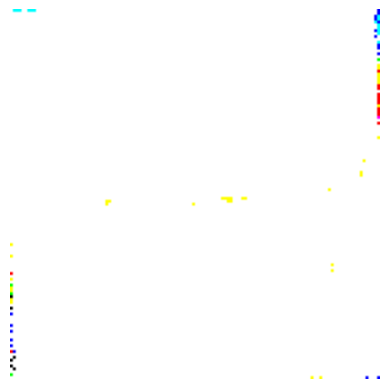

Processing image 752/1511


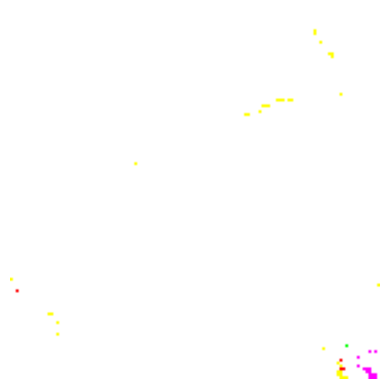

Processing image 753/1511


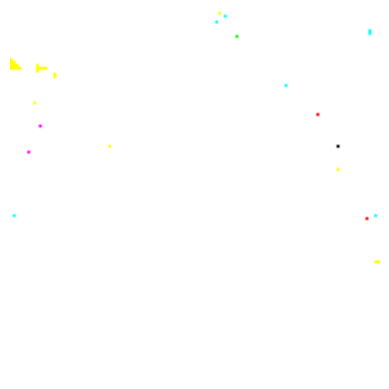

Processing image 754/1511


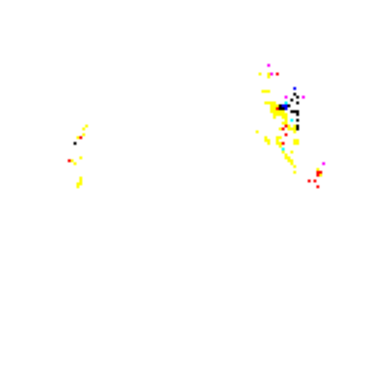

Processing image 755/1511


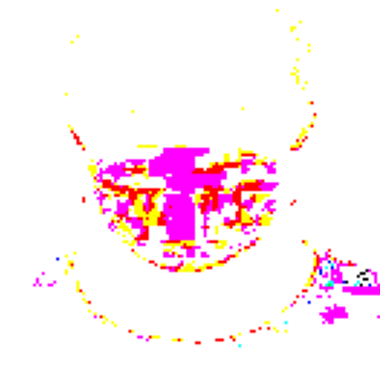

Processing image 756/1511


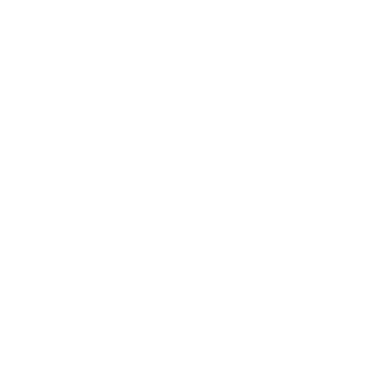

Processing image 757/1511


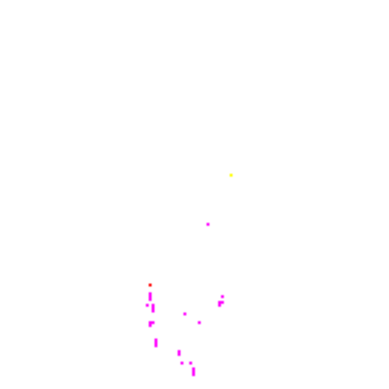

Processing image 758/1511


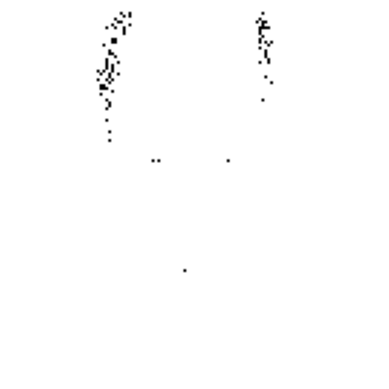

Processing image 759/1511


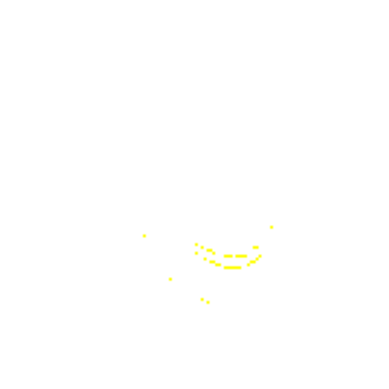

Processing image 760/1511


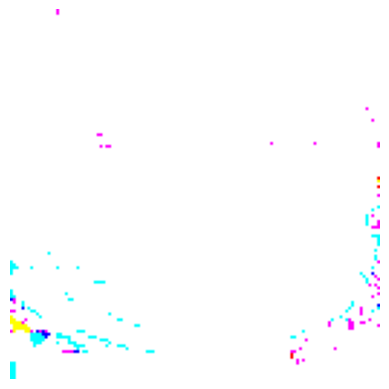

Processing image 761/1511


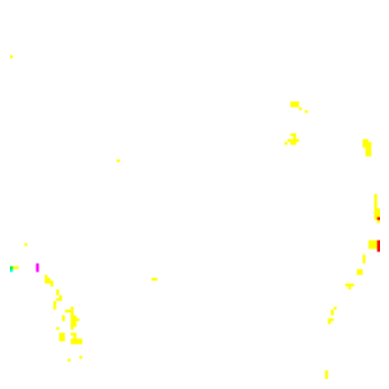

Processing image 762/1511


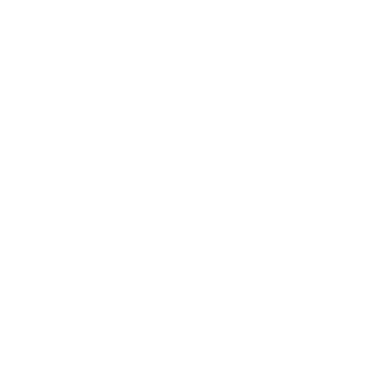

Processing image 763/1511


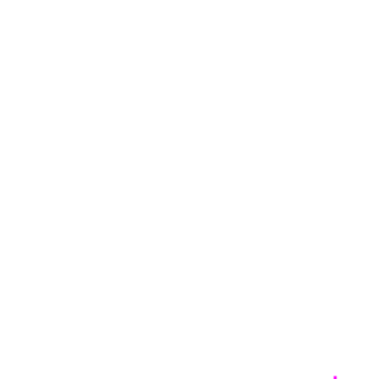

Processing image 764/1511


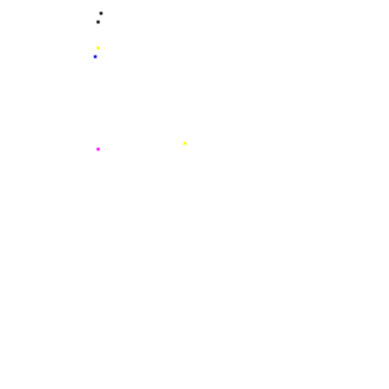

Processing image 765/1511


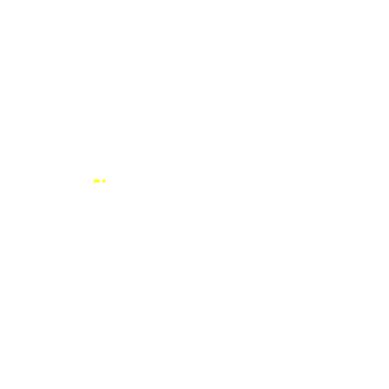

Processing image 766/1511


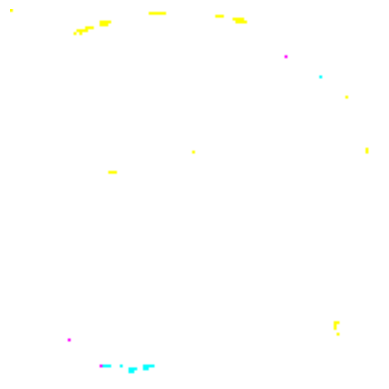

Processing image 767/1511


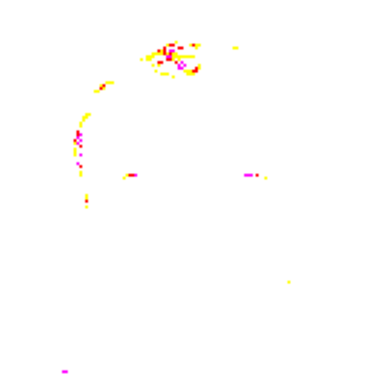

Processing image 768/1511


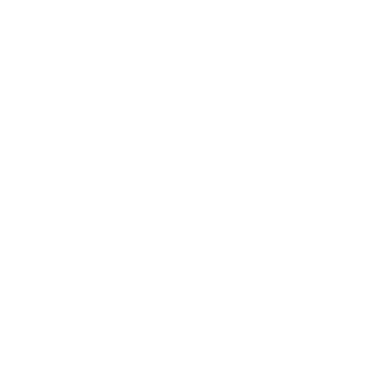

Processing image 769/1511


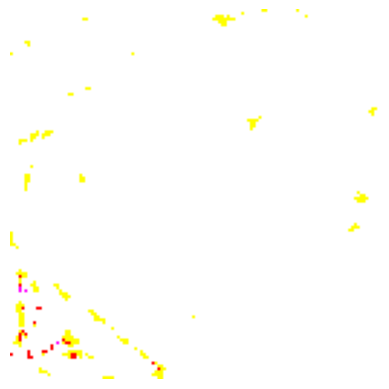

Processing image 770/1511


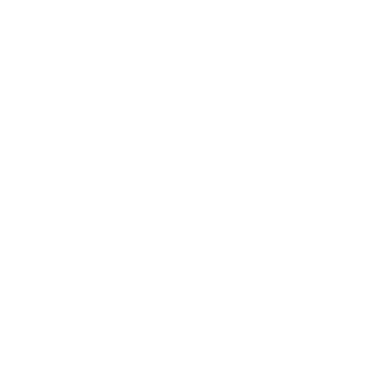

Processing image 771/1511


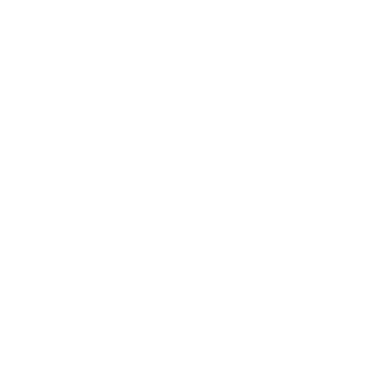

Processing image 772/1511


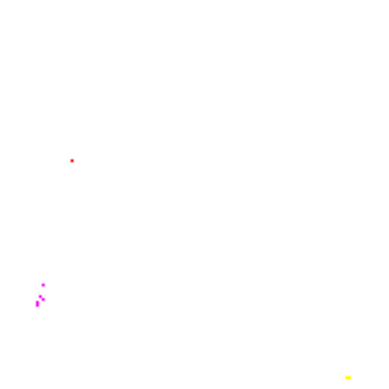

Processing image 773/1511


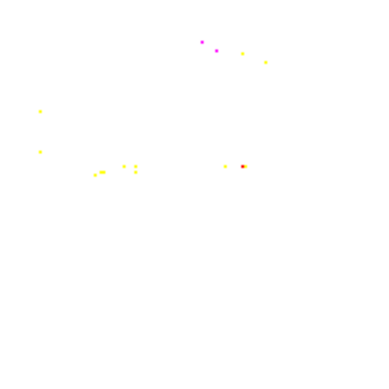

Processing image 774/1511


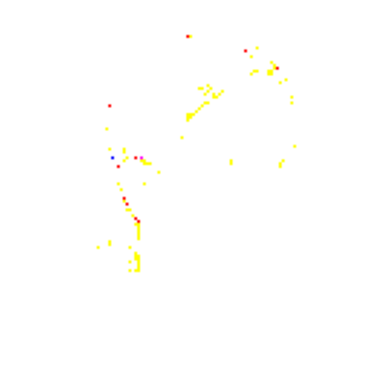

Processing image 775/1511


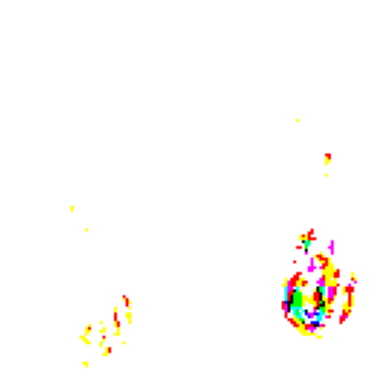

Processing image 776/1511


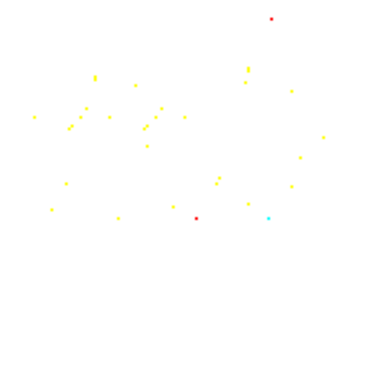

Processing image 777/1511


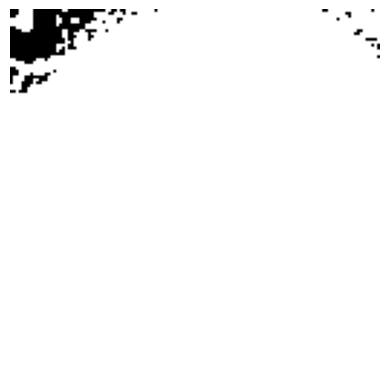

Processing image 778/1511


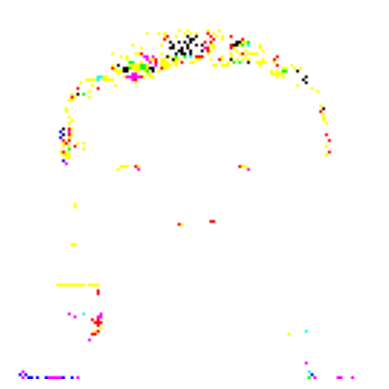

Processing image 779/1511


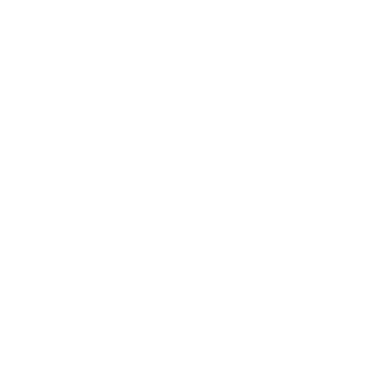

Processing image 780/1511


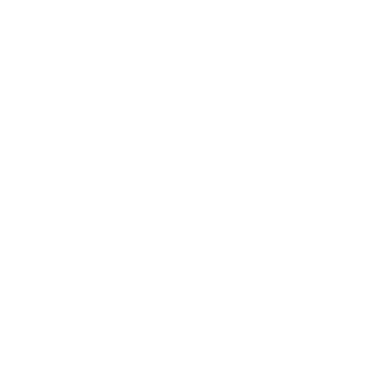

Processing image 781/1511


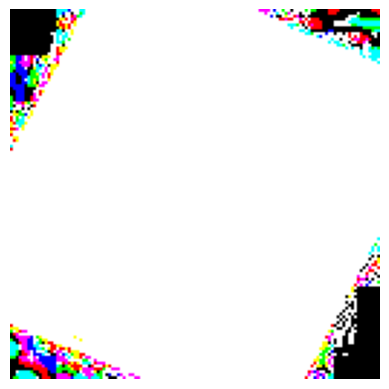

Processing image 782/1511


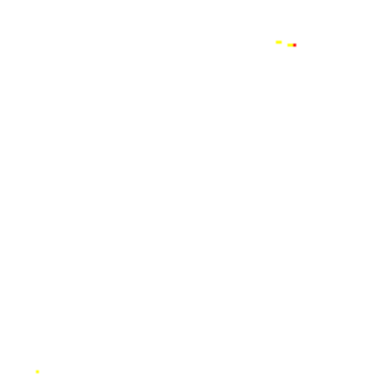

Processing image 783/1511


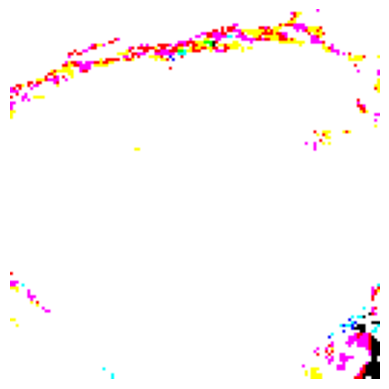

Processing image 784/1511


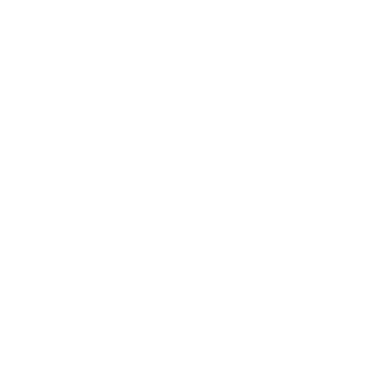

Processing image 785/1511


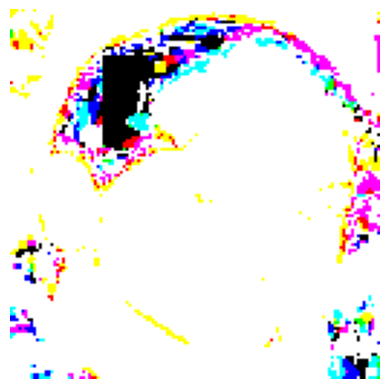

Processing image 786/1511


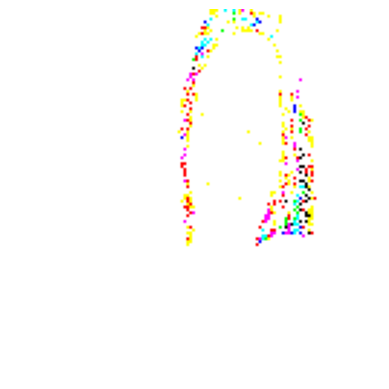

Processing image 787/1511


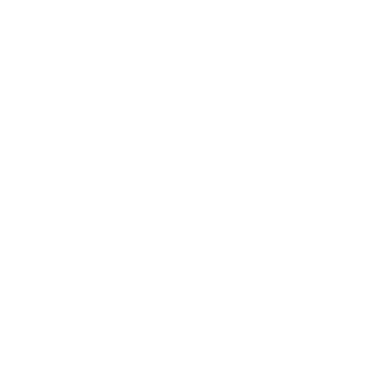

Processing image 788/1511


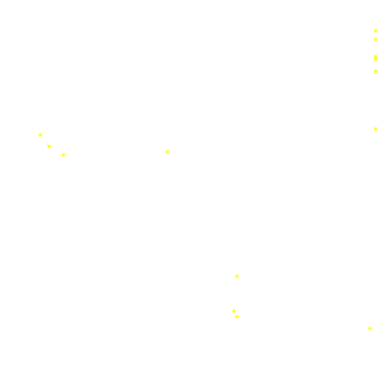

Processing image 789/1511


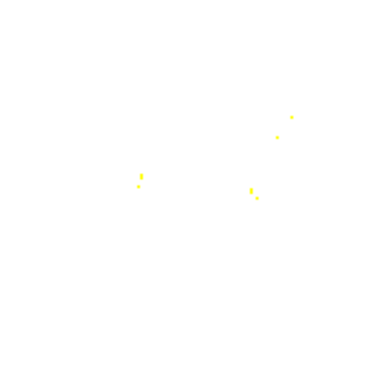

Processing image 790/1511


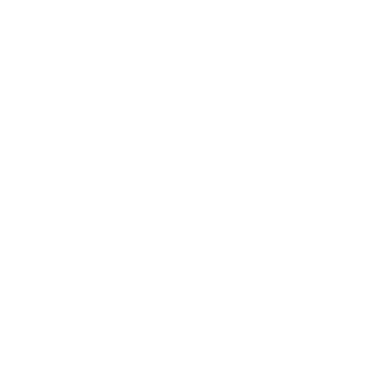

Processing image 791/1511


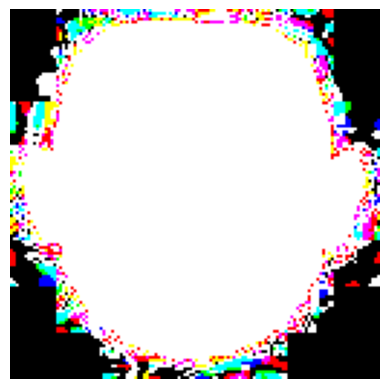

Processing image 792/1511


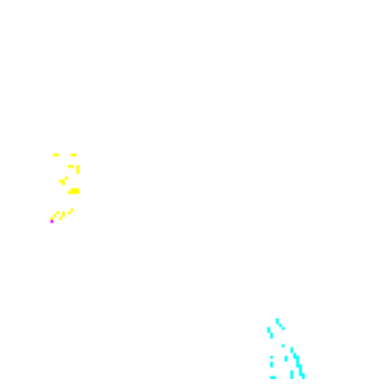

Processing image 793/1511


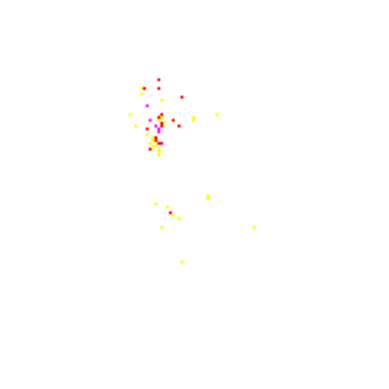

Processing image 794/1511


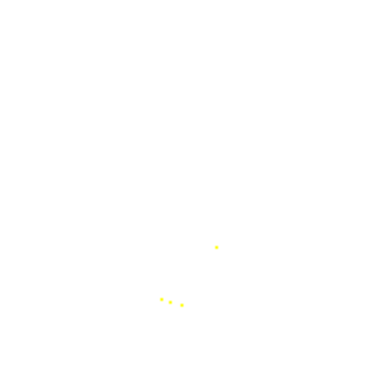

Processing image 795/1511


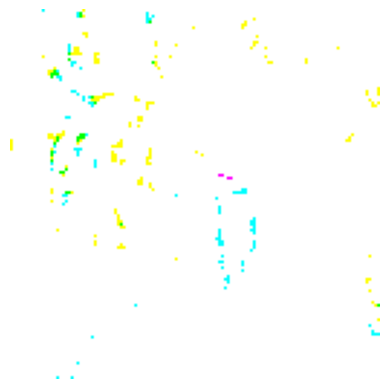

Processing image 796/1511


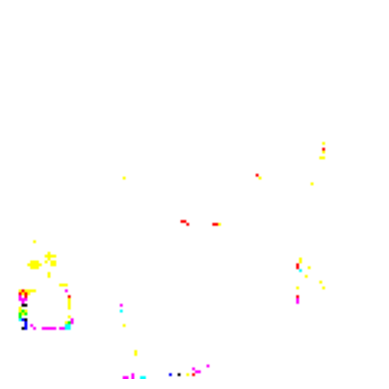

Processing image 797/1511


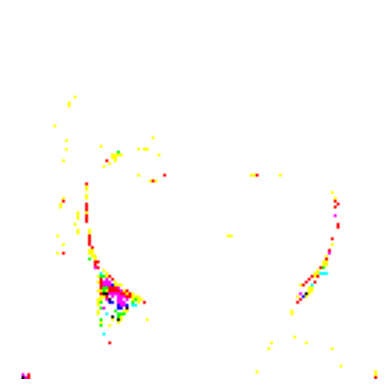

Processing image 798/1511


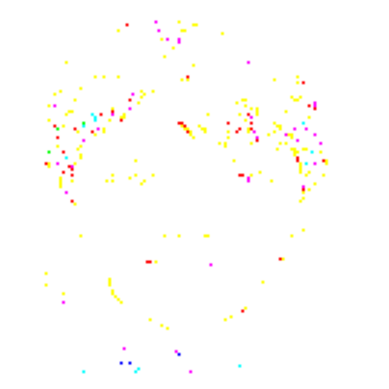

Processing image 799/1511


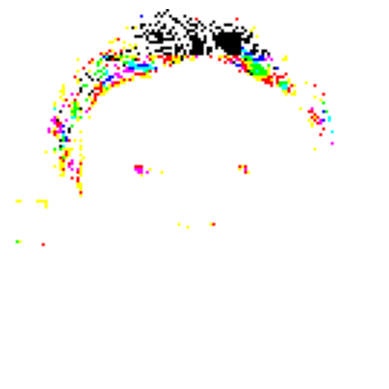

Processing image 800/1511


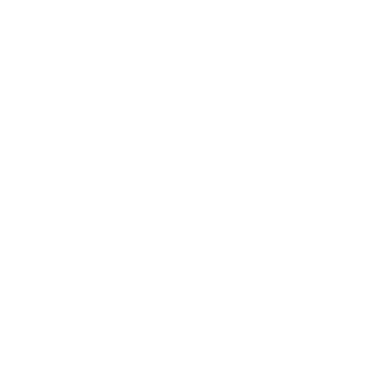

Processing image 801/1511


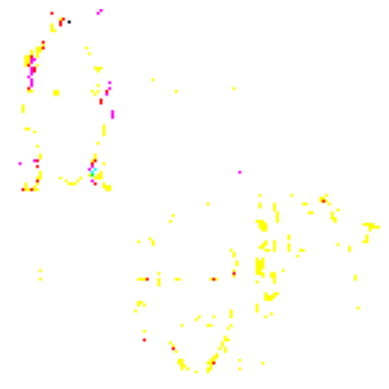

Processing image 802/1511


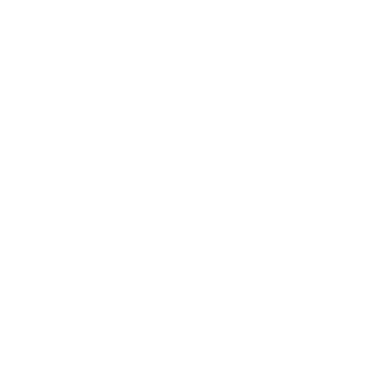

Processing image 803/1511


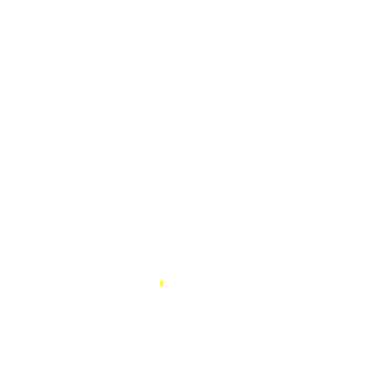

Processing image 804/1511


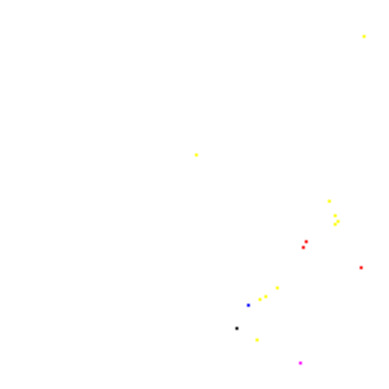

Processing image 805/1511


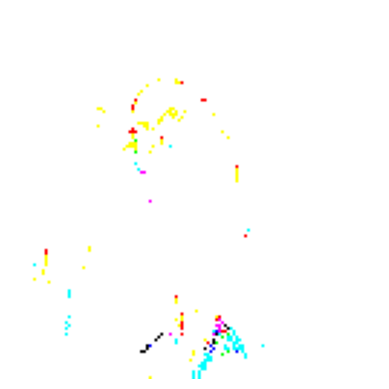

Processing image 806/1511


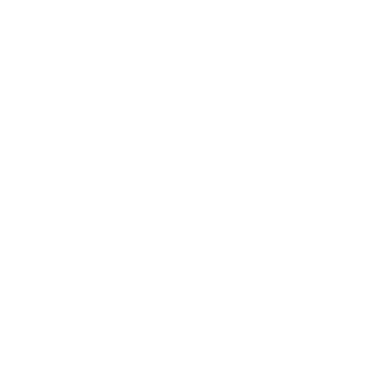

Processing image 807/1511


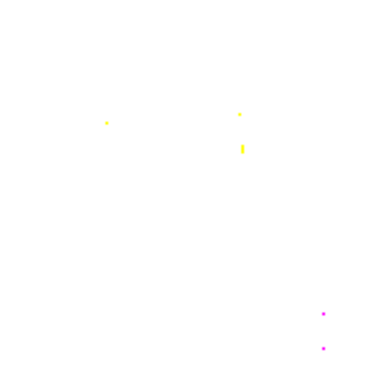

Processing image 808/1511


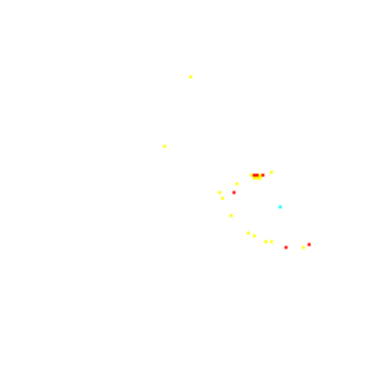

Processing image 809/1511


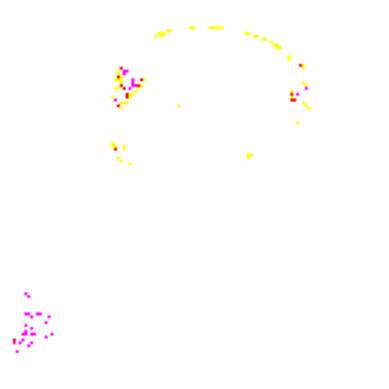

Processing image 810/1511


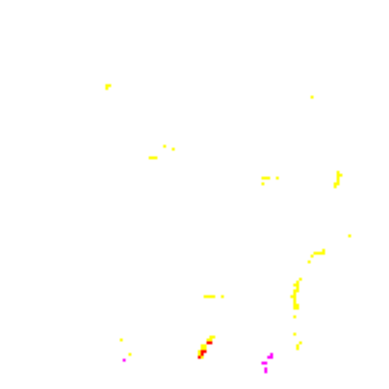

Processing image 811/1511


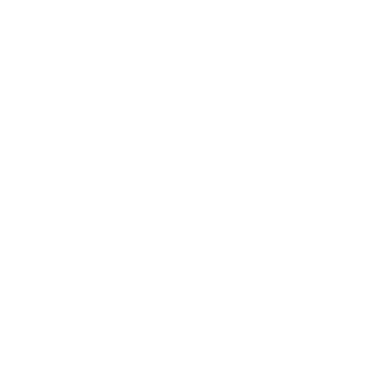

Processing image 812/1511


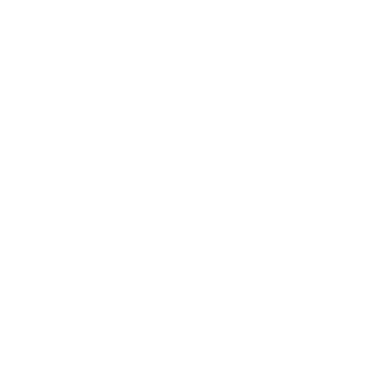

Processing image 813/1511


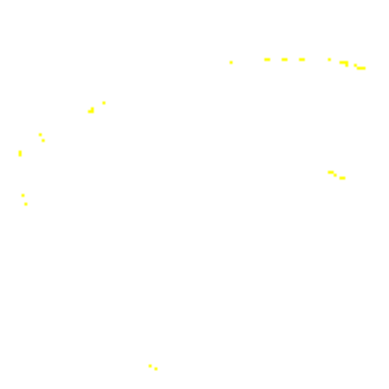

Processing image 814/1511


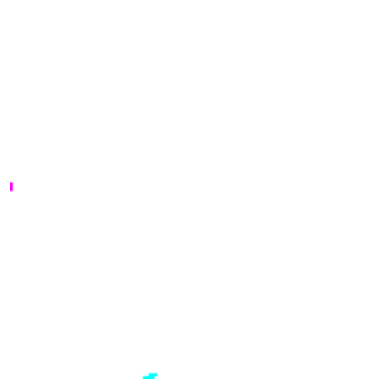

Processing image 815/1511


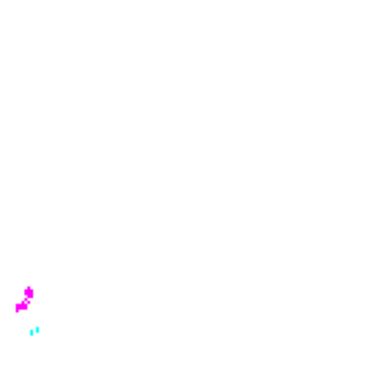

Processing image 816/1511


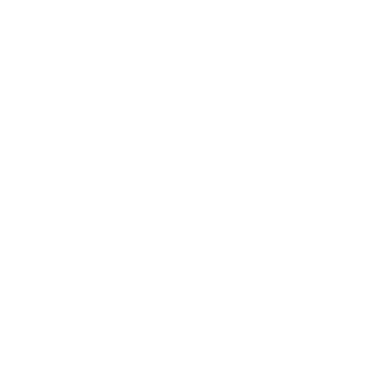

Processing image 817/1511


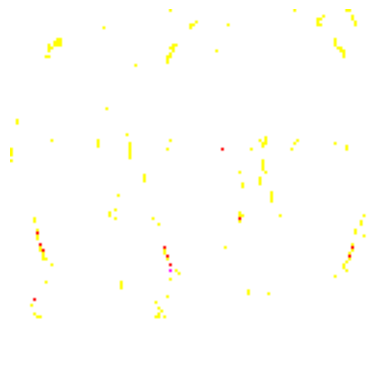

Processing image 818/1511


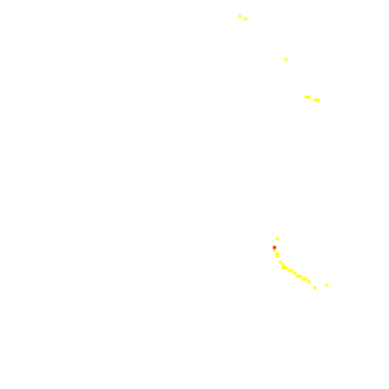

Processing image 819/1511


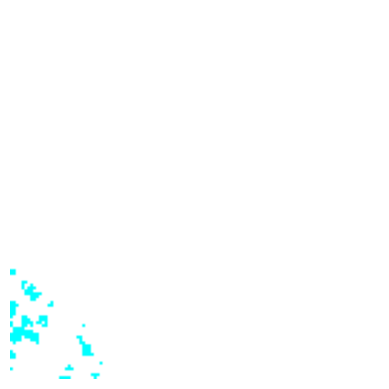

Processing image 820/1511


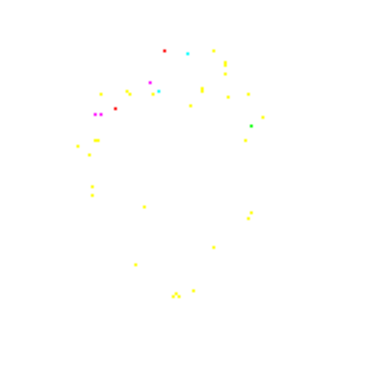

Processing image 821/1511


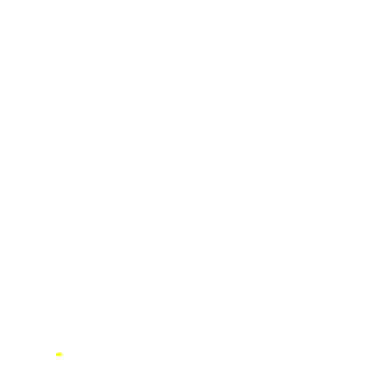

Processing image 822/1511


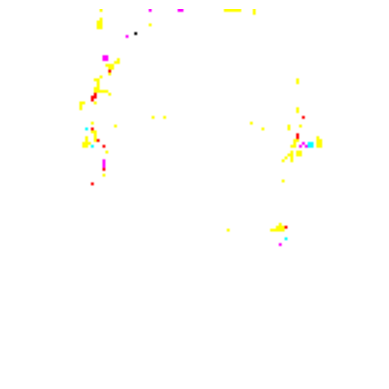

Processing image 823/1511


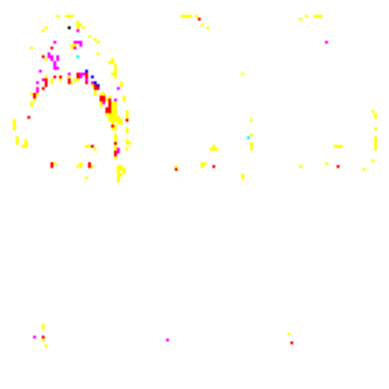

Processing image 824/1511


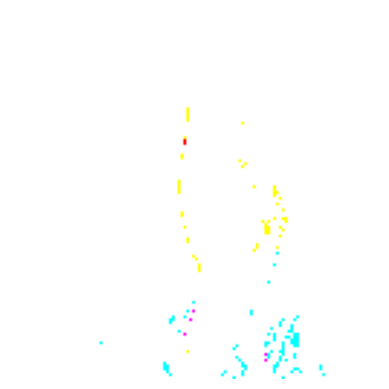

Processing image 825/1511


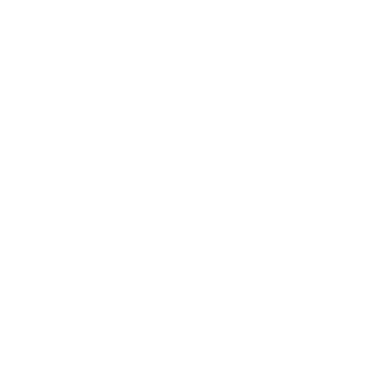

Processing image 826/1511


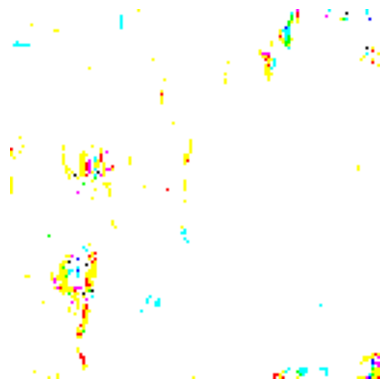

Processing image 827/1511


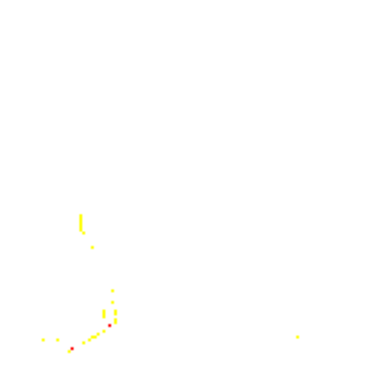

Processing image 828/1511


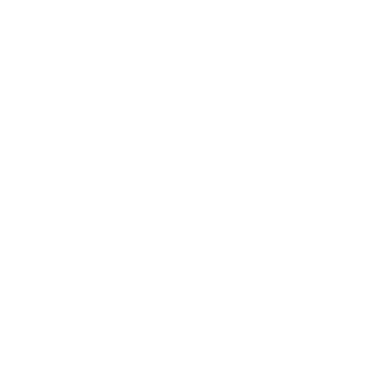

Processing image 829/1511


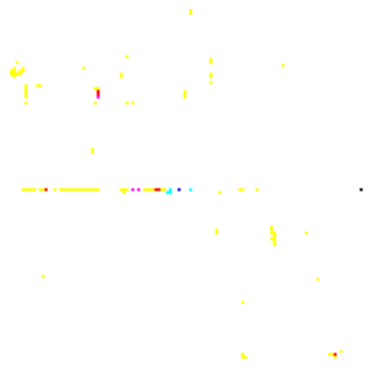

Processing image 830/1511


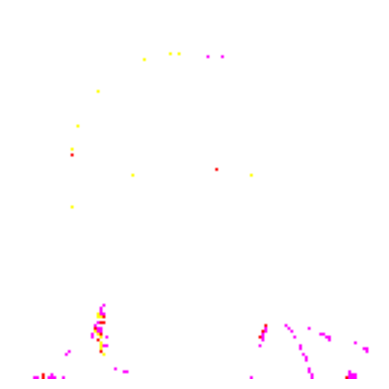

Processing image 831/1511


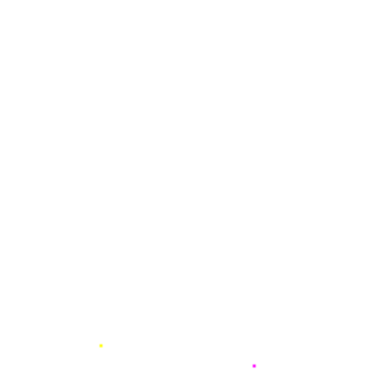

Processing image 832/1511


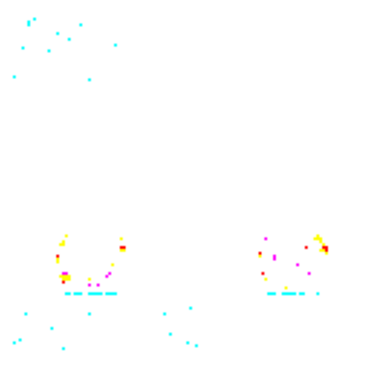

Processing image 833/1511


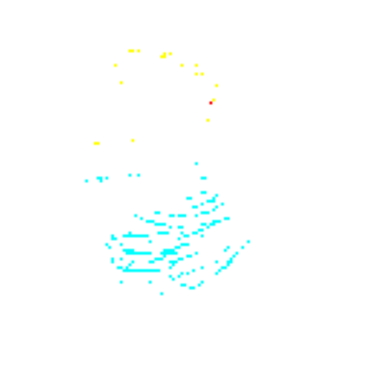

Processing image 834/1511


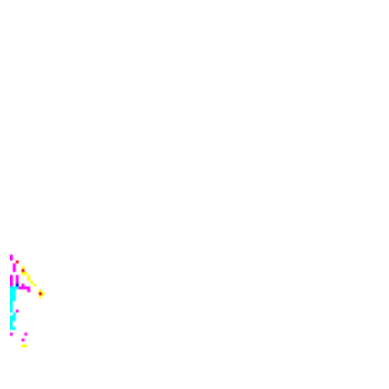

Processing image 835/1511


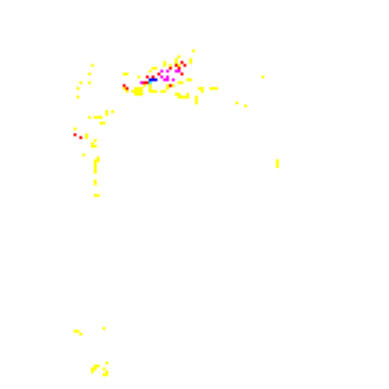

Processing image 836/1511


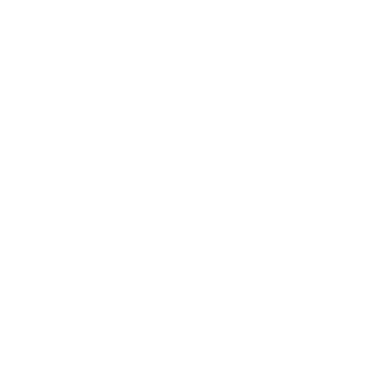

Processing image 837/1511


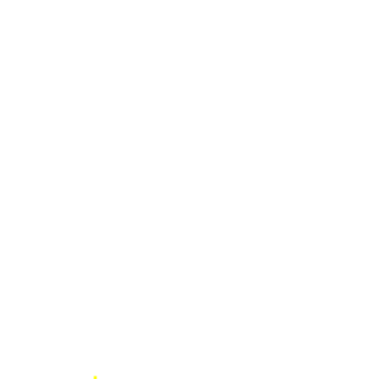

Processing image 838/1511


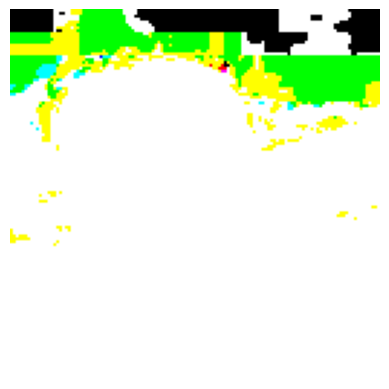

Processing image 839/1511


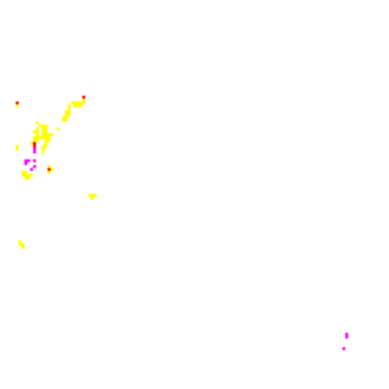

Processing image 840/1511


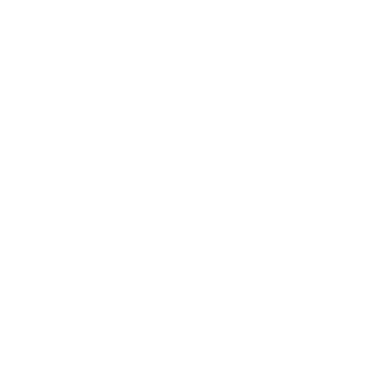

Processing image 841/1511


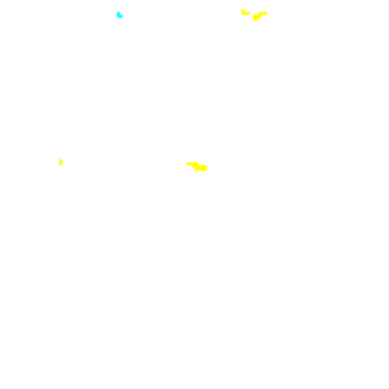

Processing image 842/1511


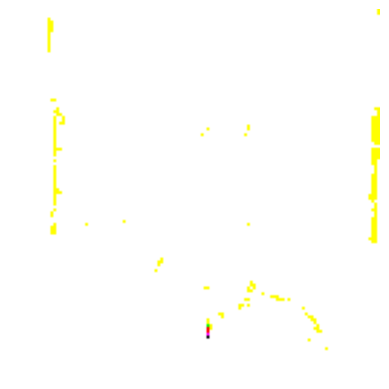

Processing image 843/1511


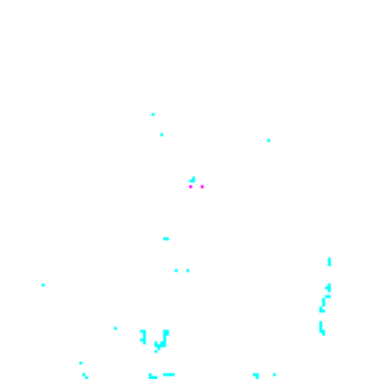

Processing image 844/1511


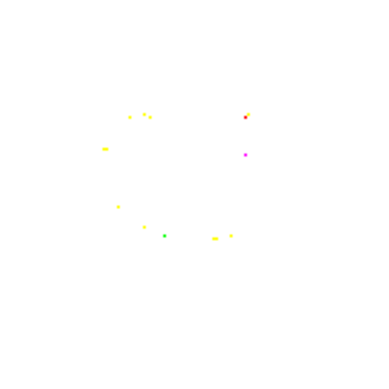

Processing image 845/1511


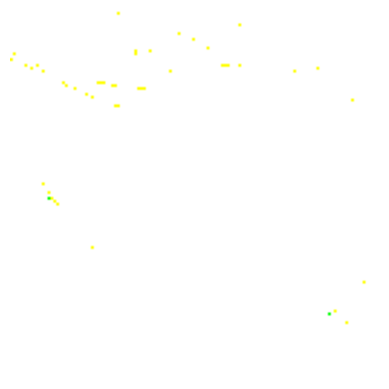

Processing image 846/1511


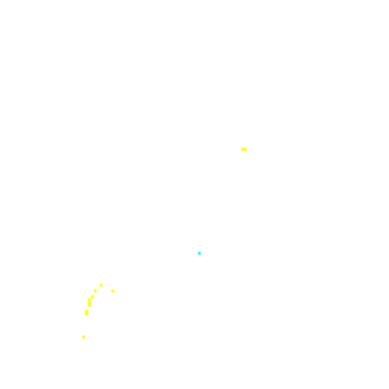

Processing image 847/1511


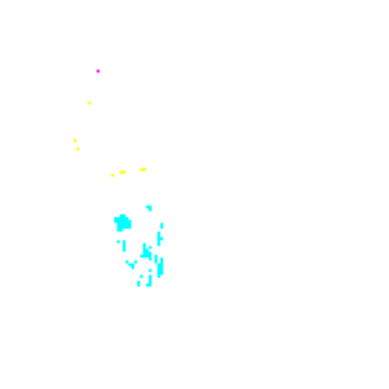

Processing image 848/1511


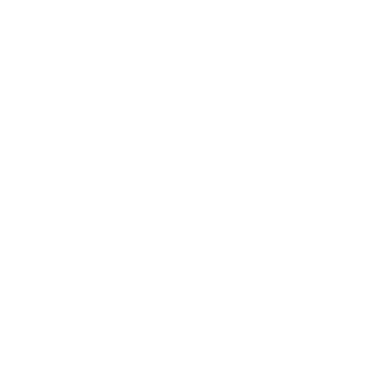

Processing image 849/1511


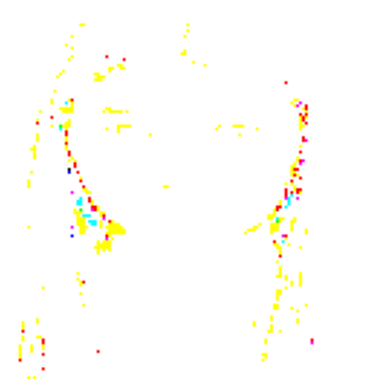

Processing image 850/1511


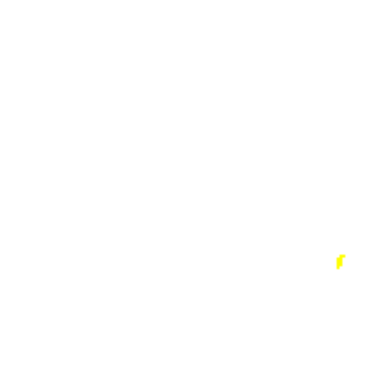

Processing image 851/1511


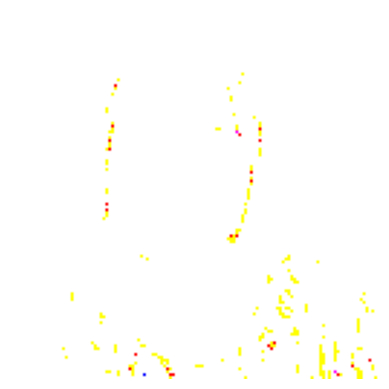

Processing image 852/1511


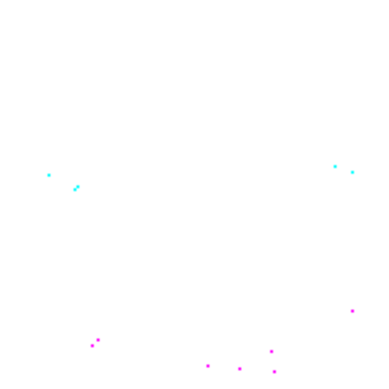

Processing image 853/1511


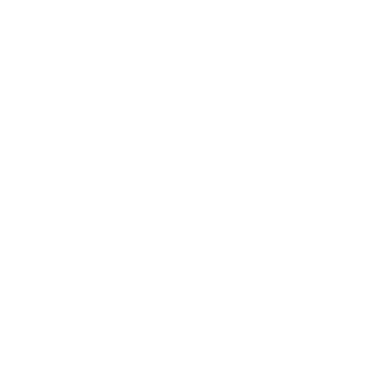

Processing image 854/1511


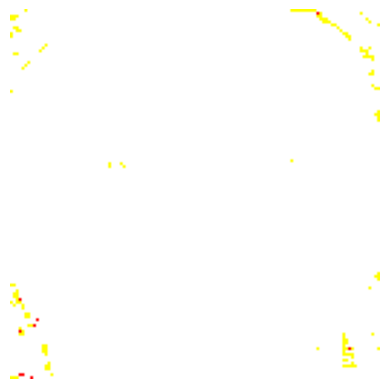

Processing image 855/1511


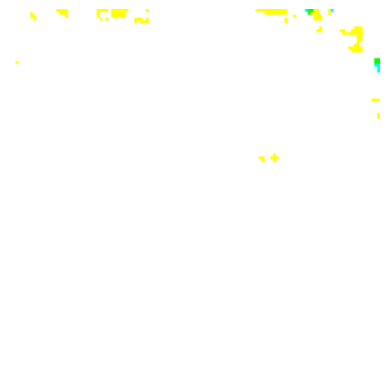

Processing image 856/1511


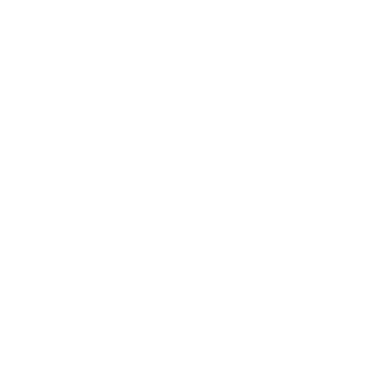

Processing image 857/1511


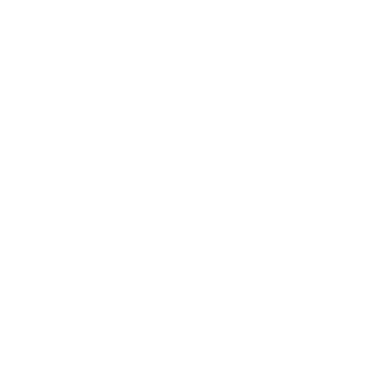

Processing image 858/1511


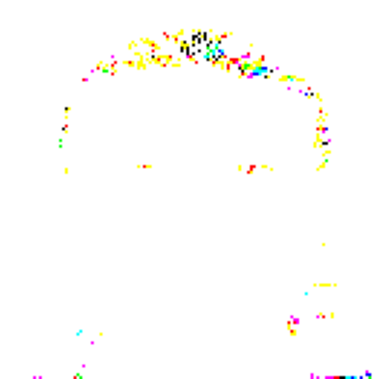

Processing image 859/1511


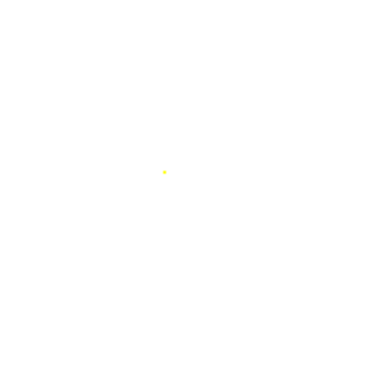

Processing image 860/1511


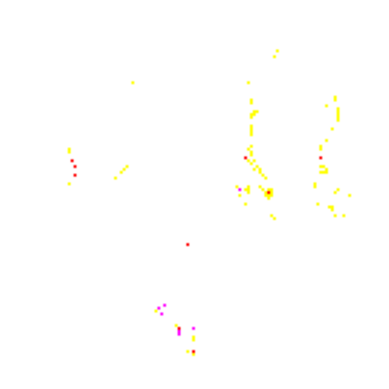

Processing image 861/1511


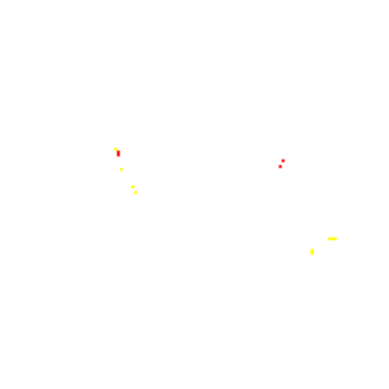

Processing image 862/1511


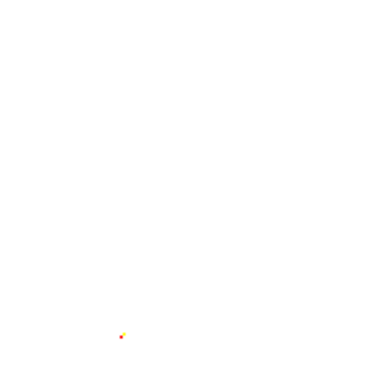

Processing image 863/1511


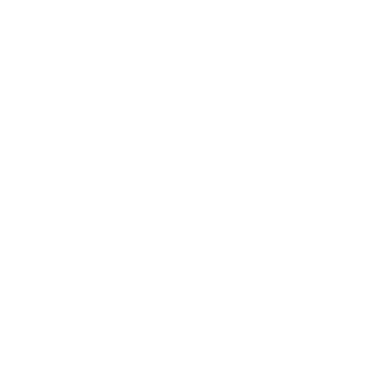

Processing image 864/1511


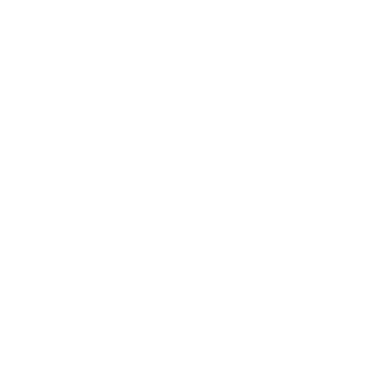

Processing image 865/1511


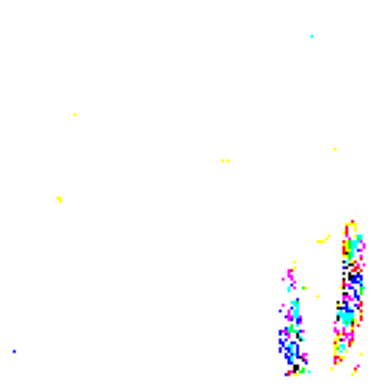

Processing image 866/1511


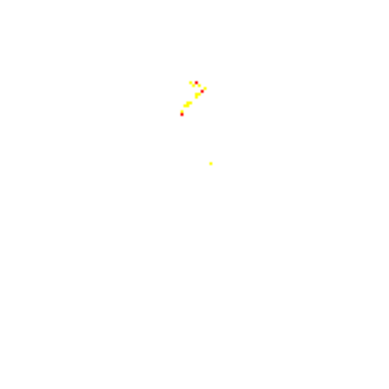

Processing image 867/1511


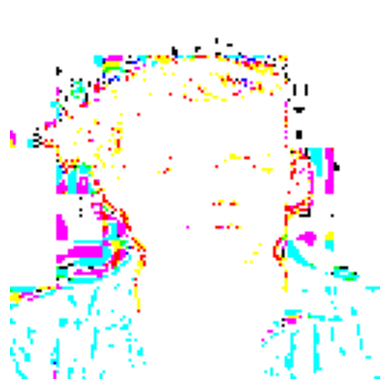

Processing image 868/1511


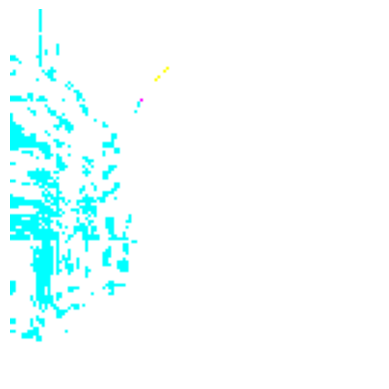

Processing image 869/1511


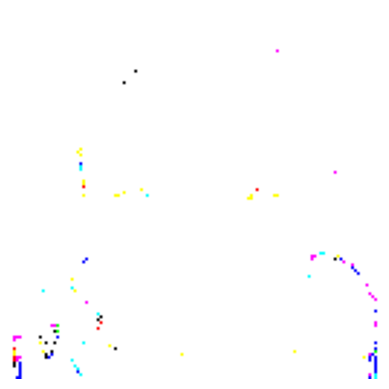

Processing image 870/1511


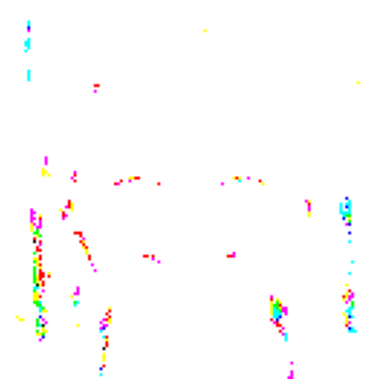

Processing image 871/1511


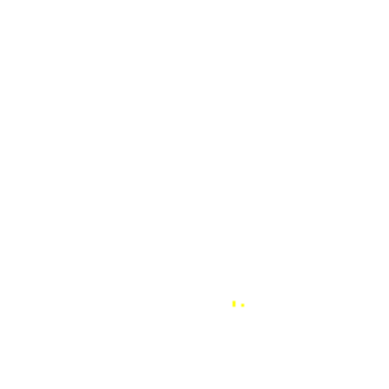

Processing image 872/1511


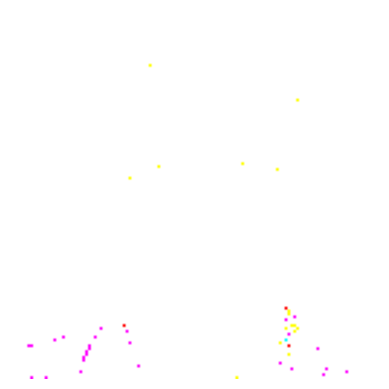

Processing image 873/1511


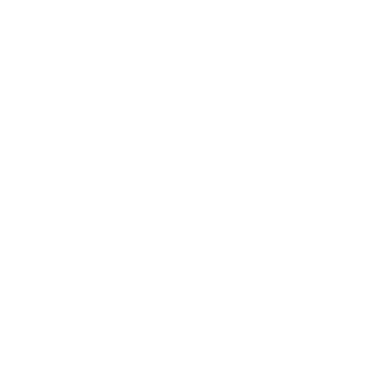

Processing image 874/1511


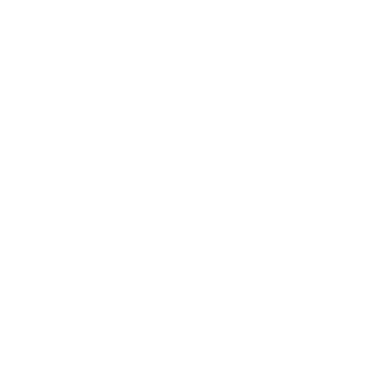

Processing image 875/1511


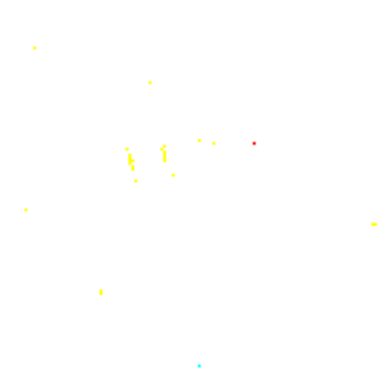

Processing image 876/1511


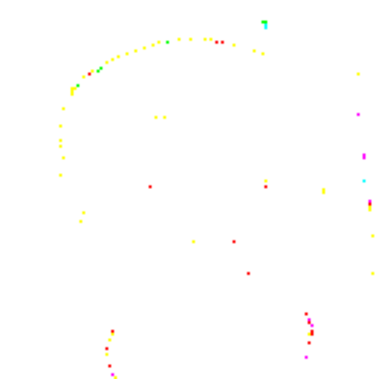

Processing image 877/1511


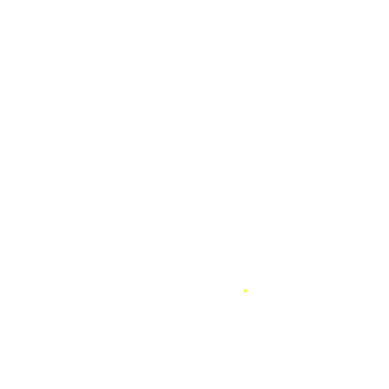

Processing image 878/1511


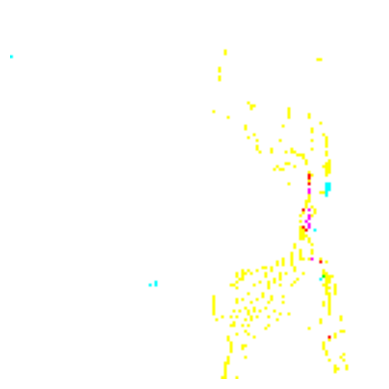

Processing image 879/1511


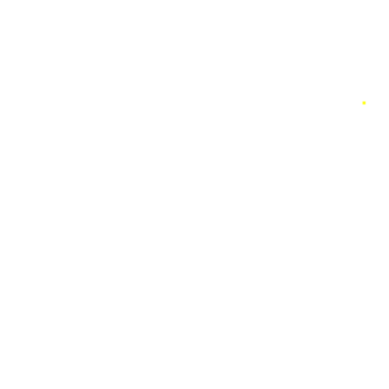

Processing image 880/1511


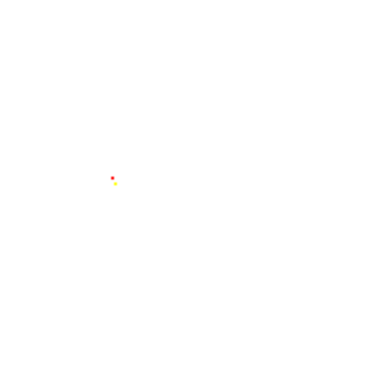

Processing image 881/1511


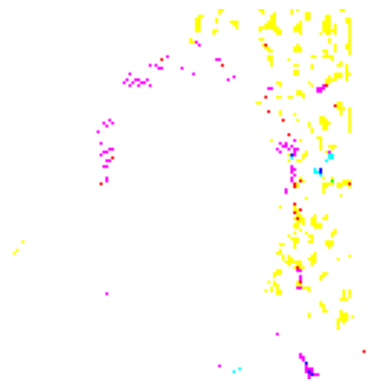

Processing image 882/1511


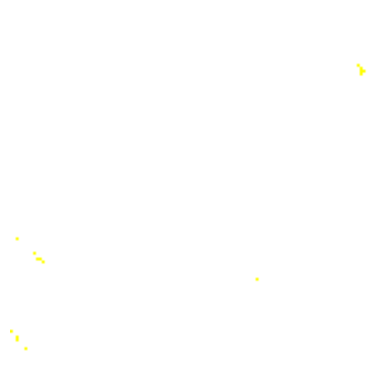

Processing image 883/1511


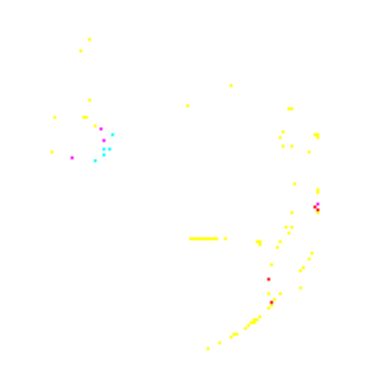

Processing image 884/1511


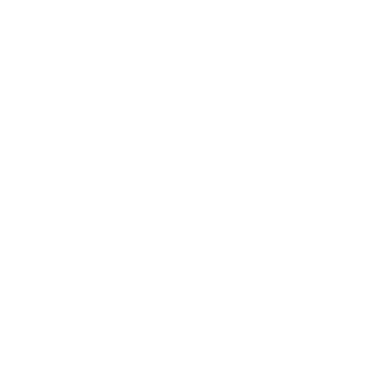

Processing image 885/1511


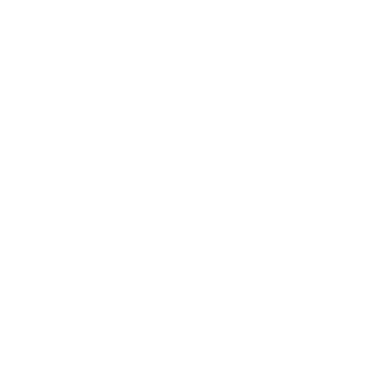

Processing image 886/1511


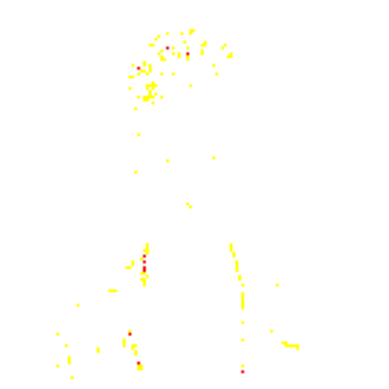

Processing image 887/1511


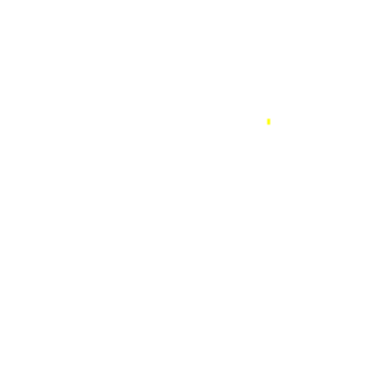

Processing image 888/1511


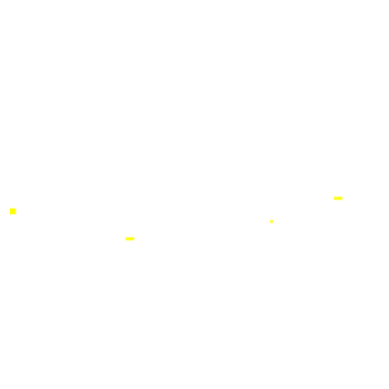

Processing image 889/1511


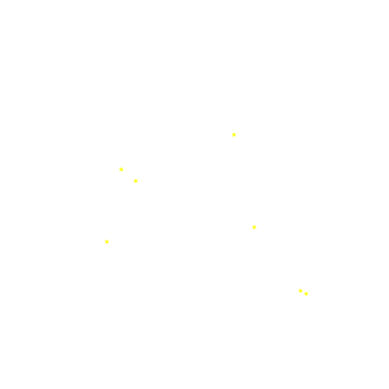

Processing image 890/1511


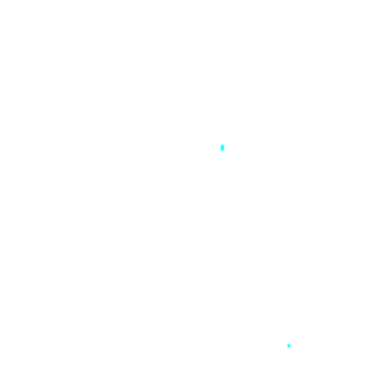

Processing image 891/1511


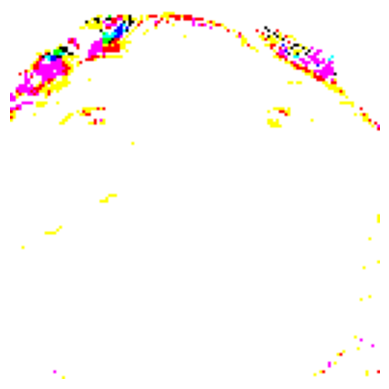

Processing image 892/1511


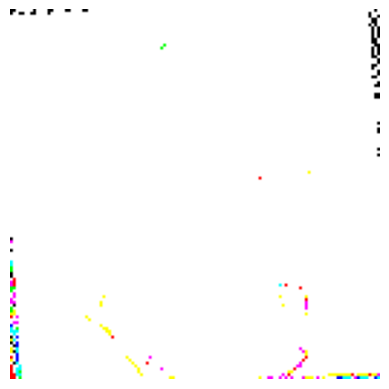

Processing image 893/1511


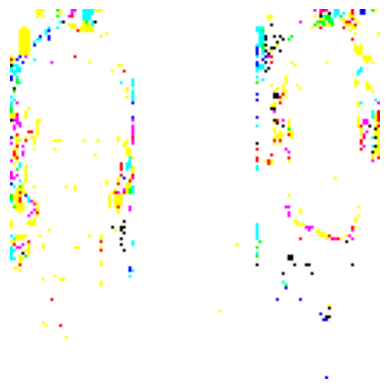

Processing image 894/1511


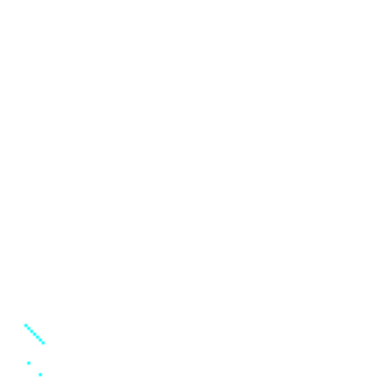

Processing image 895/1511


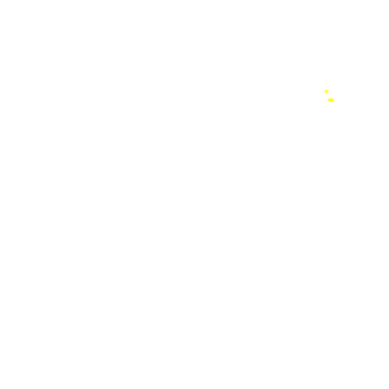

Processing image 896/1511


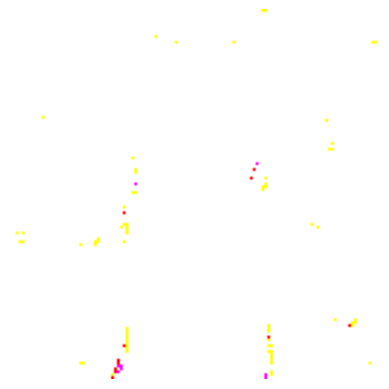

Processing image 897/1511


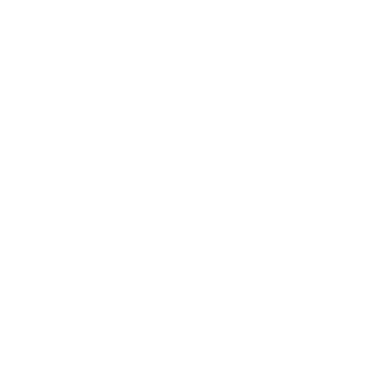

Processing image 898/1511


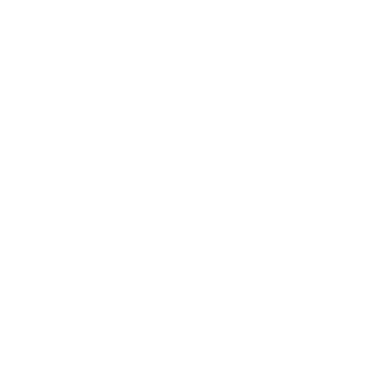

Processing image 899/1511


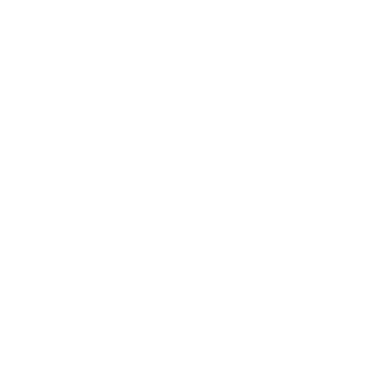

Processing image 900/1511


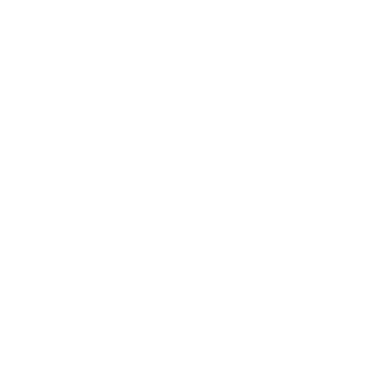

Processing image 901/1511


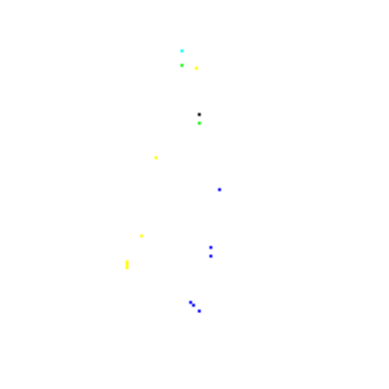

Processing image 902/1511


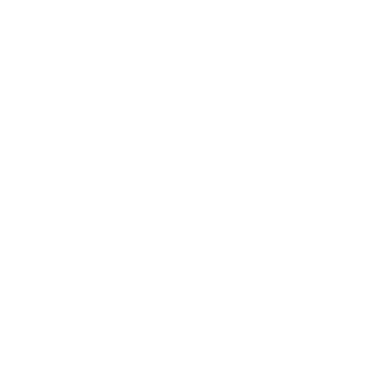

Processing image 903/1511


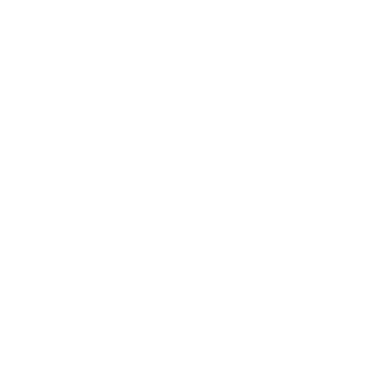

Processing image 904/1511


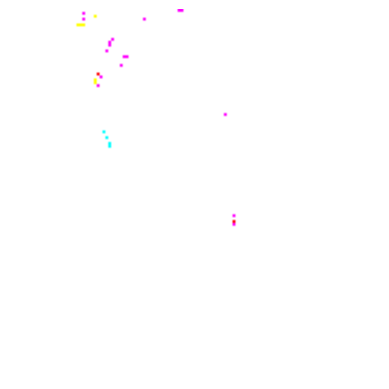

Processing image 905/1511


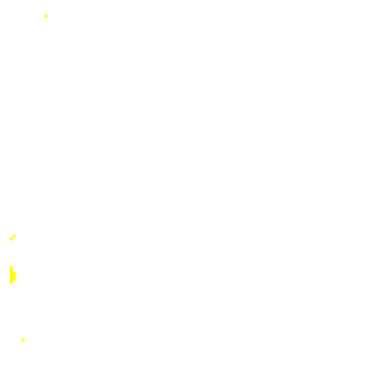

Processing image 906/1511


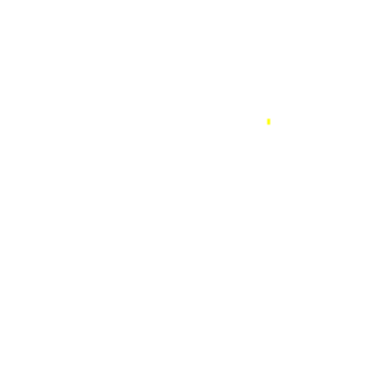

Processing image 907/1511


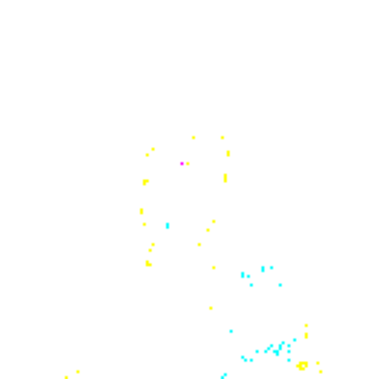

Processing image 908/1511


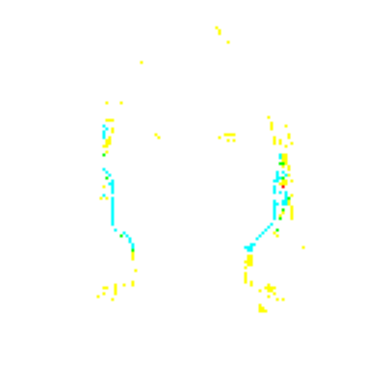

Processing image 909/1511


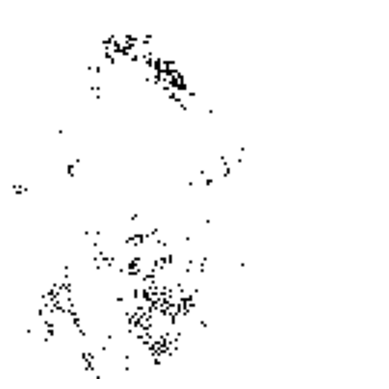

Processing image 910/1511


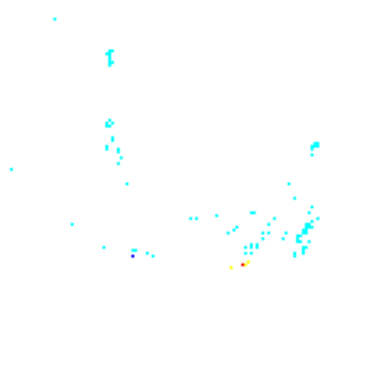

Processing image 911/1511


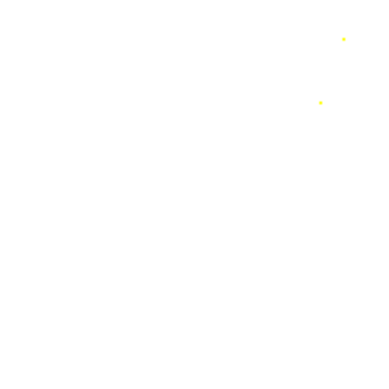

Processing image 912/1511


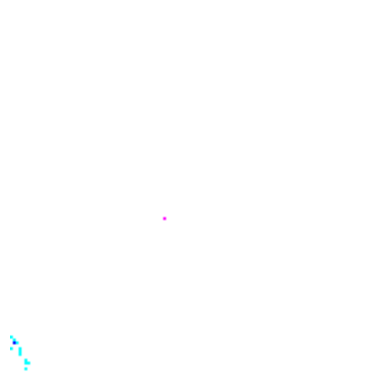

Processing image 913/1511


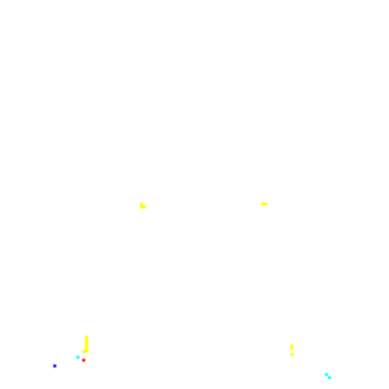

Processing image 914/1511


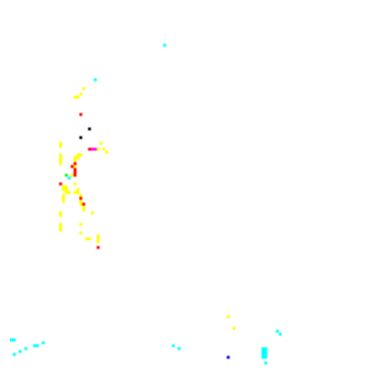

Processing image 915/1511


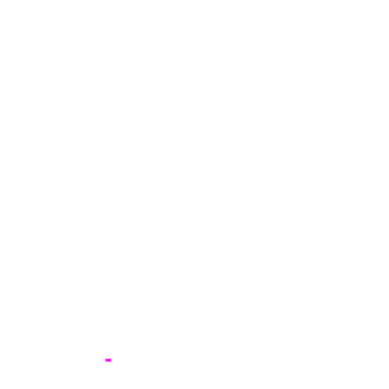

Processing image 916/1511


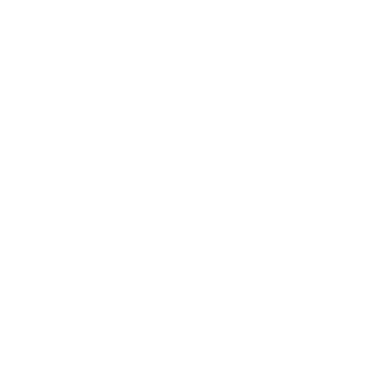

Processing image 917/1511


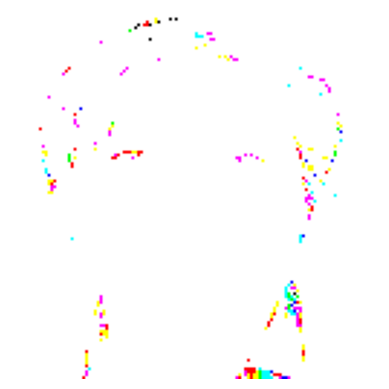

Processing image 918/1511


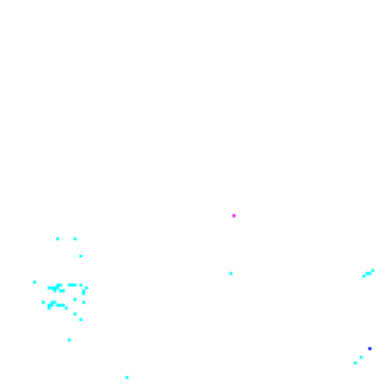

Processing image 919/1511


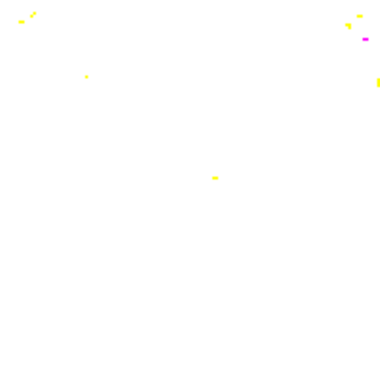

Processing image 920/1511


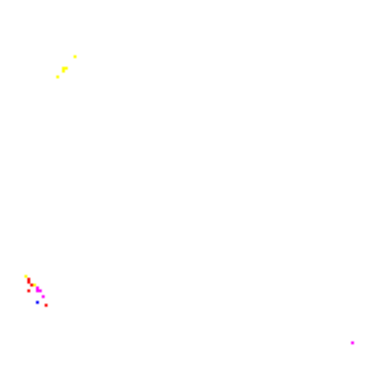

Processing image 921/1511


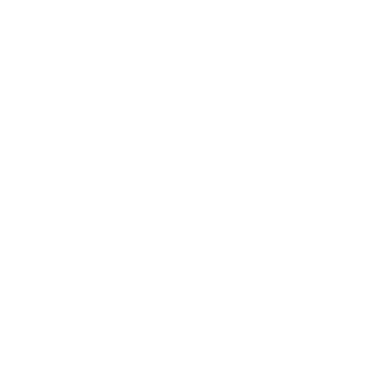

Processing image 922/1511


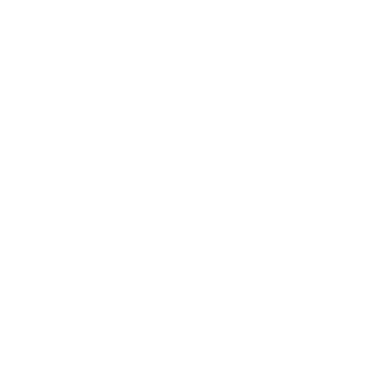

Processing image 923/1511


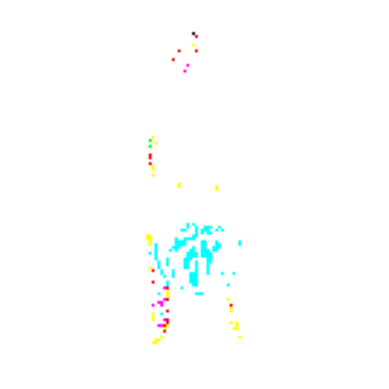

Processing image 924/1511


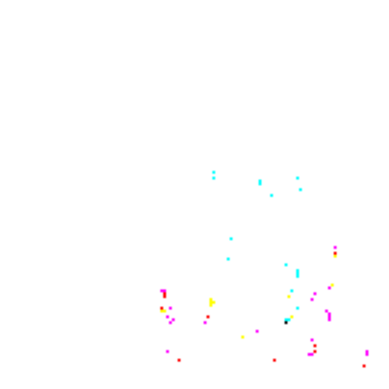

Processing image 925/1511


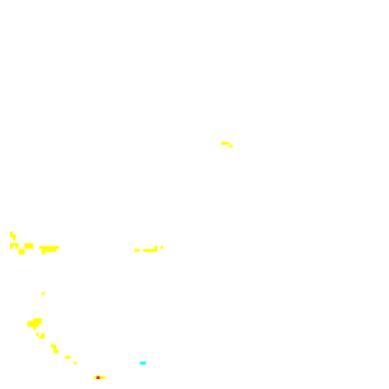

Processing image 926/1511


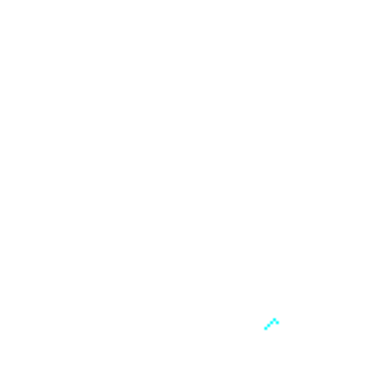

Processing image 927/1511


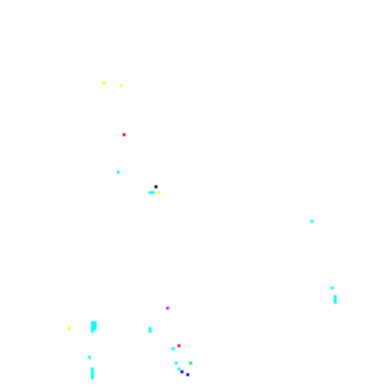

Processing image 928/1511


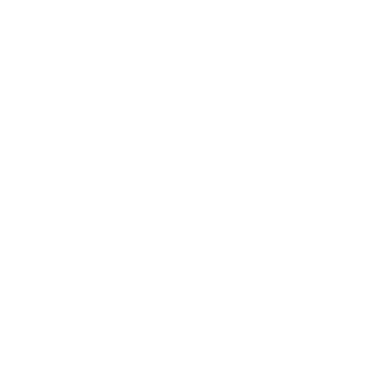

Processing image 929/1511


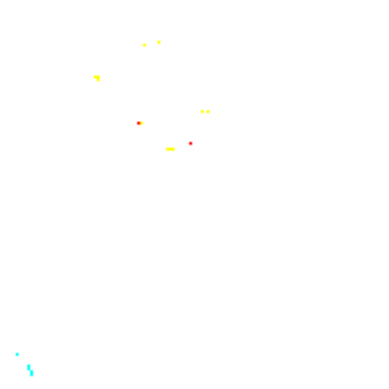

Processing image 930/1511


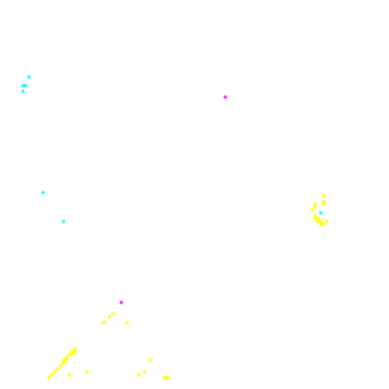

Processing image 931/1511


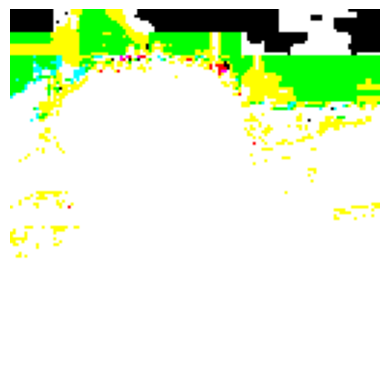

Processing image 932/1511


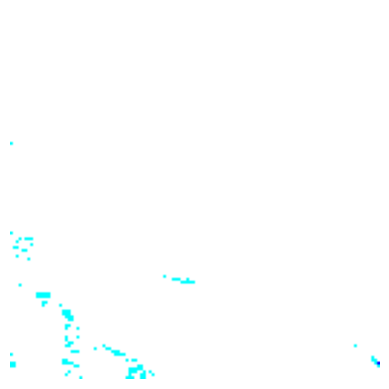

Processing image 933/1511


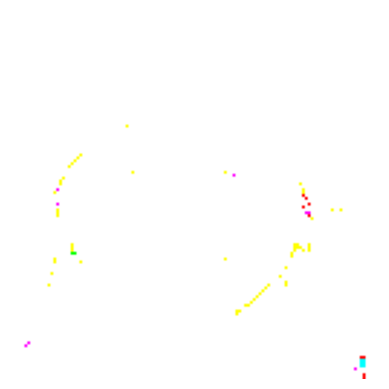

Processing image 934/1511


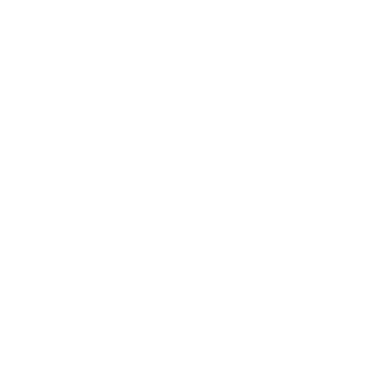

Processing image 935/1511


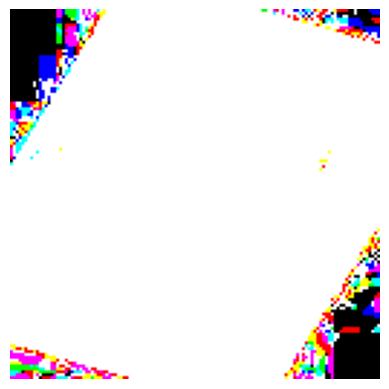

Processing image 936/1511


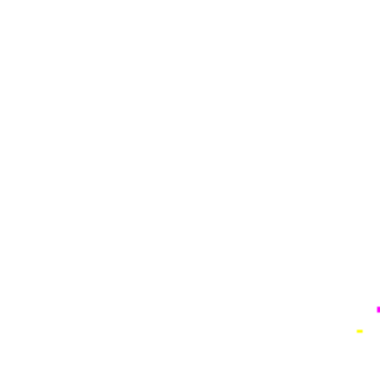

Processing image 937/1511


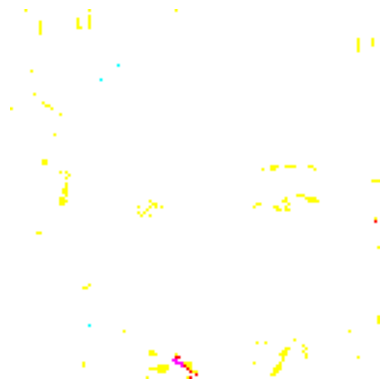

Processing image 938/1511


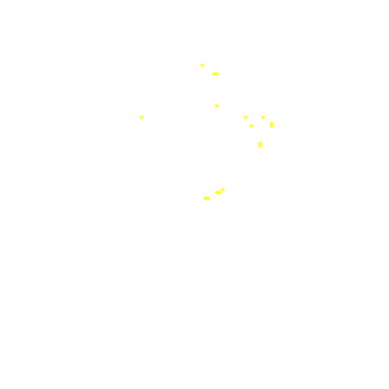

Processing image 939/1511


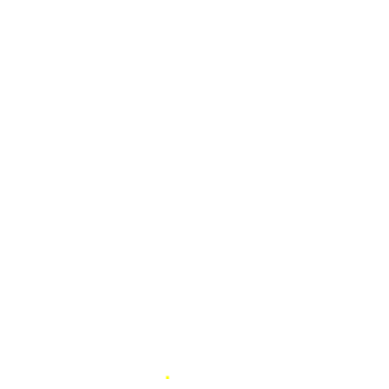

Processing image 940/1511


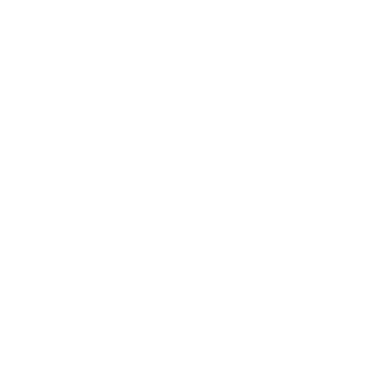

Processing image 941/1511


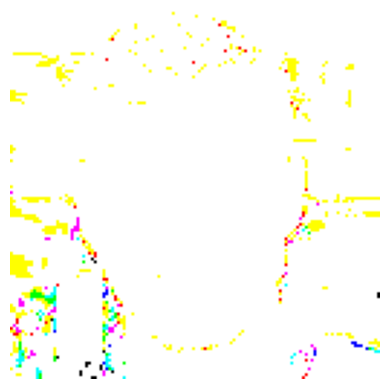

Processing image 942/1511


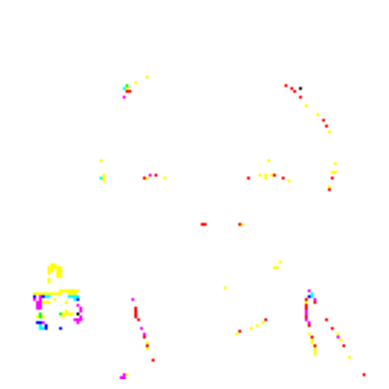

Processing image 943/1511


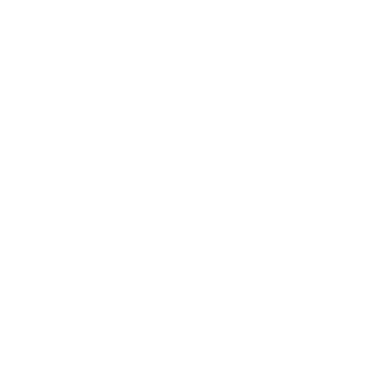

Processing image 944/1511


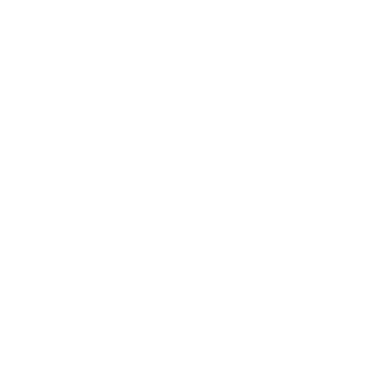

Processing image 945/1511


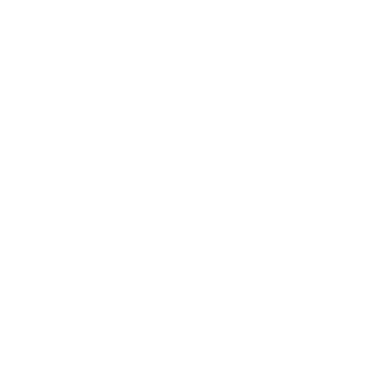

Processing image 946/1511


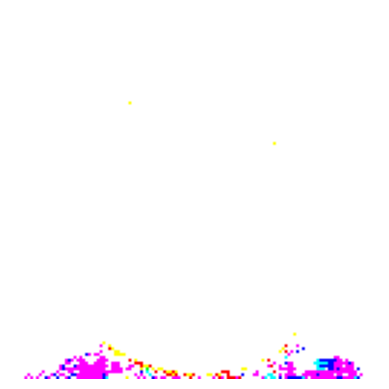

Processing image 947/1511


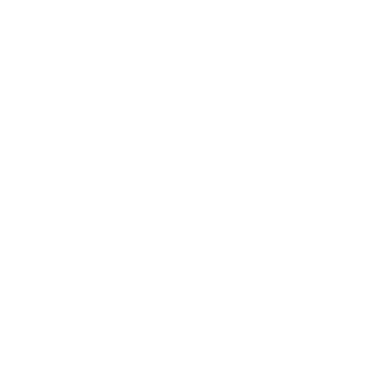

Processing image 948/1511


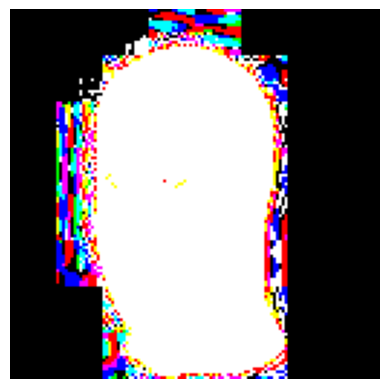

Processing image 949/1511


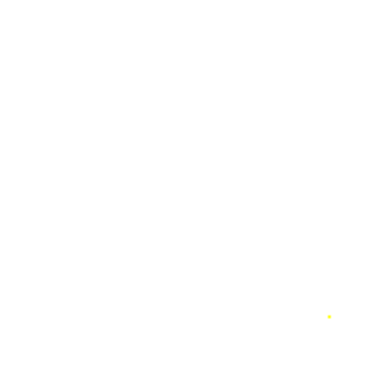

Processing image 950/1511


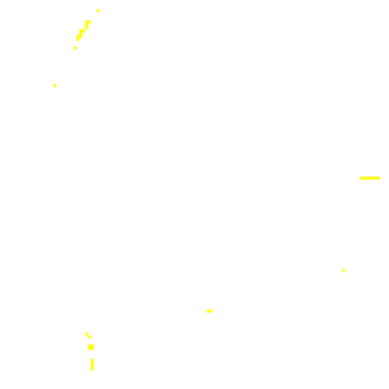

Processing image 951/1511


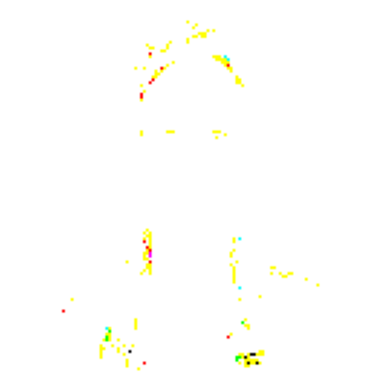

Processing image 952/1511


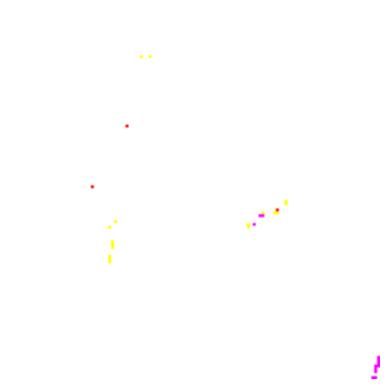

Processing image 953/1511


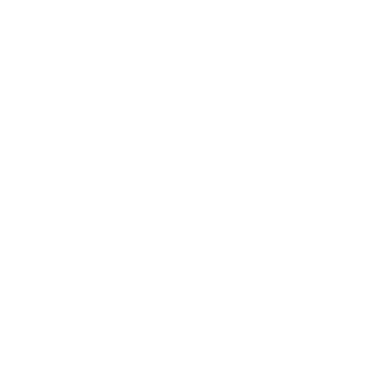

Processing image 954/1511


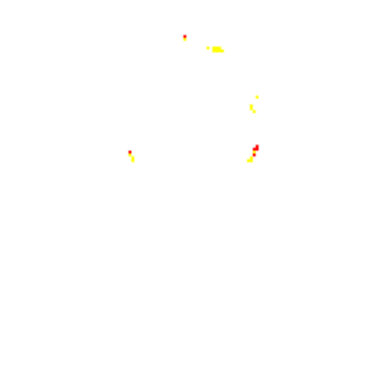

Processing image 955/1511


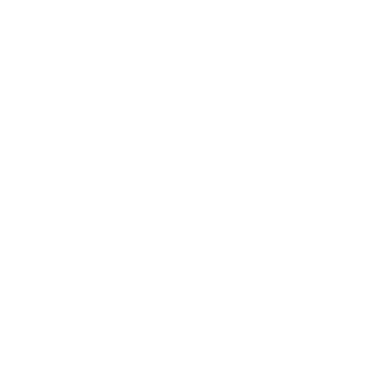

Processing image 956/1511


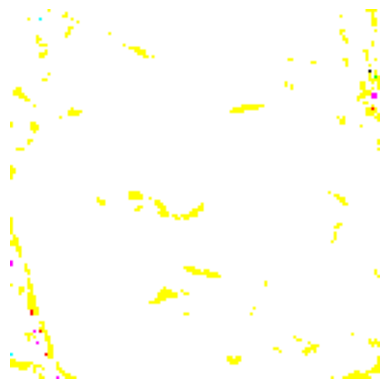

Processing image 957/1511


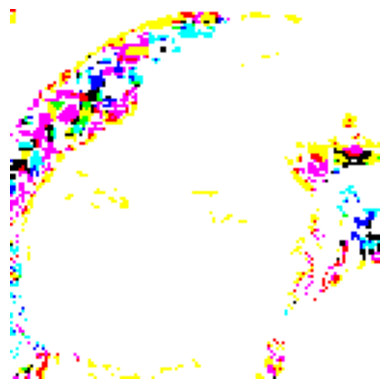

Processing image 958/1511


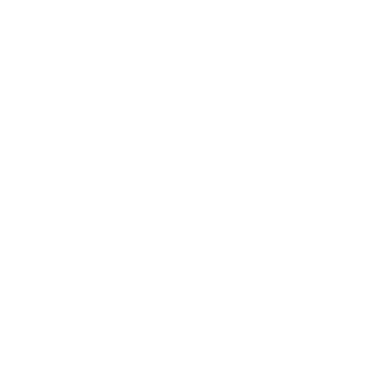

Processing image 959/1511


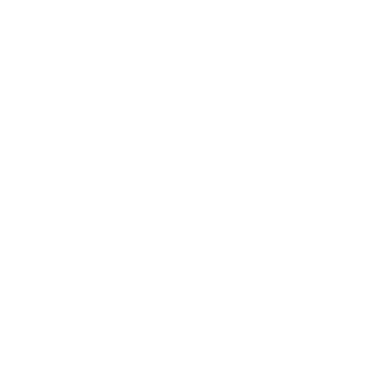

Processing image 960/1511


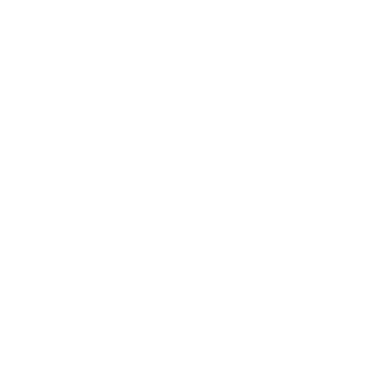

Processing image 961/1511


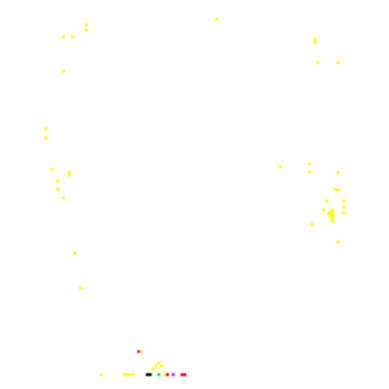

Processing image 962/1511


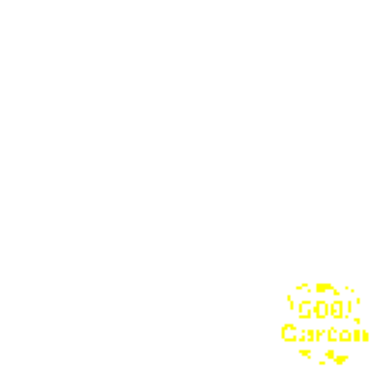

Processing image 963/1511


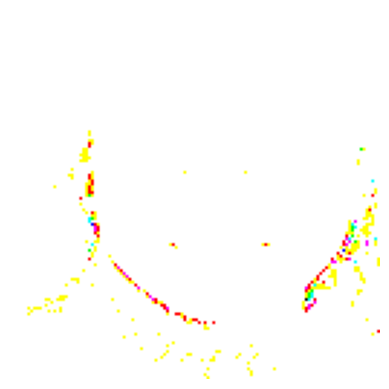

Processing image 964/1511


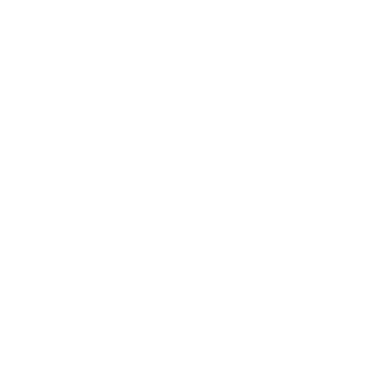

Processing image 965/1511


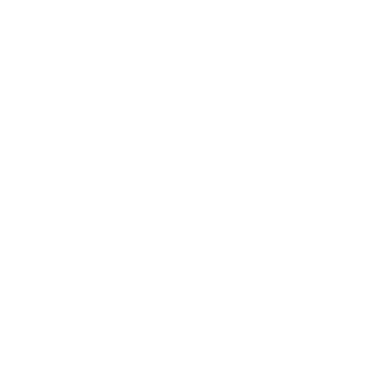

Processing image 966/1511


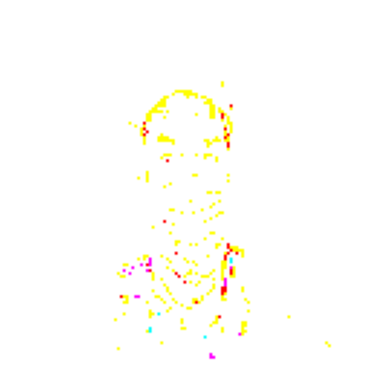

Processing image 967/1511


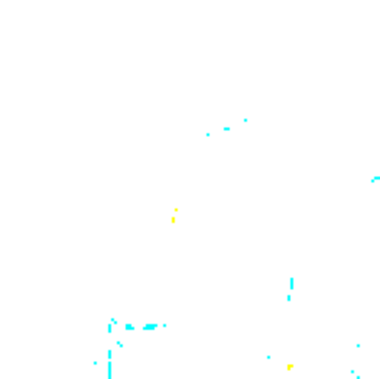

Processing image 968/1511


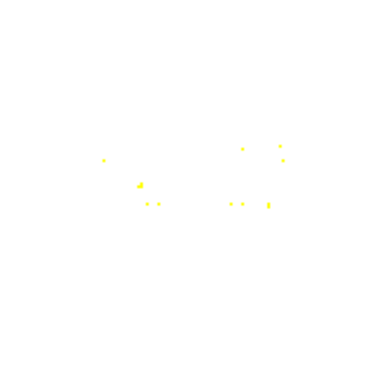

Processing image 969/1511


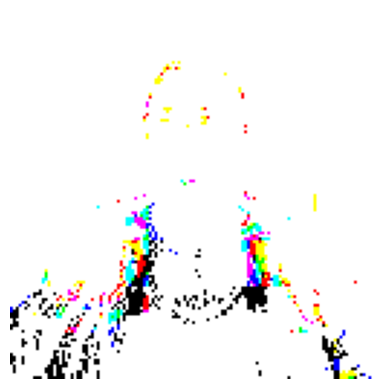

Processing image 970/1511


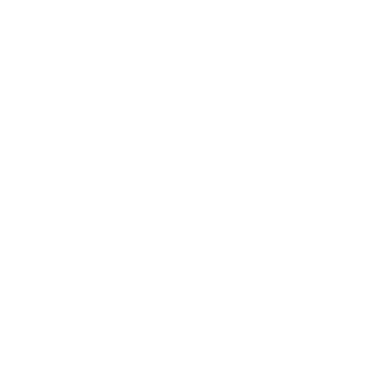

Processing image 971/1511


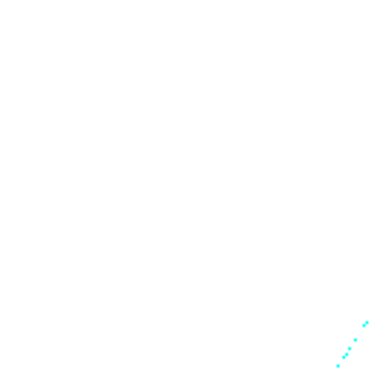

Processing image 972/1511


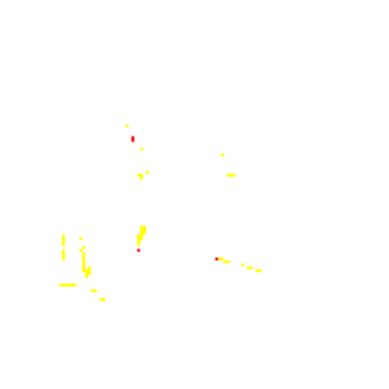

Processing image 973/1511


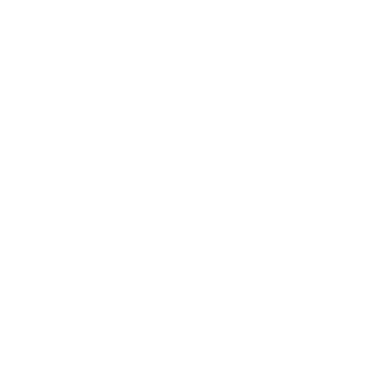

Processing image 974/1511


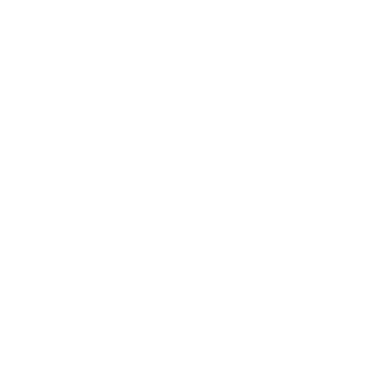

Processing image 975/1511


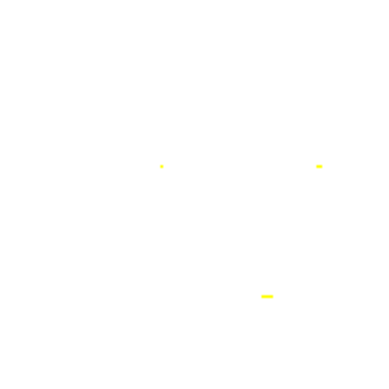

Processing image 976/1511


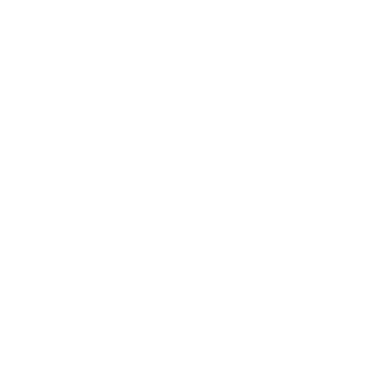

Processing image 977/1511


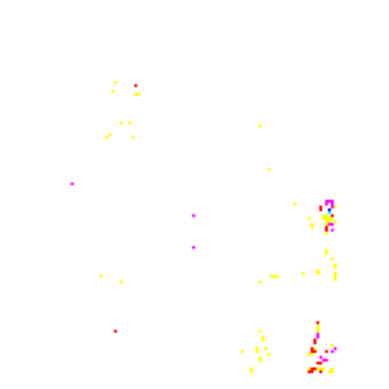

Processing image 978/1511


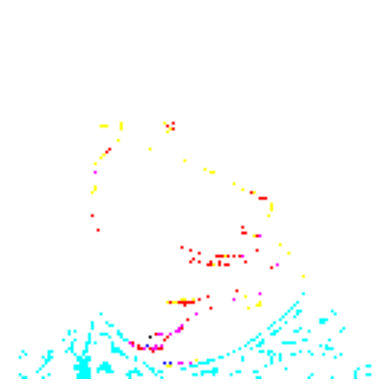

Processing image 979/1511


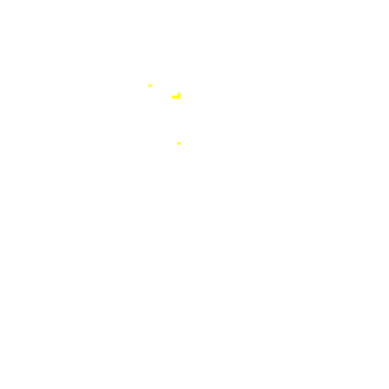

Processing image 980/1511


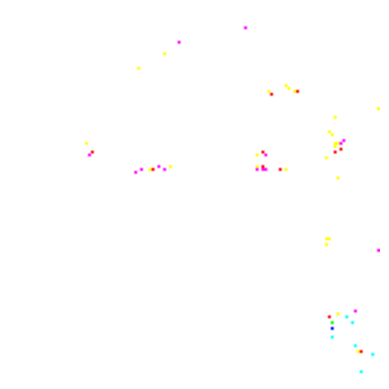

Processing image 981/1511


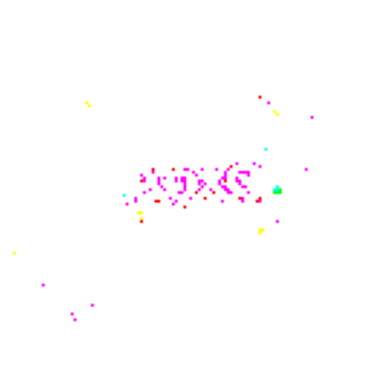

Processing image 982/1511


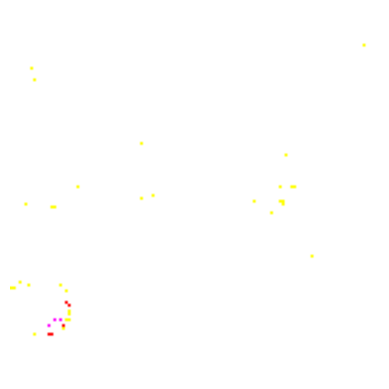

Processing image 983/1511


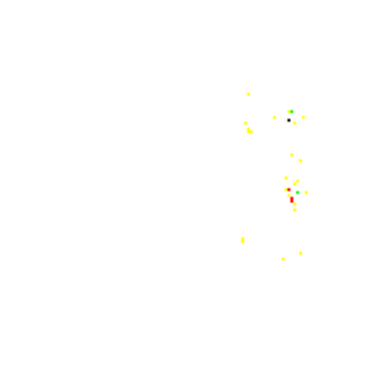

Processing image 984/1511


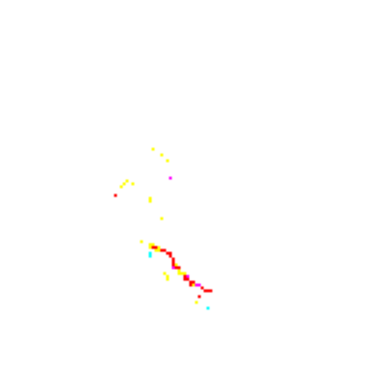

Processing image 985/1511


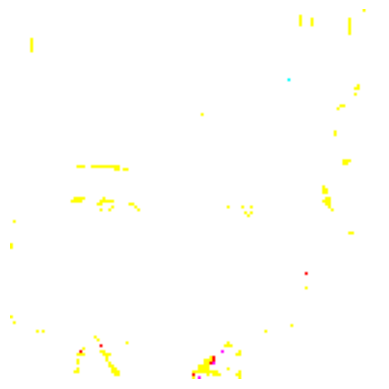

Processing image 986/1511


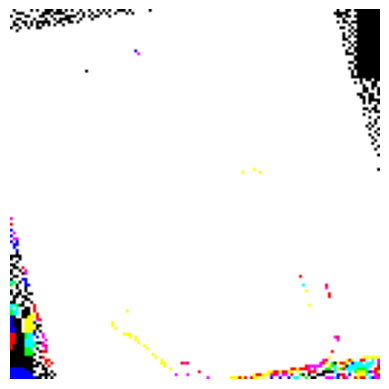

Processing image 987/1511


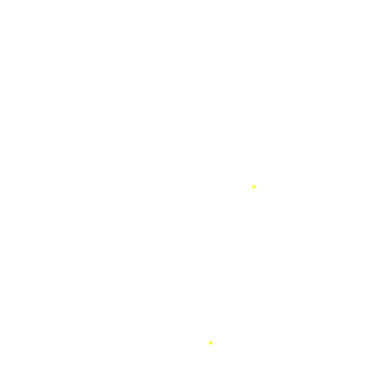

Processing image 988/1511


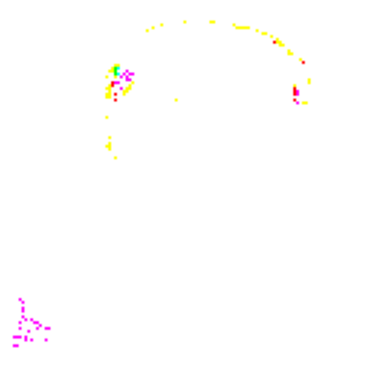

Processing image 989/1511


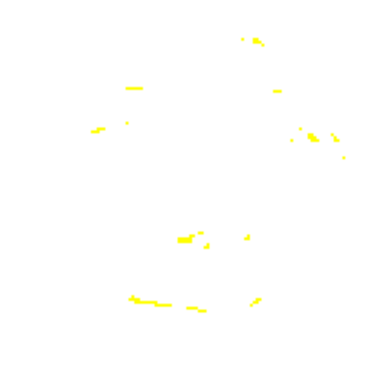

Processing image 990/1511


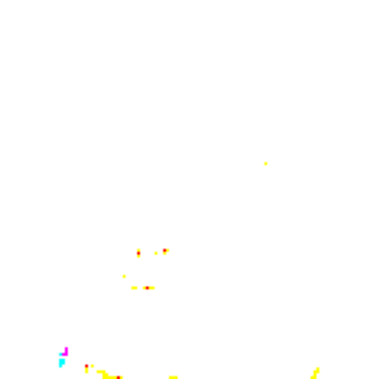

Processing image 991/1511


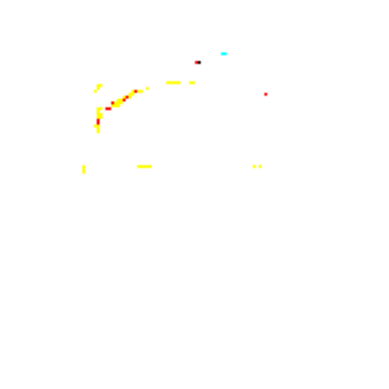

Processing image 992/1511


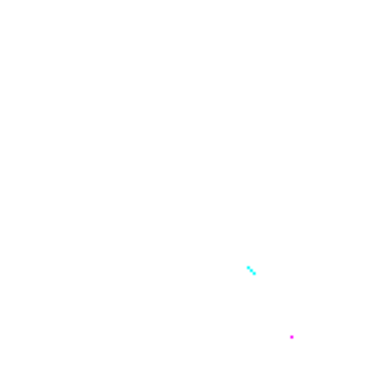

Processing image 993/1511


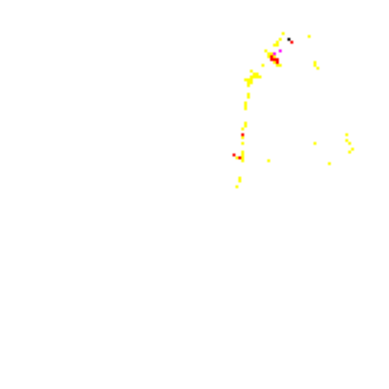

Processing image 994/1511


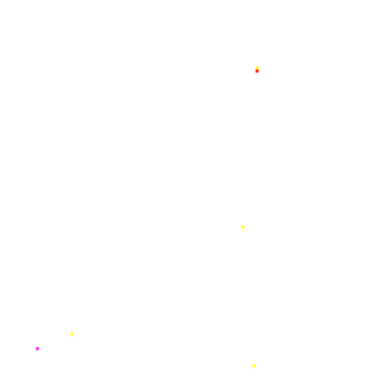

Processing image 995/1511


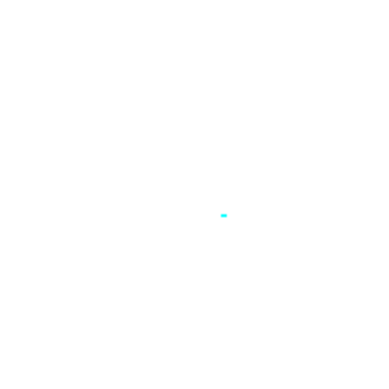

Processing image 996/1511


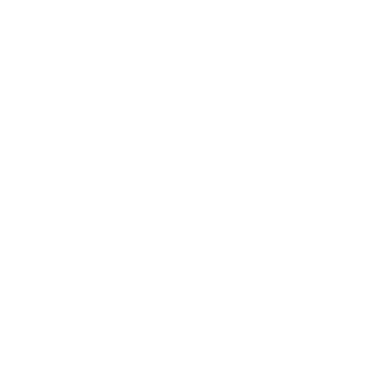

Processing image 997/1511


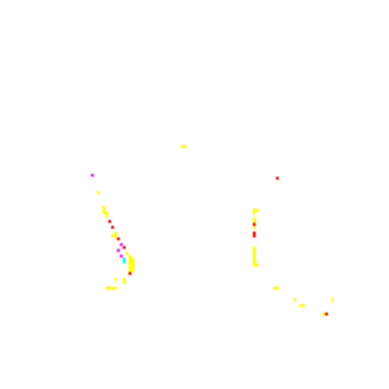

Processing image 998/1511


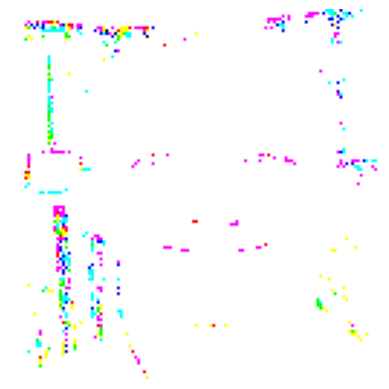

Processing image 999/1511


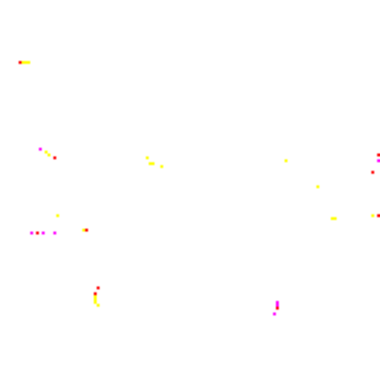

Processing image 1000/1511


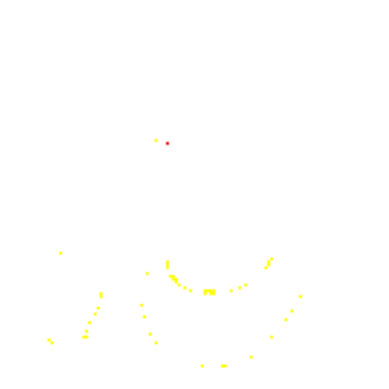

Processing image 1001/1511


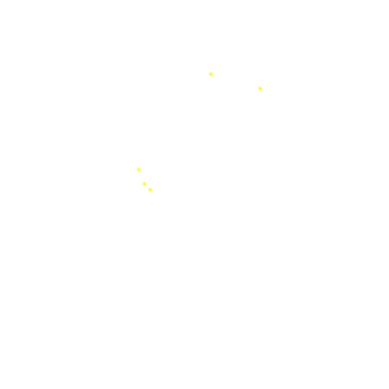

Processing image 1002/1511


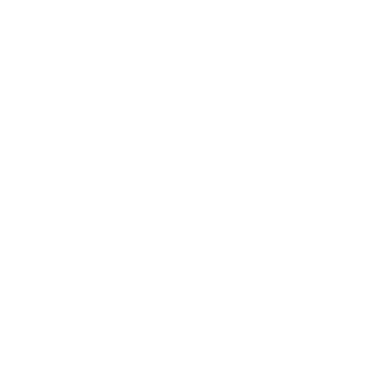

Processing image 1003/1511


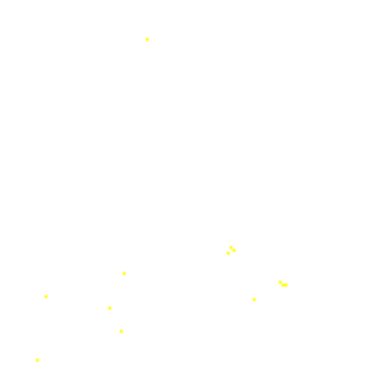

Processing image 1004/1511


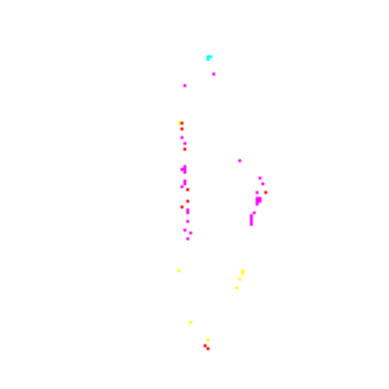

Processing image 1005/1511


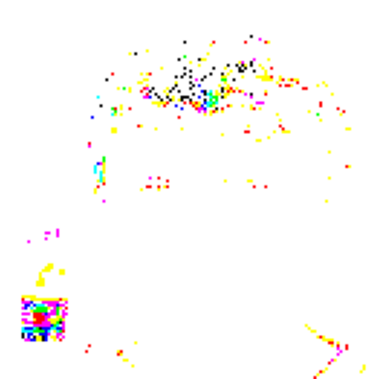

Processing image 1006/1511


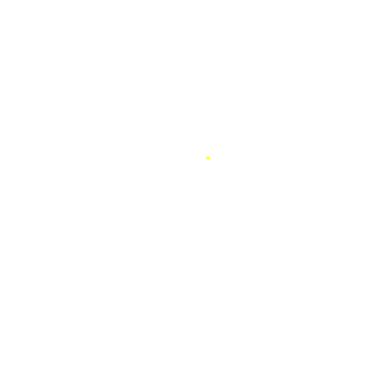

Processing image 1007/1511


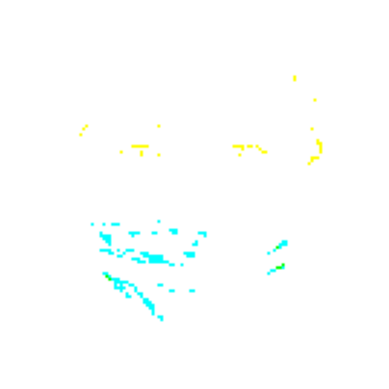

Processing image 1008/1511


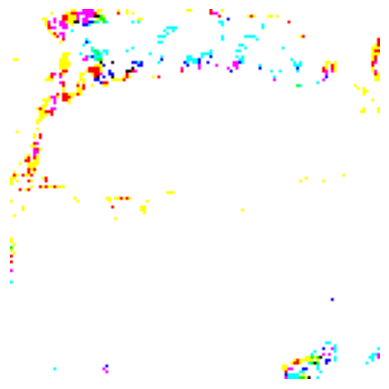

Processing image 1009/1511


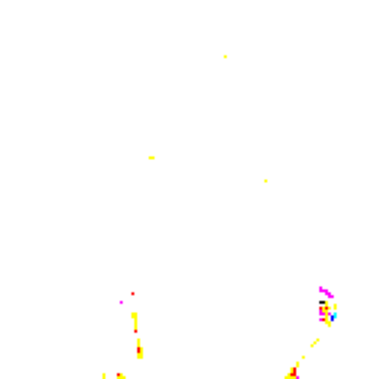

Processing image 1010/1511


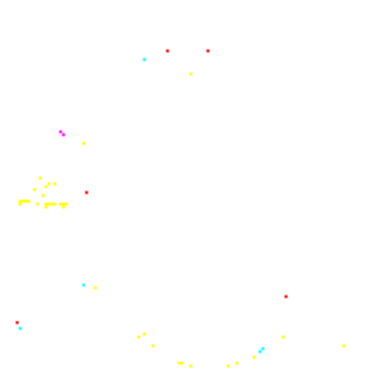

Processing image 1011/1511


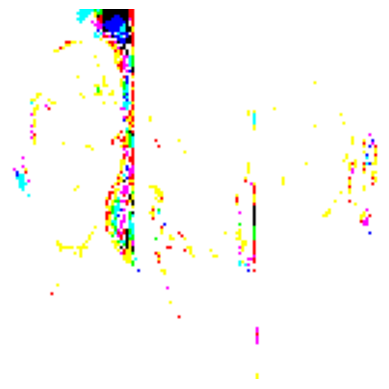

Processing image 1012/1511


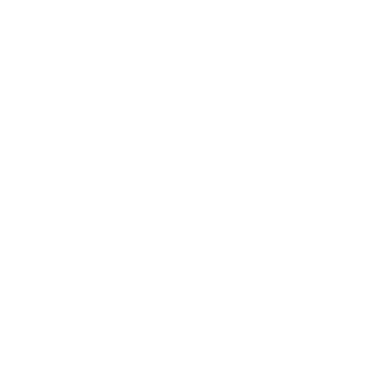

Processing image 1013/1511


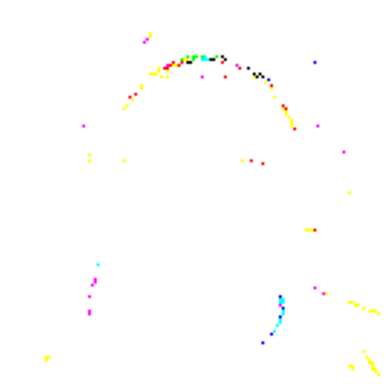

Processing image 1014/1511


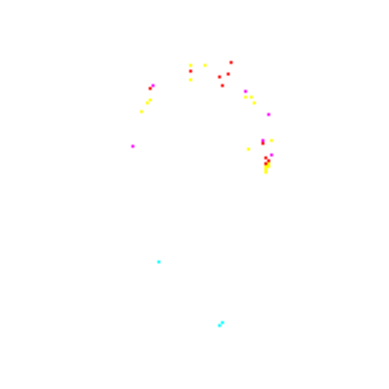

Processing image 1015/1511


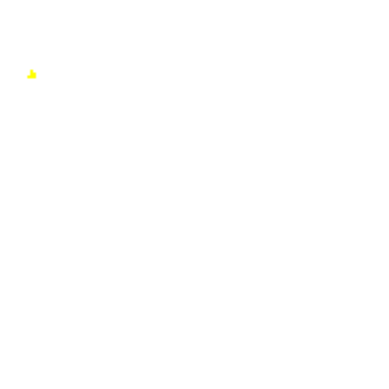

Processing image 1016/1511


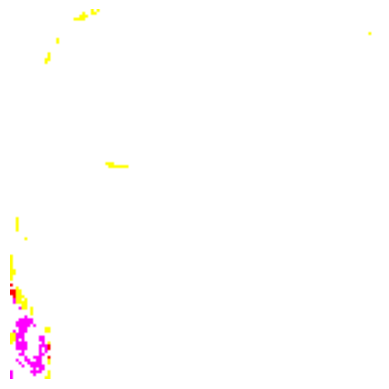

Processing image 1017/1511


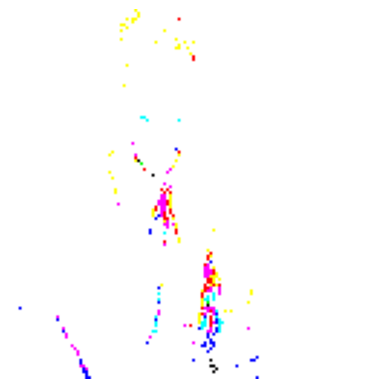

Processing image 1018/1511


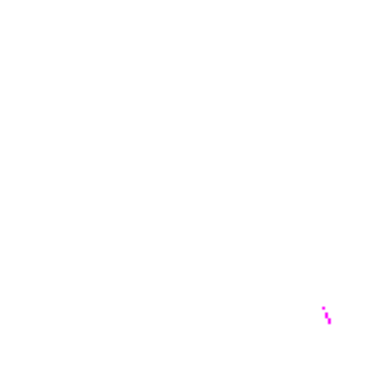

Processing image 1019/1511


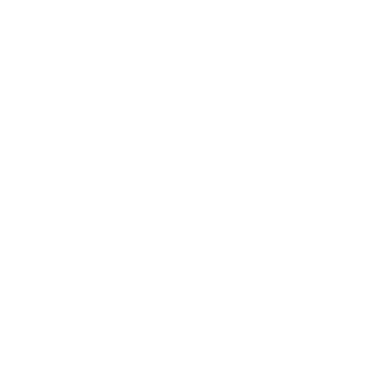

Processing image 1020/1511


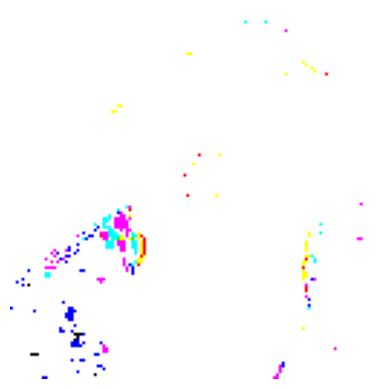

Processing image 1021/1511


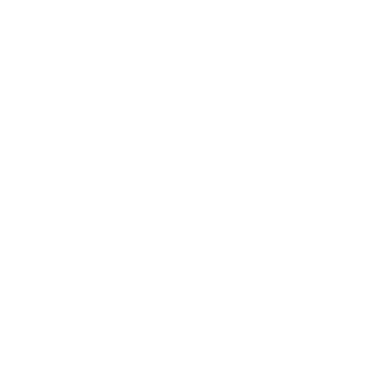

Processing image 1022/1511


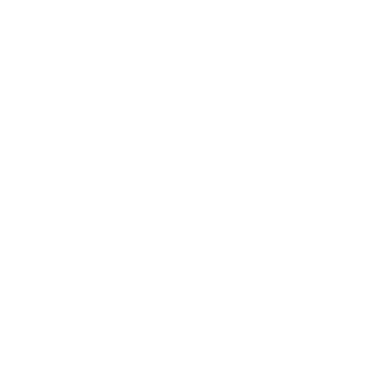

Processing image 1023/1511


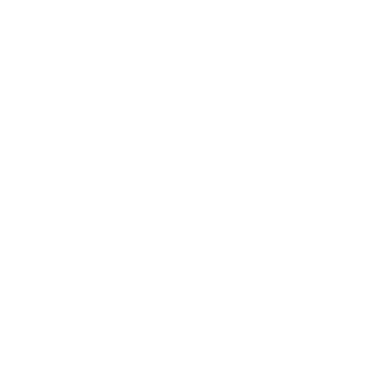

Processing image 1024/1511


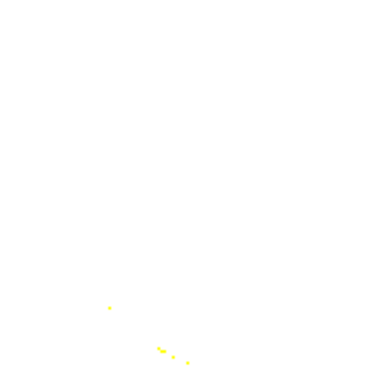

Processing image 1025/1511


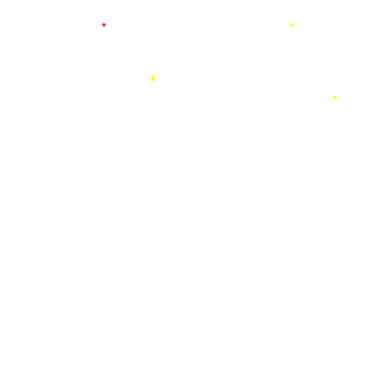

Processing image 1026/1511


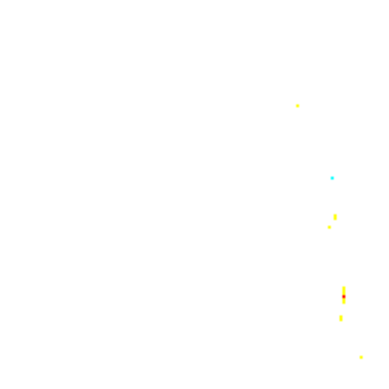

Processing image 1027/1511


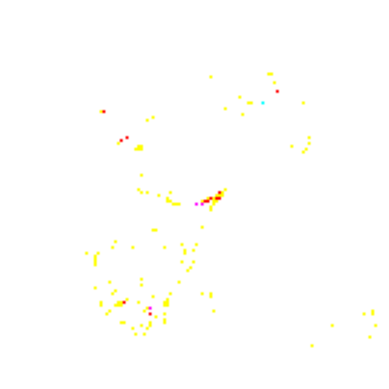

Processing image 1028/1511


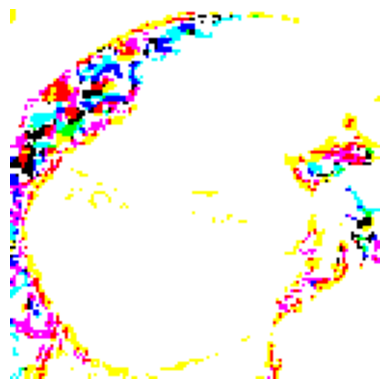

Processing image 1029/1511


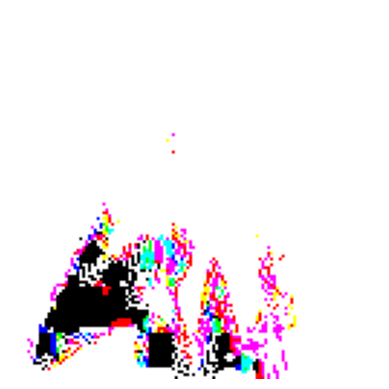

Processing image 1030/1511


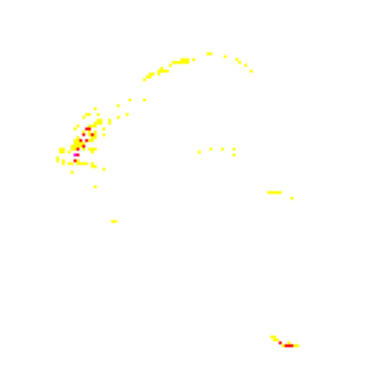

Processing image 1031/1511


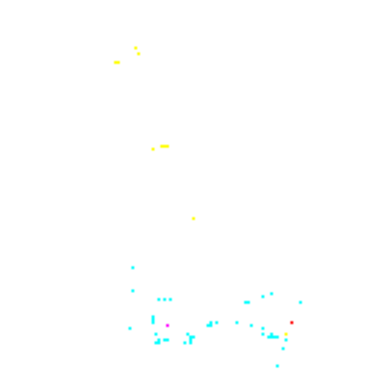

Processing image 1032/1511


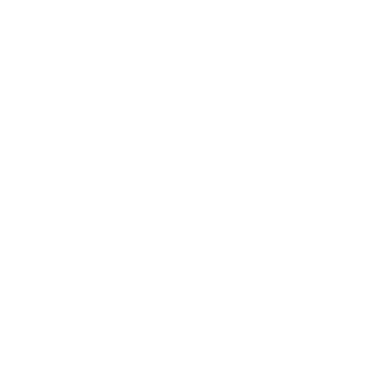

Processing image 1033/1511


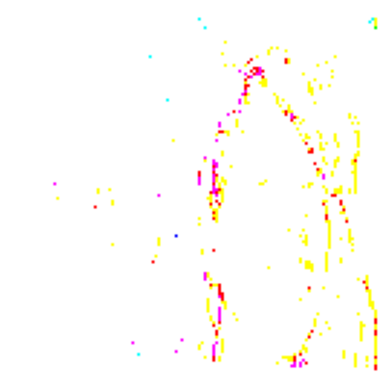

Processing image 1034/1511


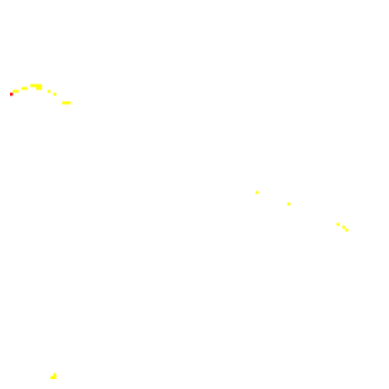

Processing image 1035/1511


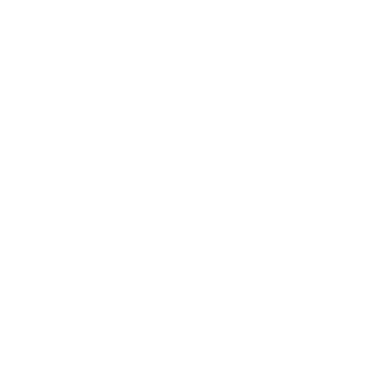

Processing image 1036/1511


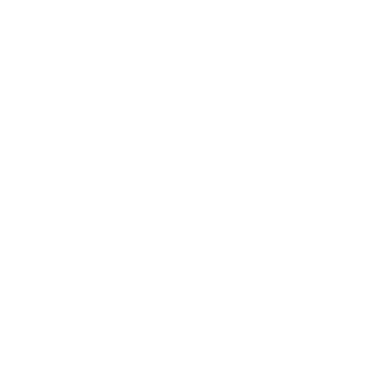

Processing image 1037/1511


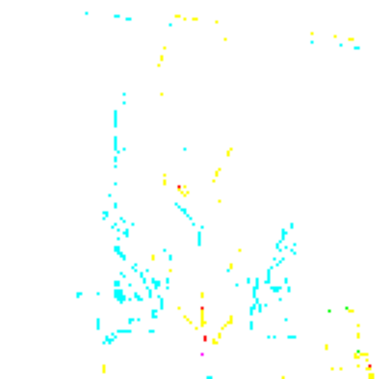

Processing image 1038/1511


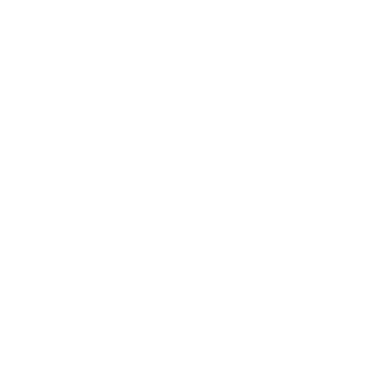

Processing image 1039/1511


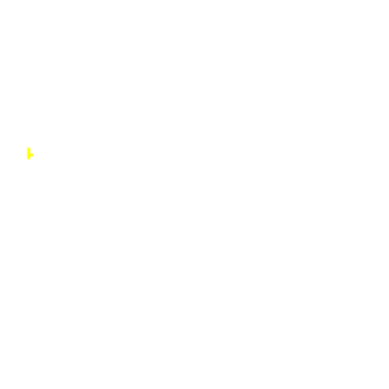

Processing image 1040/1511


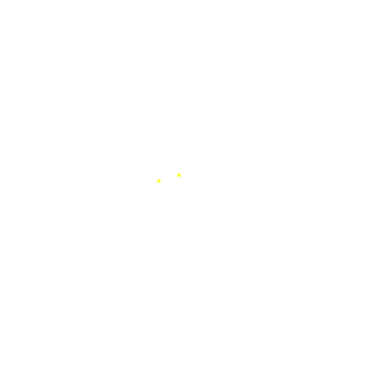

Processing image 1041/1511


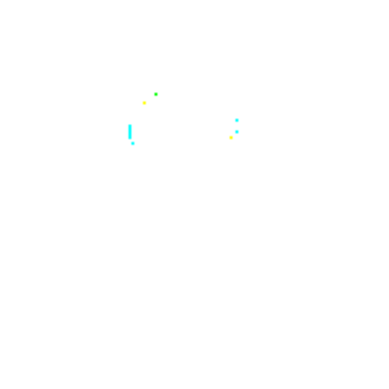

Processing image 1042/1511


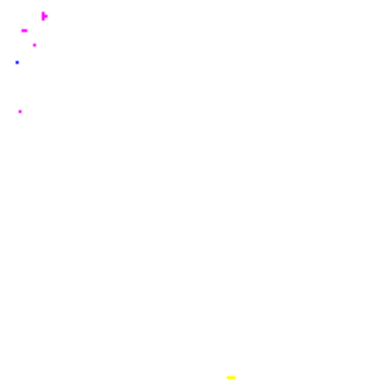

Processing image 1043/1511


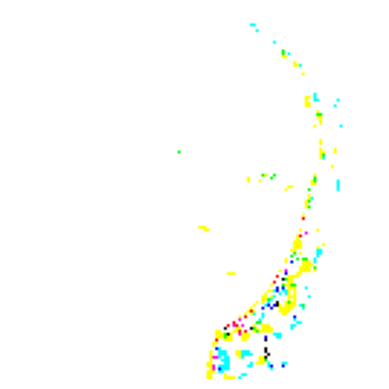

Processing image 1044/1511


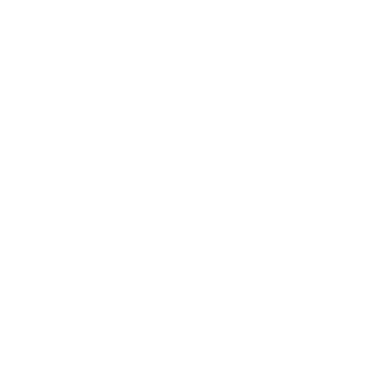

Processing image 1045/1511


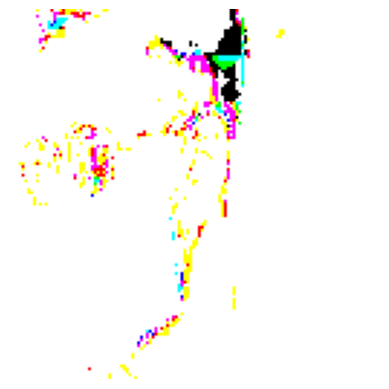

Processing image 1046/1511


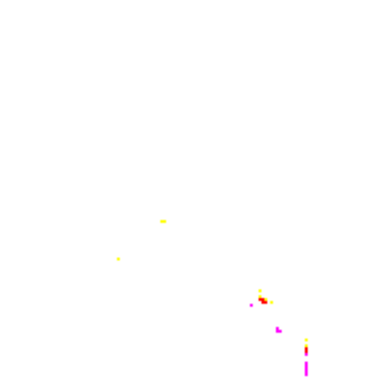

Processing image 1047/1511


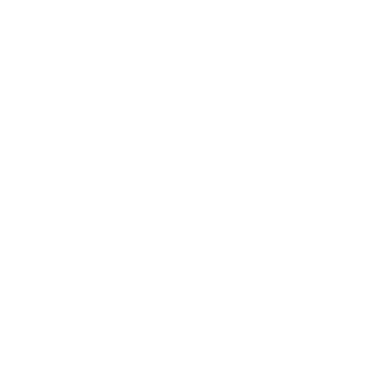

Processing image 1048/1511


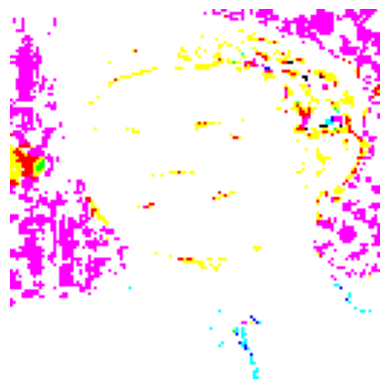

Processing image 1049/1511


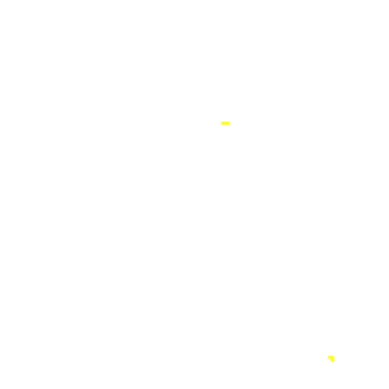

Processing image 1050/1511


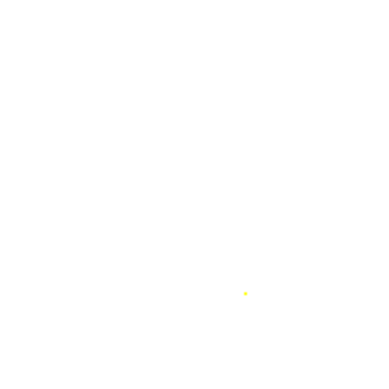

Processing image 1051/1511


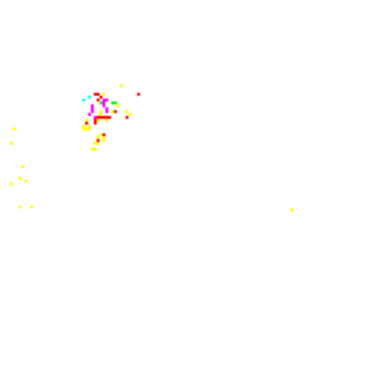

Processing image 1052/1511


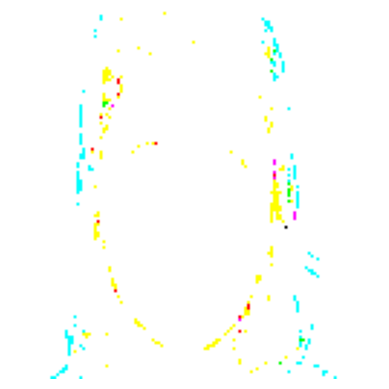

Processing image 1053/1511


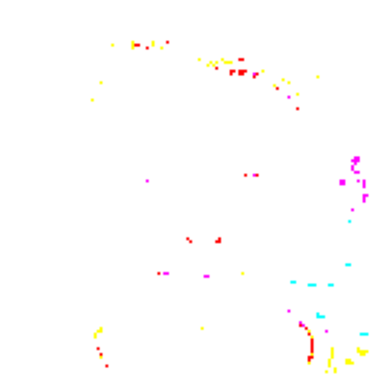

Processing image 1054/1511


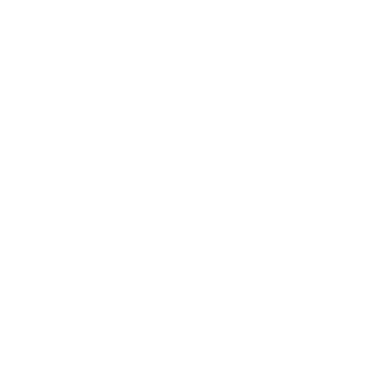

Processing image 1055/1511


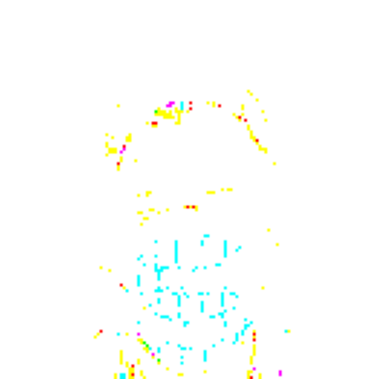

Processing image 1056/1511


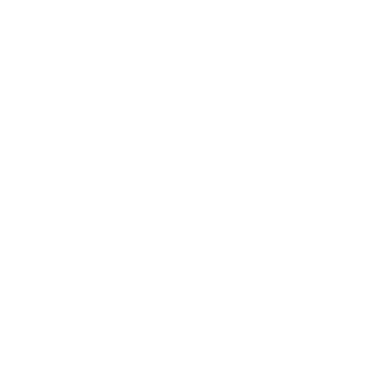

Processing image 1057/1511


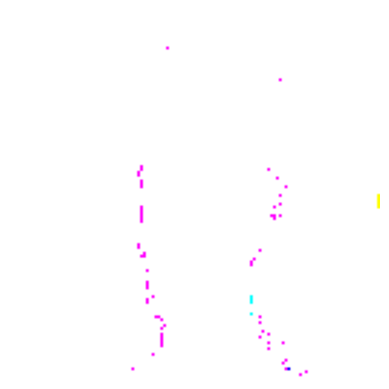

Processing image 1058/1511


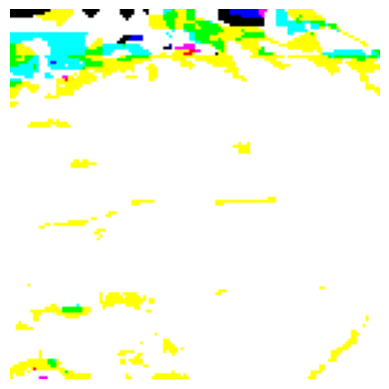

Processing image 1059/1511


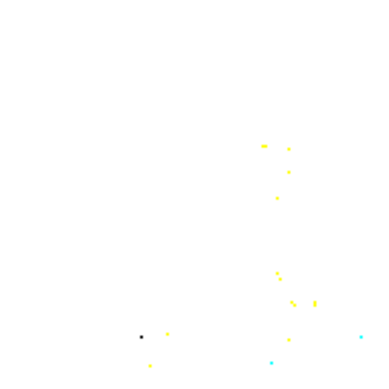

Processing image 1060/1511


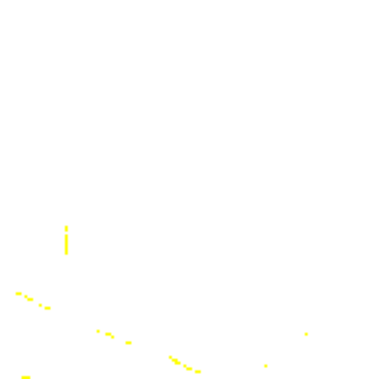

Processing image 1061/1511


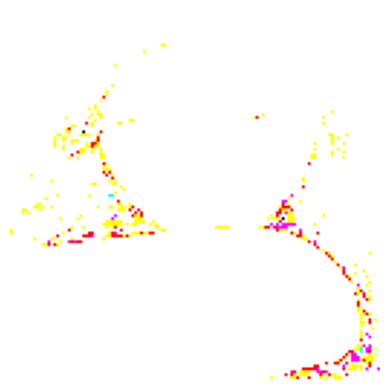

Processing image 1062/1511


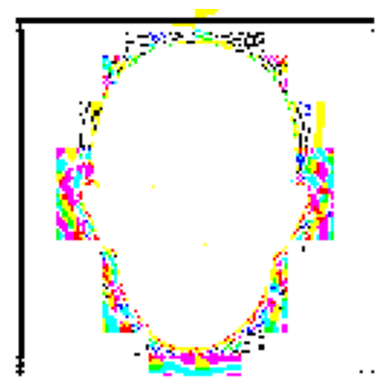

Processing image 1063/1511


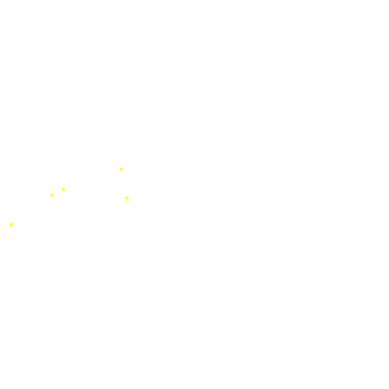

Processing image 1064/1511


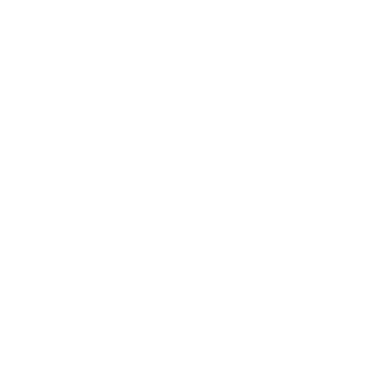

Processing image 1065/1511


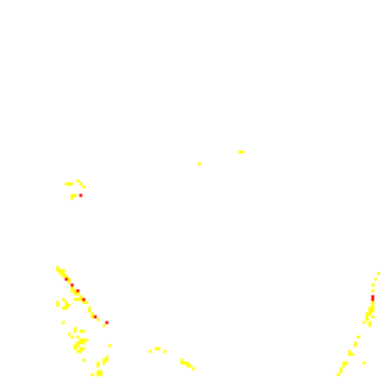

Processing image 1066/1511


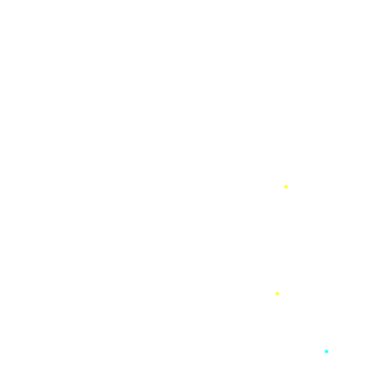

Processing image 1067/1511


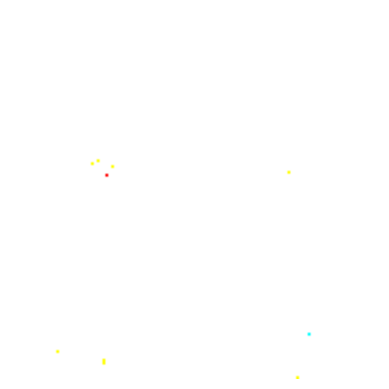

Processing image 1068/1511


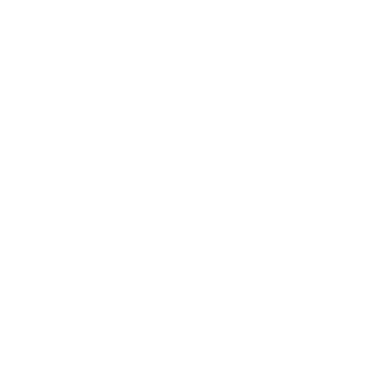

Processing image 1069/1511


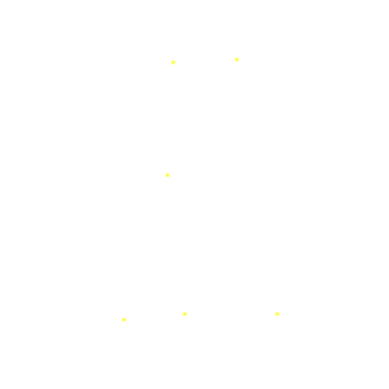

Processing image 1070/1511


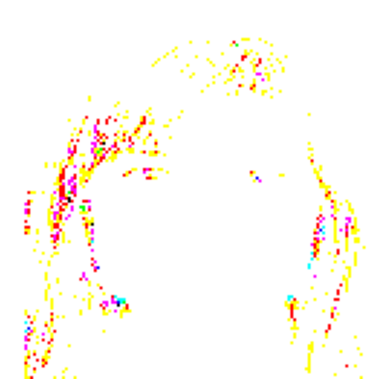

Processing image 1071/1511


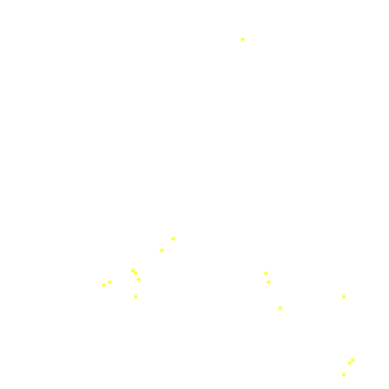

Processing image 1072/1511


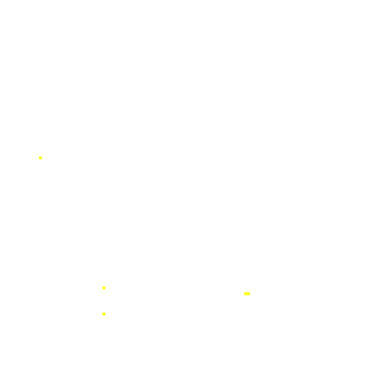

Processing image 1073/1511


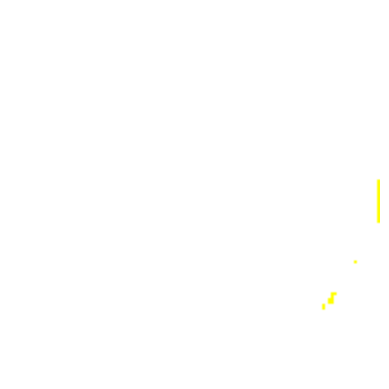

Processing image 1074/1511


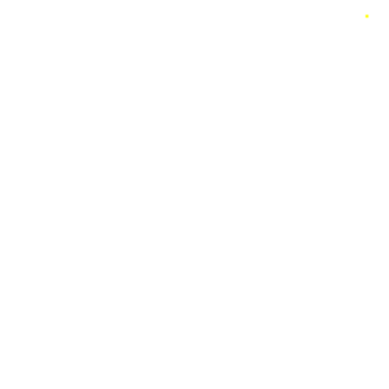

Processing image 1075/1511


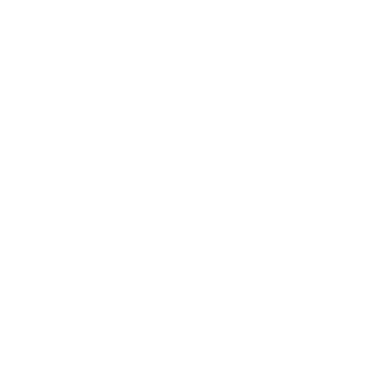

Processing image 1076/1511


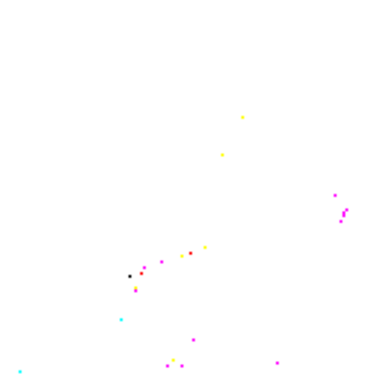

Processing image 1077/1511


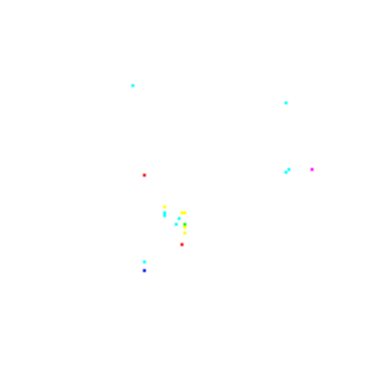

Processing image 1078/1511


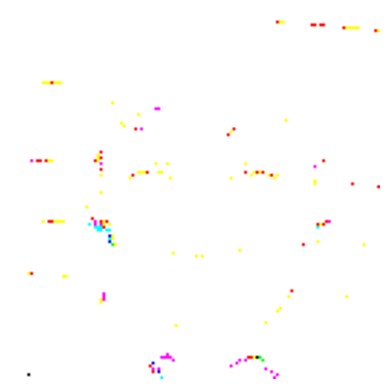

Processing image 1079/1511


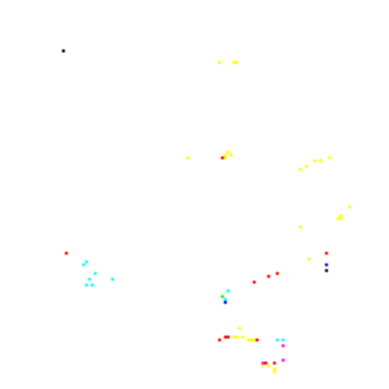

Processing image 1080/1511


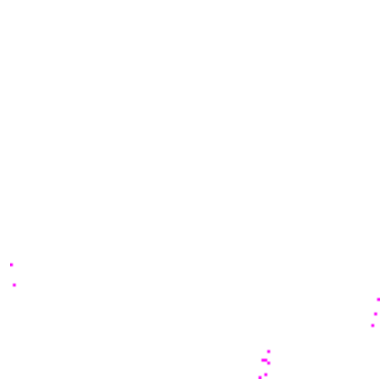

Processing image 1081/1511


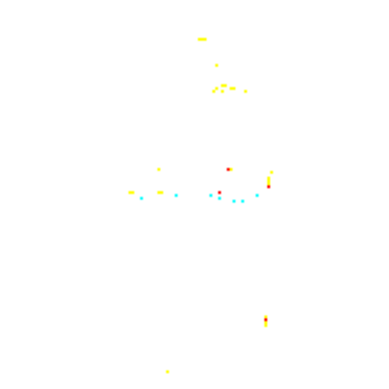

Processing image 1082/1511


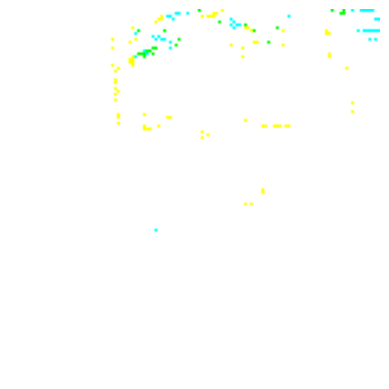

Processing image 1083/1511


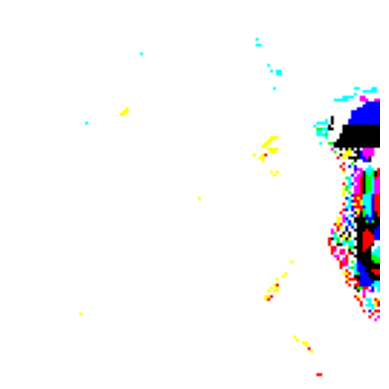

Processing image 1084/1511


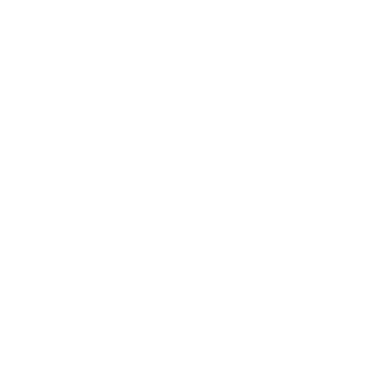

Processing image 1085/1511


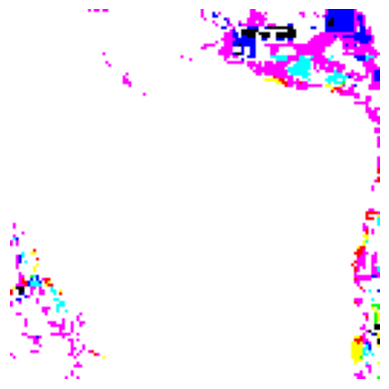

Processing image 1086/1511


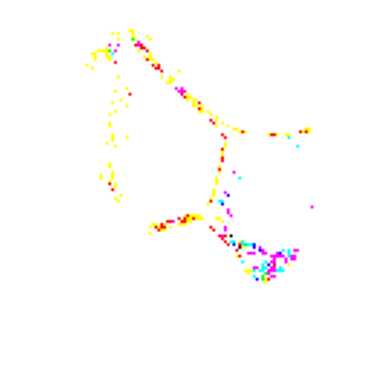

Processing image 1087/1511


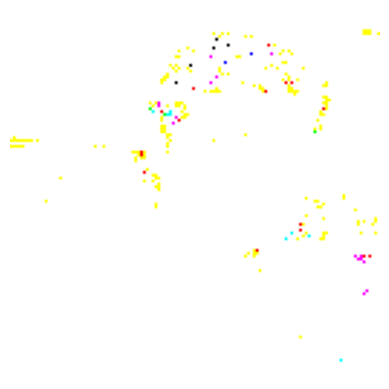

Processing image 1088/1511


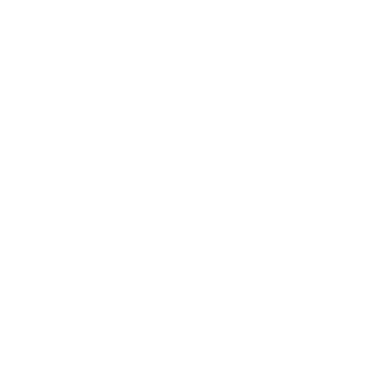

Processing image 1089/1511


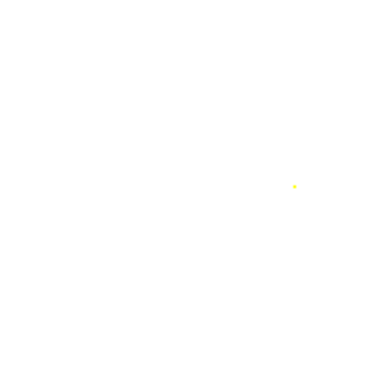

Processing image 1090/1511


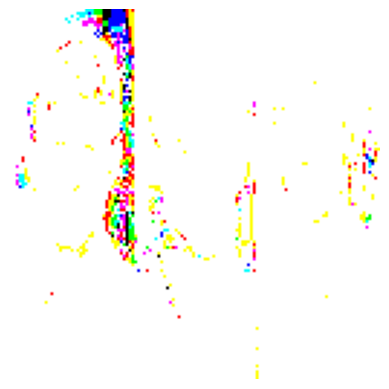

Processing image 1091/1511


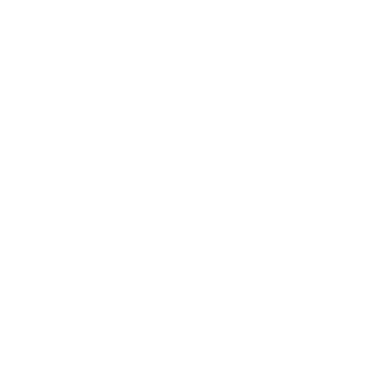

Processing image 1092/1511


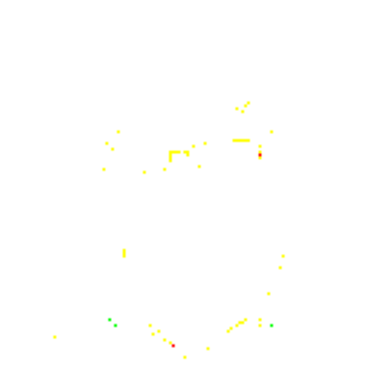

Processing image 1093/1511


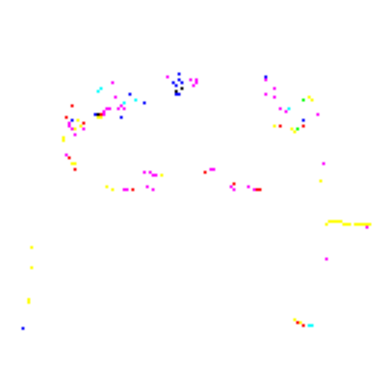

Processing image 1094/1511


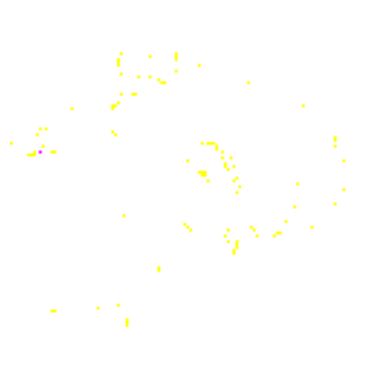

Processing image 1095/1511


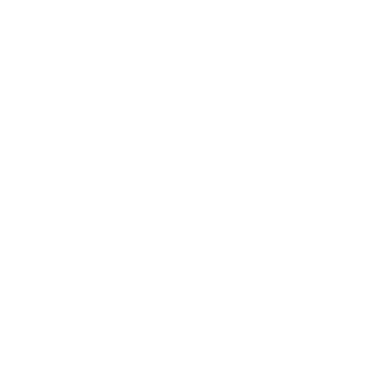

Processing image 1096/1511


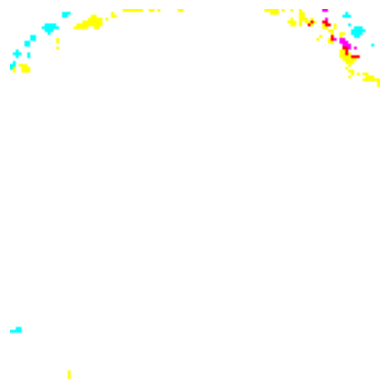

Processing image 1097/1511


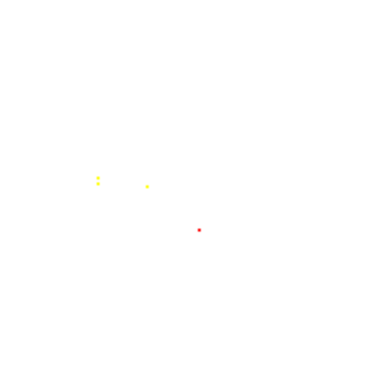

Processing image 1098/1511


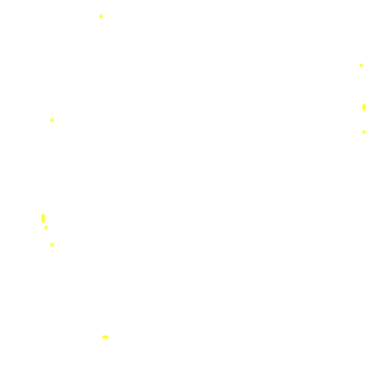

Processing image 1099/1511


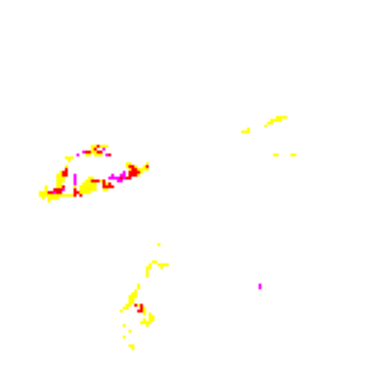

Processing image 1100/1511


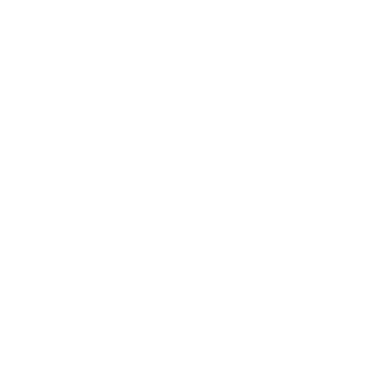

Processing image 1101/1511


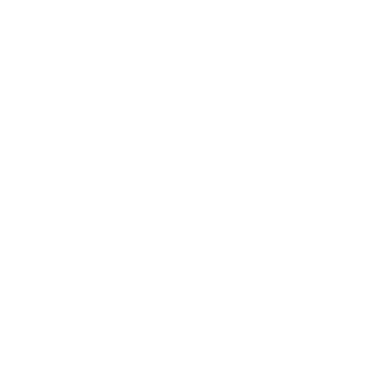

Processing image 1102/1511


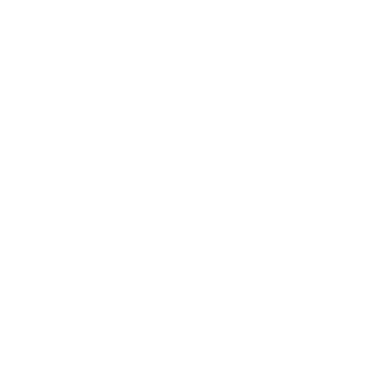

Processing image 1103/1511


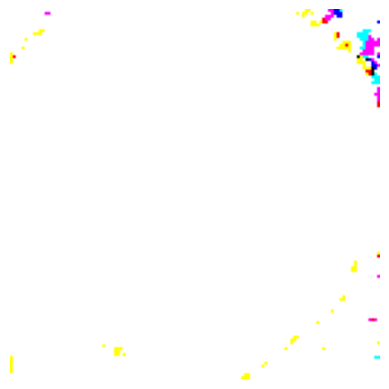

Processing image 1104/1511


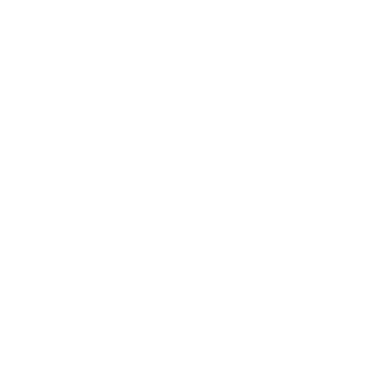

Processing image 1105/1511


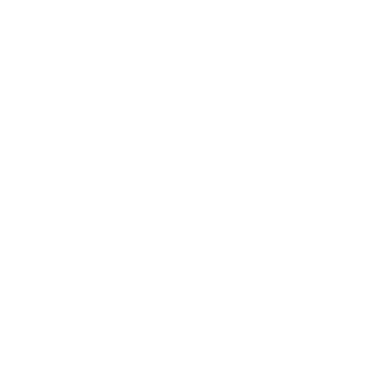

Processing image 1106/1511


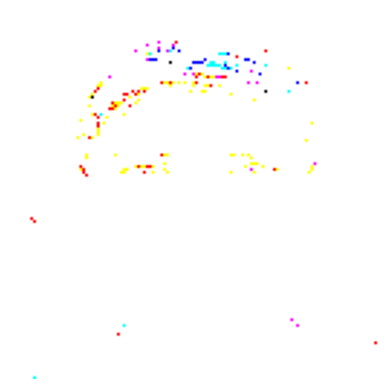

Processing image 1107/1511


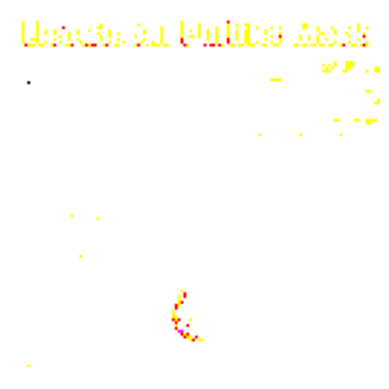

Processing image 1108/1511


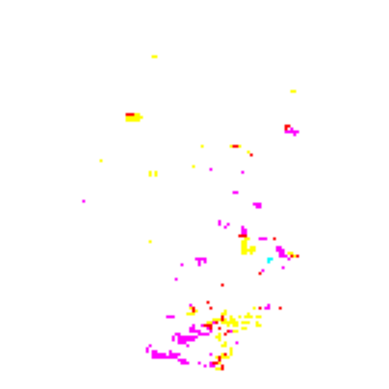

Processing image 1109/1511


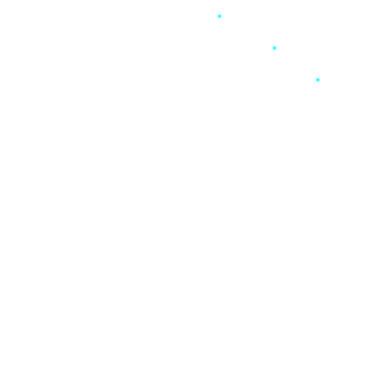

Processing image 1110/1511


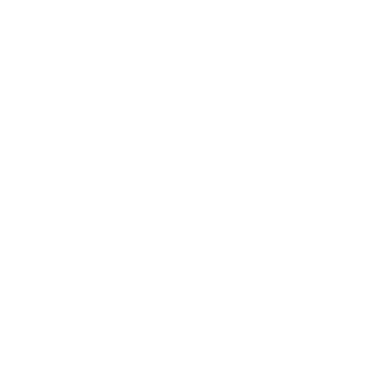

Processing image 1111/1511


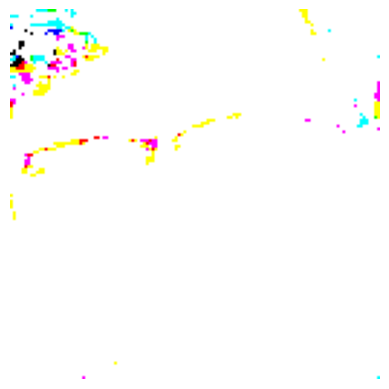

Processing image 1112/1511


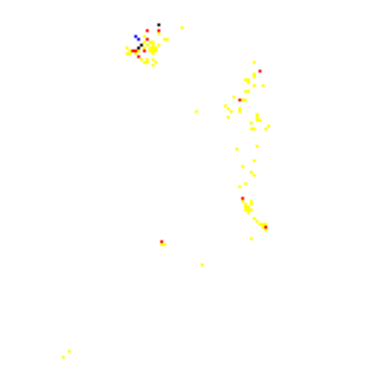

Processing image 1113/1511


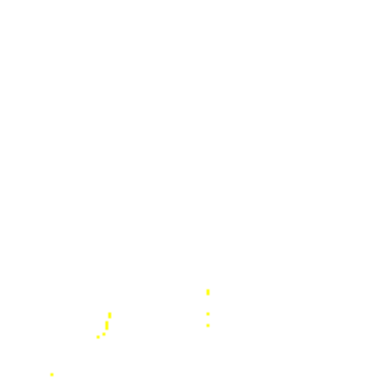

Processing image 1114/1511


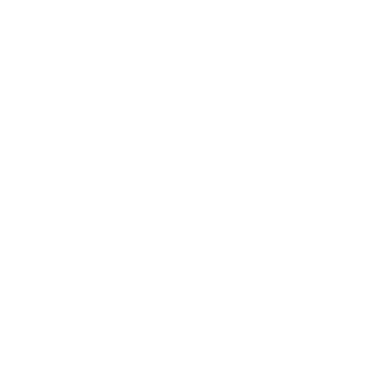

Processing image 1115/1511


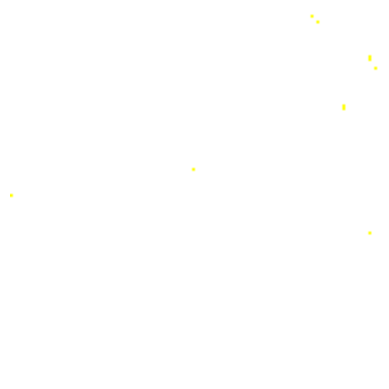

Processing image 1116/1511


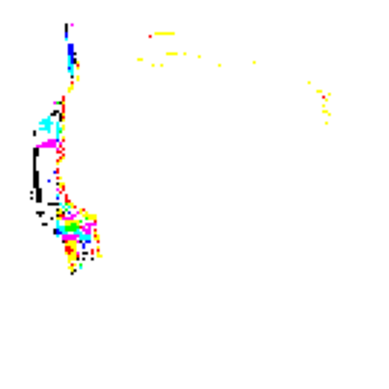

Processing image 1117/1511


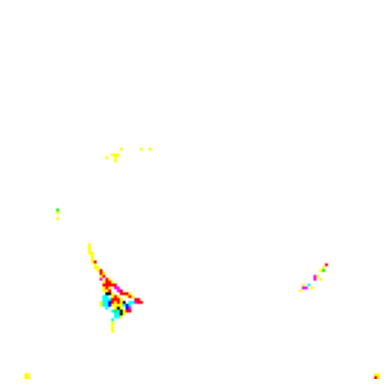

Processing image 1118/1511


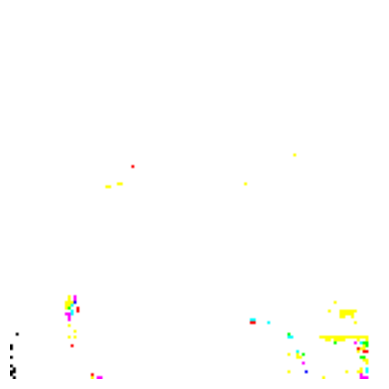

Processing image 1119/1511


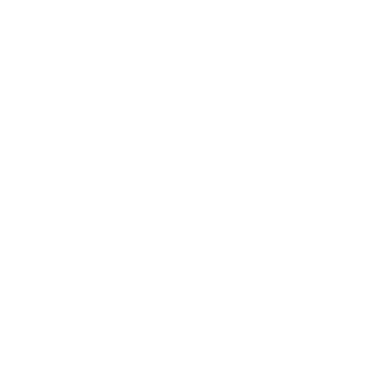

Processing image 1120/1511


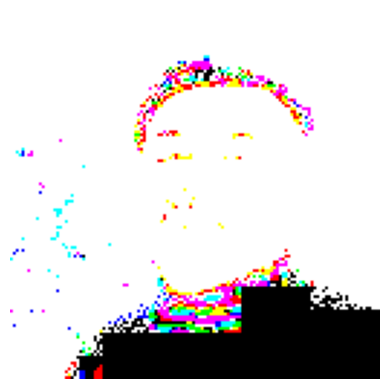

Processing image 1121/1511


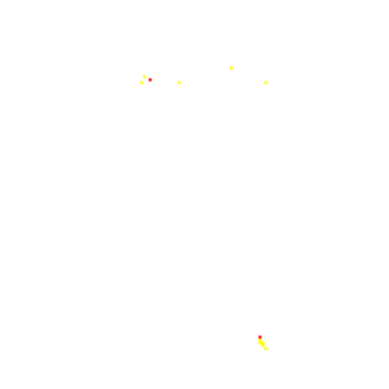

Processing image 1122/1511


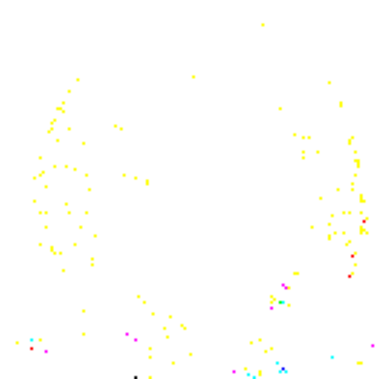

Processing image 1123/1511


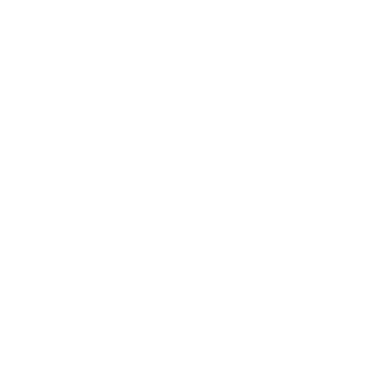

Processing image 1124/1511


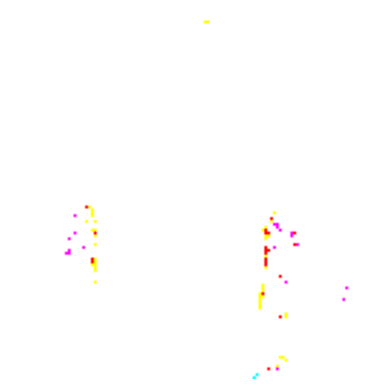

Processing image 1125/1511


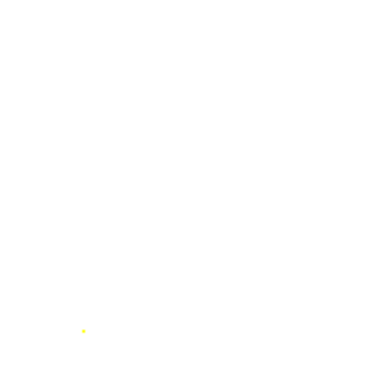

Processing image 1126/1511


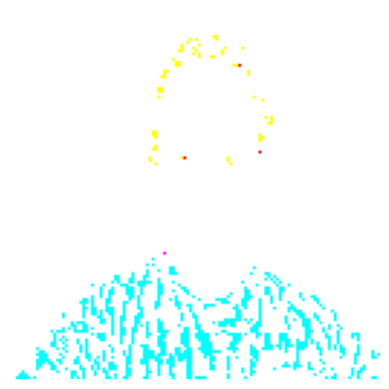

Processing image 1127/1511


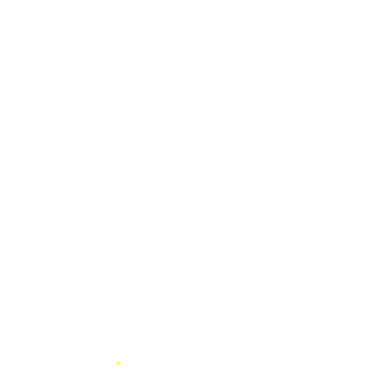

Processing image 1128/1511


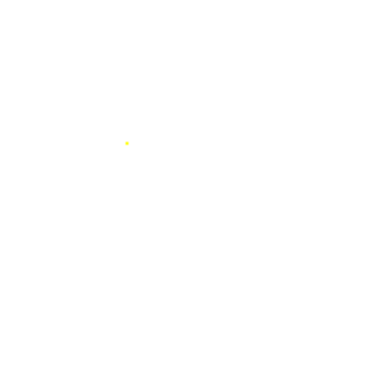

Processing image 1129/1511


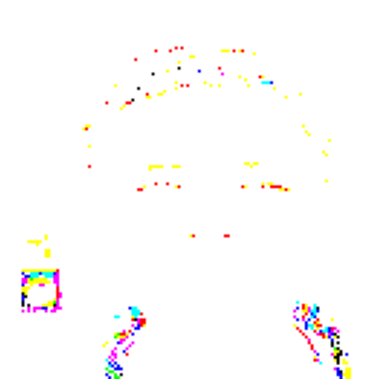

Processing image 1130/1511


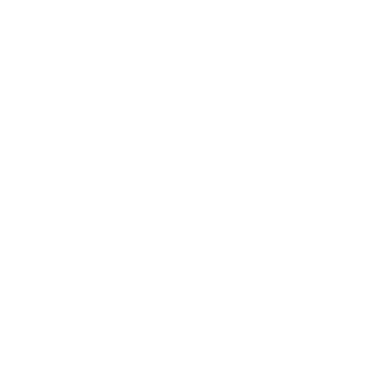

Processing image 1131/1511


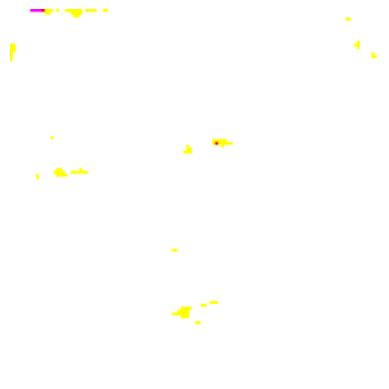

Processing image 1132/1511


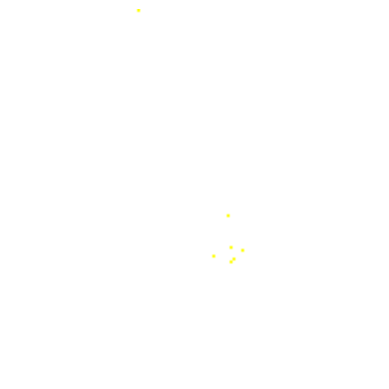

Processing image 1133/1511


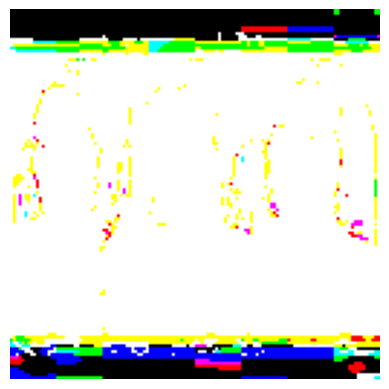

Processing image 1134/1511


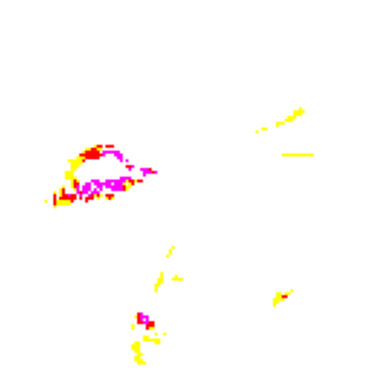

Processing image 1135/1511


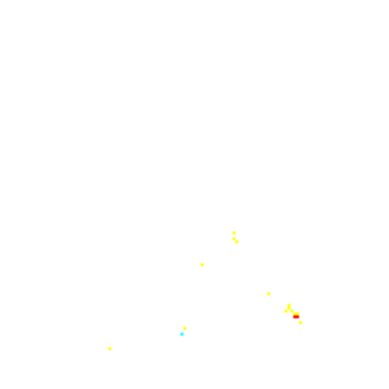

Processing image 1136/1511


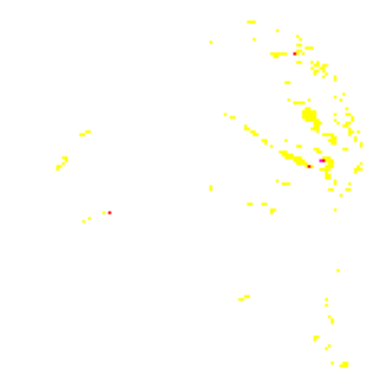

Processing image 1137/1511


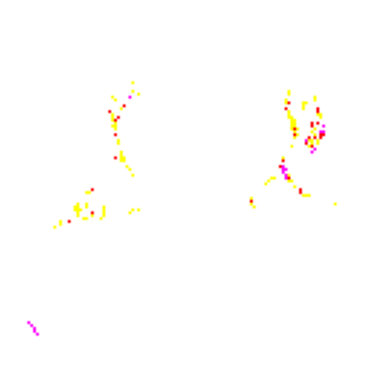

Processing image 1138/1511


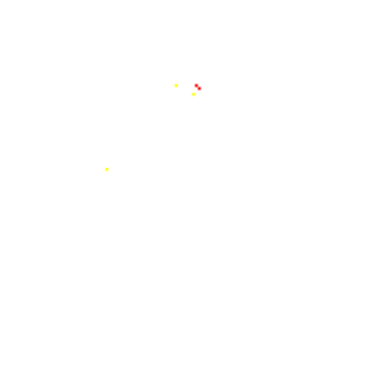

Processing image 1139/1511


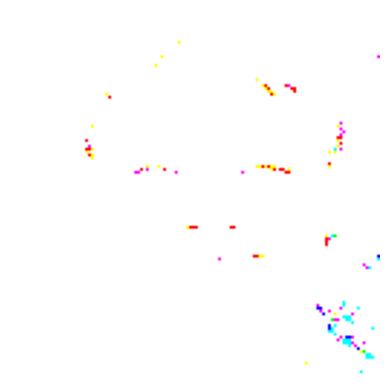

Processing image 1140/1511


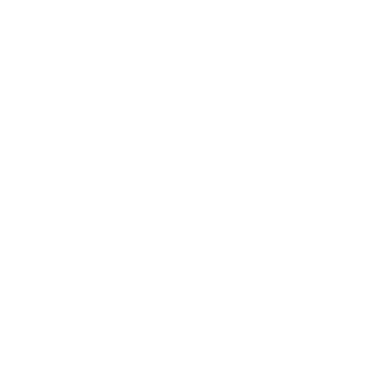

Processing image 1141/1511


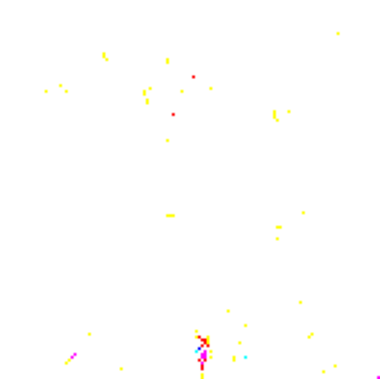

Processing image 1142/1511


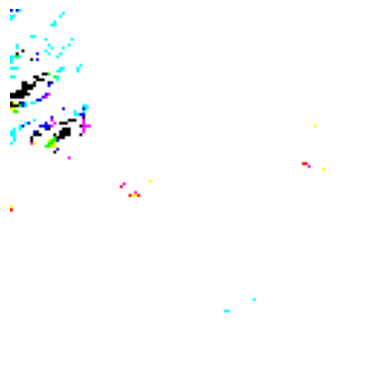

Processing image 1143/1511


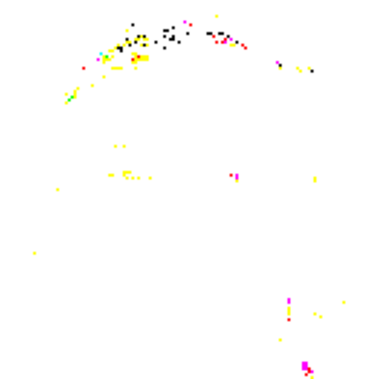

Processing image 1144/1511


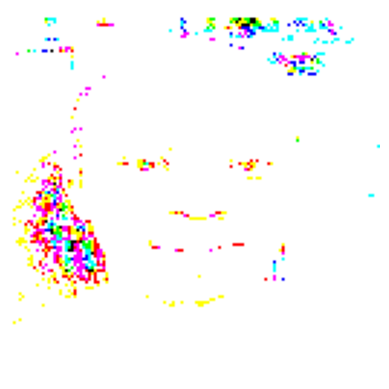

Processing image 1145/1511


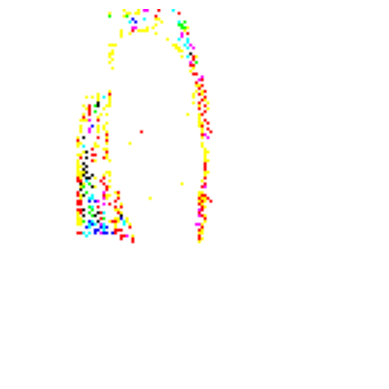

Processing image 1146/1511


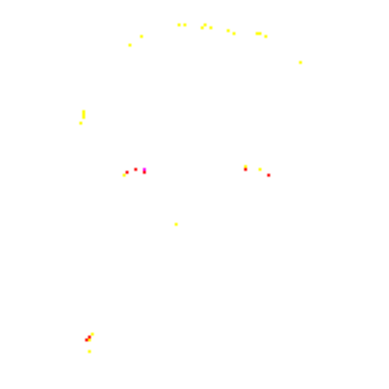

Processing image 1147/1511


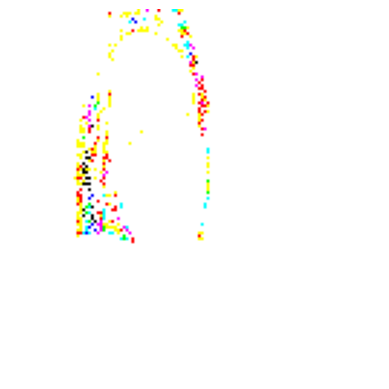

Processing image 1148/1511


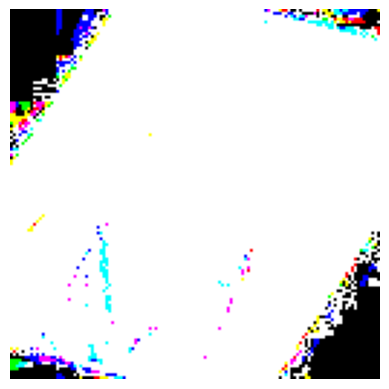

Processing image 1149/1511


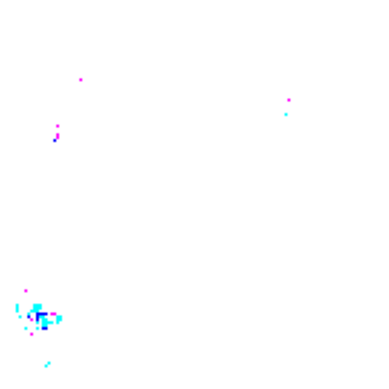

Processing image 1150/1511


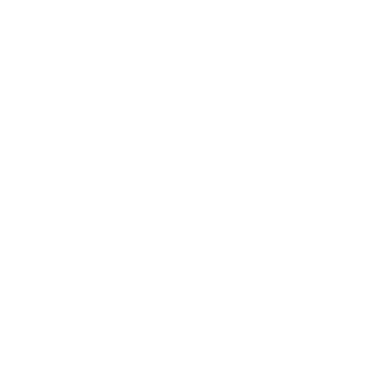

Processing image 1151/1511


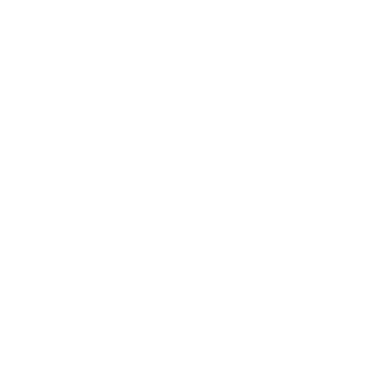

Processing image 1152/1511


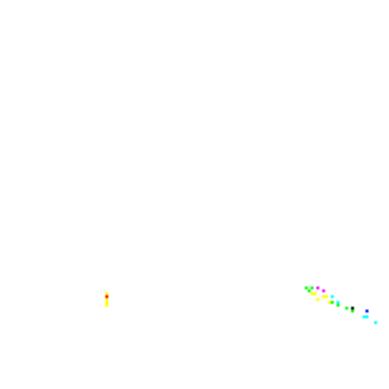

Processing image 1153/1511


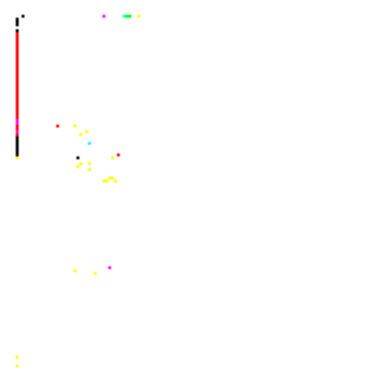

Processing image 1154/1511


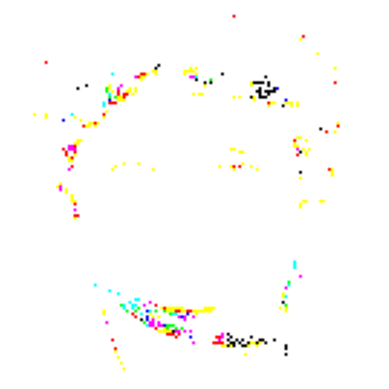

Processing image 1155/1511


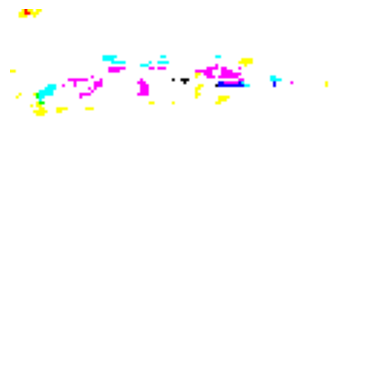

Processing image 1156/1511


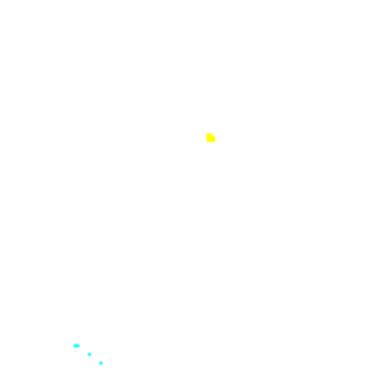

Processing image 1157/1511


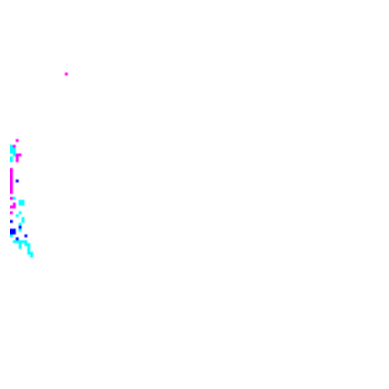

Processing image 1158/1511


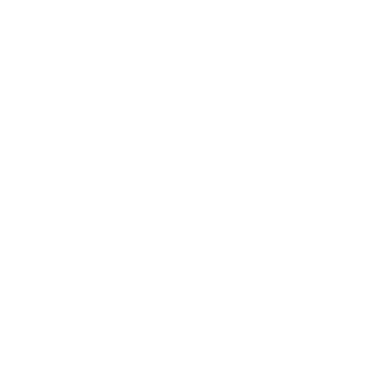

Processing image 1159/1511


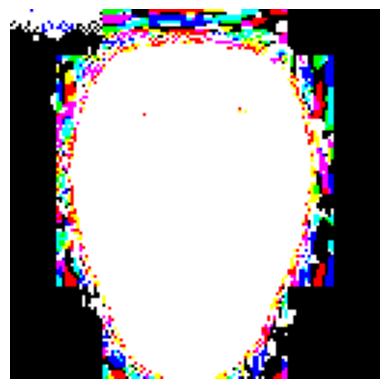

Processing image 1160/1511


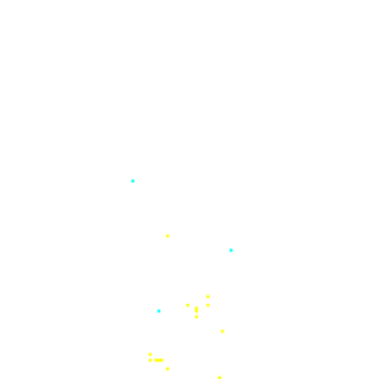

Processing image 1161/1511


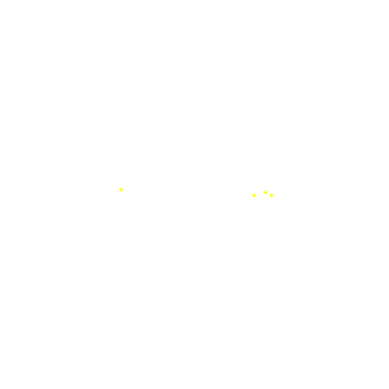

Processing image 1162/1511


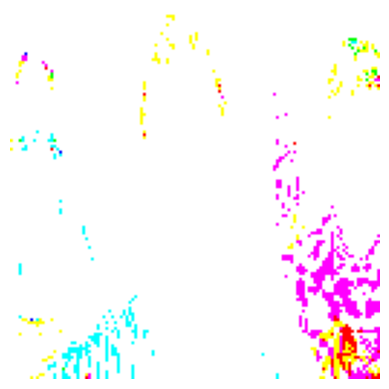

Processing image 1163/1511


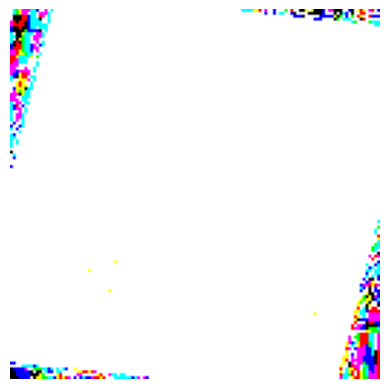

Processing image 1164/1511


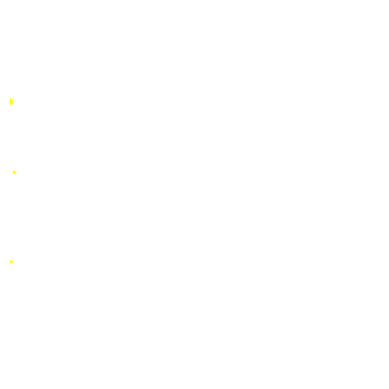

Processing image 1165/1511


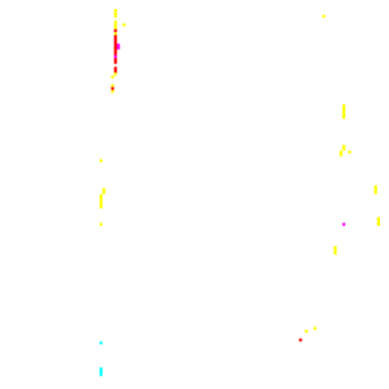

Processing image 1166/1511


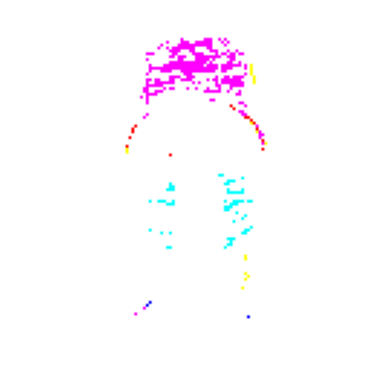

Processing image 1167/1511


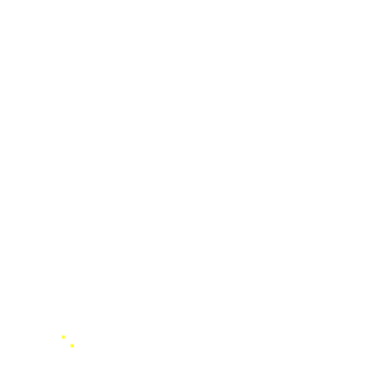

Processing image 1168/1511


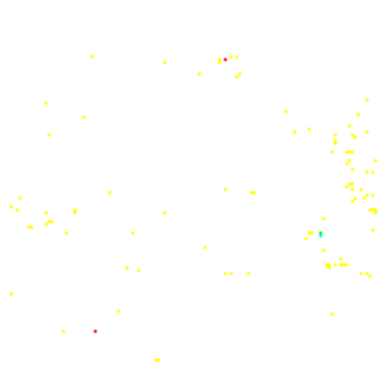

Processing image 1169/1511


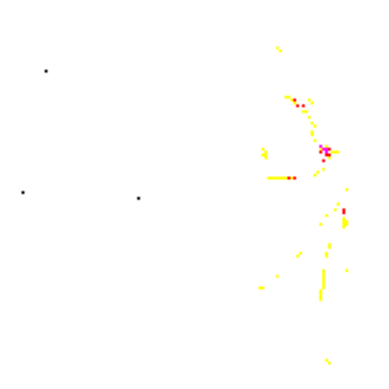

Processing image 1170/1511


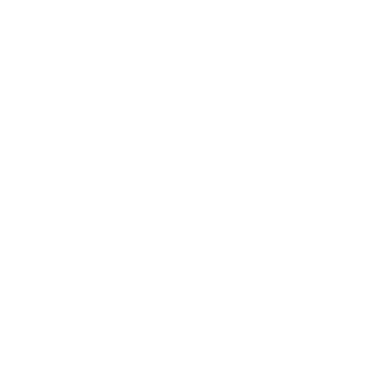

Processing image 1171/1511


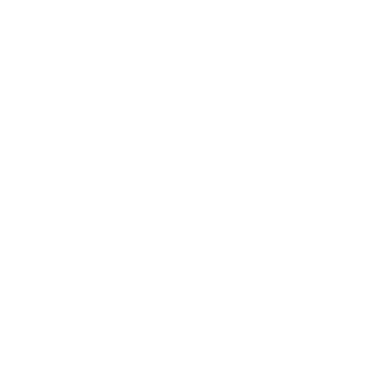

Processing image 1172/1511


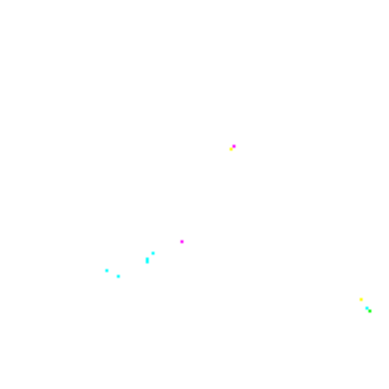

Processing image 1173/1511


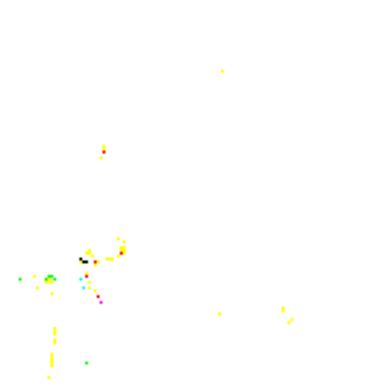

Processing image 1174/1511


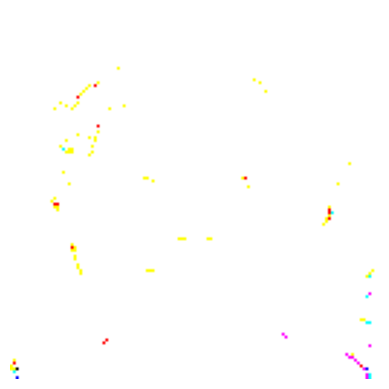

Processing image 1175/1511


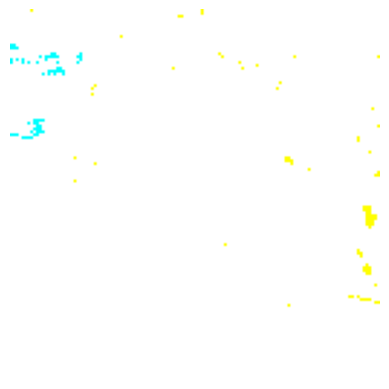

Processing image 1176/1511


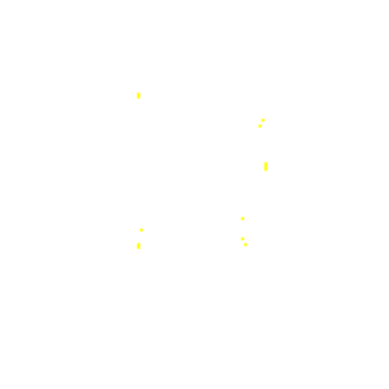

Processing image 1177/1511


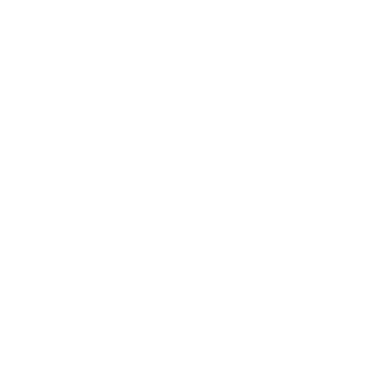

Processing image 1178/1511


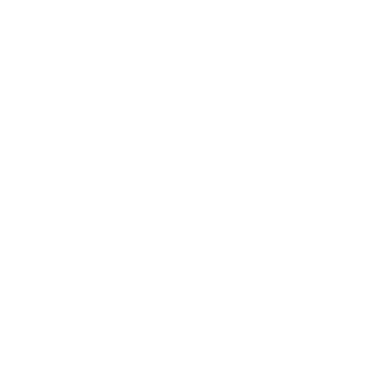

Processing image 1179/1511


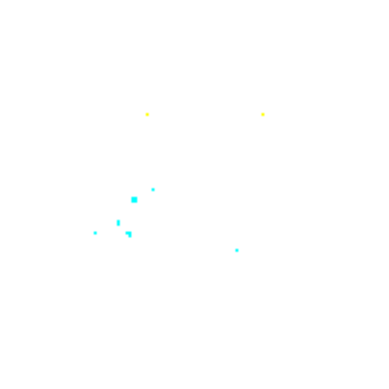

Processing image 1180/1511


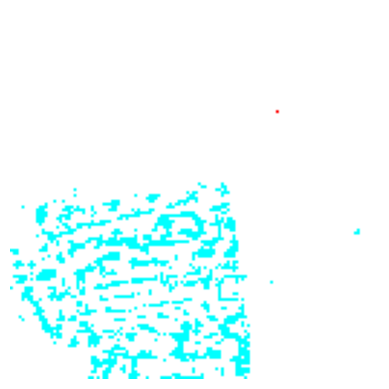

Processing image 1181/1511


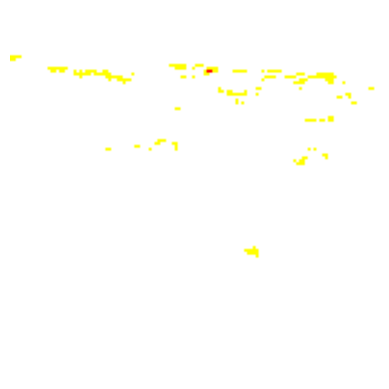

Processing image 1182/1511


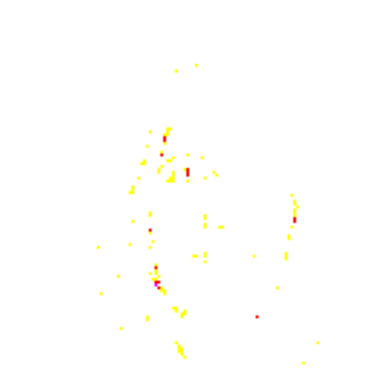

Processing image 1183/1511


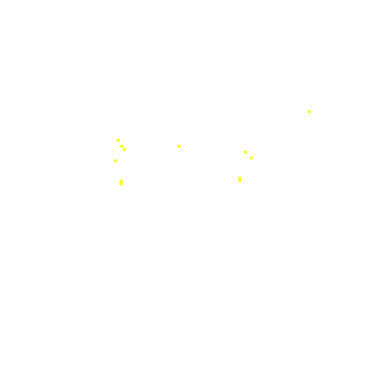

Processing image 1184/1511


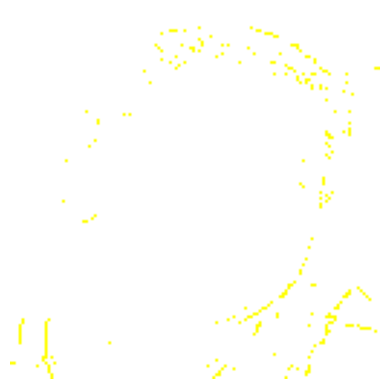

Processing image 1185/1511


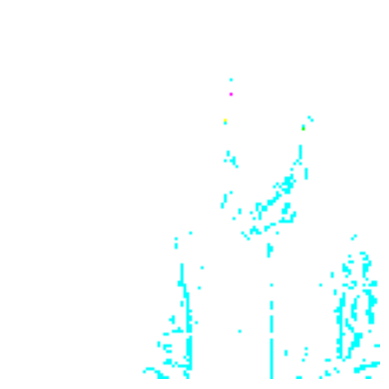

Processing image 1186/1511


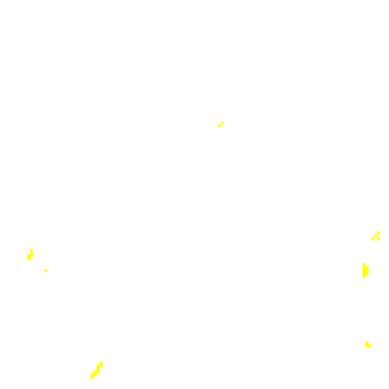

Processing image 1187/1511


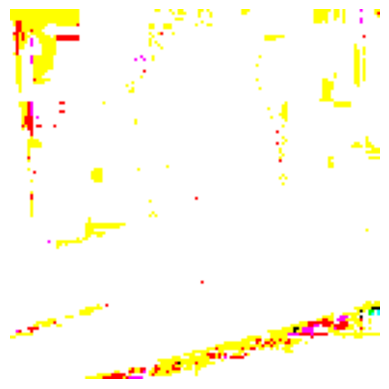

Processing image 1188/1511


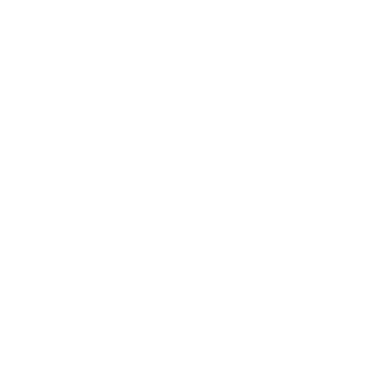

Processing image 1189/1511


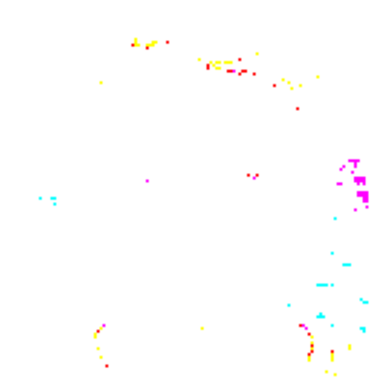

Processing image 1190/1511


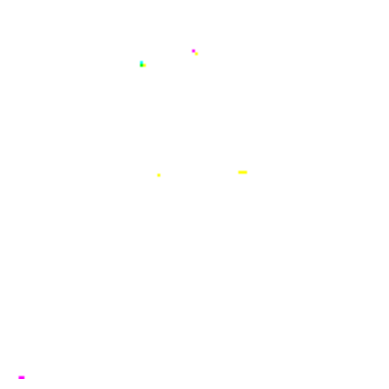

Processing image 1191/1511


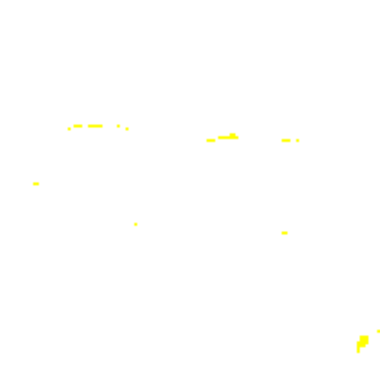

Processing image 1192/1511


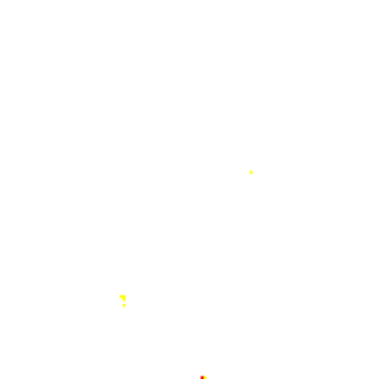

Processing image 1193/1511


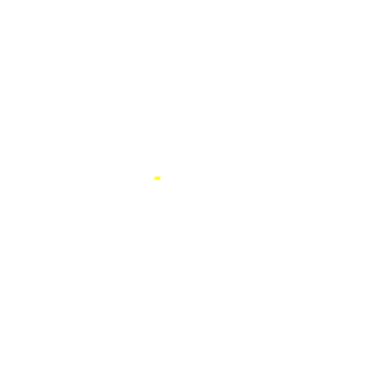

Processing image 1194/1511


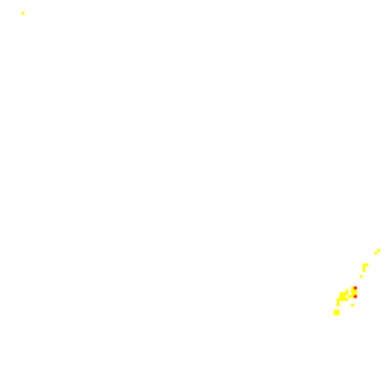

Processing image 1195/1511


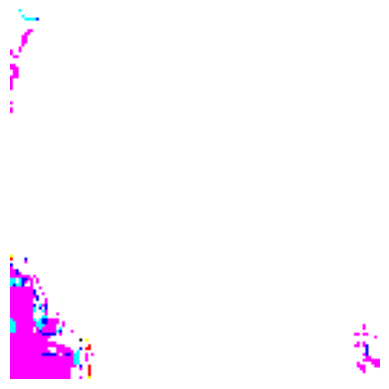

Processing image 1196/1511


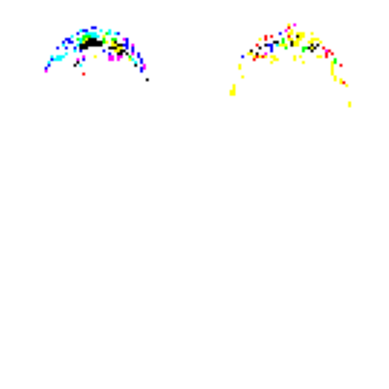

Processing image 1197/1511


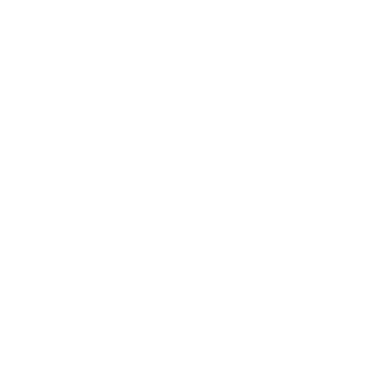

Processing image 1198/1511


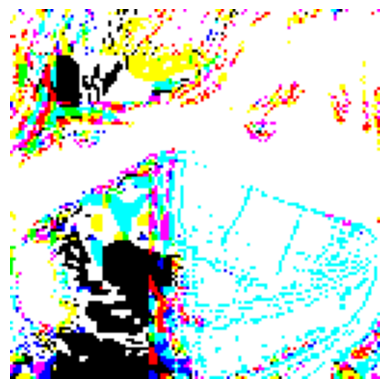

Processing image 1199/1511


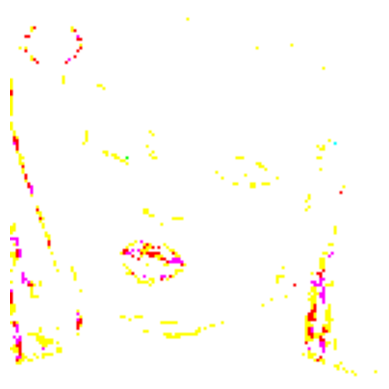

Processing image 1200/1511


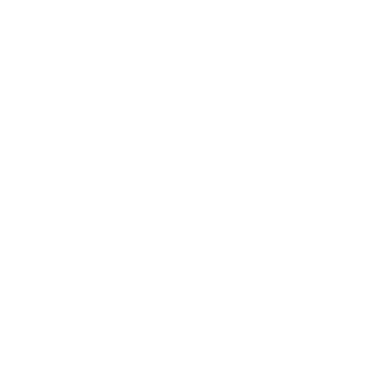

Processing image 1201/1511


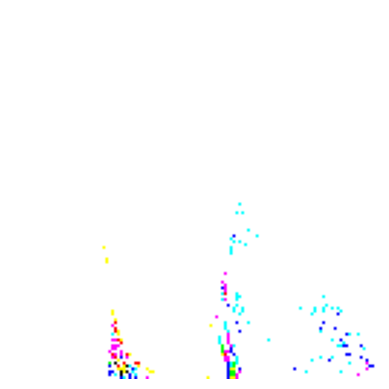

Processing image 1202/1511


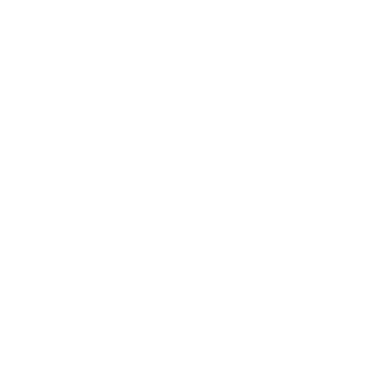

Processing image 1203/1511


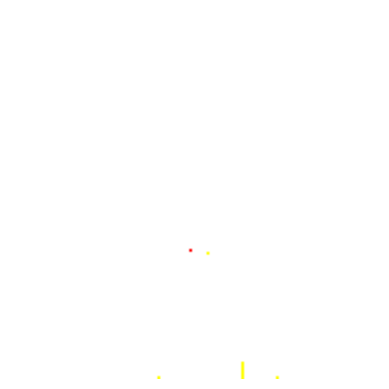

Processing image 1204/1511


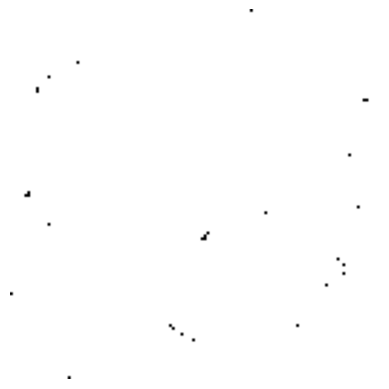

Processing image 1205/1511


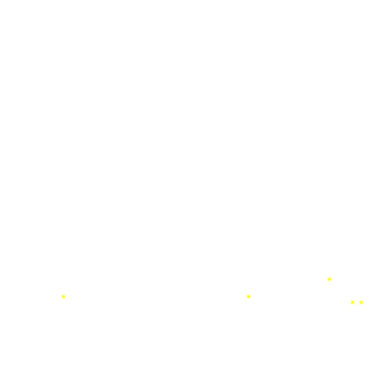

Processing image 1206/1511


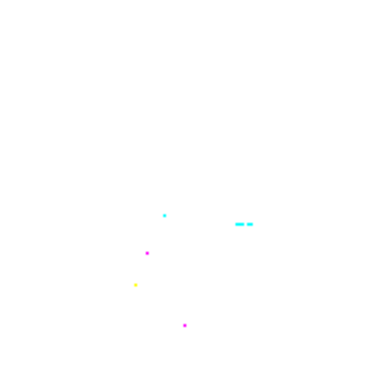

Processing image 1207/1511


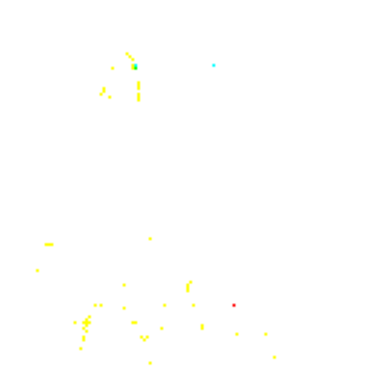

Processing image 1208/1511


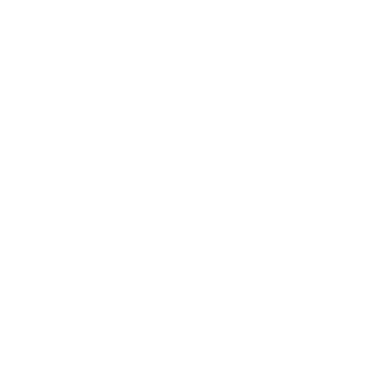

Processing image 1209/1511


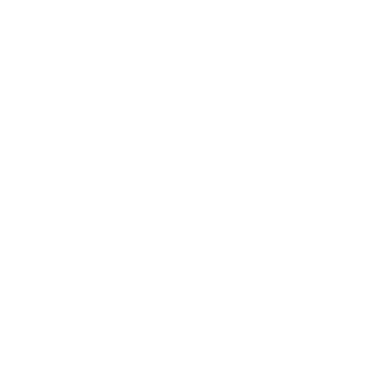

Processing image 1210/1511


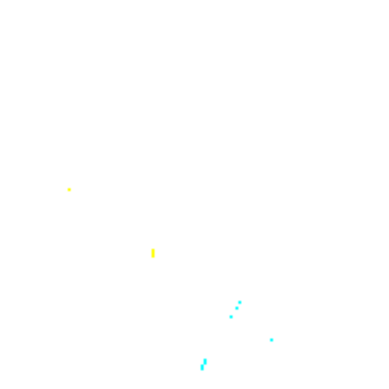

Processing image 1211/1511


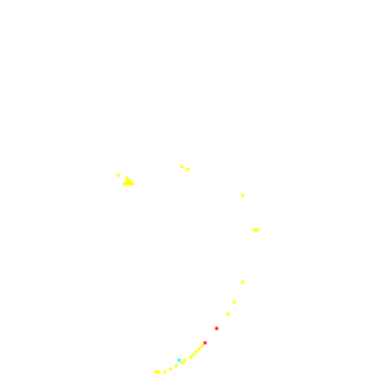

Processing image 1212/1511


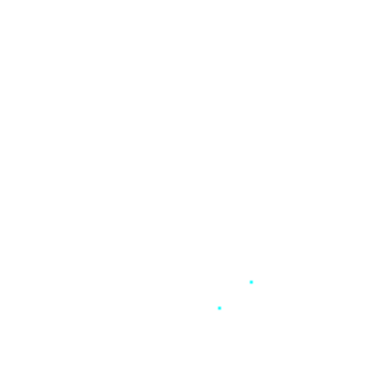

Processing image 1213/1511


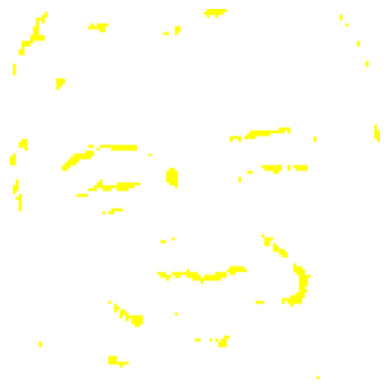

Processing image 1214/1511


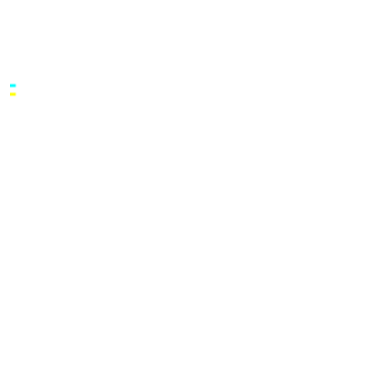

Processing image 1215/1511


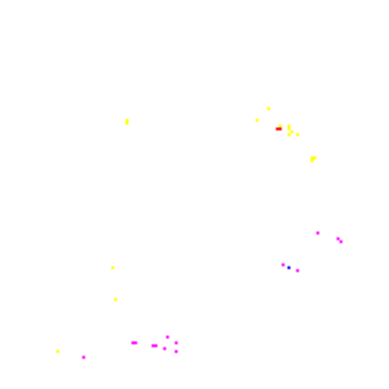

Processing image 1216/1511


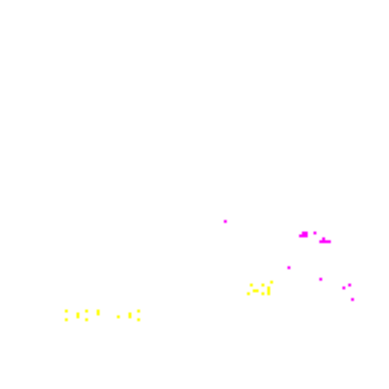

Processing image 1217/1511


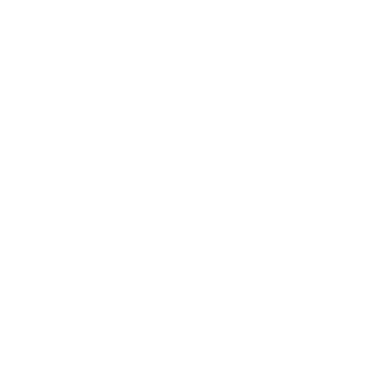

Processing image 1218/1511


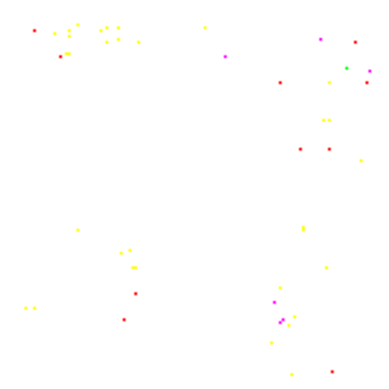

Processing image 1219/1511


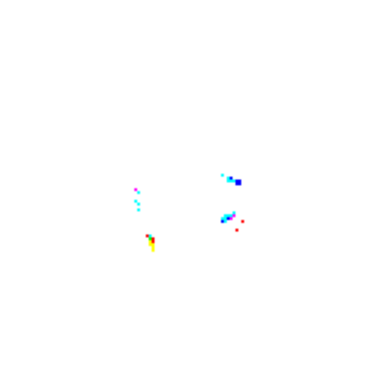

Processing image 1220/1511


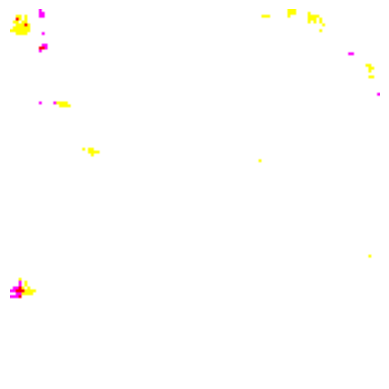

Processing image 1221/1511


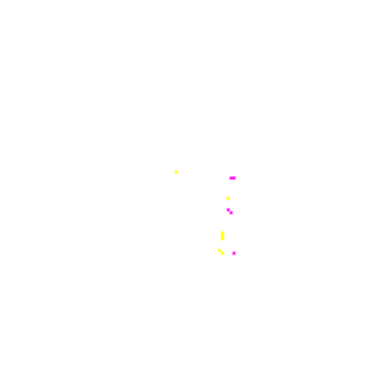

Processing image 1222/1511


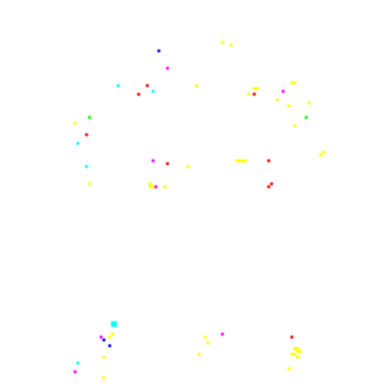

Processing image 1223/1511


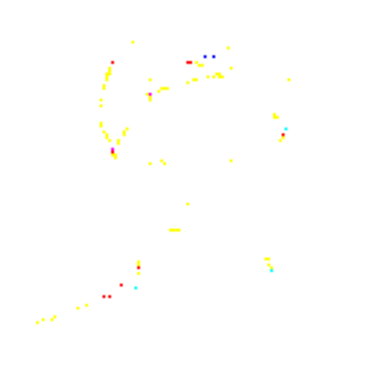

Processing image 1224/1511


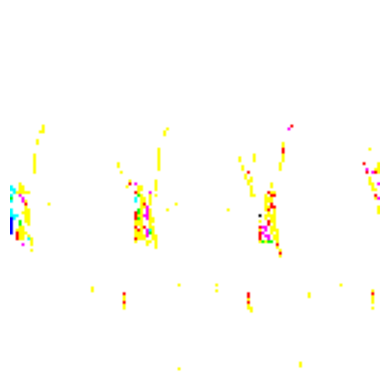

Processing image 1225/1511


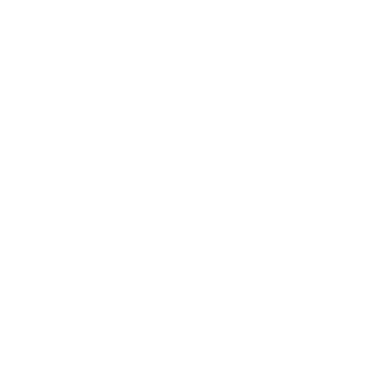

Processing image 1226/1511


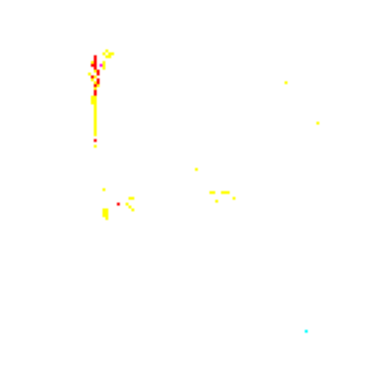

Processing image 1227/1511


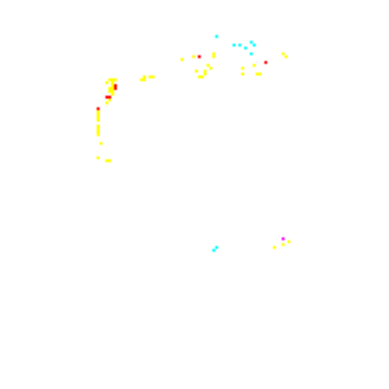

Processing image 1228/1511


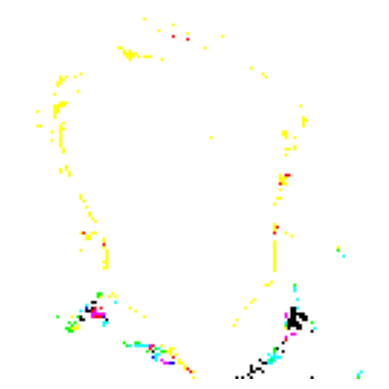

Processing image 1229/1511


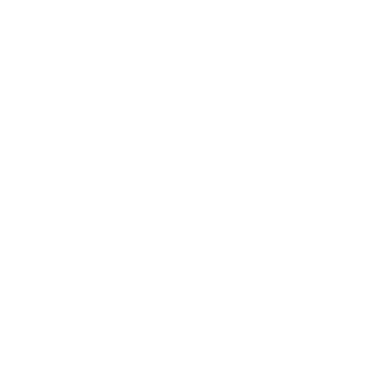

Processing image 1230/1511


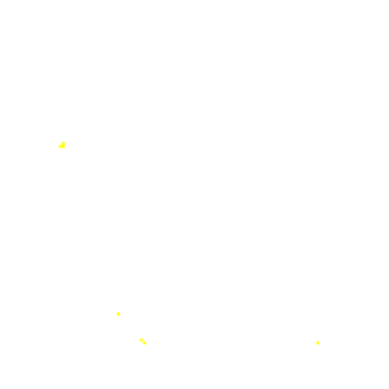

Processing image 1231/1511


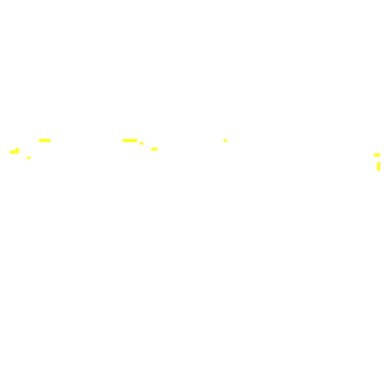

Processing image 1232/1511


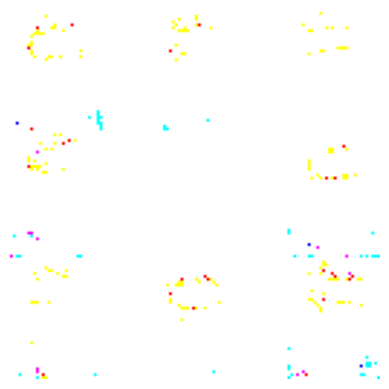

Processing image 1233/1511


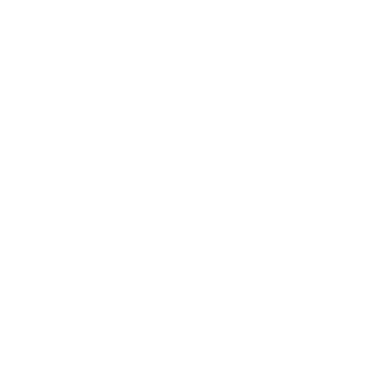

Processing image 1234/1511


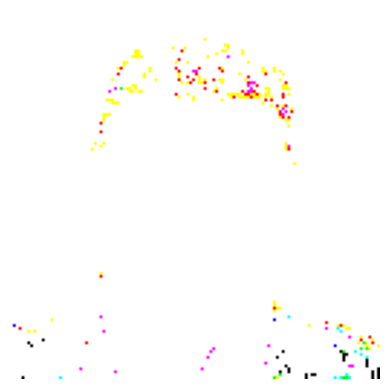

Processing image 1235/1511


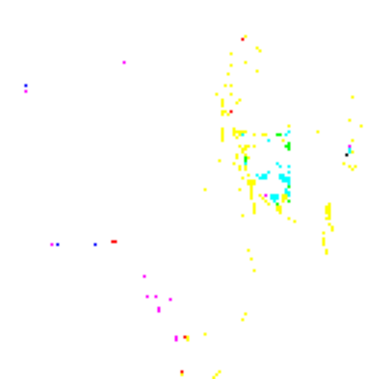

Processing image 1236/1511


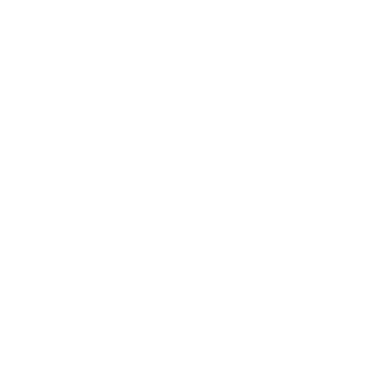

Processing image 1237/1511


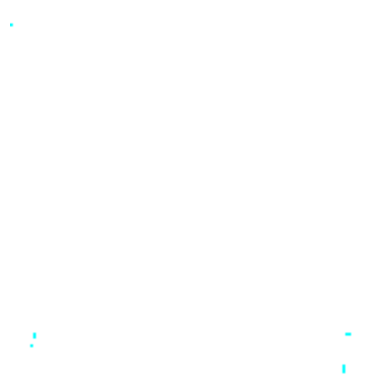

Processing image 1238/1511


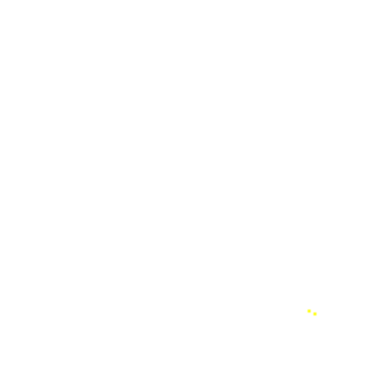

Processing image 1239/1511


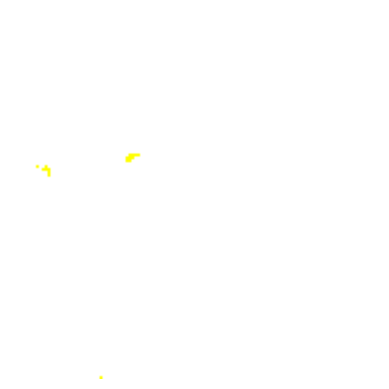

Processing image 1240/1511


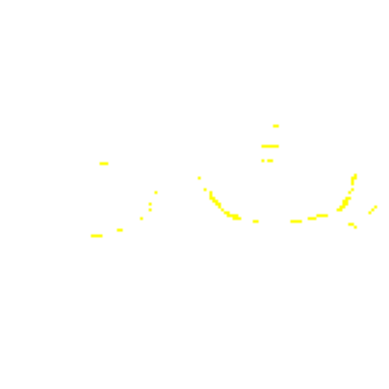

Processing image 1241/1511


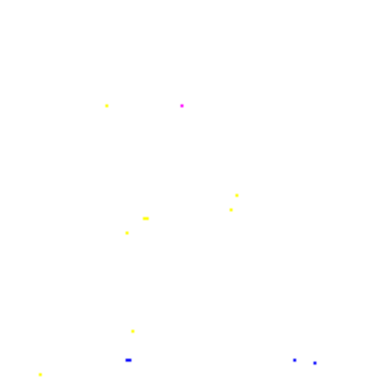

Processing image 1242/1511


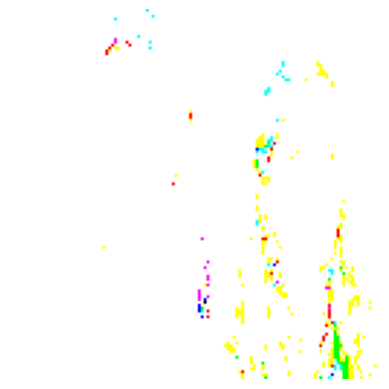

Processing image 1243/1511


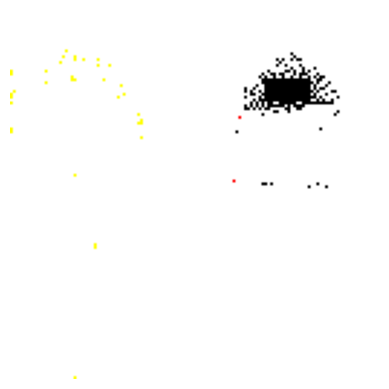

Processing image 1244/1511


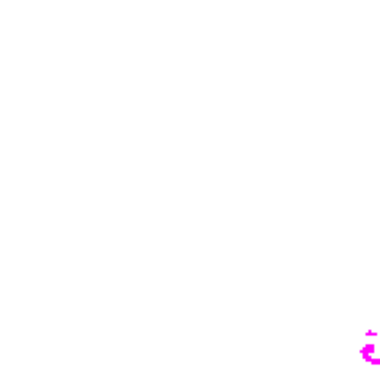

Processing image 1245/1511


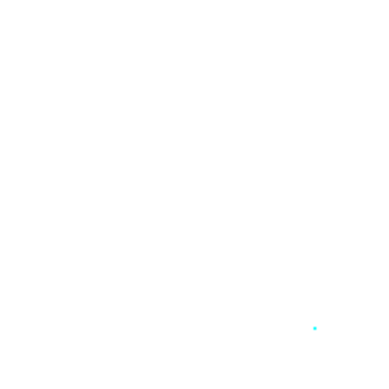

Processing image 1246/1511


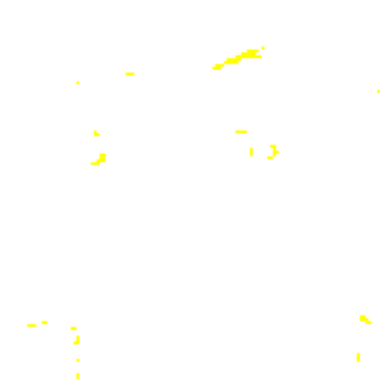

Processing image 1247/1511


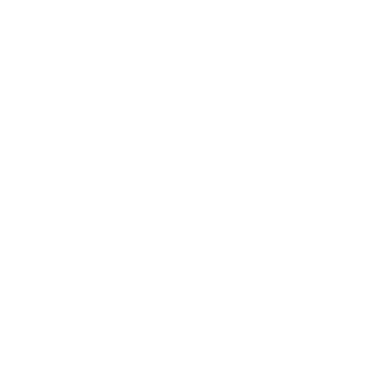

Processing image 1248/1511


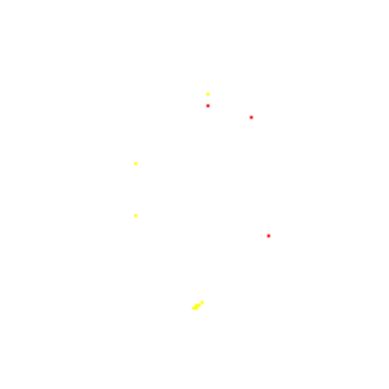

Processing image 1249/1511


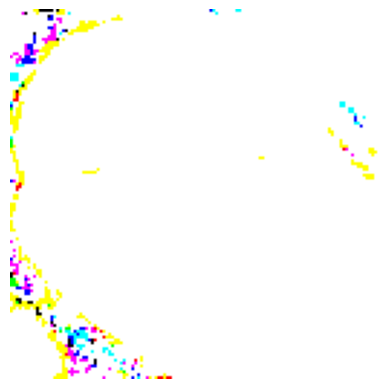

Processing image 1250/1511


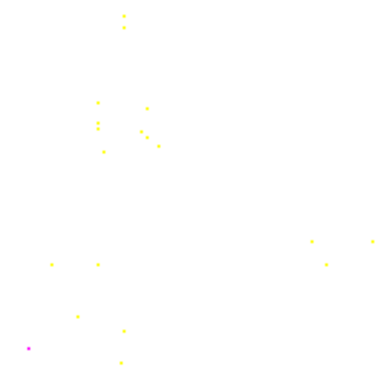

Processing image 1251/1511


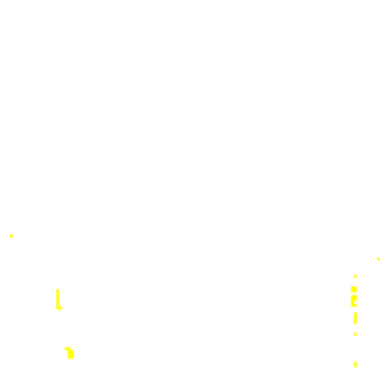

Processing image 1252/1511


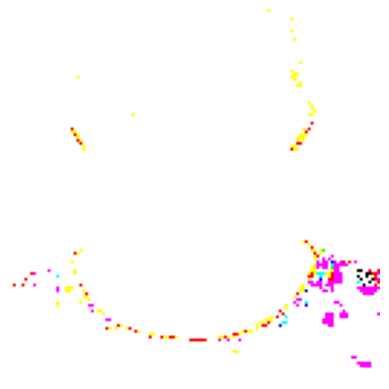

Processing image 1253/1511


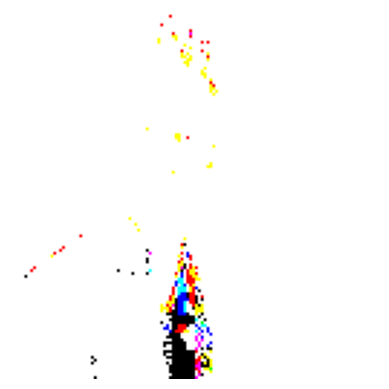

Processing image 1254/1511


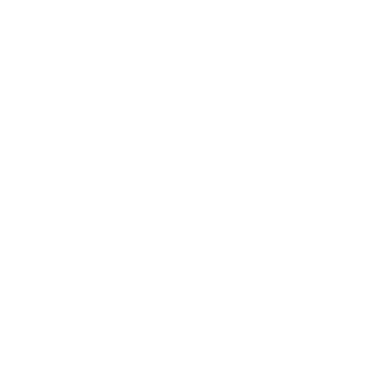

Processing image 1255/1511


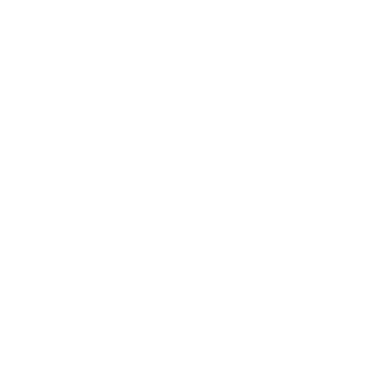

Processing image 1256/1511


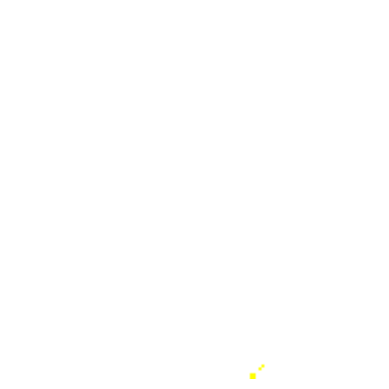

Processing image 1257/1511


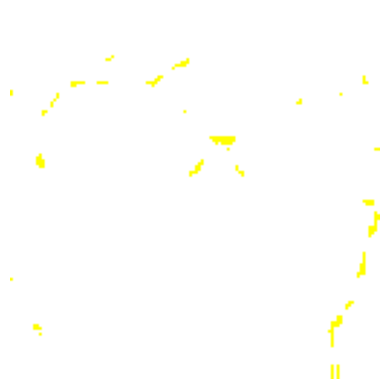

Processing image 1258/1511


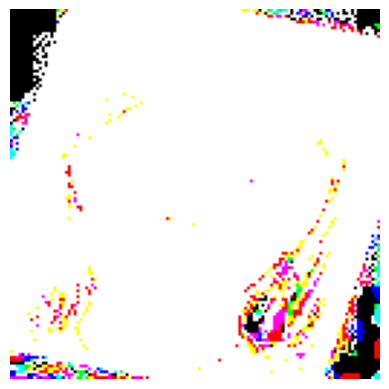

Processing image 1259/1511


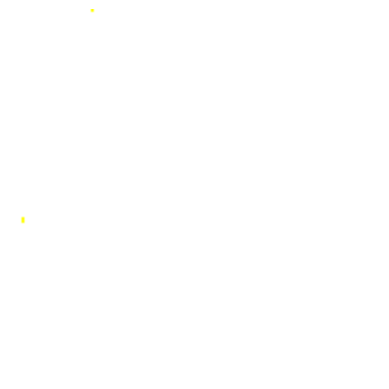

Processing image 1260/1511


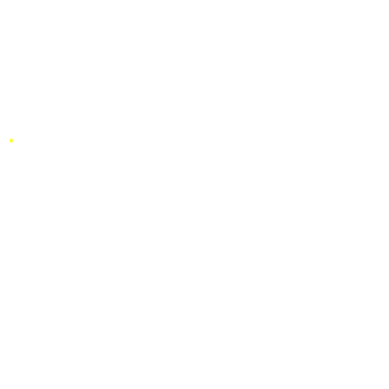

Processing image 1261/1511


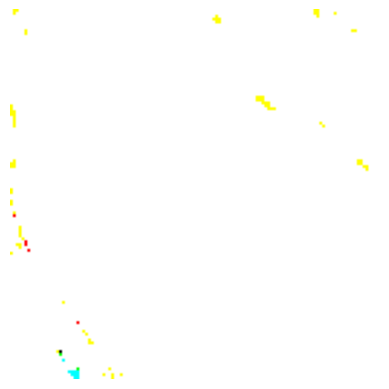

Processing image 1262/1511


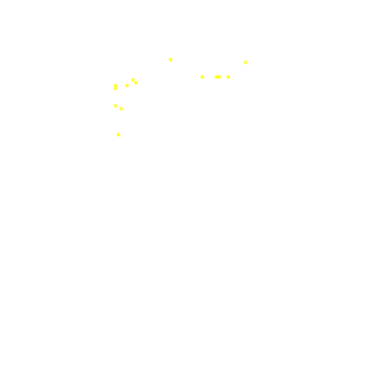

Processing image 1263/1511


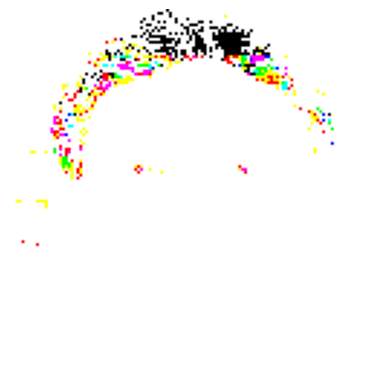

Processing image 1264/1511


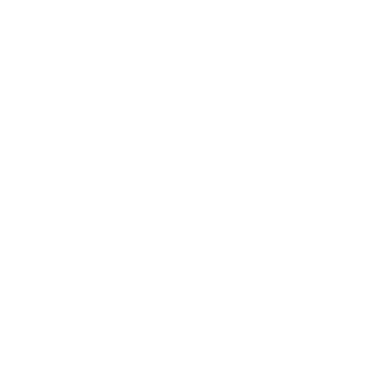

Processing image 1265/1511


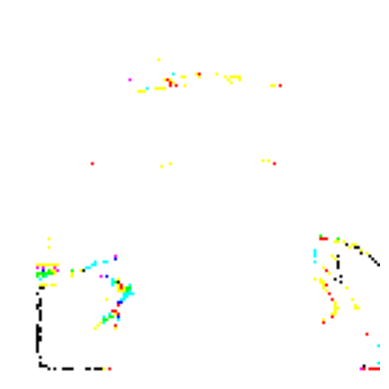

Processing image 1266/1511


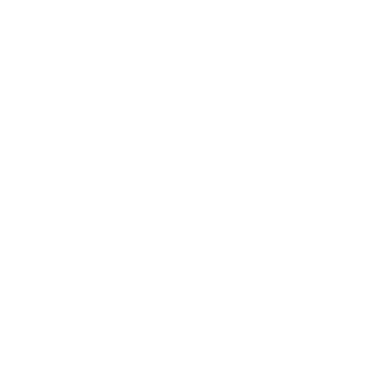

Processing image 1267/1511


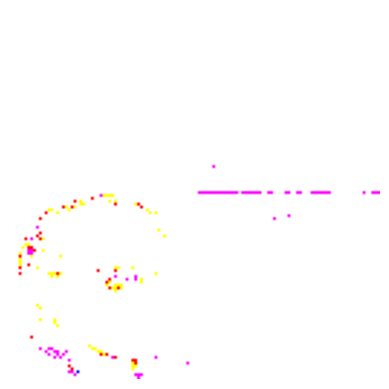

Processing image 1268/1511


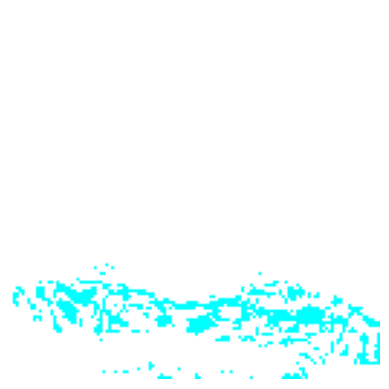

Processing image 1269/1511


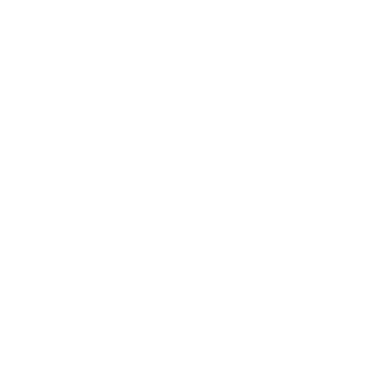

Processing image 1270/1511


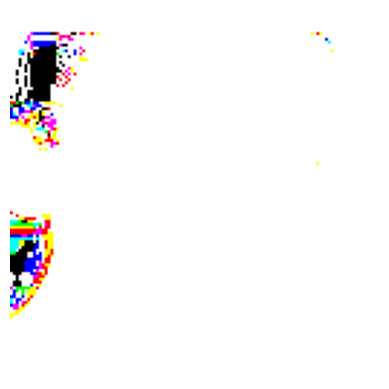

Processing image 1271/1511


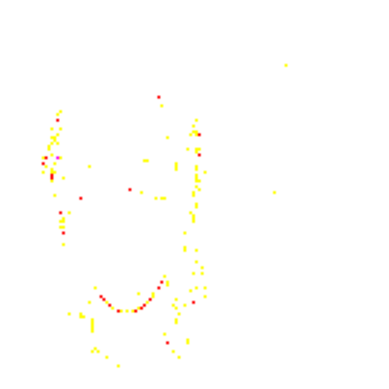

Processing image 1272/1511


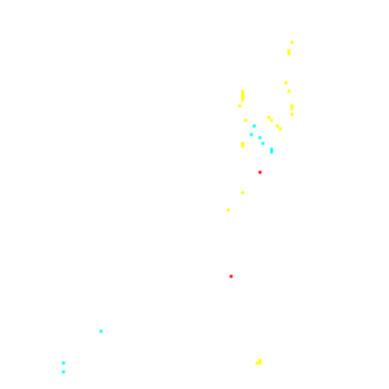

Processing image 1273/1511


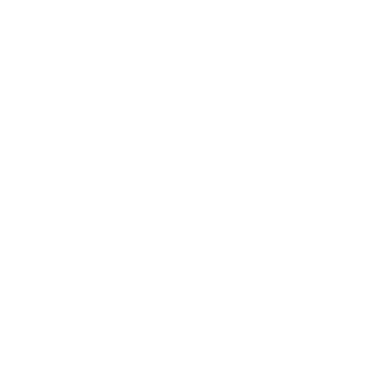

Processing image 1274/1511


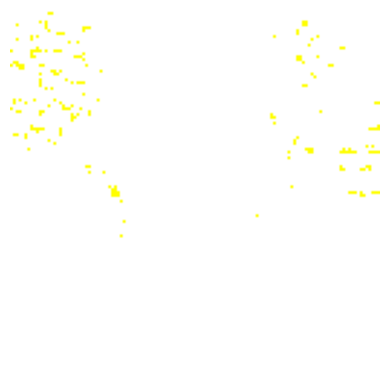

Processing image 1275/1511


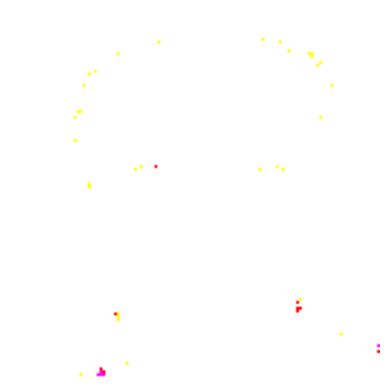

Processing image 1276/1511


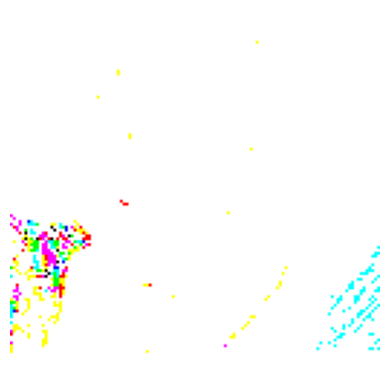

Processing image 1277/1511


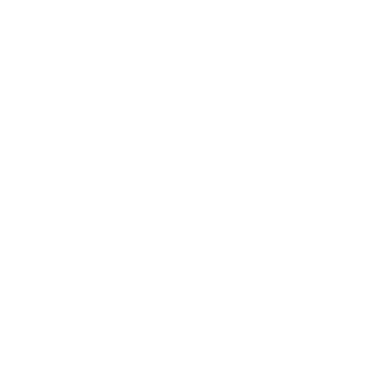

Processing image 1278/1511


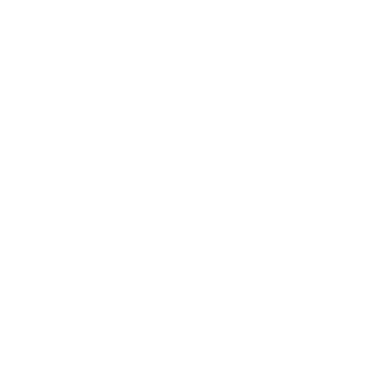

Processing image 1279/1511


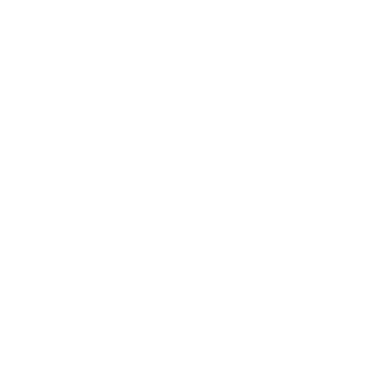

Processing image 1280/1511


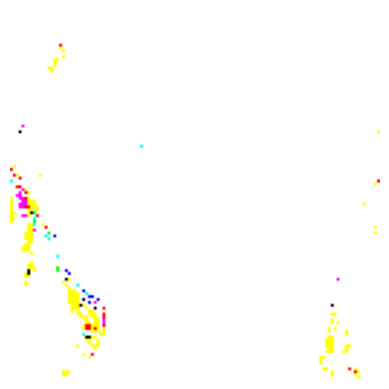

Processing image 1281/1511


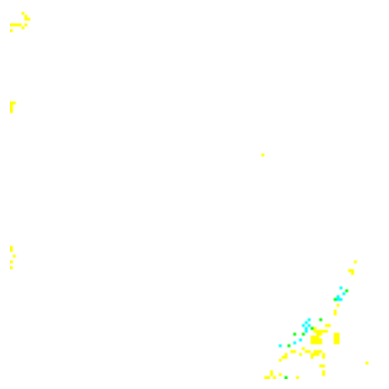

Processing image 1282/1511


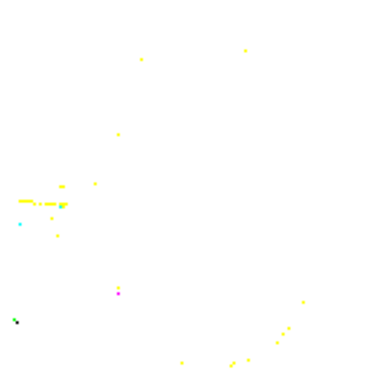

Processing image 1283/1511


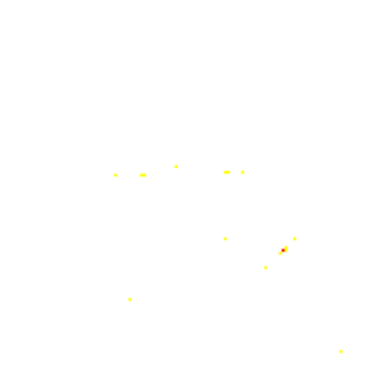

Processing image 1284/1511


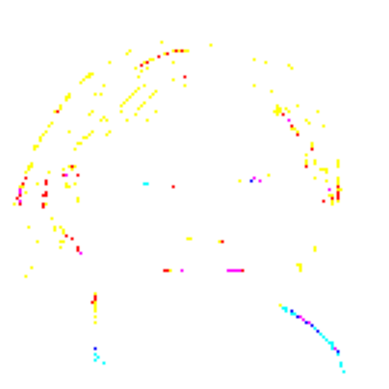

Processing image 1285/1511


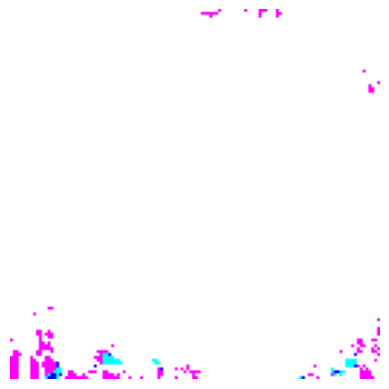

Processing image 1286/1511


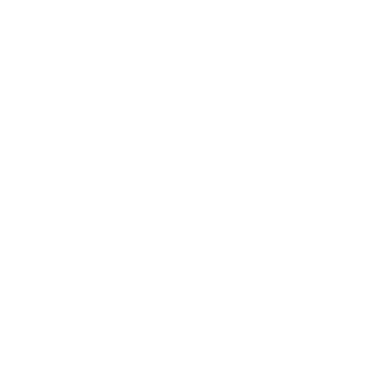

Processing image 1287/1511


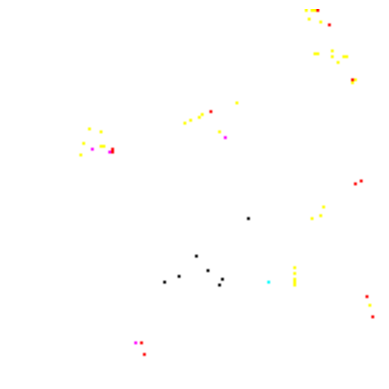

Processing image 1288/1511


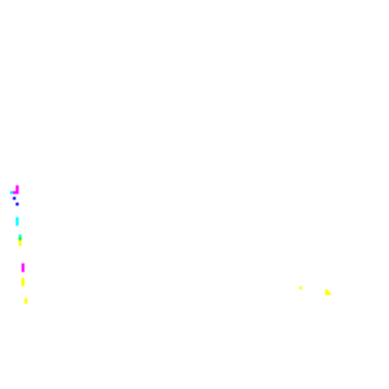

Processing image 1289/1511


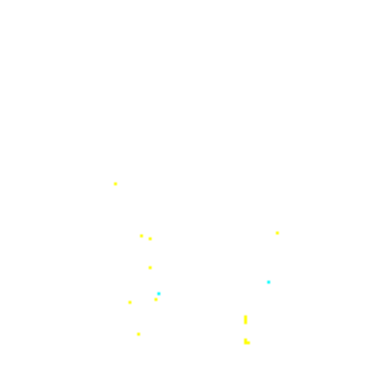

Processing image 1290/1511


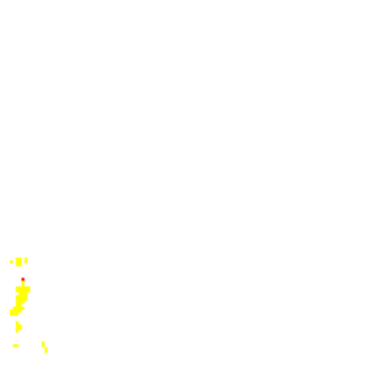

Processing image 1291/1511


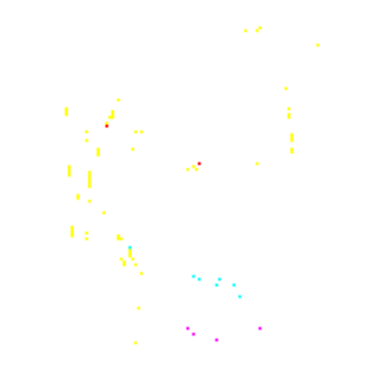

Processing image 1292/1511


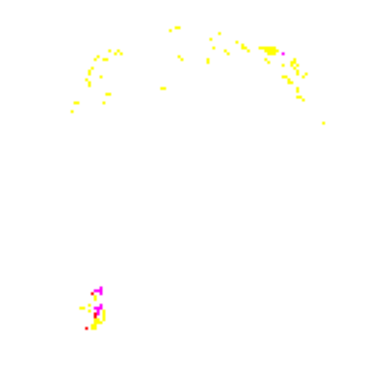

Processing image 1293/1511


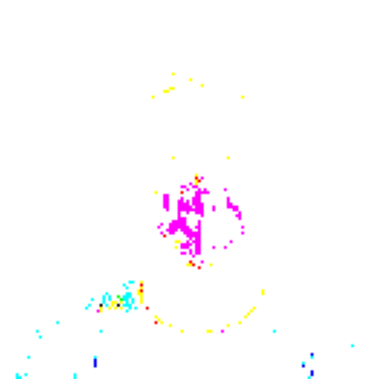

Processing image 1294/1511


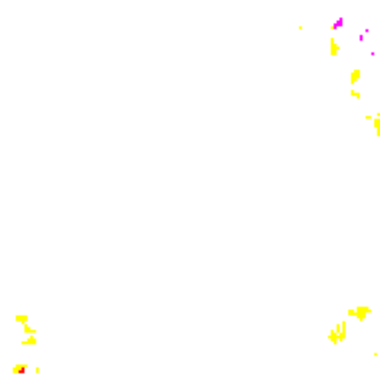

Processing image 1295/1511


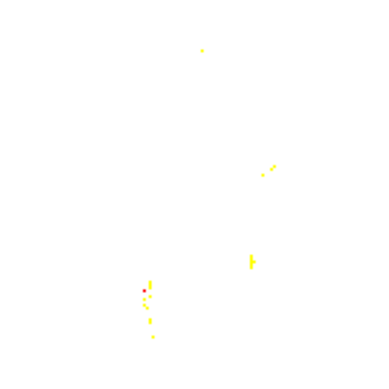

Processing image 1296/1511


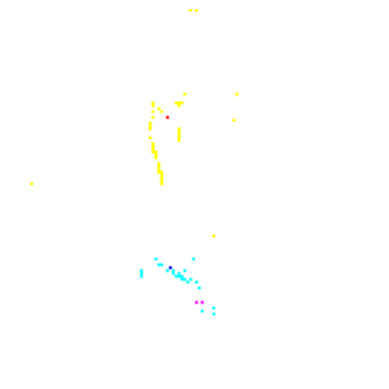

Processing image 1297/1511


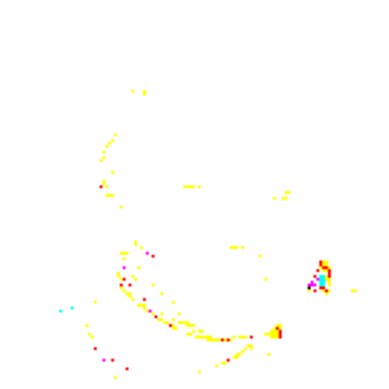

Processing image 1298/1511


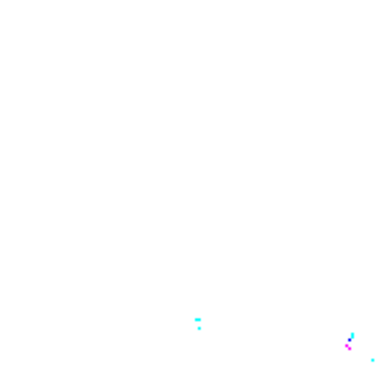

Processing image 1299/1511


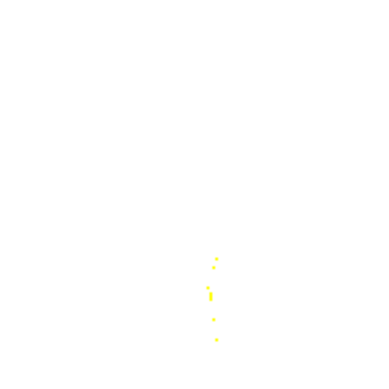

Processing image 1300/1511


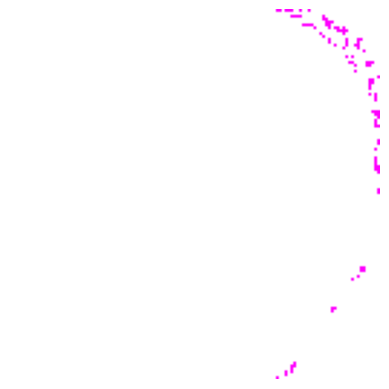

Processing image 1301/1511


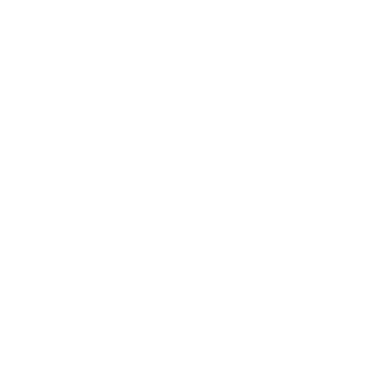

Processing image 1302/1511


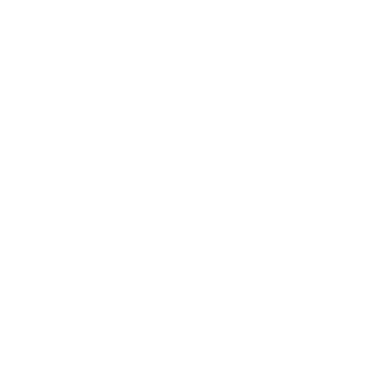

Processing image 1303/1511


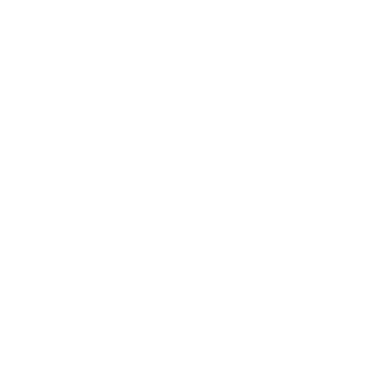

Processing image 1304/1511


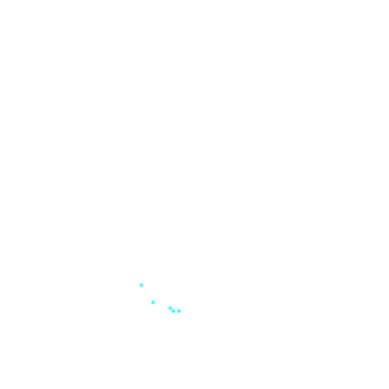

Processing image 1305/1511


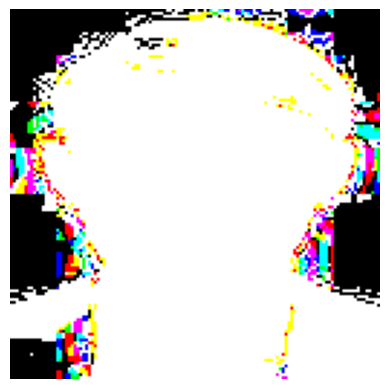

Processing image 1306/1511


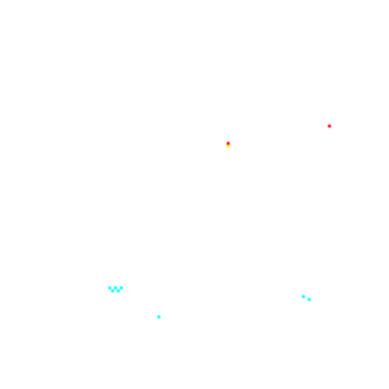

Processing image 1307/1511


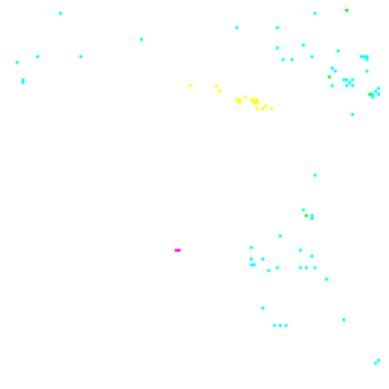

Processing image 1308/1511


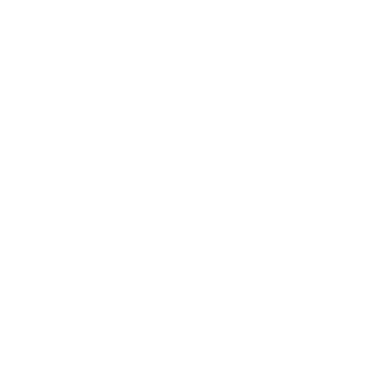

Processing image 1309/1511


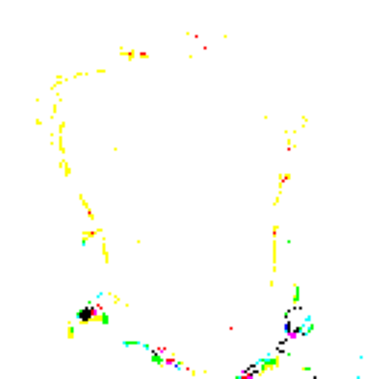

Processing image 1310/1511


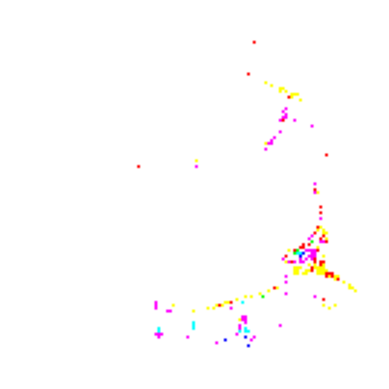

Processing image 1311/1511


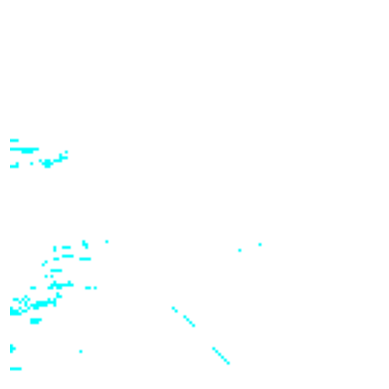

Processing image 1312/1511


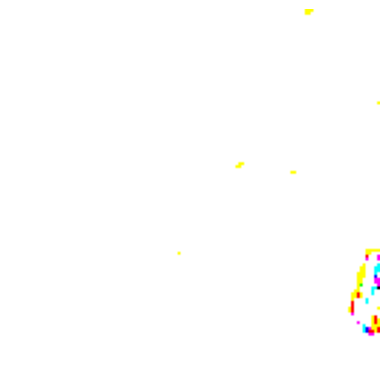

Processing image 1313/1511


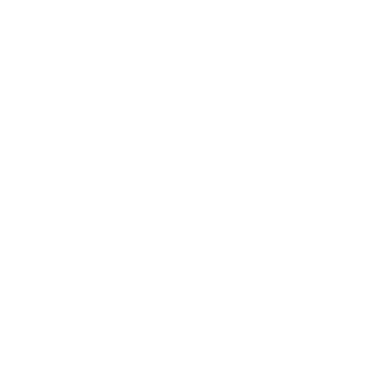

Processing image 1314/1511


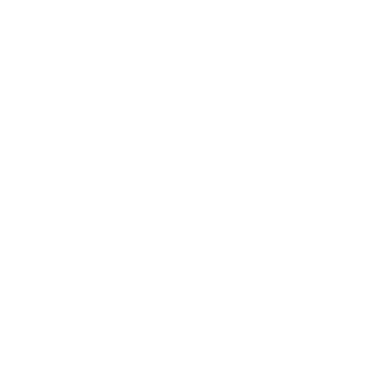

Processing image 1315/1511


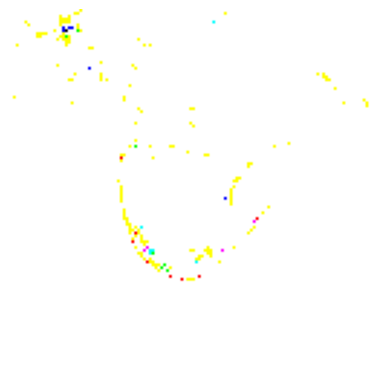

Processing image 1316/1511


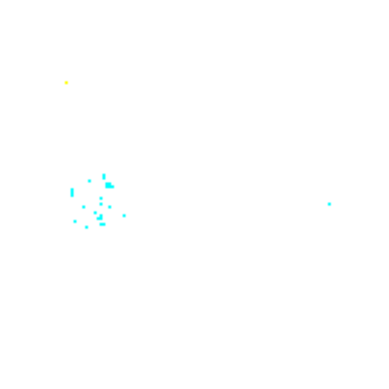

Processing image 1317/1511


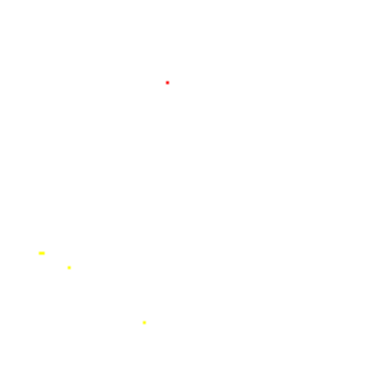

Processing image 1318/1511


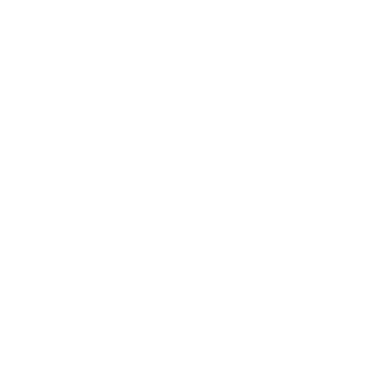

Processing image 1319/1511


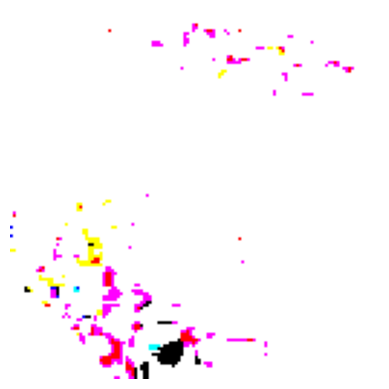

Processing image 1320/1511


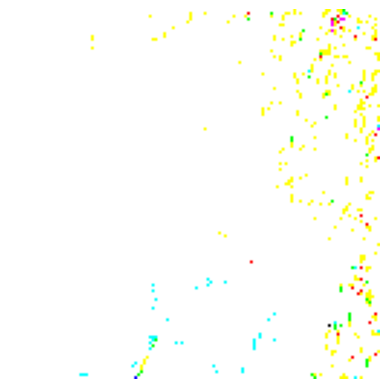

Processing image 1321/1511


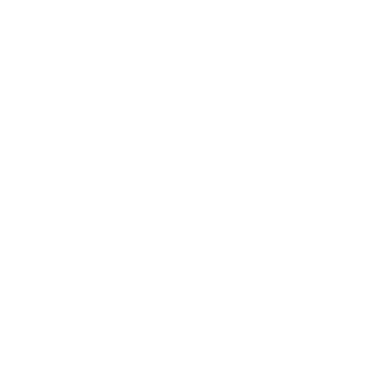

Processing image 1322/1511


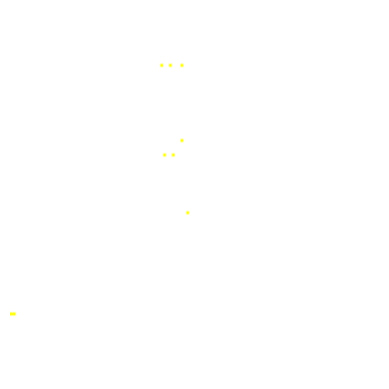

Processing image 1323/1511


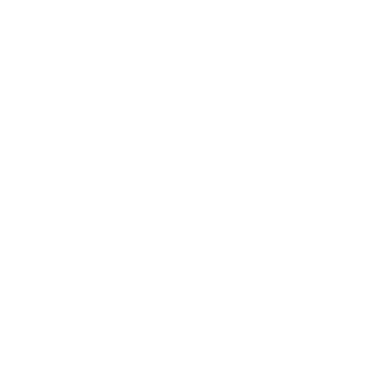

Processing image 1324/1511


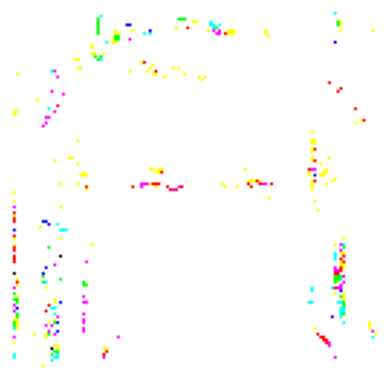

Processing image 1325/1511


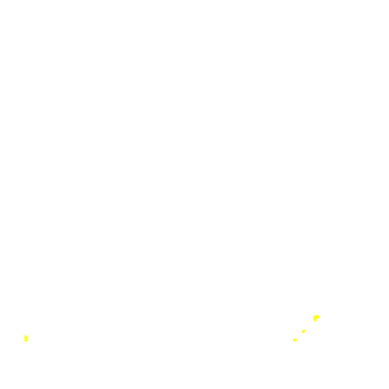

Processing image 1326/1511


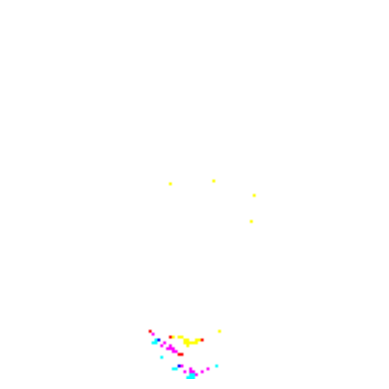

Processing image 1327/1511


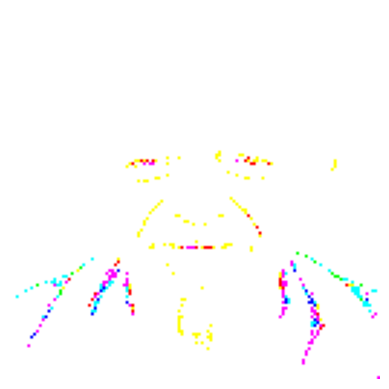

Processing image 1328/1511


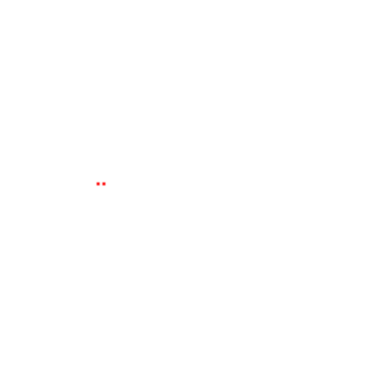

Processing image 1329/1511


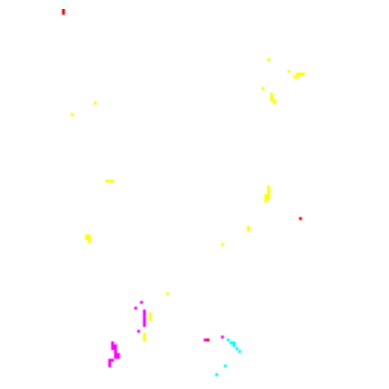

Processing image 1330/1511


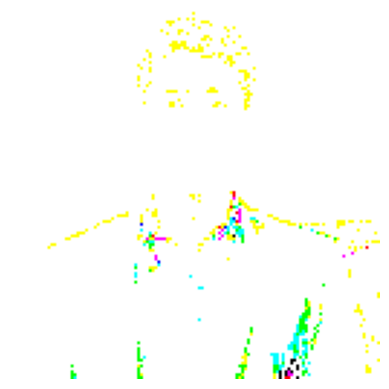

Processing image 1331/1511


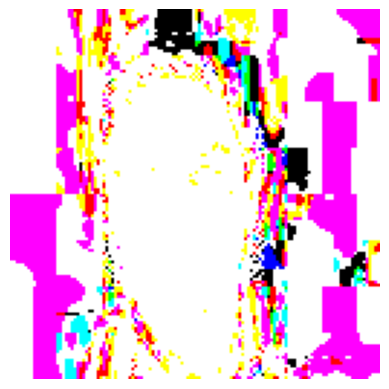

Processing image 1332/1511


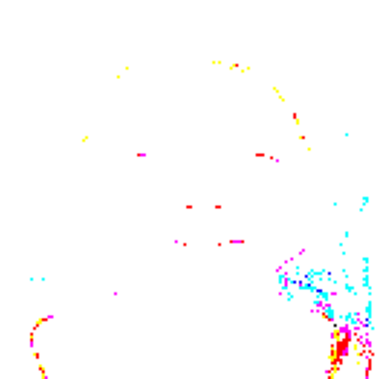

Processing image 1333/1511


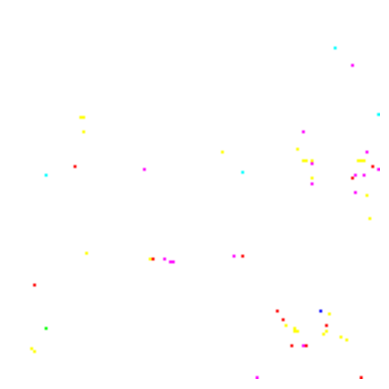

Processing image 1334/1511


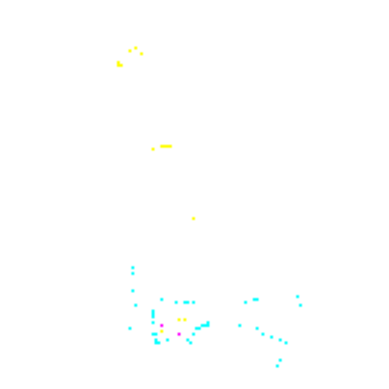

Processing image 1335/1511


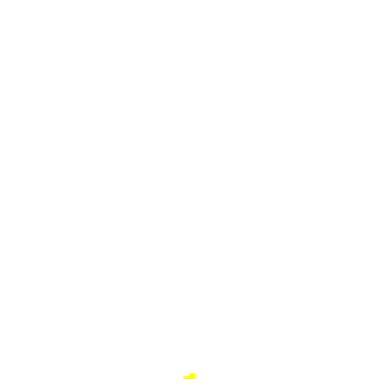

Processing image 1336/1511


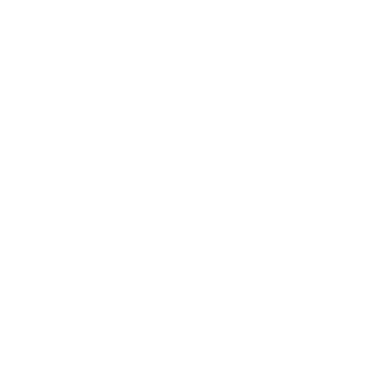

Processing image 1337/1511


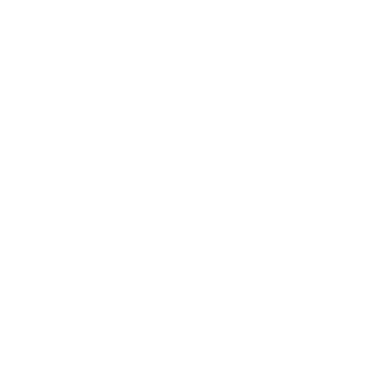

Processing image 1338/1511


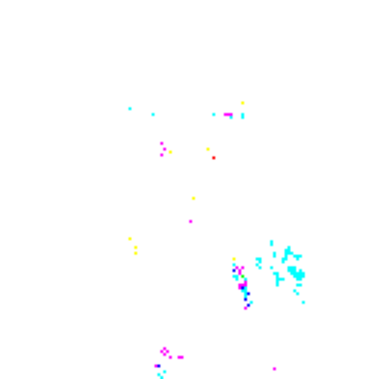

Processing image 1339/1511


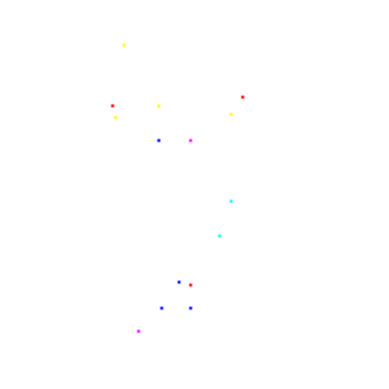

Processing image 1340/1511


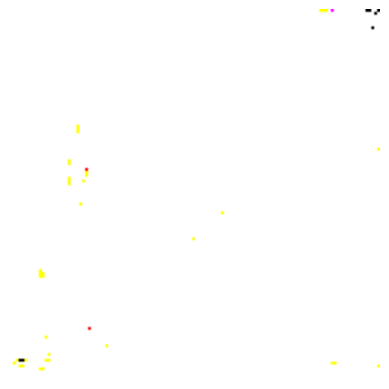

Processing image 1341/1511


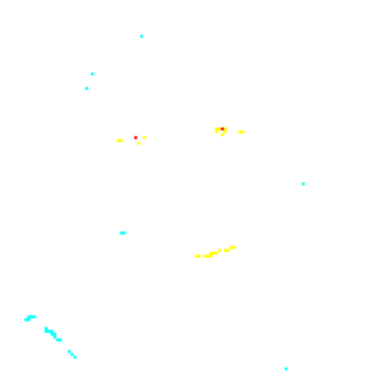

Processing image 1342/1511


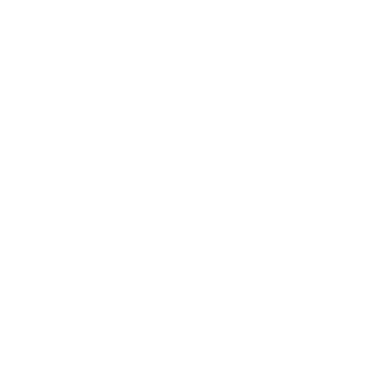

Processing image 1343/1511


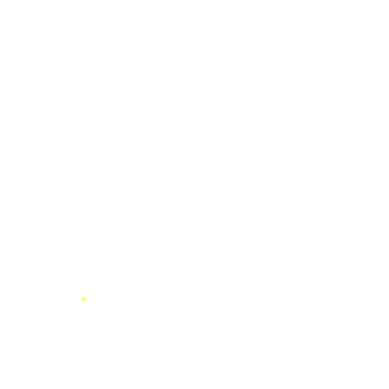

Processing image 1344/1511


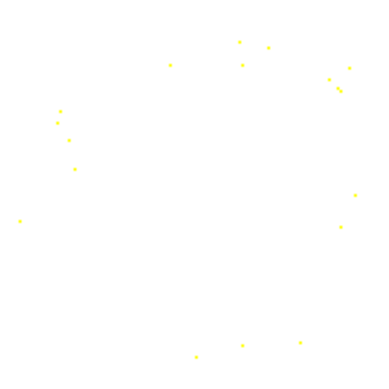

Processing image 1345/1511


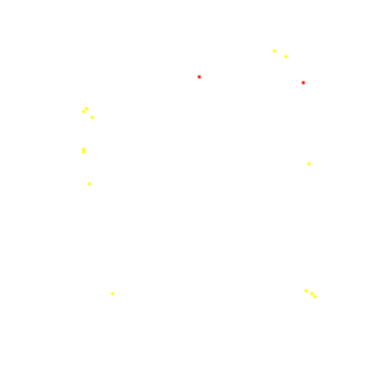

Processing image 1346/1511


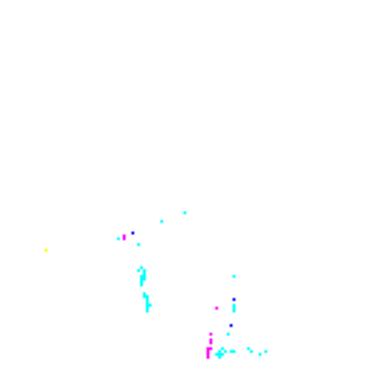

Processing image 1347/1511


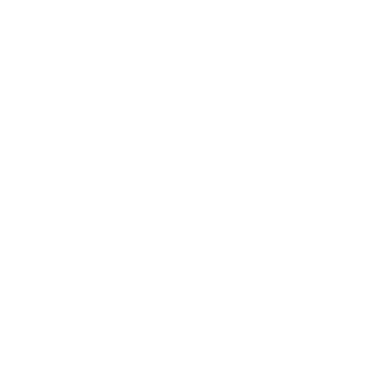

Processing image 1348/1511


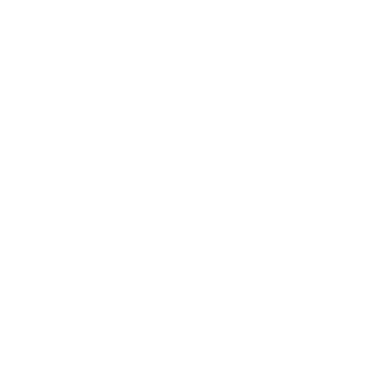

Processing image 1349/1511


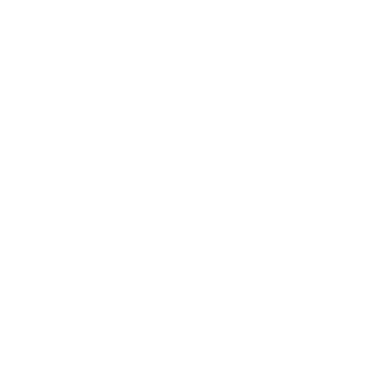

Processing image 1350/1511


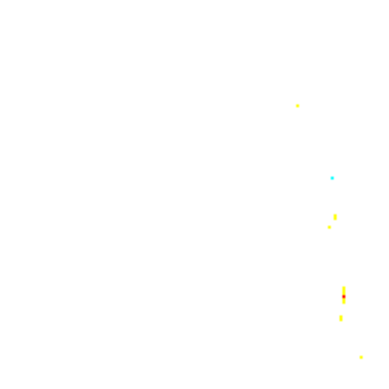

Processing image 1351/1511


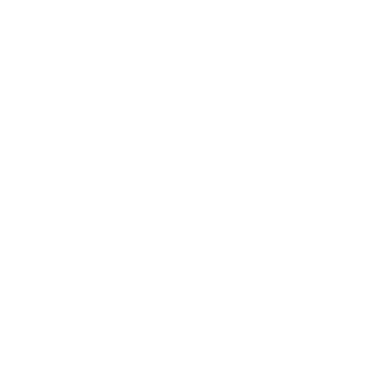

Processing image 1352/1511


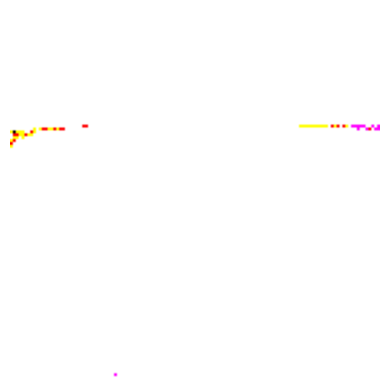

Processing image 1353/1511


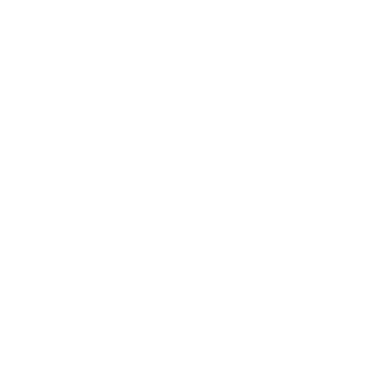

Processing image 1354/1511


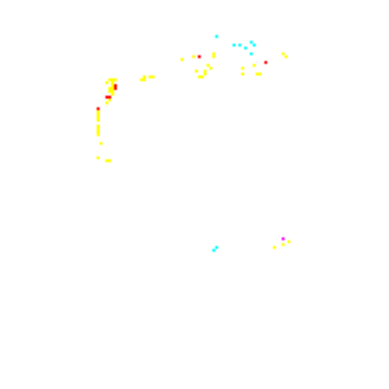

Processing image 1355/1511


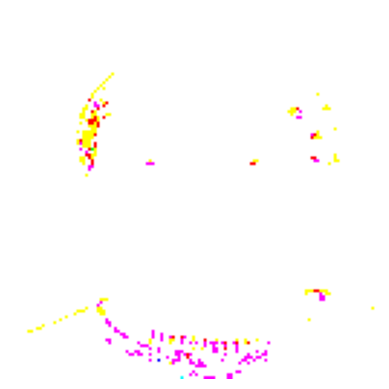

Processing image 1356/1511


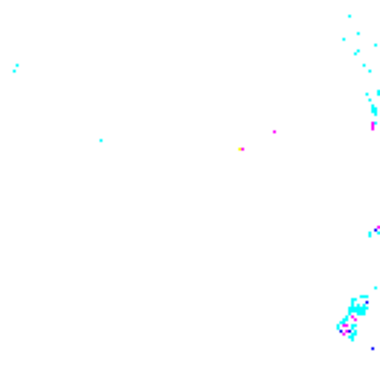

Processing image 1357/1511


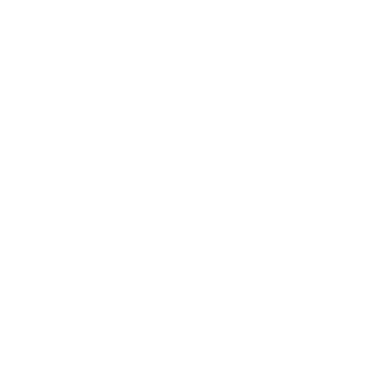

Processing image 1358/1511


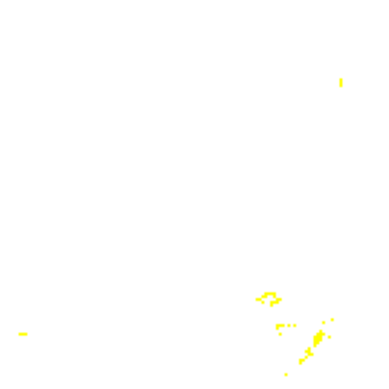

Processing image 1359/1511


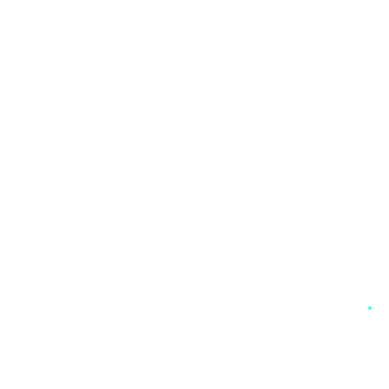

Processing image 1360/1511


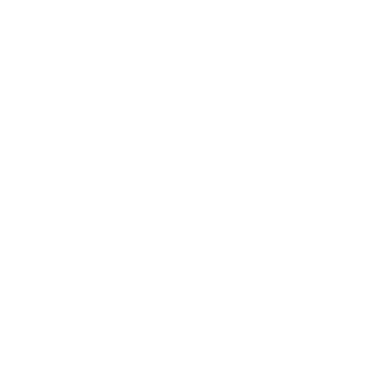

Processing image 1361/1511


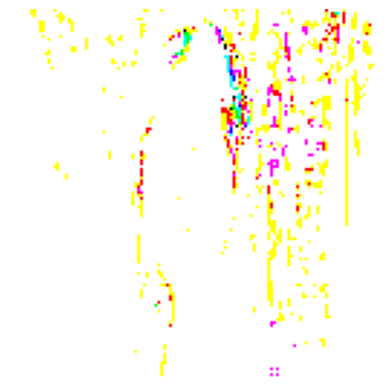

Processing image 1362/1511


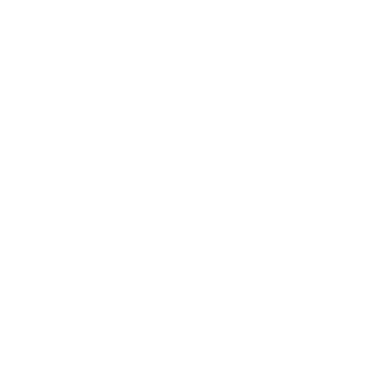

Processing image 1363/1511


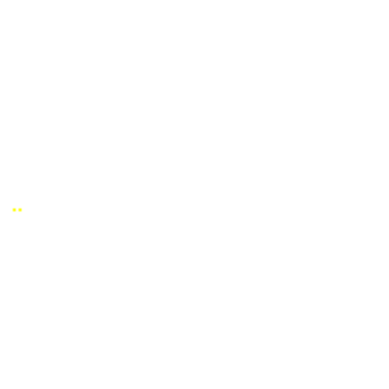

Processing image 1364/1511


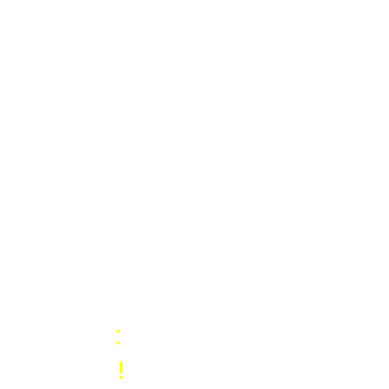

Processing image 1365/1511


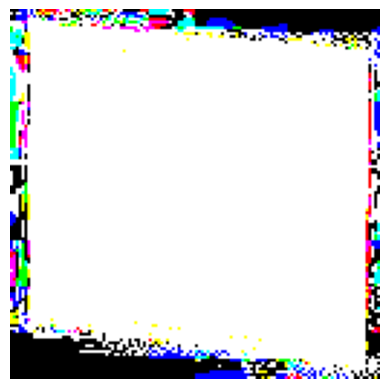

Processing image 1366/1511


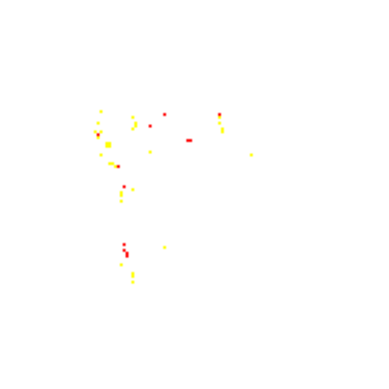

Processing image 1367/1511


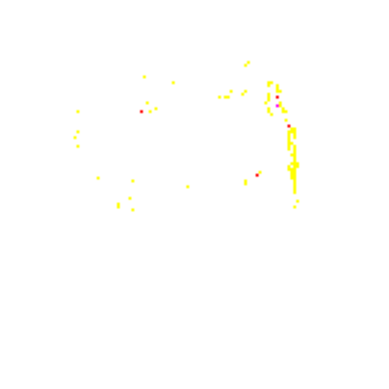

Processing image 1368/1511


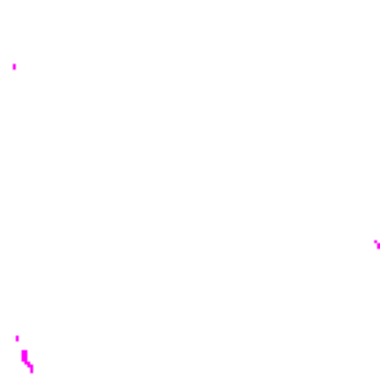

Processing image 1369/1511


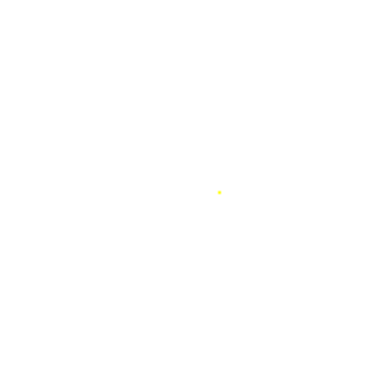

Processing image 1370/1511


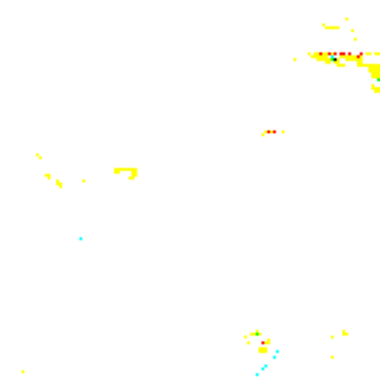

Processing image 1371/1511


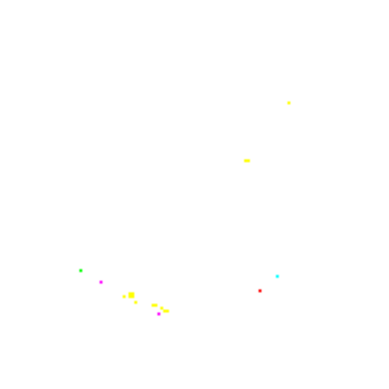

Processing image 1372/1511


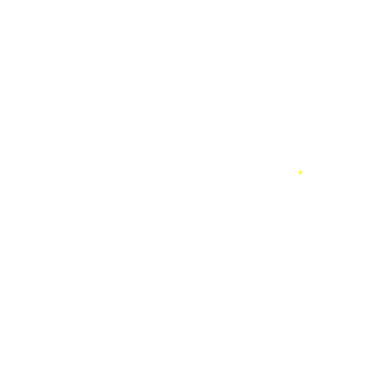

Processing image 1373/1511


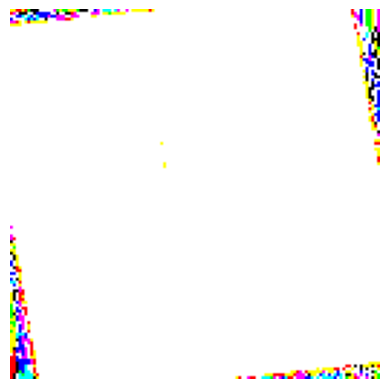

Processing image 1374/1511


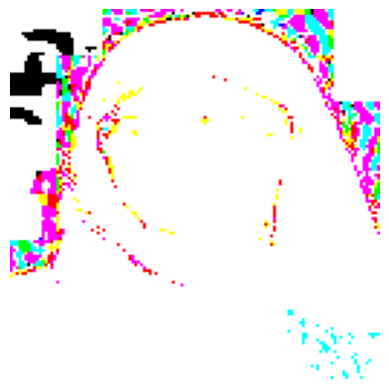

Processing image 1375/1511


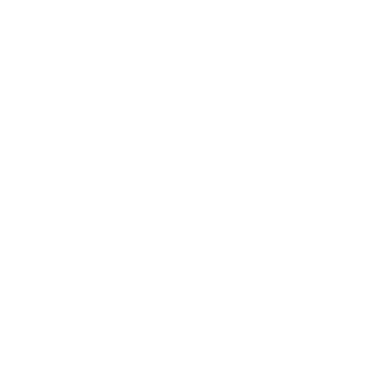

Processing image 1376/1511


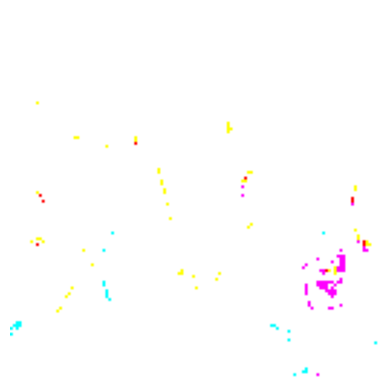

Processing image 1377/1511


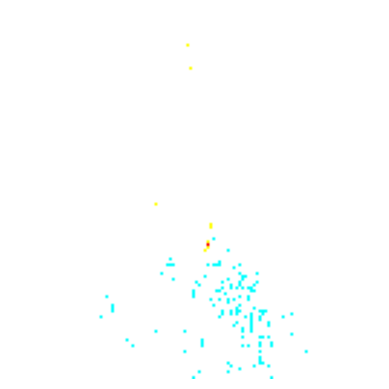

Processing image 1378/1511


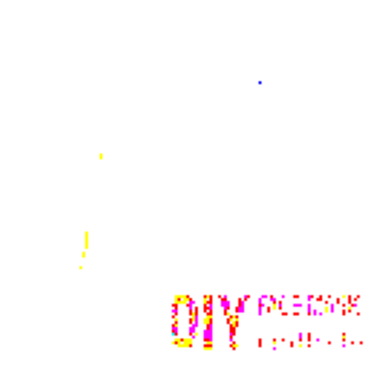

Processing image 1379/1511


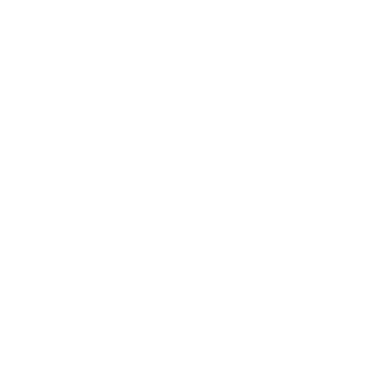

Processing image 1380/1511


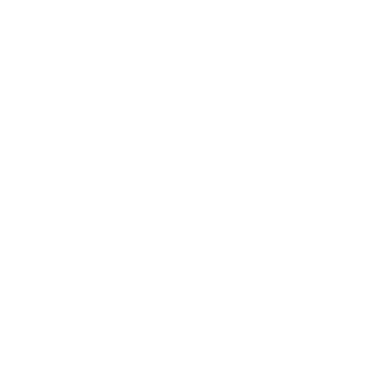

Processing image 1381/1511


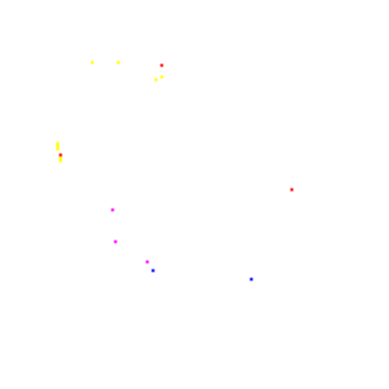

Processing image 1382/1511


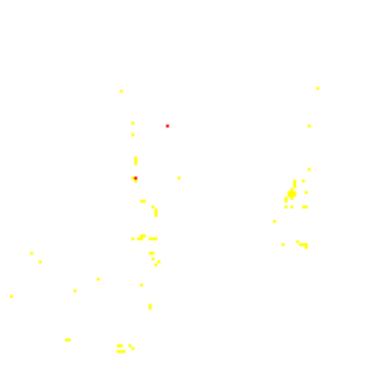

Processing image 1383/1511


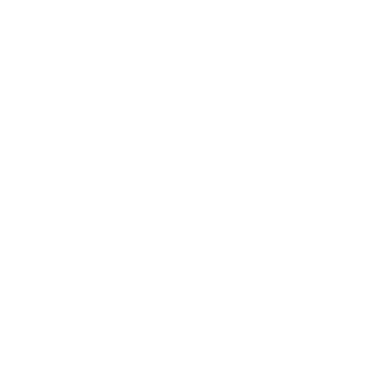

Processing image 1384/1511


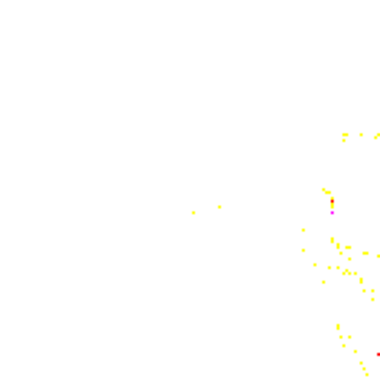

Processing image 1385/1511


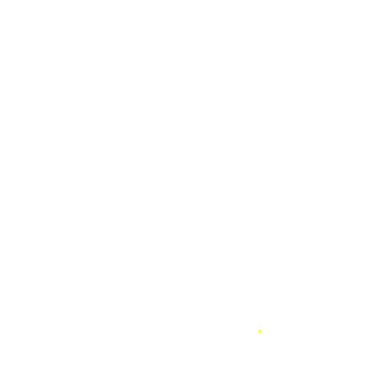

Processing image 1386/1511


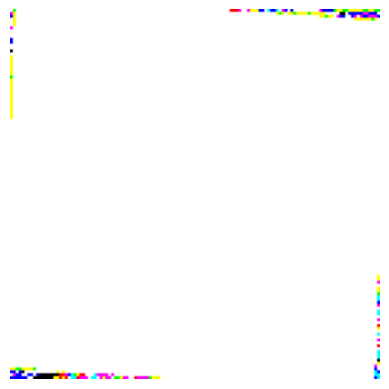

Processing image 1387/1511


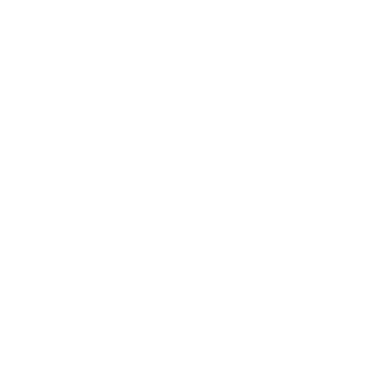

Processing image 1388/1511


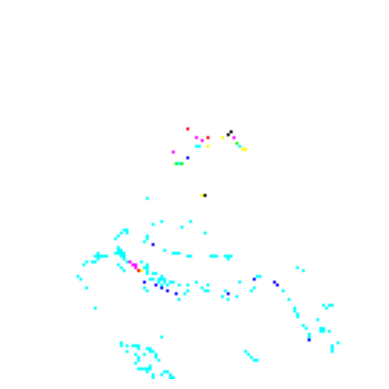

Processing image 1389/1511


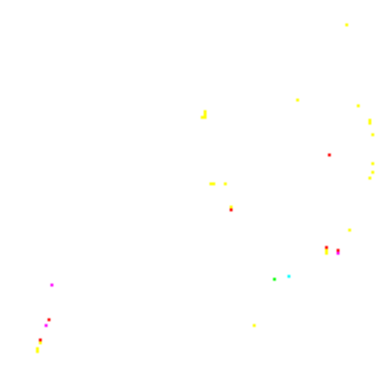

Processing image 1390/1511


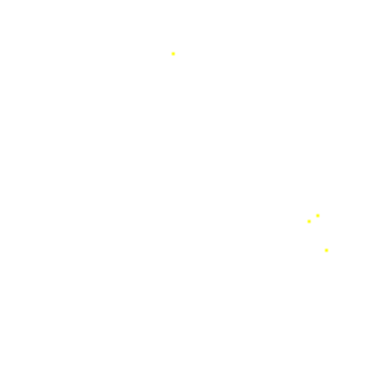

Processing image 1391/1511


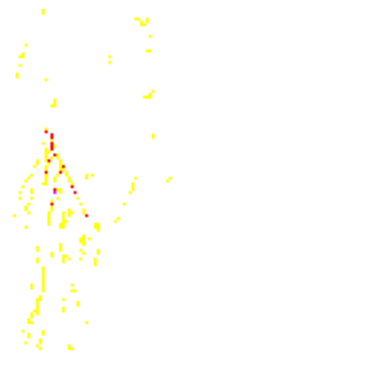

Processing image 1392/1511


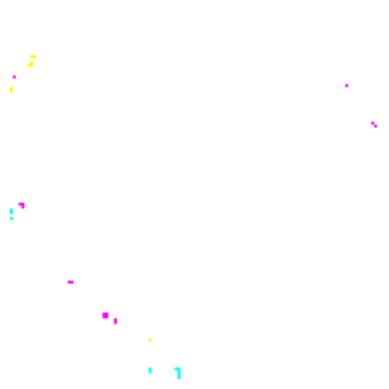

Processing image 1393/1511


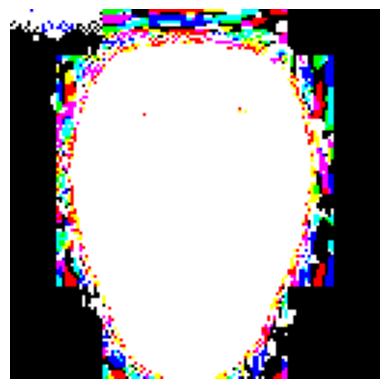

Processing image 1394/1511


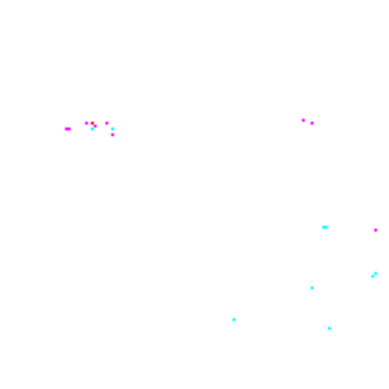

Processing image 1395/1511


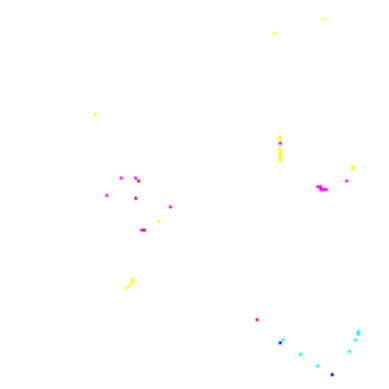

Processing image 1396/1511


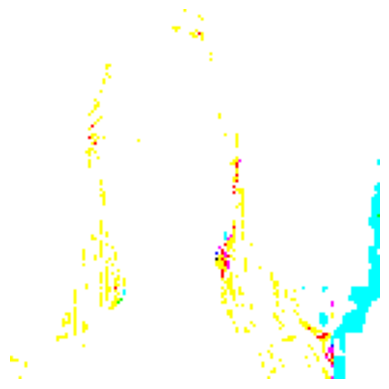

Processing image 1397/1511


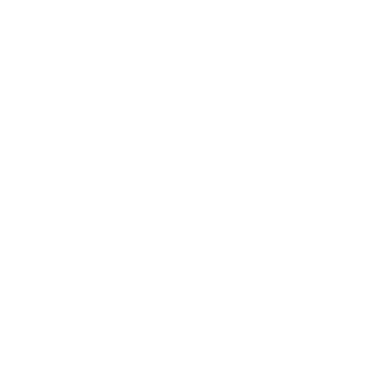

Processing image 1398/1511


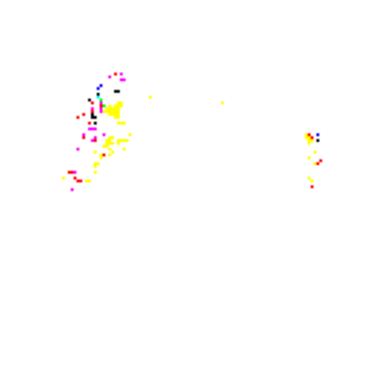

Processing image 1399/1511


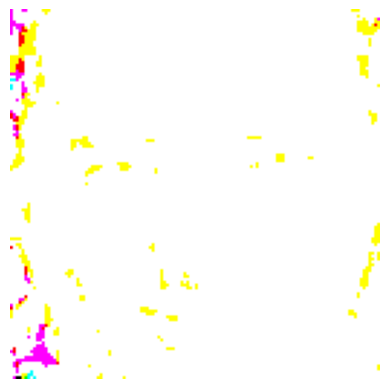

Processing image 1400/1511


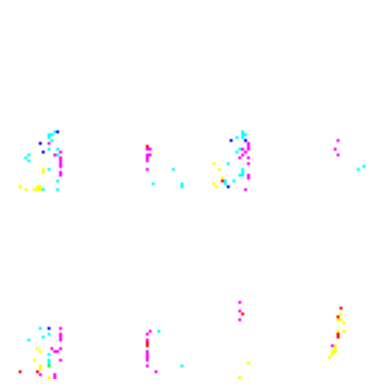

Processing image 1401/1511


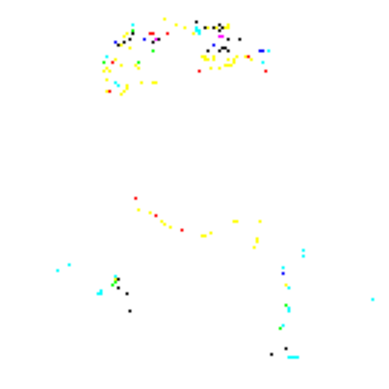

Processing image 1402/1511


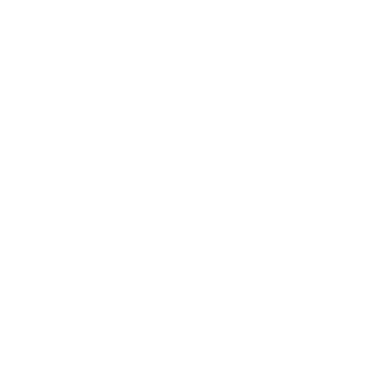

Processing image 1403/1511


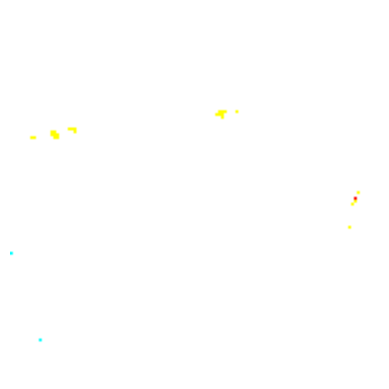

Processing image 1404/1511


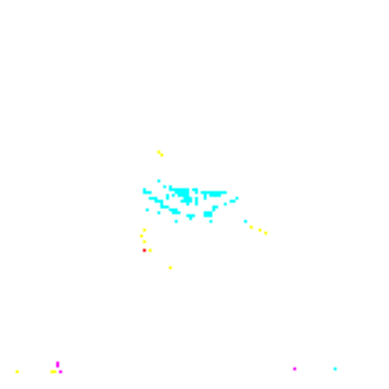

Processing image 1405/1511


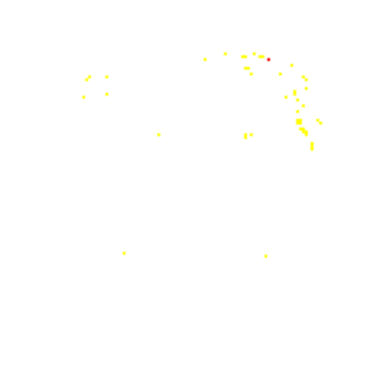

Processing image 1406/1511


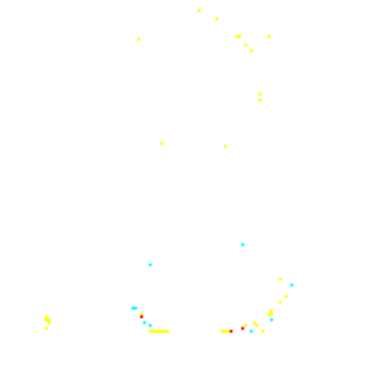

Processing image 1407/1511


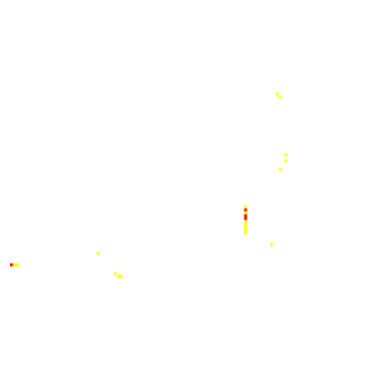

Processing image 1408/1511


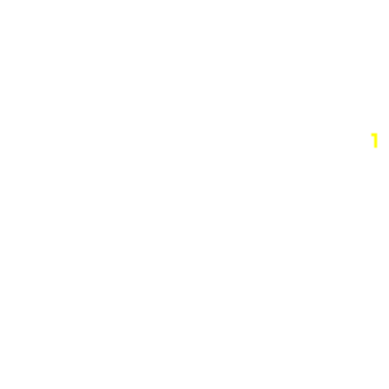

Processing image 1409/1511


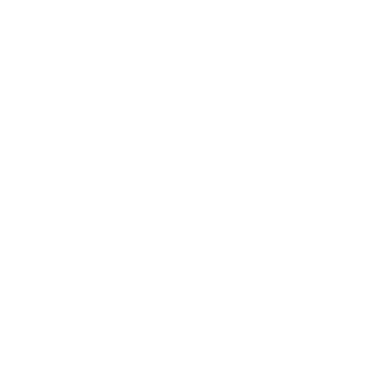

Processing image 1410/1511


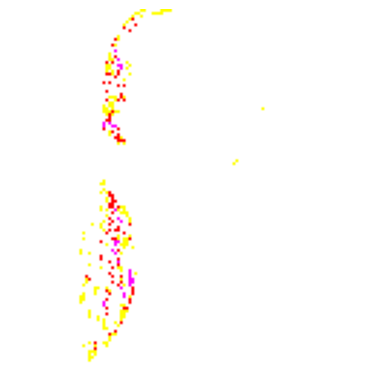

Processing image 1411/1511


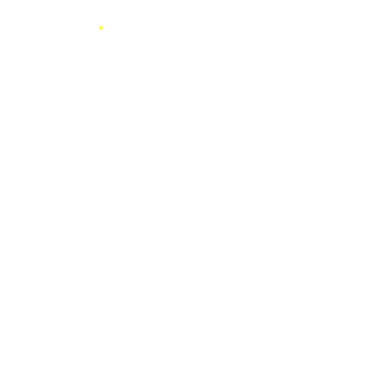

Processing image 1412/1511


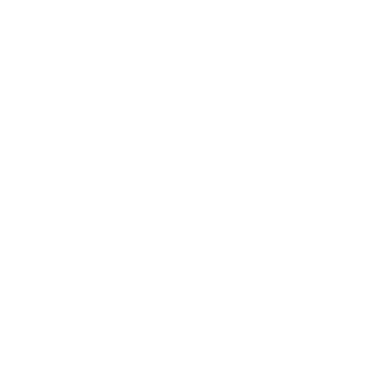

Processing image 1413/1511


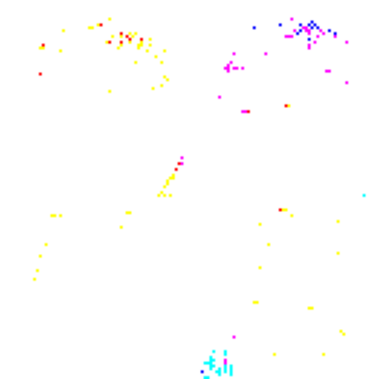

Processing image 1414/1511


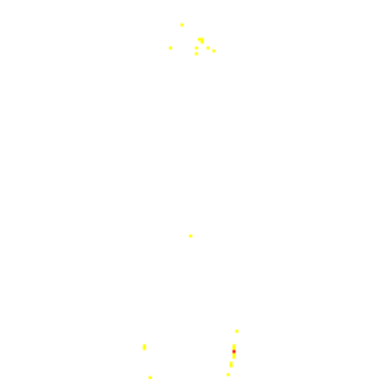

Processing image 1415/1511


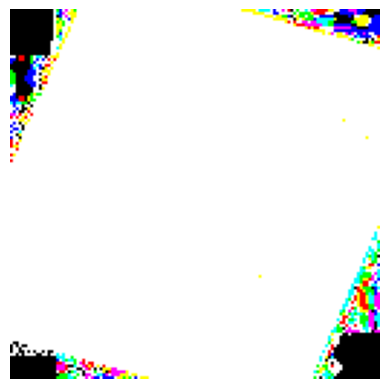

Processing image 1416/1511


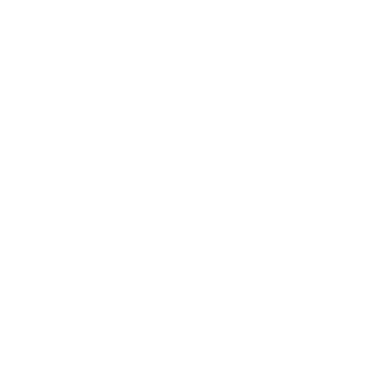

Processing image 1417/1511


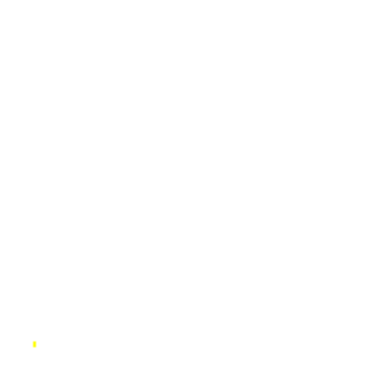

Processing image 1418/1511


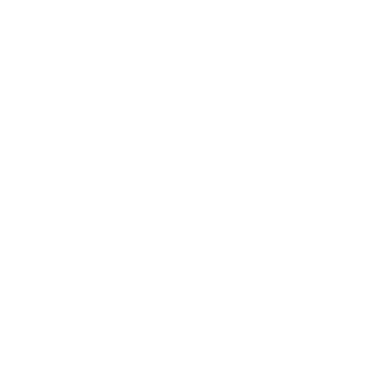

Processing image 1419/1511


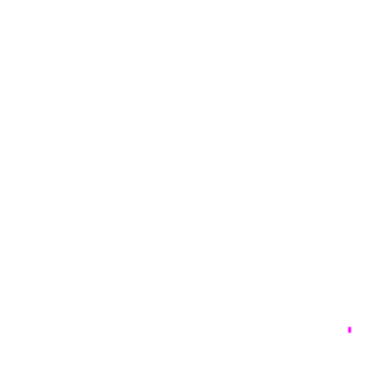

Processing image 1420/1511


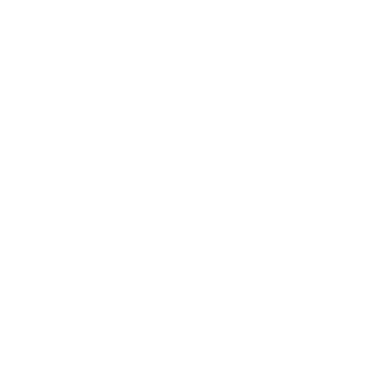

Processing image 1421/1511


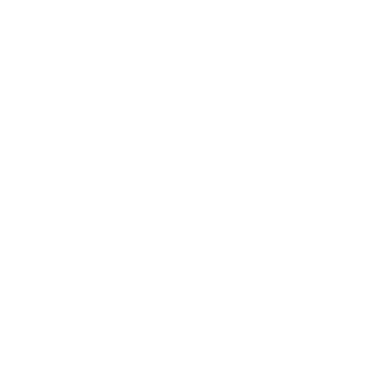

Processing image 1422/1511


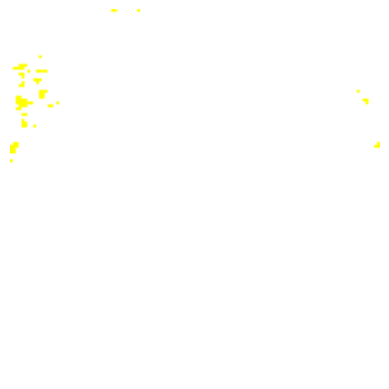

Processing image 1423/1511


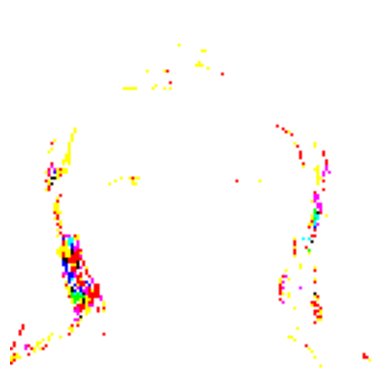

Processing image 1424/1511


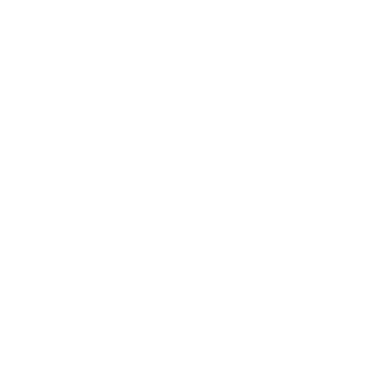

Processing image 1425/1511


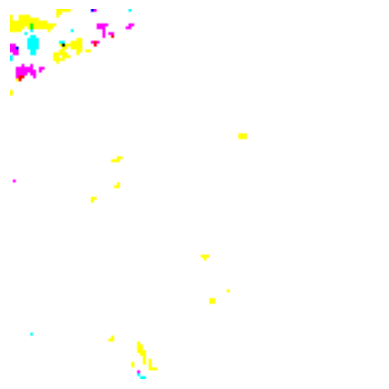

Processing image 1426/1511


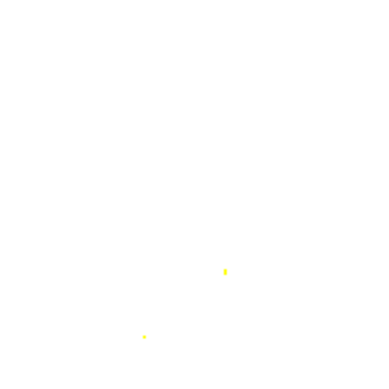

Processing image 1427/1511


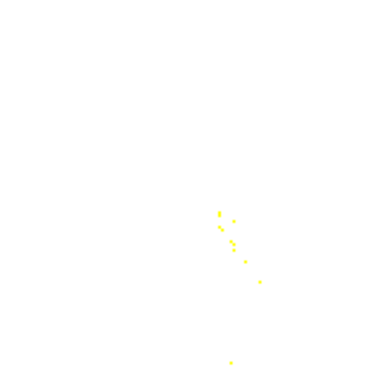

Processing image 1428/1511


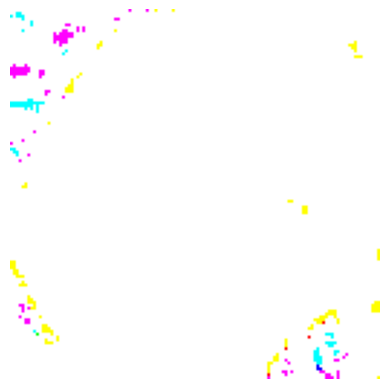

Processing image 1429/1511


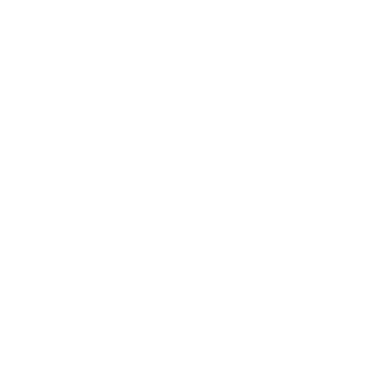

Processing image 1430/1511


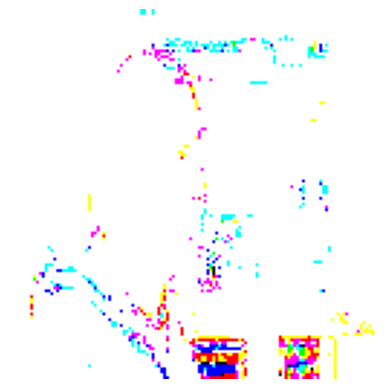

Processing image 1431/1511


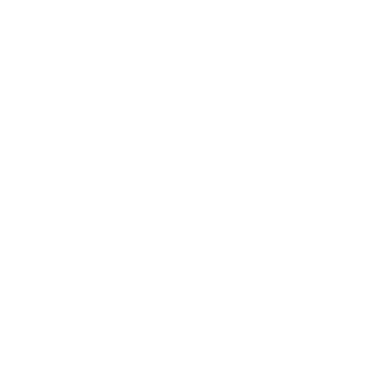

Processing image 1432/1511


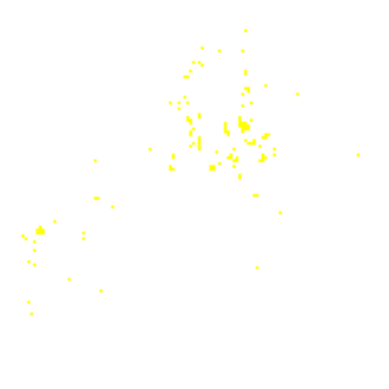

Processing image 1433/1511


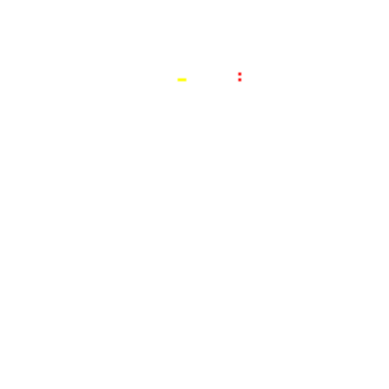

Processing image 1434/1511


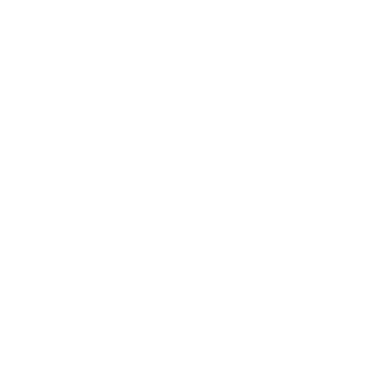

Processing image 1435/1511


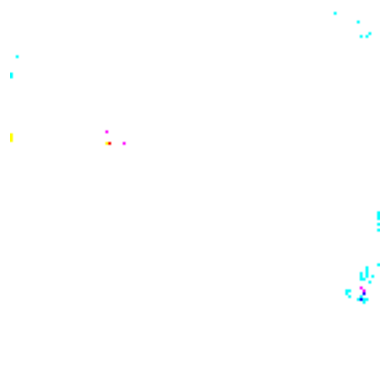

Processing image 1436/1511


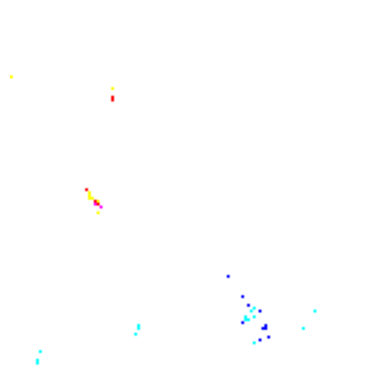

Processing image 1437/1511


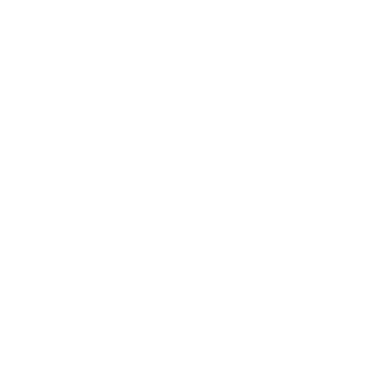

Processing image 1438/1511


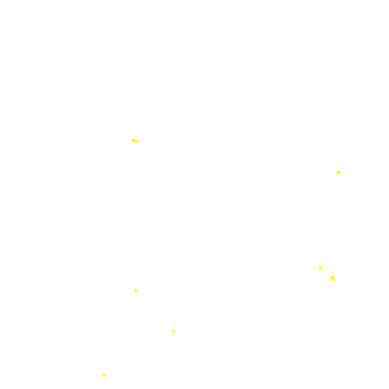

Processing image 1439/1511


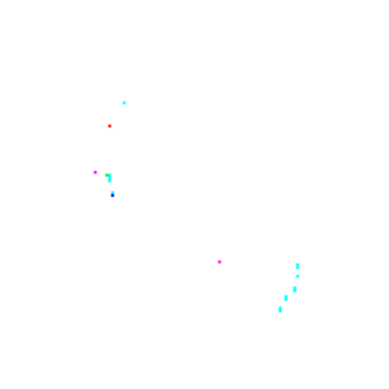

Processing image 1440/1511


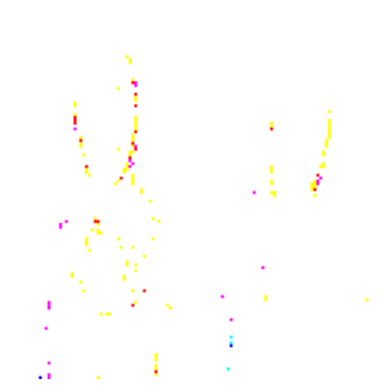

Processing image 1441/1511


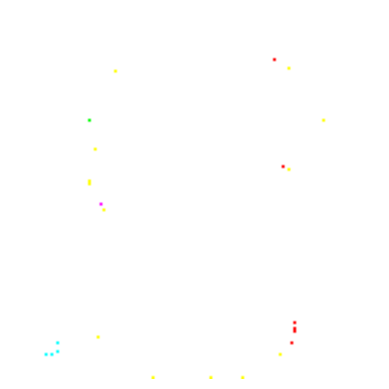

Processing image 1442/1511


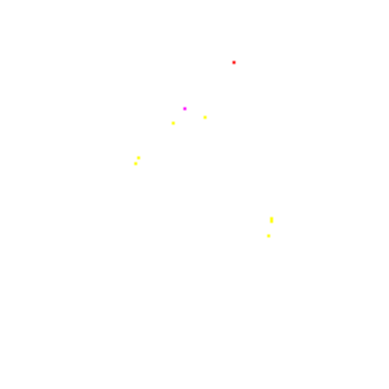

Processing image 1443/1511


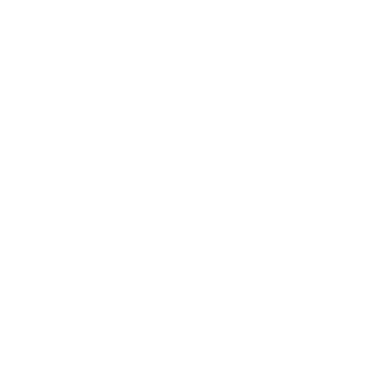

Processing image 1444/1511


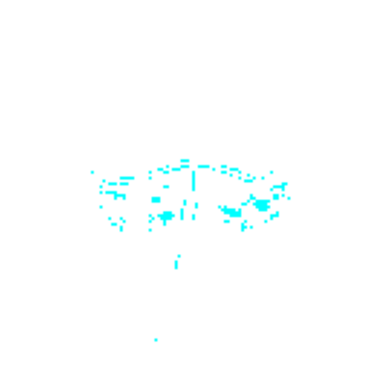

Processing image 1445/1511


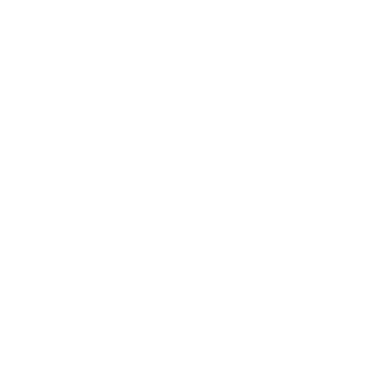

Processing image 1446/1511


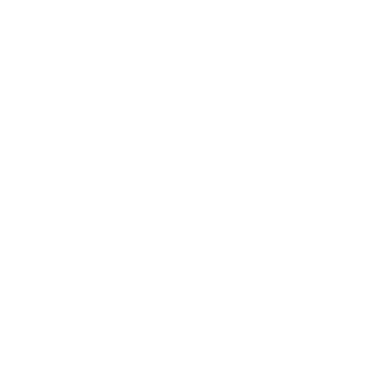

Processing image 1447/1511


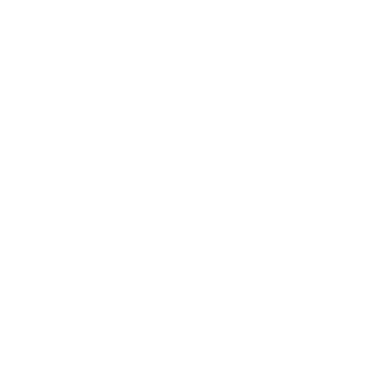

Processing image 1448/1511


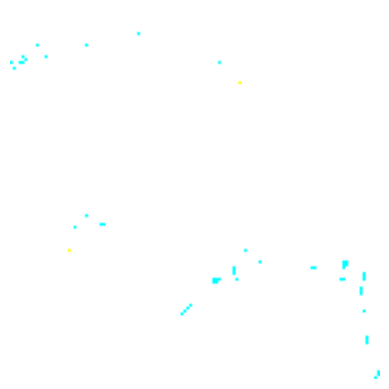

Processing image 1449/1511


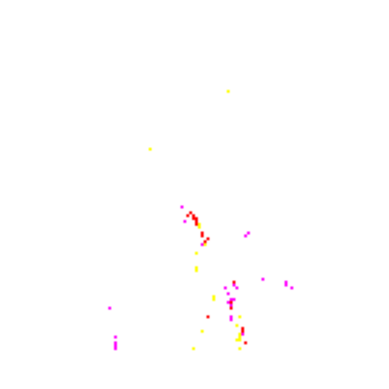

Processing image 1450/1511


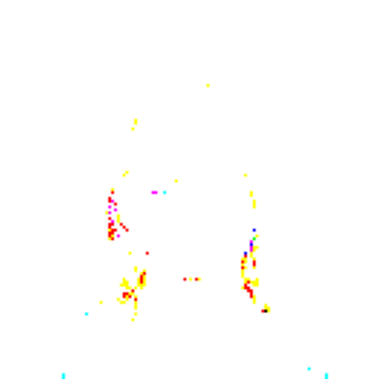

Processing image 1451/1511


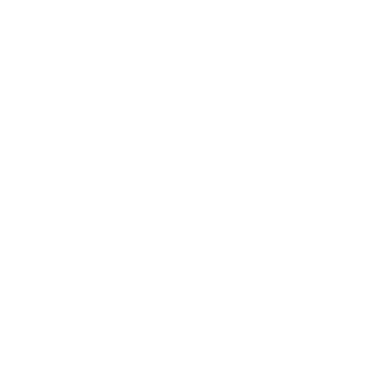

Processing image 1452/1511


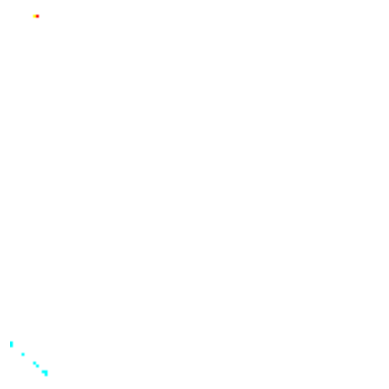

Processing image 1453/1511


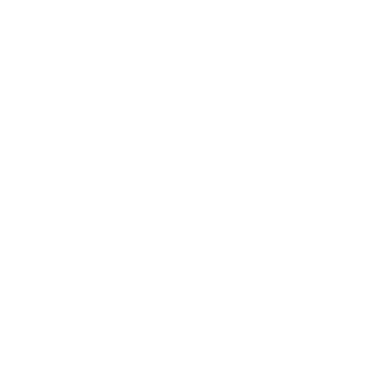

Processing image 1454/1511


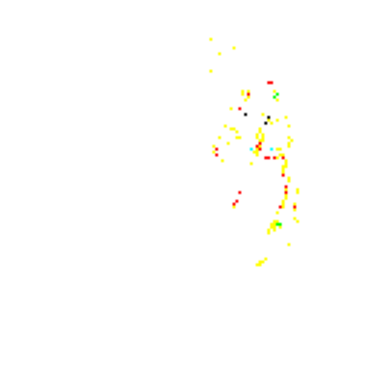

Processing image 1455/1511


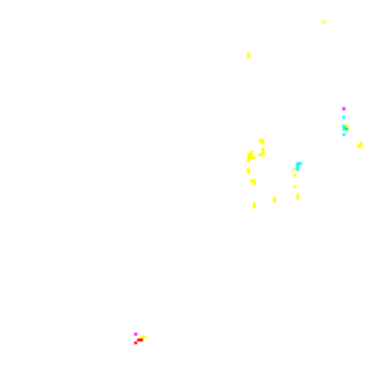

Processing image 1456/1511


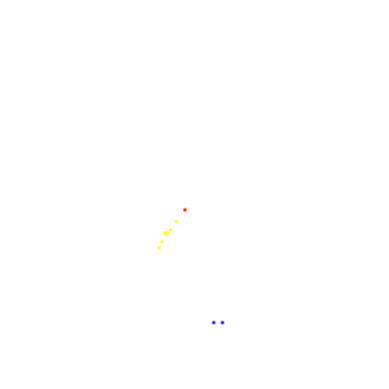

Processing image 1457/1511


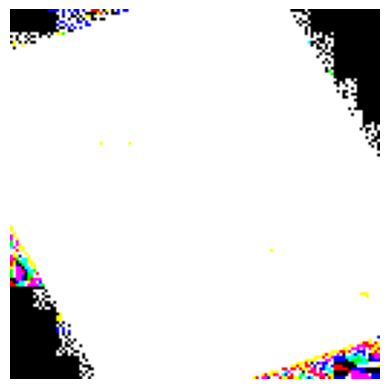

Processing image 1458/1511


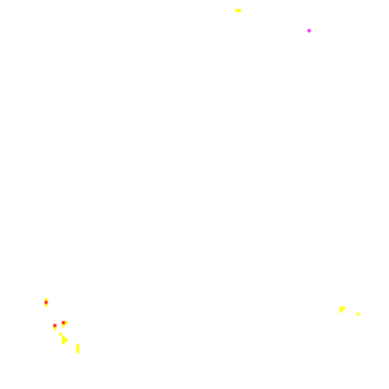

Processing image 1459/1511


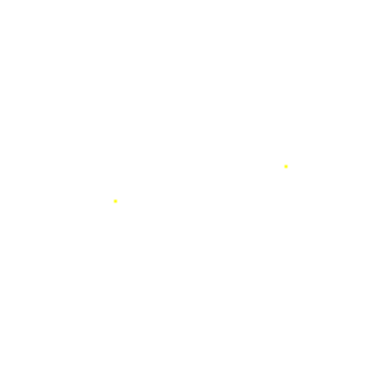

Processing image 1460/1511


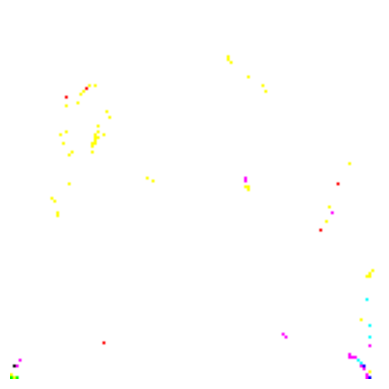

Processing image 1461/1511


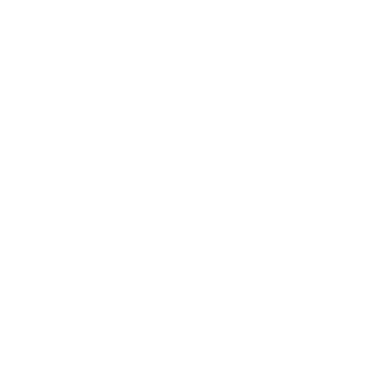

Processing image 1462/1511


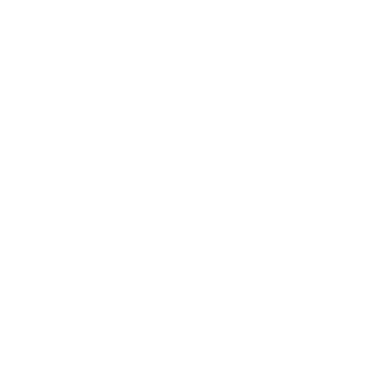

Processing image 1463/1511


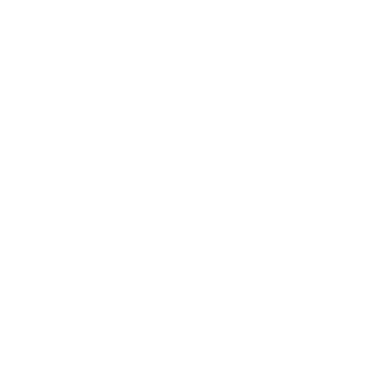

Processing image 1464/1511


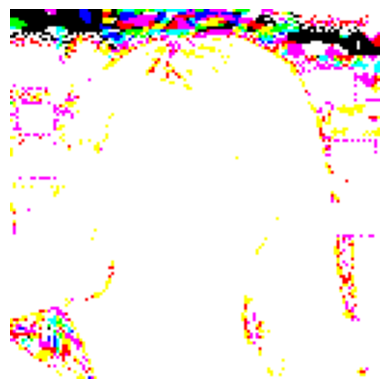

Processing image 1465/1511


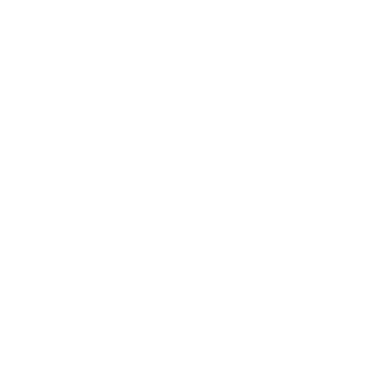

Processing image 1466/1511


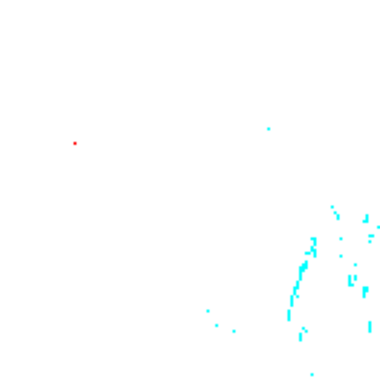

Processing image 1467/1511


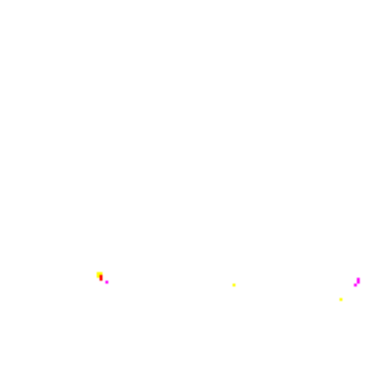

Processing image 1468/1511


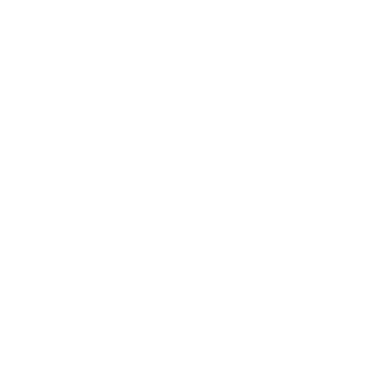

Processing image 1469/1511


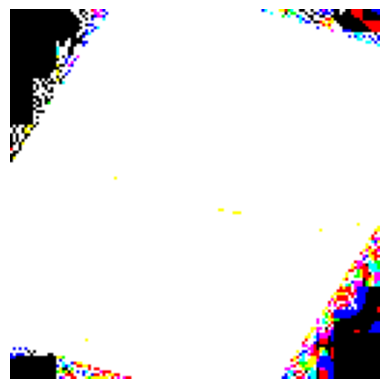

Processing image 1470/1511


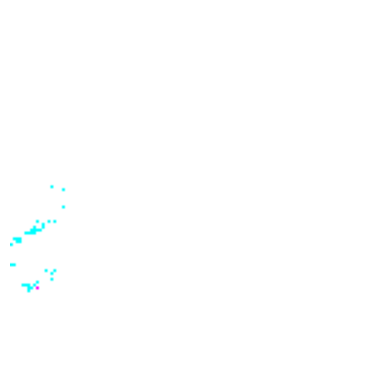

Processing image 1471/1511


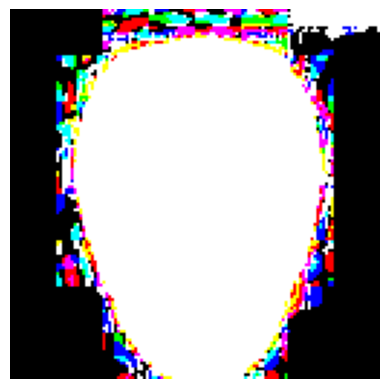

Processing image 1472/1511


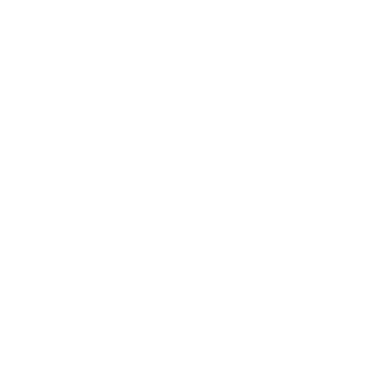

Processing image 1473/1511


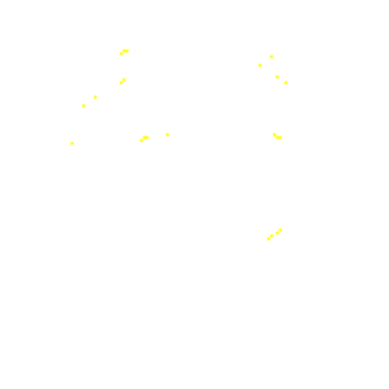

Processing image 1474/1511


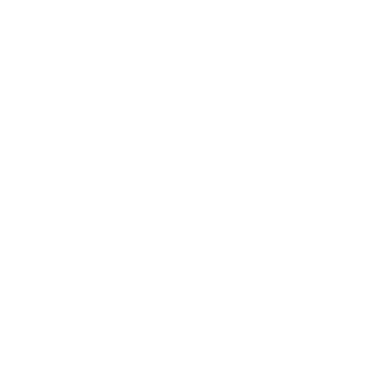

Processing image 1475/1511


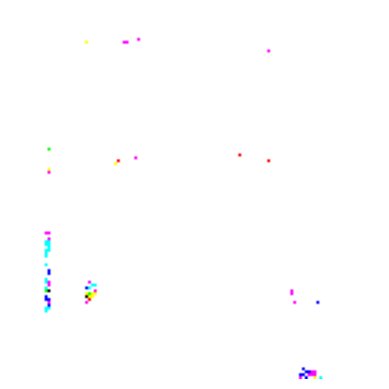

Processing image 1476/1511


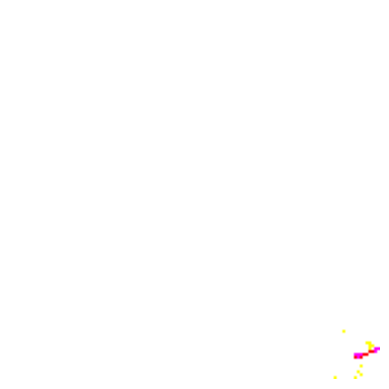

Processing image 1477/1511


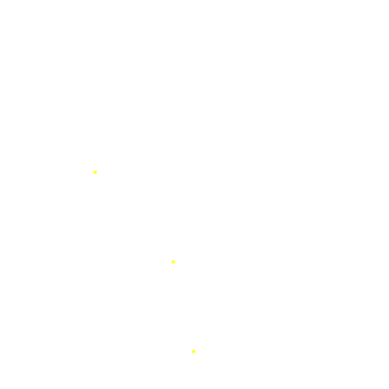

Processing image 1478/1511


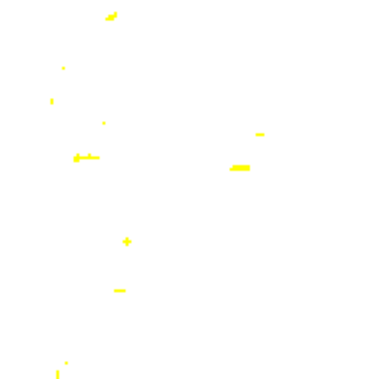

Processing image 1479/1511


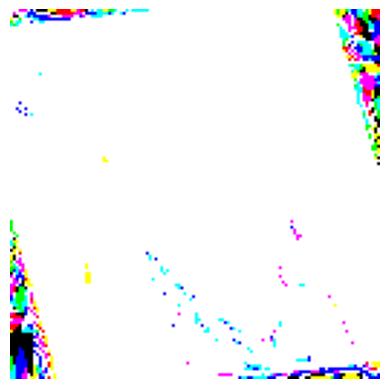

Processing image 1480/1511


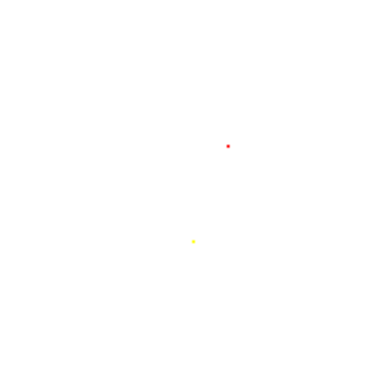

Processing image 1481/1511


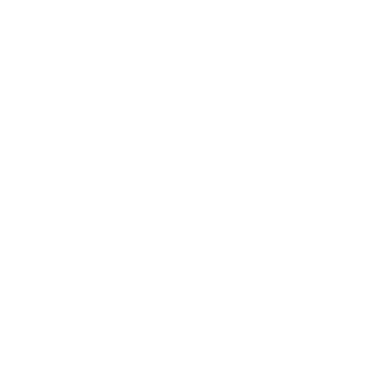

Processing image 1482/1511


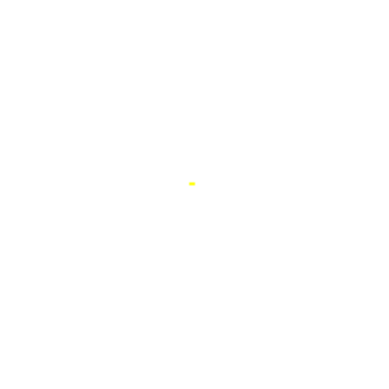

Processing image 1483/1511


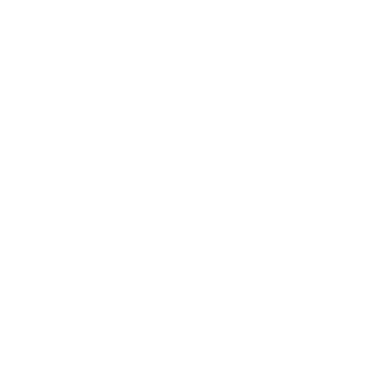

Processing image 1484/1511


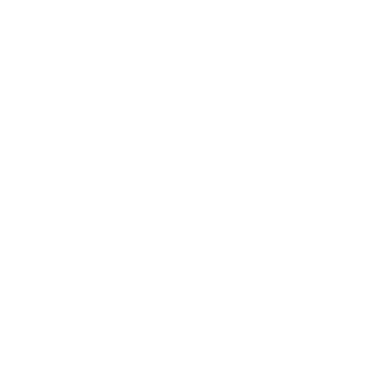

Processing image 1485/1511


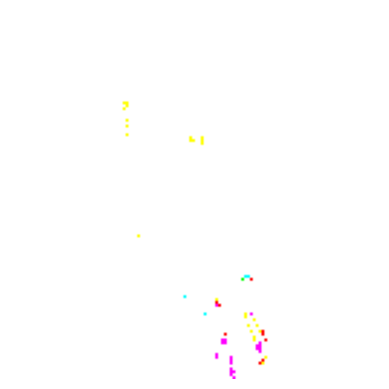

Processing image 1486/1511


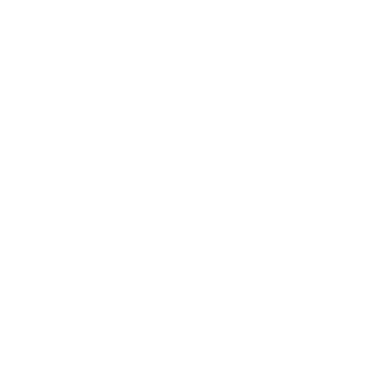

Processing image 1487/1511


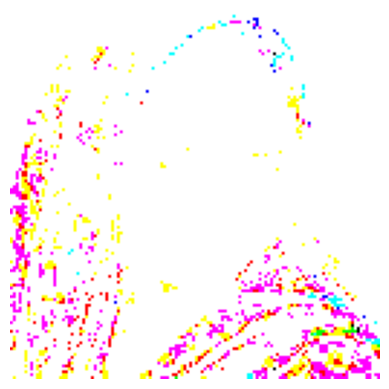

Processing image 1488/1511


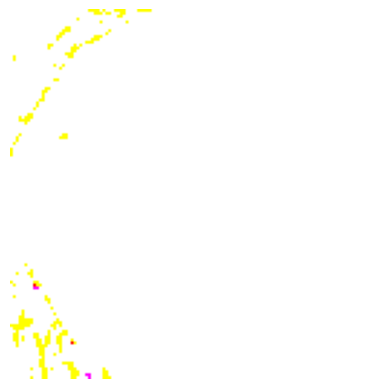

Processing image 1489/1511


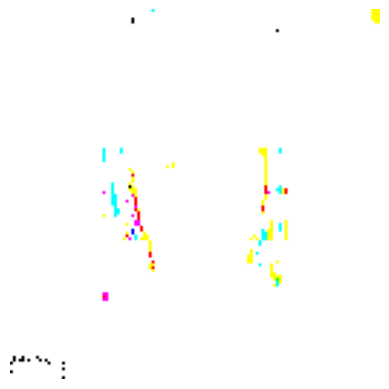

Processing image 1490/1511


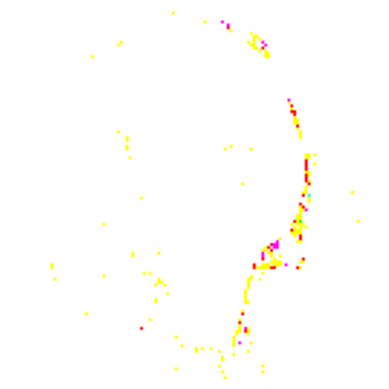

Processing image 1491/1511


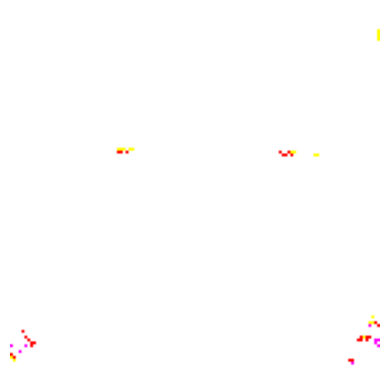

Processing image 1492/1511


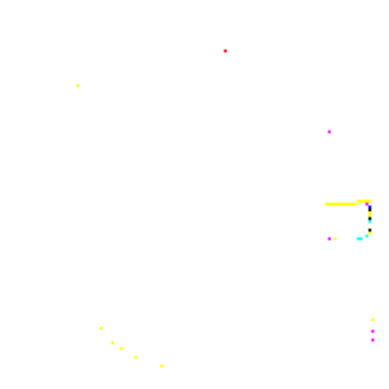

Processing image 1493/1511


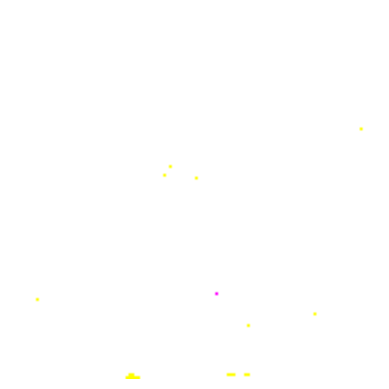

Processing image 1494/1511


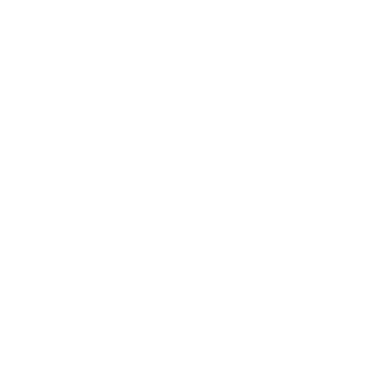

Processing image 1495/1511


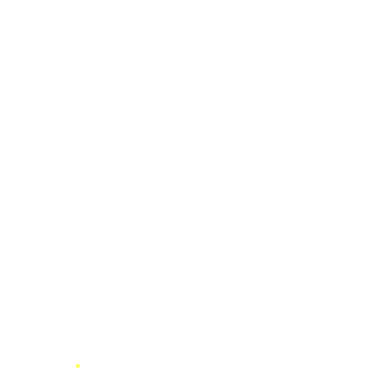

Processing image 1496/1511


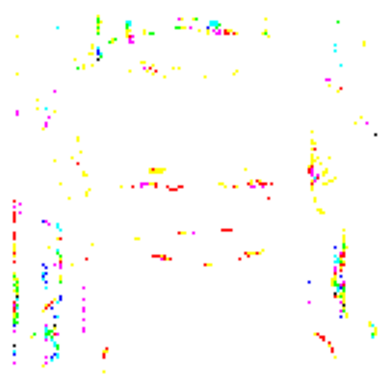

Processing image 1497/1511


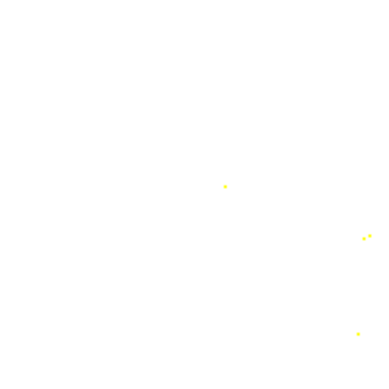

Processing image 1498/1511


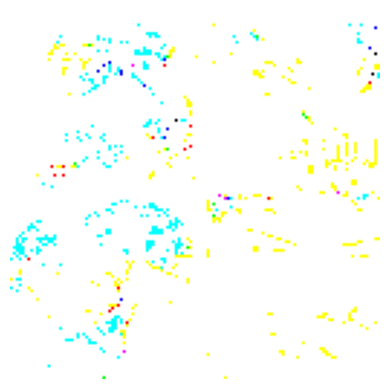

Processing image 1499/1511


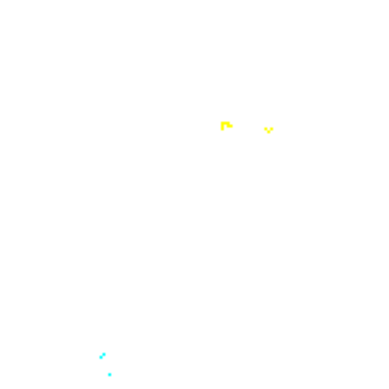

Processing image 1500/1511


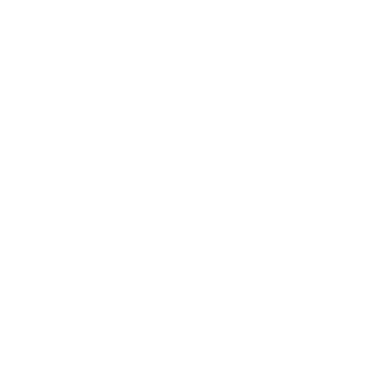

Processing image 1501/1511


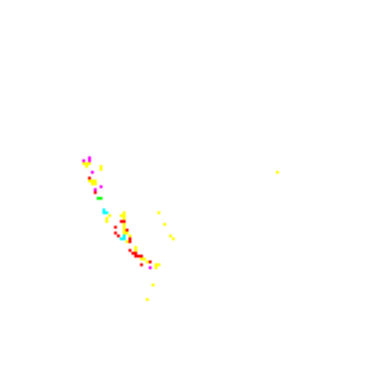

Processing image 1502/1511


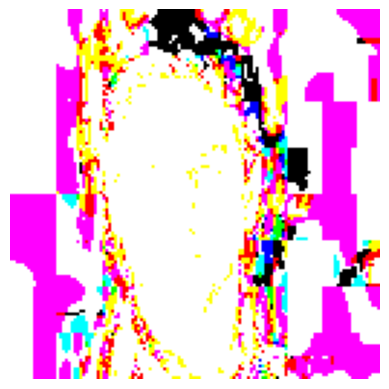

Processing image 1503/1511


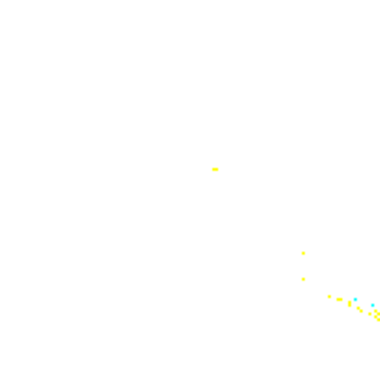

Processing image 1504/1511


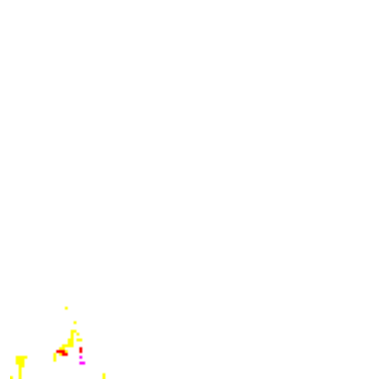

Processing image 1505/1511


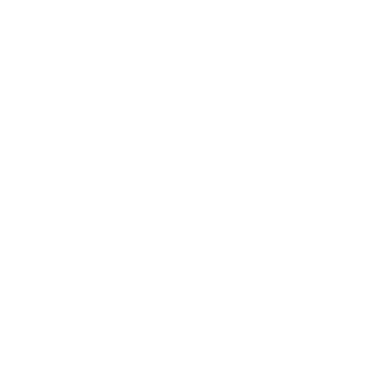

Processing image 1506/1511


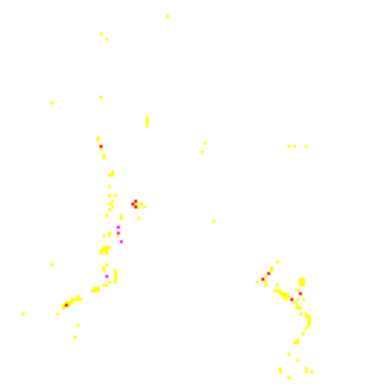

Processing image 1507/1511


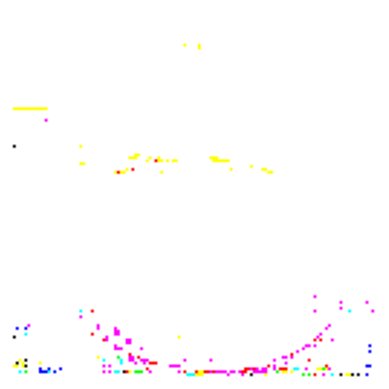

Processing image 1508/1511


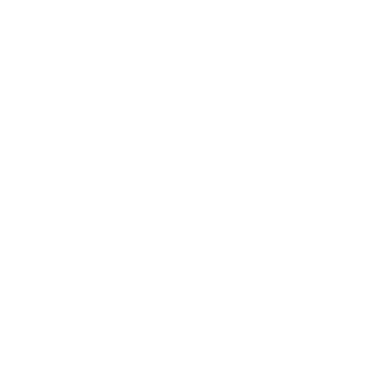

Processing image 1509/1511


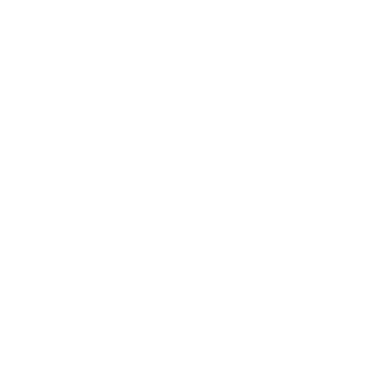

Processing image 1510/1511


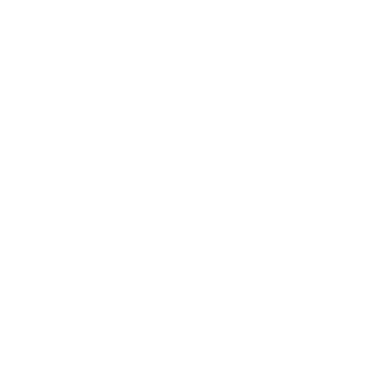

Processing image 1511/1511


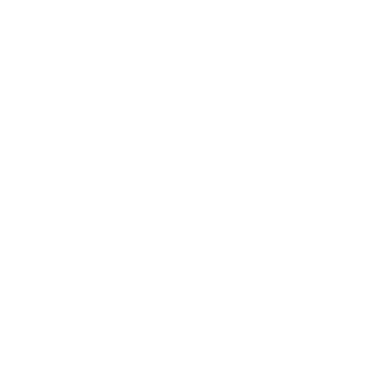

In [43]:
# Define the sliding window parameters
step_size = 50  # Adjust as needed
window_size = (128, 128)  # Adjust as needed

# Iterate over the images in X_test
for idx, image in enumerate(X_test):
    print(f"Processing image {idx + 1}/{len(X_test)}")
    # Iterate over the image using sliding window approach
    for y in range(0, image.shape[0] - window_size[0] + 1, step_size):
        for x in range(0, image.shape[1] - window_size[1] + 1, step_size):
            # Extract the window from the image
            window = image[y:y + window_size[0], x:x + window_size[1]]

            # Perform object detection on the window (you need to implement this part)
            # Here, you can use your trained ResNet50 model to predict objects in the window

            # Visualize the window with detected objects (for demonstration)
            plt.imshow(window)
            plt.axis('off')
            plt.show()


2. RESNET50 MODEL2 --> WITH ALL LAYERS TRAINED

In [54]:
print(len(resnet_base.layers))

175


In [55]:
for layer in resnet_base.layers:
    layer.trainable = True

In [56]:
for layer in resnet_base.layers:
    print(layer.name, layer.trainable)

input_1 True
conv1_pad True
conv1_conv True
conv1_bn True
conv1_relu True
pool1_pad True
pool1_pool True
conv2_block1_1_conv True
conv2_block1_1_bn True
conv2_block1_1_relu True
conv2_block1_2_conv True
conv2_block1_2_bn True
conv2_block1_2_relu True
conv2_block1_0_conv True
conv2_block1_3_conv True
conv2_block1_0_bn True
conv2_block1_3_bn True
conv2_block1_add True
conv2_block1_out True
conv2_block2_1_conv True
conv2_block2_1_bn True
conv2_block2_1_relu True
conv2_block2_2_conv True
conv2_block2_2_bn True
conv2_block2_2_relu True
conv2_block2_3_conv True
conv2_block2_3_bn True
conv2_block2_add True
conv2_block2_out True
conv2_block3_1_conv True
conv2_block3_1_bn True
conv2_block3_1_relu True
conv2_block3_2_conv True
conv2_block3_2_bn True
conv2_block3_2_relu True
conv2_block3_3_conv True
conv2_block3_3_bn True
conv2_block3_add True
conv2_block3_out True
conv3_block1_1_conv True
conv3_block1_1_bn True
conv3_block1_1_relu True
conv3_block1_2_conv True
conv3_block1_2_bn True
conv3_block1

In [57]:
x = Flatten()(resnet_base.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu')(x)

output = Dense(1, activation='sigmoid')(x)

In [58]:
model2 = Model(inputs=resnet_base.input, outputs=output)

In [59]:
from keras.losses import binary_crossentropy
# Compile model
model2.compile(optimizer=Adam(), loss=binary_crossentropy, metrics=['accuracy'])

In [64]:
filepath = r"C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2"
check_point = keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    monitor="val_loss",
    mode="min",
    save_best_only=True,
    verbose=1
)

In [65]:
early_stopping = EarlyStopping(
    monitor='val_loss',          # Monitor validation loss
    patience=3,                  # Number of epochs to wait before stopping
    restore_best_weights=True,   # Restore weights to the best achieved during training
    verbose=1                    # Print messages about early stopping
)

In [66]:
# Define a learning rate schedule function
def learningRate_schedule2(epoch):
    lr2 = 0.001  # Initial learning rate
    if epoch > 10:
        lr2 *= 0.1  # Decrease learning rate by a factor of 10 after 50 epochs
    return lr2

# Create a LearningRateScheduler callback
lr2_scheduler = LearningRateScheduler(learningRate_schedule2)



In [67]:
history2 = model2.fit(
    X_train, y_train_encoded,
    batch_size=32,
    epochs=20,
    verbose=1,
    validation_data=(X_test, y_test_encoded),  
    callbacks=[check_point, early_stopping, lr2_scheduler]
)

Epoch 1/20
189/189 [==============================] - ETA: 0s - loss: 0.4247 - accuracy: 0.8534
Epoch 1: val_loss improved from inf to 0.31009, saving model to C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


189/189 [==============================] - 686s 4s/step - loss: 0.4247 - accuracy: 0.8534 - val_loss: 0.3101 - val_accuracy: 0.8934 - lr: 0.0010
Epoch 2/20
189/189 [==============================] - ETA: 0s - loss: 0.2801 - accuracy: 0.8947
Epoch 2: val_loss improved from 0.31009 to 0.22858, saving model to C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


189/189 [==============================] - 356s 2s/step - loss: 0.2801 - accuracy: 0.8947 - val_loss: 0.2286 - val_accuracy: 0.9272 - lr: 0.0010
Epoch 3/20
189/189 [==============================] - ETA: 0s - loss: 0.1847 - accuracy: 0.9351
Epoch 3: val_loss improved from 0.22858 to 0.13253, saving model to C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


189/189 [==============================] - 366s 2s/step - loss: 0.1847 - accuracy: 0.9351 - val_loss: 0.1325 - val_accuracy: 0.9563 - lr: 0.0010
Epoch 4/20
189/189 [==============================] - ETA: 0s - loss: 0.1167 - accuracy: 0.9636
Epoch 4: val_loss improved from 0.13253 to 0.11819, saving model to C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


189/189 [==============================] - 360s 2s/step - loss: 0.1167 - accuracy: 0.9636 - val_loss: 0.1182 - val_accuracy: 0.9543 - lr: 0.0010
Epoch 5/20
189/189 [==============================] - ETA: 0s - loss: 0.0872 - accuracy: 0.9704
Epoch 5: val_loss improved from 0.11819 to 0.11325, saving model to C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


189/189 [==============================] - 363s 2s/step - loss: 0.0872 - accuracy: 0.9704 - val_loss: 0.1133 - val_accuracy: 0.9583 - lr: 0.0010
Epoch 6/20
189/189 [==============================] - ETA: 0s - loss: 0.0831 - accuracy: 0.9727
Epoch 6: val_loss improved from 0.11325 to 0.08563, saving model to C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


189/189 [==============================] - 378s 2s/step - loss: 0.0831 - accuracy: 0.9727 - val_loss: 0.0856 - val_accuracy: 0.9715 - lr: 0.0010
Epoch 7/20
189/189 [==============================] - ETA: 0s - loss: 0.0561 - accuracy: 0.9823
Epoch 7: val_loss improved from 0.08563 to 0.08101, saving model to C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\6057CEM ARTIFICIAL NEURAL NETWORKS\data\Best_model2\assets


189/189 [==============================] - 374s 2s/step - loss: 0.0561 - accuracy: 0.9823 - val_loss: 0.0810 - val_accuracy: 0.9702 - lr: 0.0010
Epoch 8/20
189/189 [==============================] - ETA: 0s - loss: 0.0573 - accuracy: 0.9830
Epoch 8: val_loss did not improve from 0.08101
189/189 [==============================] - 348s 2s/step - loss: 0.0573 - accuracy: 0.9830 - val_loss: 0.1079 - val_accuracy: 0.9656 - lr: 0.0010
Epoch 9/20
189/189 [==============================] - ETA: 0s - loss: 0.0519 - accuracy: 0.9844
Epoch 9: val_loss did not improve from 0.08101
189/189 [==============================] - 345s 2s/step - loss: 0.0519 - accuracy: 0.9844 - val_loss: 0.1241 - val_accuracy: 0.9576 - lr: 0.0010
Epoch 10/20
189/189 [==============================] - ETA: 0s - loss: 0.0716 - accuracy: 0.9777
Epoch 10: val_loss did not improve from 0.08101
Restoring model weights from the end of the best epoch: 7.
189/189 [==============================] - 329s 2s/step - loss: 0.0716 - ac

In [68]:
model2.evaluate(X_test, y_test_encoded)

48/48 [==============================] - 15s 318ms/step - loss: 0.0810 - accuracy: 0.9702


[0.08101383596658707, 0.9702184200286865]

In [69]:
model2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 134, 134, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 64, 64, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                        

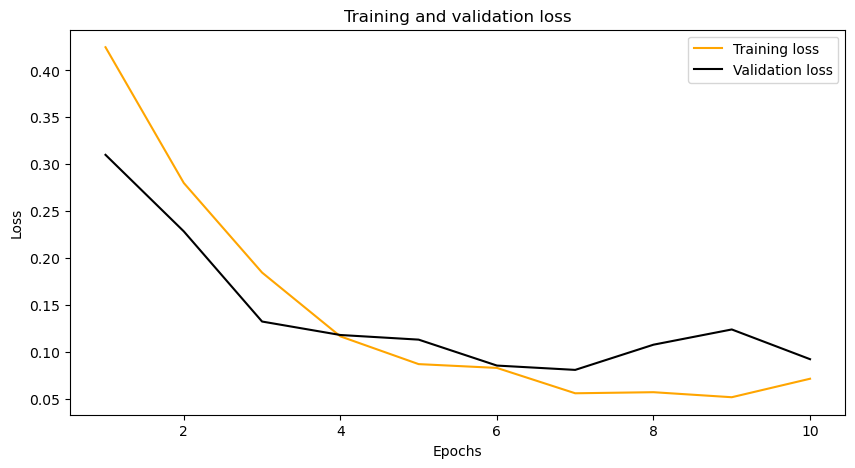

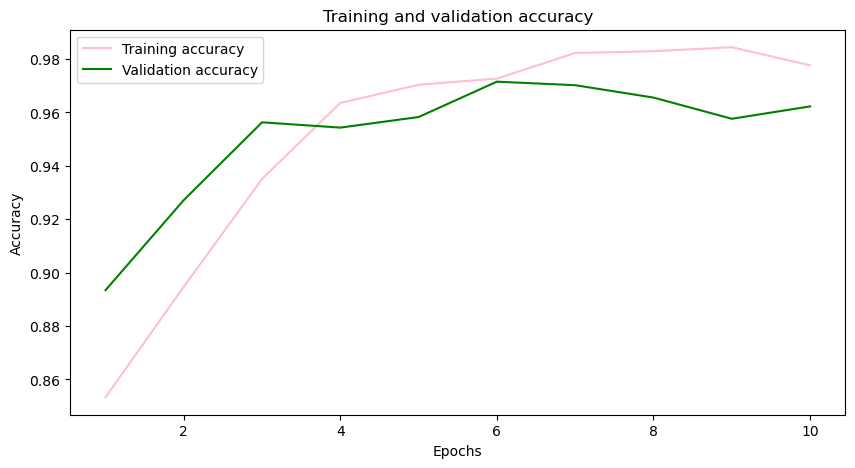

In [70]:
# Extracting training and validation loss and accuracy from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Creating epochs range
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'orange', label='Training loss')
plt.plot(epochs, val_loss, 'black', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_accuracy, 'pink', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [263]:
y_pred_encoded2= model2.predict(X_test)

48/48 [==============================] - 25s 442ms/step


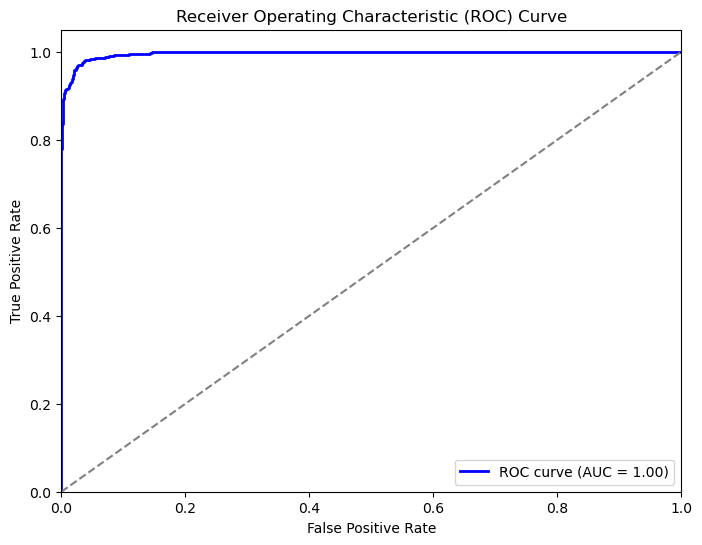

In [264]:
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred_encoded2)
roc_auc = roc_auc_score(y_test_binary, y_pred_encoded2)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

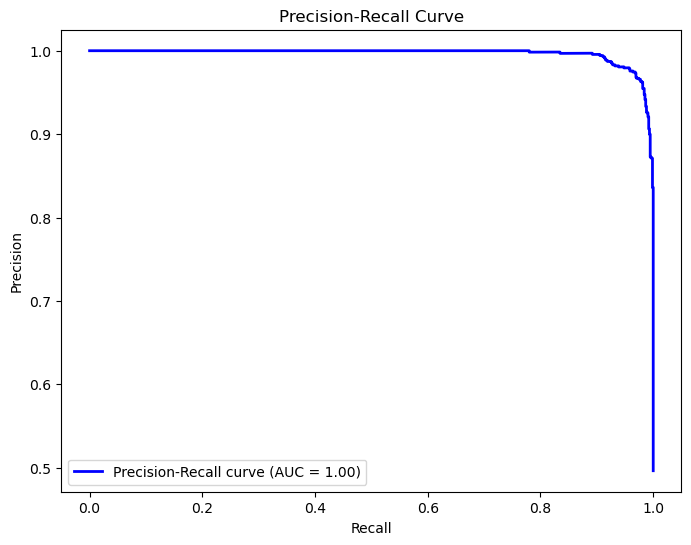

In [265]:
precision, recall, _ = precision_recall_curve(y_test_binary, y_pred_encoded2)
pr_auc = auc(recall, precision)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

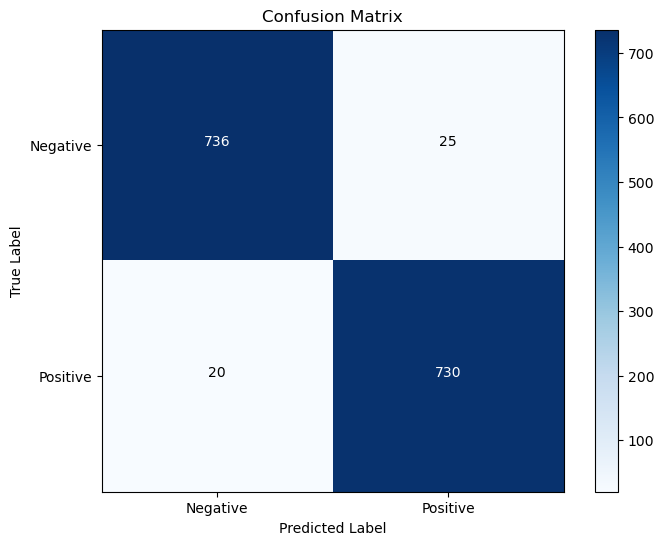

In [267]:
cm = confusion_matrix(y_test_binary, y_pred_encoded2.round())

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])
for i in range(2):
    for j in range(2):
        plt.text(j, i, str(cm[i, j]), horizontalalignment='center', color='white' if cm[i, j] > cm.max() / 2 else 'black')
plt.show()

In [270]:
# Assuming y_pred_encoded and y_test_encoded are arrays containing predictions and ground truth labels
# Compute average precision for the positive class (class 1)
y_pred_positive_class = y_pred_encoded2
y_test_positive_class = y_test_encoded
ap_positive_class = average_precision_score(y_test_positive_class, y_pred_positive_class)

# Compute average precision for the negative class (class 0)
y_pred_negative_class = 1 - y_pred_encoded2  # Assuming class 0 is the negative class
y_test_negative_class = 1 - y_test_encoded  # Inverting binary labels
ap_negative_class = average_precision_score(y_test_negative_class, y_pred_negative_class)

# Print AP for both classes
print("Average Precision (Positive Class):", ap_positive_class)
print("Average Precision (Negative Class):", ap_negative_class)


Average Precision (Positive Class): 0.9965188196617905
Average Precision (Negative Class): 0.9966098928113872


In [271]:
threshold = 0.5  # Adjust the threshold as needed
y_pred_binary = (y_pred_encoded2 > threshold).astype(int)

precision = precision_score(y_test_encoded, y_pred_binary)
recall = recall_score(y_test_encoded, y_pred_binary)
f1 = f1_score(y_test_encoded, y_pred_binary)

average_precision = average_precision_score(y_test_encoded, y_pred_encoded2)

print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Average Precision (AP):", average_precision)


Precision: 0.9668874172185431
Recall: 0.9733333333333334
F1-score: 0.9700996677740864
Average Precision (AP): 0.9965188196617905


In [273]:
precision, recall, thresholds = precision_recall_curve(y_test_encoded, y_pred_encoded2)

auprc = auc(recall, precision)
mAP = auprc

print("Area Under Precision-Recall Curve (AUPRC):", auprc)
print("Mean Average Precision (mAP):", mAP)


Area Under Precision-Recall Curve (AUPRC): 0.9965165092542899
Mean Average Precision (mAP): 0.9965165092542899


3. InceptionV3

In [252]:
from tensorflow.keras.applications import InceptionV3

In [253]:
inceptionV3_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(128, 128, 3))


In [254]:
x = GlobalAveragePooling2D()(inceptionV3_base.output)

x = Dense(256, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)
model4 = Model(inputs=inceptionV3_base.input, outputs=predictions)


In [255]:
model4.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

In [256]:
filepath = r"C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel"
check_point = keras.callbacks.ModelCheckpoint(
    filepath=filepath,
    monitor="val_loss",
    mode="min",
    save_best_only=True,
    verbose=1
)

In [257]:
early_stopping = EarlyStopping(
    monitor='val_loss',          # Monitor validation loss
    patience=5,                  # Number of epochs to wait before stopping
    restore_best_weights=True,   # Restore weights to the best achieved during training
    verbose=1                    # Print messages about early stopping
)

In [258]:
# Define a learning rate schedule function
def learningRate_schedule4(epoch):
    lr4 = 0.001  # Initial learning rate
    if epoch > 10:
        lr4 *= 0.01 
    return lr4

lr4_scheduler = LearningRateScheduler(learningRate_schedule4)

In [259]:
history = model4.fit(
    X_train, y_train_encoded,
    batch_size=32,
    epochs=25,
    verbose=1,
    validation_data=(X_test, y_test_encoded),  
    callbacks=[check_point, early_stopping, lr4_scheduler]
)

Epoch 1/25
189/189 [==============================] - ETA: 0s - loss: 0.1365 - accuracy: 0.9540
Epoch 1: val_loss improved from inf to 0.27794, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 260s 1s/step - loss: 0.1365 - accuracy: 0.9540 - val_loss: 0.2779 - val_accuracy: 0.9702 - lr: 0.0010
Epoch 2/25
189/189 [==============================] - ETA: 0s - loss: 0.0687 - accuracy: 0.9768
Epoch 2: val_loss improved from 0.27794 to 0.19182, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 260s 1s/step - loss: 0.0687 - accuracy: 0.9768 - val_loss: 0.1918 - val_accuracy: 0.9411 - lr: 0.0010
Epoch 3/25
189/189 [==============================] - ETA: 0s - loss: 0.0525 - accuracy: 0.9806
Epoch 3: val_loss improved from 0.19182 to 0.09165, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 240s 1s/step - loss: 0.0525 - accuracy: 0.9806 - val_loss: 0.0917 - val_accuracy: 0.9702 - lr: 0.0010
Epoch 4/25
189/189 [==============================] - ETA: 0s - loss: 0.0331 - accuracy: 0.9904
Epoch 4: val_loss improved from 0.09165 to 0.04899, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 177s 939ms/step - loss: 0.0331 - accuracy: 0.9904 - val_loss: 0.0490 - val_accuracy: 0.9815 - lr: 0.0010
Epoch 5/25
189/189 [==============================] - ETA: 0s - loss: 0.0810 - accuracy: 0.9725
Epoch 5: val_loss did not improve from 0.04899
189/189 [==============================] - 183s 969ms/step - loss: 0.0810 - accuracy: 0.9725 - val_loss: 0.1273 - val_accuracy: 0.9504 - lr: 0.0010
Epoch 6/25
189/189 [==============================] - ETA: 0s - loss: 0.0248 - accuracy: 0.9919
Epoch 6: val_loss did not improve from 0.04899
189/189 [==============================] - 185s 977ms/step - loss: 0.0248 - accuracy: 0.9919 - val_loss: 0.0882 - val_accuracy: 0.9722 - lr: 0.0010
Epoch 7/25
189/189 [==============================] - ETA: 0s - loss: 0.0189 - accuracy: 0.9929
Epoch 7: val_loss did not improve from 0.04899
189/189 [==============================] - 186s 983ms/step - loss: 0.0189 - accuracy: 0.9929 - val_loss: 0.1656 - val_accuracy:

INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 217s 1s/step - loss: 0.0155 - accuracy: 0.9957 - val_loss: 0.0380 - val_accuracy: 0.9874 - lr: 0.0010
Epoch 9/25
189/189 [==============================] - ETA: 0s - loss: 0.0280 - accuracy: 0.9901
Epoch 9: val_loss improved from 0.03803 to 0.03701, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 220s 1s/step - loss: 0.0280 - accuracy: 0.9901 - val_loss: 0.0370 - val_accuracy: 0.9874 - lr: 0.0010
Epoch 10/25
189/189 [==============================] - ETA: 0s - loss: 0.0133 - accuracy: 0.9962
Epoch 10: val_loss did not improve from 0.03701
189/189 [==============================] - 185s 978ms/step - loss: 0.0133 - accuracy: 0.9962 - val_loss: 0.0485 - val_accuracy: 0.9801 - lr: 0.0010
Epoch 11/25
189/189 [==============================] - ETA: 0s - loss: 0.0164 - accuracy: 0.9942
Epoch 11: val_loss did not improve from 0.03701
189/189 [==============================] - 185s 978ms/step - loss: 0.0164 - accuracy: 0.9942 - val_loss: 0.1848 - val_accuracy: 0.9656 - lr: 0.0010
Epoch 12/25
189/189 [==============================] - ETA: 0s - loss: 0.0067 - accuracy: 0.9982
Epoch 12: val_loss improved from 0.03701 to 0.03244, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets

INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 225s 1s/step - loss: 0.0067 - accuracy: 0.9982 - val_loss: 0.0324 - val_accuracy: 0.9901 - lr: 1.0000e-04
Epoch 13/25
189/189 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 0.9997
Epoch 13: val_loss improved from 0.03244 to 0.03084, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 222s 1s/step - loss: 0.0018 - accuracy: 0.9997 - val_loss: 0.0308 - val_accuracy: 0.9907 - lr: 1.0000e-04
Epoch 14/25
189/189 [==============================] - ETA: 0s - loss: 6.3779e-04 - accuracy: 1.0000
Epoch 14: val_loss did not improve from 0.03084
189/189 [==============================] - 185s 978ms/step - loss: 6.3779e-04 - accuracy: 1.0000 - val_loss: 0.0322 - val_accuracy: 0.9901 - lr: 1.0000e-04
Epoch 15/25
189/189 [==============================] - ETA: 0s - loss: 0.0011 - accuracy: 0.9997
Epoch 15: val_loss improved from 0.03084 to 0.02961, saving model to C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel
INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


INFO:tensorflow:Assets written to: C:\Users\ruten\OneDrive\Desktop\ARTIFICIAL NEURAL NETWORKS\InceptionV3_bestModel\assets


189/189 [==============================] - 223s 1s/step - loss: 0.0011 - accuracy: 0.9997 - val_loss: 0.0296 - val_accuracy: 0.9927 - lr: 1.0000e-04
Epoch 16/25
189/189 [==============================] - ETA: 0s - loss: 3.2184e-04 - accuracy: 1.0000
Epoch 16: val_loss did not improve from 0.02961
189/189 [==============================] - 183s 969ms/step - loss: 3.2184e-04 - accuracy: 1.0000 - val_loss: 0.0309 - val_accuracy: 0.9921 - lr: 1.0000e-04
Epoch 17/25
189/189 [==============================] - ETA: 0s - loss: 1.8323e-04 - accuracy: 1.0000
Epoch 17: val_loss did not improve from 0.02961
189/189 [==============================] - 183s 970ms/step - loss: 1.8323e-04 - accuracy: 1.0000 - val_loss: 0.0326 - val_accuracy: 0.9921 - lr: 1.0000e-04
Epoch 18/25
189/189 [==============================] - ETA: 0s - loss: 1.5340e-04 - accuracy: 1.0000
Epoch 18: val_loss did not improve from 0.02961
189/189 [==============================] - 188s 993ms/step - loss: 1.5340e-04 - accuracy: 1.

In [260]:
model4.evaluate(X_test, y_test_encoded)

48/48 [==============================] - 8s 164ms/step - loss: 0.0296 - accuracy: 0.9927


[0.02960852161049843, 0.9927200675010681]

In [261]:
model4.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 63, 63, 32)           864       ['input_7[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 63, 63, 32)           96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 63, 63, 32)           0         ['batch_normalization_9

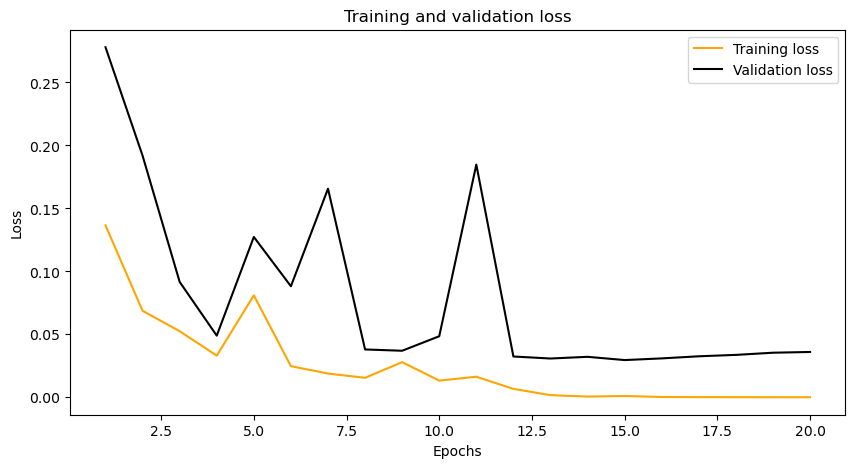

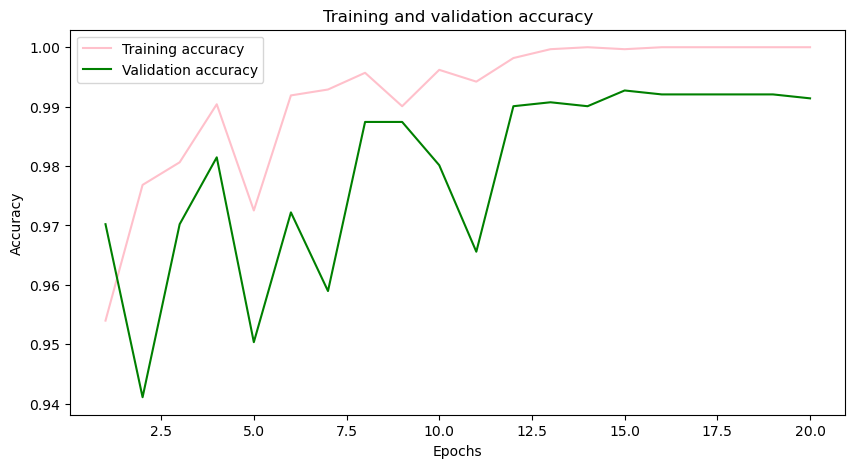

In [262]:
# Extracting training and validation loss and accuracy from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Creating epochs range
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'orange', label='Training loss')
plt.plot(epochs, val_loss, 'black', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_accuracy, 'pink', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [274]:
y_pred_encoded4 = model4.predict(X_test)

48/48 [==============================] - 11s 161ms/step


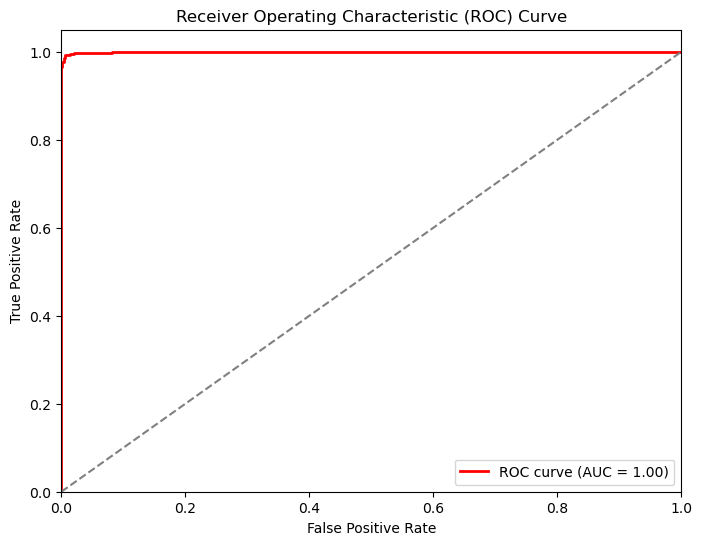

In [282]:
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred_encoded4)
roc_auc = roc_auc_score(y_test_binary, y_pred_encoded4)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

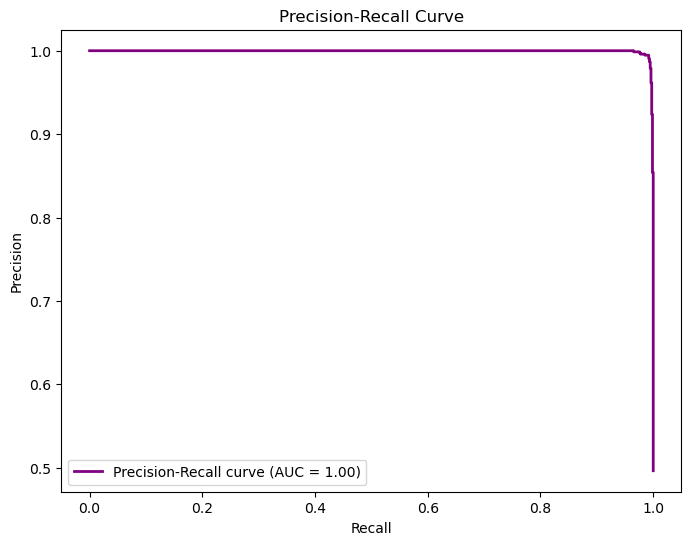

In [283]:
precision, recall, _ = precision_recall_curve(y_test_binary, y_pred_encoded4)
pr_auc = auc(recall, precision)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='purple', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

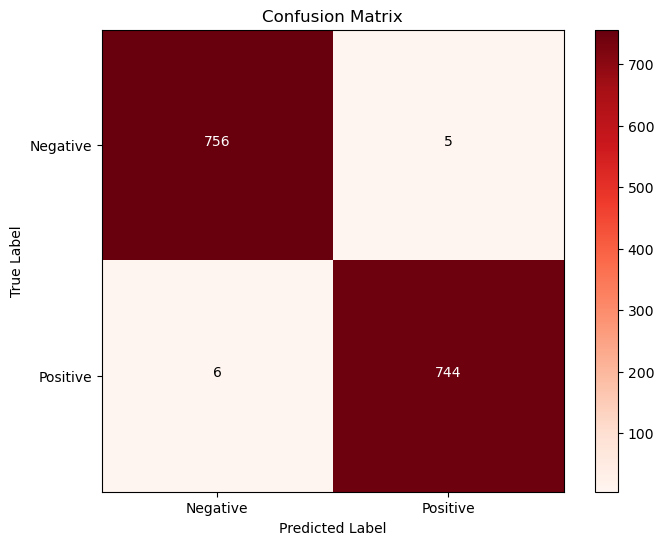

In [278]:
cm = confusion_matrix(y_test_binary, y_pred_encoded4.round())

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])
for i in range(2):
    for j in range(2):
        plt.text(j, i, str(cm[i, j]), horizontalalignment='center', color='white' if cm[i, j] > cm.max() / 2 else 'black')
plt.show()

In [279]:
# Assuming y_pred_encoded and y_test_encoded are arrays containing predictions and ground truth labels
# Compute average precision for the positive class (class 1)
y_pred_positive_class = y_pred_encoded4
y_test_positive_class = y_test_encoded
ap_positive_class = average_precision_score(y_test_positive_class, y_pred_positive_class)

# Compute average precision for the negative class (class 0)
y_pred_negative_class = 1 - y_pred_encoded4  # Assuming class 0 is the negative class
y_test_negative_class = 1 - y_test_encoded  # Inverting binary labels
ap_negative_class = average_precision_score(y_test_negative_class, y_pred_negative_class)

# Print AP for both classes
print("Average Precision (Positive Class):", ap_positive_class)
print("Average Precision (Negative Class):", ap_negative_class)


Average Precision (Positive Class): 0.9995078143239703
Average Precision (Negative Class): 0.999457948317142


In [280]:
# Assuming you have computed y_pred_encoded (predicted labels) and y_test_encoded (true labels)

# Threshold the predictions to get binary labels (0 or 1)
threshold = 0.5  # Adjust the threshold as needed
y_pred_binary = (y_pred_encoded4 > threshold).astype(int)

# Compute precision, recall, and F1-score
precision = precision_score(y_test_encoded, y_pred_binary)
recall = recall_score(y_test_encoded, y_pred_binary)
f1 = f1_score(y_test_encoded, y_pred_binary)

# Compute average precision (AP)
average_precision = average_precision_score(y_test_encoded, y_pred_encoded4)

# Print the computed metrics
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Average Precision (AP):", average_precision)


Precision: 0.9933244325767691
Recall: 0.992
F1-score: 0.9926617745163442
Average Precision (AP): 0.9995078143239703


In [284]:
precision, recall, thresholds = precision_recall_curve(y_test_encoded, y_pred_encoded4)
auprc = auc(recall, precision)
mAP = auprc
print("Area Under Precision-Recall Curve (AUPRC):", auprc)
print("Mean Average Precision (mAP):", mAP)


Area Under Precision-Recall Curve (AUPRC): 0.9995075107352496
Mean Average Precision (mAP): 0.9995075107352496


# MULTI-LAYER PERCEPTRON

1. RMSprop OPTIMISER

In [296]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD

In [340]:
mlp_model = Sequential([
    Flatten(input_shape=(128, 128, 3)),
    Dense(256, activation='relu'),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [341]:
mlp_model.compile(optimizer=RMSprop(learning_rate=0.01),loss='binary_crossentropy', metrics=['accuracy'])

In [342]:
early_stopping = EarlyStopping(
    monitor='val_loss',         
    patience=5,                  
    restore_best_weights=True,   
    verbose=1                    
)

In [343]:
history = mlp_model.fit(
    X_train, y_train_encoded,
    batch_size=20,
    epochs=25,
    verbose=1,
    validation_data=(X_test, y_test_encoded),  
    callbacks=[early_stopping]
)

Epoch 1/25
303/303 [==============================] - 26s 66ms/step - loss: 3944.3965 - accuracy: 0.5065 - val_loss: 0.6928 - val_accuracy: 0.4964
Epoch 2/25
303/303 [==============================] - 19s 61ms/step - loss: 27.3188 - accuracy: 0.5033 - val_loss: 0.6934 - val_accuracy: 0.4957
Epoch 3/25
303/303 [==============================] - 18s 61ms/step - loss: 0.6934 - accuracy: 0.4985 - val_loss: 0.6934 - val_accuracy: 0.4957
Epoch 4/25
303/303 [==============================] - 23s 75ms/step - loss: 0.6934 - accuracy: 0.5065 - val_loss: 0.6936 - val_accuracy: 0.4957
Epoch 5/25
303/303 [==============================] - 18s 61ms/step - loss: 0.6930 - accuracy: 0.5104 - val_loss: 0.6945 - val_accuracy: 0.4957
Epoch 6/25
303/303 [==============================] - 19s 64ms/step - loss: 0.6935 - accuracy: 0.5035 - val_loss: 0.6935 - val_accuracy: 0.4957
Epoch 6: early stopping


In [344]:
mlp_model.evaluate(X_test, y_test_encoded)

48/48 [==============================] - 1s 18ms/step - loss: 0.6928 - accuracy: 0.4964


[0.6927813291549683, 0.49636003375053406]

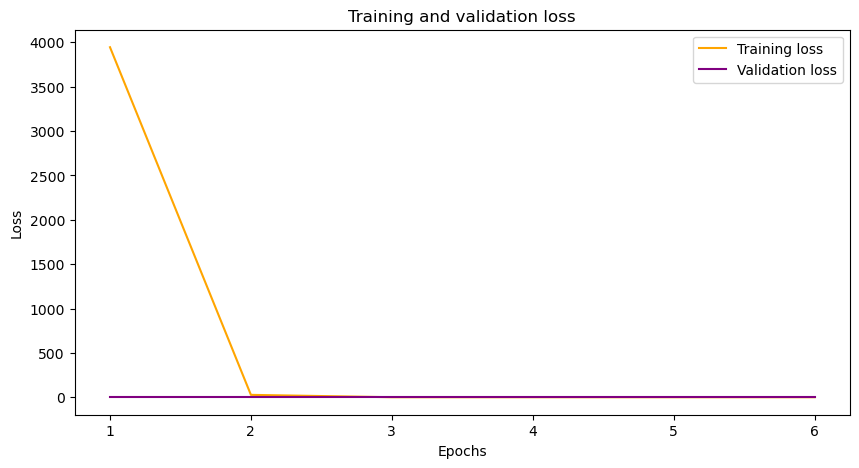

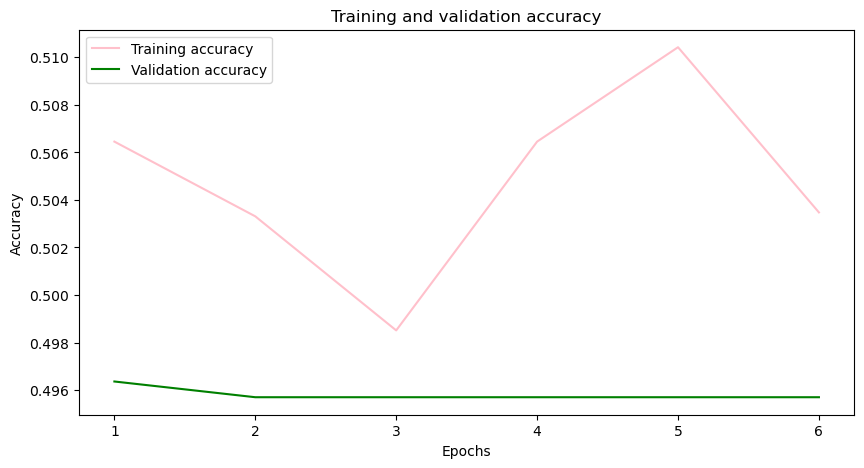

In [351]:
# Extracting training and validation loss and accuracy from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Creating epochs range
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'orange', label='Training loss')
plt.plot(epochs, val_loss, 'purple', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_accuracy, 'pink', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [352]:
y_pred_encoded5 = mlp_model.predict(X_test)

48/48 [==============================] - 1s 11ms/step


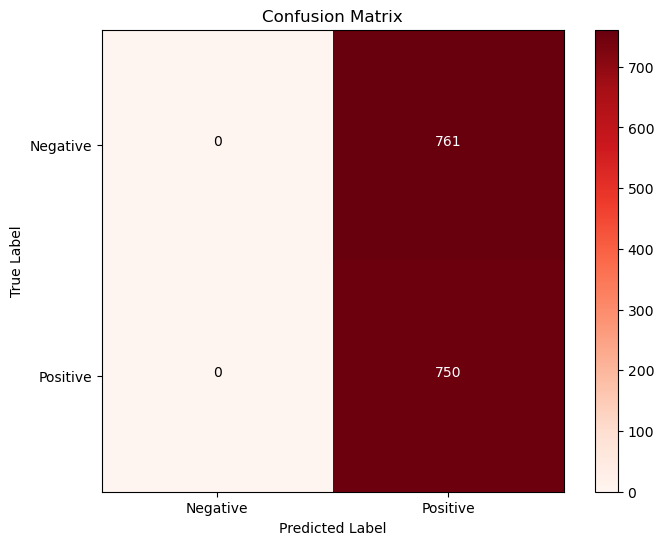

In [353]:
cm = confusion_matrix(y_test_binary, y_pred_encoded5.round())

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Reds)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])
for i in range(2):
    for j in range(2):
        plt.text(j, i, str(cm[i, j]), horizontalalignment='center', color='white' if cm[i, j] > cm.max() / 2 else 'black')
plt.show()

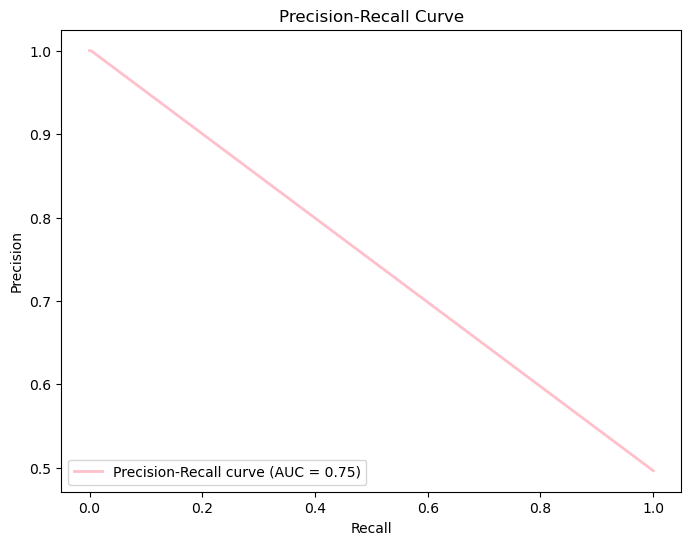

In [354]:
precision, recall, _ = precision_recall_curve(y_test_binary, y_pred_encoded5)
pr_auc = auc(recall, precision)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='pink', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

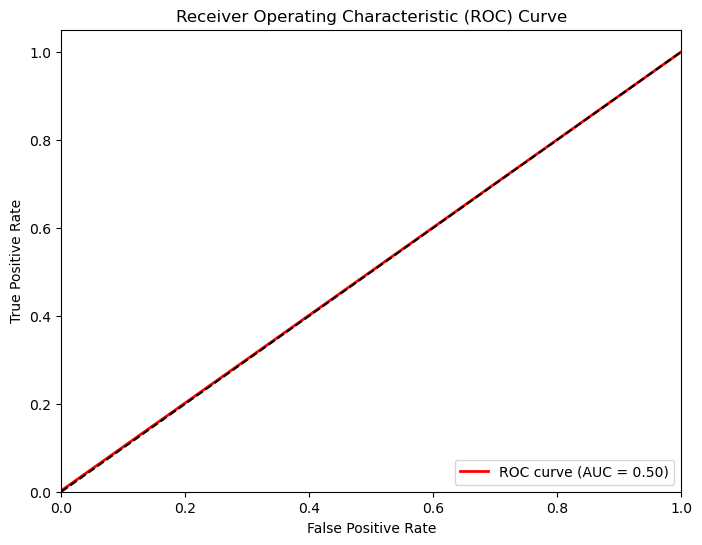

In [356]:
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred_encoded5)
roc_auc = roc_auc_score(y_test_binary, y_pred_encoded5)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [357]:
threshold = 0.5  # Adjust the threshold as needed
y_pred_binary = (y_pred_encoded5 > threshold).astype(int)

precision = precision_score(y_test_encoded, y_pred_binary)
recall = recall_score(y_test_encoded, y_pred_binary)
f1 = f1_score(y_test_encoded, y_pred_binary)

average_precision = average_precision_score(y_test_encoded, y_pred_encoded5)

print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Average Precision (AP):", average_precision)


Precision: 0.49636002647253474
Recall: 1.0
F1-score: 0.6634232640424591
Average Precision (AP): 0.49770306640194134


In [358]:
precision, recall, thresholds = precision_recall_curve(y_test_encoded, y_pred_encoded5)
auprc = auc(recall, precision)
mAP = auprc
print("Area Under Precision-Recall Curve (AUPRC):", auprc)
print("Mean Average Precision (mAP):", mAP)


Area Under Precision-Recall Curve (AUPRC): 0.7488515332009705
Mean Average Precision (mAP): 0.7488515332009705


In [334]:
history = mlp_model.fit(
    X_train, y_train_encoded,
    batch_size=50,
    epochs=25,
    verbose=1,
    validation_data=(X_test, y_test_encoded),  
    callbacks=[early_stopping]
)

Epoch 1/25
121/121 [==============================] - 8s 69ms/step - loss: nan - accuracy: 0.4906 - val_loss: nan - val_accuracy: 0.5036
Epoch 2/25
121/121 [==============================] - 8s 64ms/step - loss: nan - accuracy: 0.4906 - val_loss: nan - val_accuracy: 0.5036
Epoch 3/25
121/121 [==============================] - 8s 63ms/step - loss: nan - accuracy: 0.4906 - val_loss: nan - val_accuracy: 0.5036
Epoch 4/25
121/121 [==============================] - 8s 64ms/step - loss: nan - accuracy: 0.4906 - val_loss: nan - val_accuracy: 0.5036
Epoch 5/25
121/121 [==============================] - 8s 65ms/step - loss: nan - accuracy: 0.4906 - val_loss: nan - val_accuracy: 0.5036
Epoch 5: early stopping


2. ADAM OPTIMISER

In [359]:
mlp_model2 = Sequential([
    Flatten(input_shape=(128, 128, 3)),
    Dense(256, activation='relu'),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

In [360]:
from tensorflow.keras.optimizers import RMSprop
mlp_model2.compile(optimizer= Adam(learning_rate=0.01),loss='binary_crossentropy', metrics=['accuracy'])

In [361]:
early_stopping = EarlyStopping(
    monitor='val_loss',         
    patience=5,                  
    restore_best_weights=True,   
    verbose=1                    
)

In [362]:
history = mlp_model2.fit(
    X_train, y_train_encoded,
    batch_size=25,
    epochs=25,
    verbose=1,
    validation_data=(X_test, y_test_encoded),  
    callbacks=[early_stopping]
)

Epoch 1/25
242/242 [==============================] - 25s 80ms/step - loss: 861.3773 - accuracy: 0.5730 - val_loss: 0.6018 - val_accuracy: 0.7022
Epoch 2/25
242/242 [==============================] - 18s 74ms/step - loss: 0.6273 - accuracy: 0.7420 - val_loss: 0.5924 - val_accuracy: 0.7710
Epoch 3/25
242/242 [==============================] - 18s 74ms/step - loss: 0.5273 - accuracy: 0.7951 - val_loss: 0.7021 - val_accuracy: 0.7055
Epoch 4/25
242/242 [==============================] - 19s 79ms/step - loss: 0.4330 - accuracy: 0.8143 - val_loss: 0.6025 - val_accuracy: 0.7895
Epoch 5/25
242/242 [==============================] - 18s 75ms/step - loss: 1.8212 - accuracy: 0.6933 - val_loss: 0.9047 - val_accuracy: 0.6592
Epoch 6/25
242/242 [==============================] - 21s 86ms/step - loss: 0.6385 - accuracy: 0.7575 - val_loss: 3.0771 - val_accuracy: 0.5235
Epoch 7/25
242/242 [==============================] - 21s 86ms/step - loss: 0.4964 - accuracy: 0.7966 - val_loss: 0.3377 - val_accurac

In [364]:
mlp_model2.evaluate(X_test, y_test_encoded)

48/48 [==============================] - 1s 12ms/step - loss: 0.3377 - accuracy: 0.8749


[0.337708979845047, 0.8749172687530518]

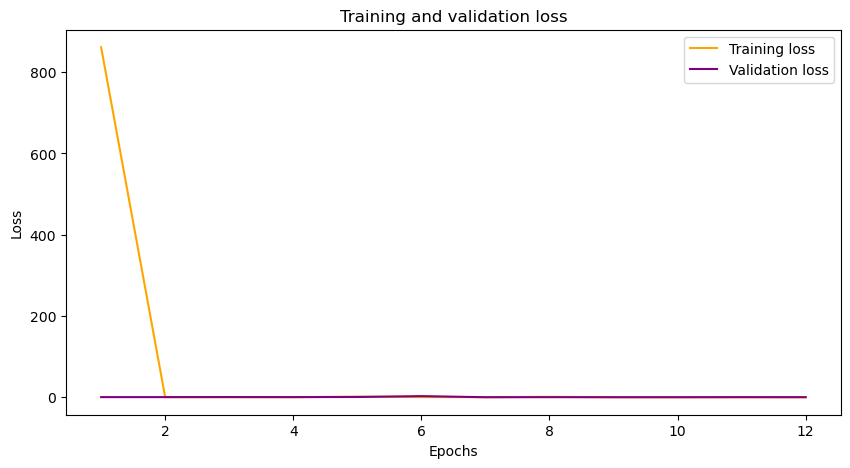

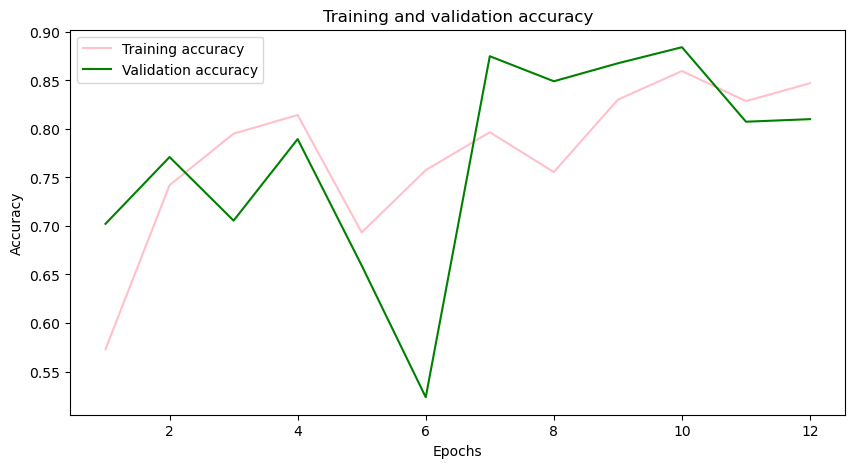

In [365]:
# Extracting training and validation loss and accuracy from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Creating epochs range
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_loss, 'orange', label='Training loss')
plt.plot(epochs, val_loss, 'purple', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_accuracy, 'pink', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'green', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [366]:
y_pred_encoded6 = mlp_model2.predict(X_test)

48/48 [==============================] - 1s 13ms/step


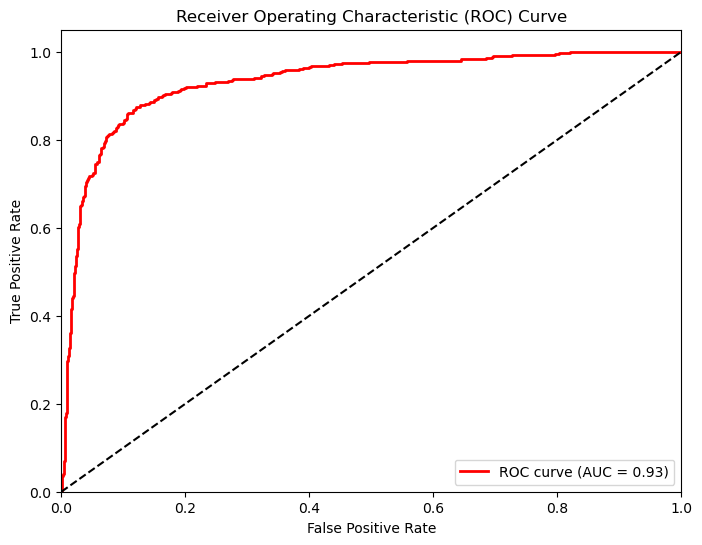

In [367]:
fpr, tpr, thresholds = roc_curve(y_test_binary, y_pred_encoded6)
roc_auc = roc_auc_score(y_test_binary, y_pred_encoded6)
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

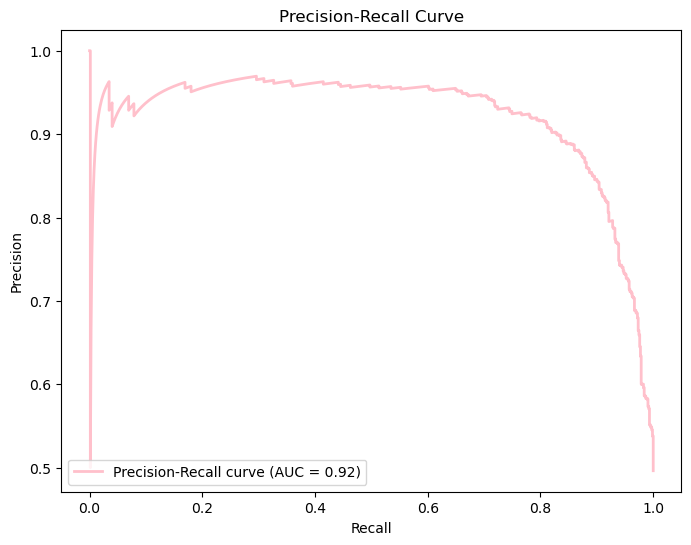

In [368]:
precision, recall, _ = precision_recall_curve(y_test_binary, y_pred_encoded6)
pr_auc = auc(recall, precision)

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='pink', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % pr_auc)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

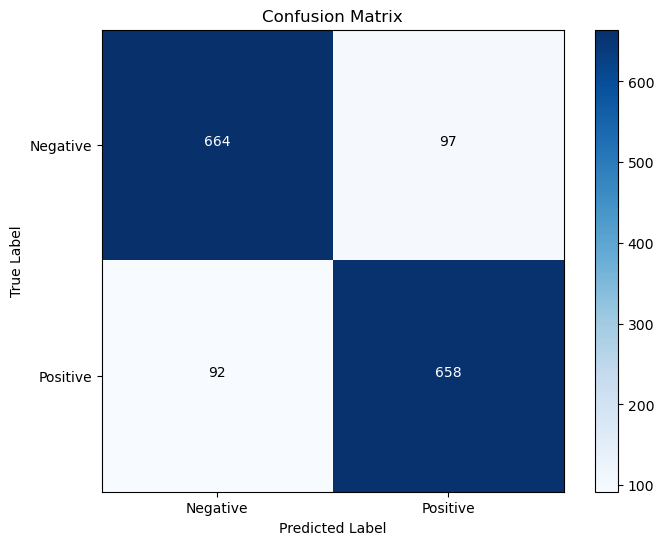

In [369]:
cm = confusion_matrix(y_test_binary, y_pred_encoded6.round())

# Plot confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks([0, 1], ['Negative', 'Positive'])
plt.yticks([0, 1], ['Negative', 'Positive'])
for i in range(2):
    for j in range(2):
        plt.text(j, i, str(cm[i, j]), horizontalalignment='center', color='white' if cm[i, j] > cm.max() / 2 else 'black')
plt.show()

In [370]:
threshold = 0.5  # Adjust the threshold as needed
y_pred_binary = (y_pred_encoded6 > threshold).astype(int)

precision = precision_score(y_test_encoded, y_pred_binary)
recall = recall_score(y_test_encoded, y_pred_binary)
f1 = f1_score(y_test_encoded, y_pred_binary)

average_precision = average_precision_score(y_test_encoded, y_pred_encoded6)

print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Average Precision (AP):", average_precision)


Precision: 0.871523178807947
Recall: 0.8773333333333333
F1-score: 0.8744186046511628
Average Precision (AP): 0.9201398621699266


In [371]:
precision, recall, thresholds = precision_recall_curve(y_test_encoded, y_pred_encoded5)
auprc = auc(recall, precision)
mAP = auprc
print("Area Under Precision-Recall Curve (AUPRC):", auprc)
print("Mean Average Precision (mAP):", mAP)


Area Under Precision-Recall Curve (AUPRC): 0.7488515332009705
Mean Average Precision (mAP): 0.7488515332009705


In [335]:
history = mlp_model2.fit(
    X_train, y_train_encoded,
    batch_size=10,
    epochs=25,
    verbose=1,
    validation_data=(X_test, y_test_encoded),  
    callbacks=[early_stopping]
)

Epoch 1/25
605/605 [==============================] - 45s 73ms/step - loss: 0.9936 - accuracy: 0.5018 - val_loss: 0.6932 - val_accuracy: 0.4964
Epoch 2/25
605/605 [==============================] - 41s 68ms/step - loss: 0.6939 - accuracy: 0.4985 - val_loss: 0.6934 - val_accuracy: 0.4964
Epoch 3/25
605/605 [==============================] - 41s 68ms/step - loss: 0.6934 - accuracy: 0.5031 - val_loss: 0.6938 - val_accuracy: 0.4964
Epoch 4/25
605/605 [==============================] - 41s 68ms/step - loss: 0.6935 - accuracy: 0.4988 - val_loss: 0.6942 - val_accuracy: 0.4964
Epoch 5/25
605/605 [==============================] - 43s 72ms/step - loss: 0.6933 - accuracy: 0.5104 - val_loss: 0.6931 - val_accuracy: 0.5036
Epoch 6/25
605/605 [==============================] - 41s 67ms/step - loss: 0.6932 - accuracy: 0.5111 - val_loss: 0.6933 - val_accuracy: 0.4964
Epoch 7/25
605/605 [==============================] - 43s 71ms/step - loss: 0.6936 - accuracy: 0.4975 - val_loss: 0.6931 - val_accuracy:

In [336]:
mlp_model2.evaluate(X_test, y_test_encoded)

48/48 [==============================] - 1s 21ms/step - loss: 0.6931 - accuracy: 0.5036


[0.6931208372116089, 0.5036399960517883]